In [5]:
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import kerastuner as kt
from sklearn.model_selection import train_test_split

def plot_curve(epochs, hist, list_of_metrics,name):
    """Plot a curve of one or more classification metrics vs. epoch."""  
    plt.figure()
    plt.xlabel("Epoch "+name)
    plt.ylabel("Value")

    for m in list_of_metrics:
        x = hist[m]
        plt.plot(epochs[1:], x[1:], label=m)
    plt.legend()
    
    
# for activation functions check https://keras.io/api/layers/activations/
def create_model2(my_learning_rate,layers, my_feature_layer,my_metrics,my_act_function = "softmax"):
    model = tf.keras.models.Sequential()
    model.add(my_feature_layer)

    for layer in layers:
        model.add(tf.keras.layers.Dense(units = layer, activation = my_act_function))
    model.add(tf.keras.layers.Dense(units=1,name='Output', activation = 'relu'))                             
    model.compile(optimizer=tf.keras.optimizers.SGD(lr=my_learning_rate,momentum=0.2),                                       
                loss=tf.keras.losses.MeanAbsoluteError(),
                metrics=my_metrics)
    return model

def create_model_optimizer(hp):
    model = tf.keras.models.Sequential()
    
    
    hp_layers=hp.Int('number_layers', min_value = 2, max_value = 9, step = 1)
    hp_units=[]

    for i in range(hp_layers):
        hp_units.append(hp.Int(str('units'+str(i)), min_value = 5, max_value = 55, step = 5))
        model.add(tf.keras.layers.Dense(units = hp_units[-1], activation = 'relu'))
        
        
        
    hp_lr=hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
    hp_momentum=hp.Choice('momentum', values=[1e-2, 1e-1, 2e-1,5e-1])

    model.add(tf.keras.layers.Dense(units=1,name='Output', activation = 'relu'))                             
    model.compile(optimizer=tf.keras.optimizers.SGD(lr=hp_lr,momentum=0.2),                                       
                loss=tf.keras.losses.MeanAbsoluteError(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])
    return model


def train_model_tuner(model, x,y, epochs, label_name,
                batch_size=None,shuffle=True):
    
    history = model.fit(x=x, y=y, batch_size=batch_size,
                      epochs=epochs, shuffle=shuffle,validation_split=0.2)
  
    epochs = history.epoch
    hist = pd.DataFrame(history.history)
    return epochs, hist

def train_model(model, dataset, epochs, label_name,
                batch_size=None,shuffle=True):
    features = {name:np.array(value) for name, value in dataset.items()}
    label=dataset[label_name].to_numpy()
    history = model.fit(x=features, y=label, batch_size=batch_size,
                      epochs=epochs, shuffle=shuffle,validation_split=0.2)
  
    epochs = history.epoch
    hist = pd.DataFrame(history.history)
    return epochs, hist
    
    
#returns dataframe
def test_model(model,dataset,label_name):
    features = {name:np.array(value) for name, value in dataset.items()}
    label=dataset[label_name].to_numpy()
    print(label)
    evaluation=model.evaluate(x = features, y = label, batch_size=batch_size)
    predicted = model.predict(features)
    
    df_test=pd.DataFrame(label,columns=[label_name])

    df_predict=pd.DataFrame(predicted,columns=[label_name+"_pred"])
    return pd.concat([df_test,df_predict], axis=1)


def test_model_tuner(model,x,y,label_name):
    
    evaluation=model.evaluate(x = x, y = y, batch_size=batch_size)
    print(evaluation)
    predicted = model.predict(x)
    
    df_test=pd.DataFrame(y,columns=[label_name])

    df_predict=pd.DataFrame(predicted,columns=[label_name+"_pred"])
    return pd.concat([df_test,df_predict], axis=1)









In [6]:
#G:\OneDrive - bwedu\Master\Forschungspraktikum\Inga\pc-forschi\generated_Data
df_lambda=pd.read_csv("G:\OneDrive - bwedu\Master\Forschungspraktikum\Inga\pc-forschi\generated_Data\lambda_100_steps.csv")[["lambda","main_maximum"]]
df_delta=pd.read_csv("G:\OneDrive - bwedu\Master\Forschungspraktikum\Inga\pc-forschi\generated_Data\delta_100_steps.csv")[["delta","main_maximum"]]


lambda_train, lambda_test = train_test_split(df_lambda, test_size=0.20, random_state=42)
delta_train, delta_test = train_test_split(df_delta, test_size=0.20, random_state=42)

df_lambda.head()

,lambda,main_maximum
0,0.103030,0.040
1,0.101515,0.052
2,0.100000,0.064
3,0.104545,0.028
4,0.106061,0.018


In [7]:
feature_columns_A = []
no_of_max = tf.feature_column.numeric_column("main_maximum")
feature_columns_A.append(no_of_max)
my_feature_layer_A = tf.keras.layers.DenseFeatures(feature_columns_A)

In [12]:
learning_rate = 1e-2
epochs = 600
batch_size = 50

#specify the classification threshold
classification_threshold = 0.15

# Establish the metrics the model will measure.
metric = [tf.keras.metrics.MeanAbsoluteError()]
layers=[10,12,8]


label_delta="delta"
label_lambda="lambda"


my_model_lambda = create_model2(learning_rate,layers, my_feature_layer_A,metric,my_act_function="relu")
my_model_delta = create_model2(learning_rate,layers, my_feature_layer_A,metric,my_act_function="relu")

#lambda_train, lambda_test
#delta_train, delta_test

epochs_lambda, hist_lambda = train_model(my_model_lambda, lambda_train, epochs, 
                          label_lambda, batch_size)

epochs_delta, hist_delta = train_model(my_model_delta, delta_train, epochs, 
                          label_delta, batch_size)

Epoch 1/600
2/2 [==============================] - ETA: 0s - loss: 0.1758 - mean_absolute_error: 0.175 - 0s 33ms/step - loss: 0.1678 - mean_absolute_error: 0.1678 - val_loss: 0.1313 - val_mean_absolute_error: 0.1313
Epoch 2/600
2/2 [==============================] - ETA: 0s - loss: 0.1322 - mean_absolute_error: 0.132 - 0s 10ms/step - loss: 0.1239 - mean_absolute_error: 0.1239 - val_loss: 0.0841 - val_mean_absolute_error: 0.0841
Epoch 3/600
2/2 [==============================] - ETA: 0s - loss: 0.0862 - mean_absolute_error: 0.086 - 0s 10ms/step - loss: 0.0761 - mean_absolute_error: 0.0761 - val_loss: 0.0417 - val_mean_absolute_error: 0.0417
Epoch 4/600
2/2 [==============================] - ETA: 0s - loss: 0.0347 - mean_absolute_error: 0.034 - 0s 10ms/step - loss: 0.0339 - mean_absolute_error: 0.0339 - val_loss: 0.0302 - val_mean_absolute_error: 0.0302
Epoch 5/600
2/2 [==============================] - ETA: 0s - loss: 0.0235 - mean_absolute_error: 0.023 - 0s 10ms/step - loss: 0.0232 - m

Epoch 39/600
2/2 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 10ms/step - loss: 0.0072 - mean_absolute_error: 0.0072 - val_loss: 0.0077 - val_mean_absolute_error: 0.0077
Epoch 40/600
2/2 [==============================] - ETA: 0s - loss: 0.0074 - mean_absolute_error: 0.007 - 0s 10ms/step - loss: 0.0073 - mean_absolute_error: 0.0073 - val_loss: 0.0075 - val_mean_absolute_error: 0.0075
Epoch 41/600
2/2 [==============================] - ETA: 0s - loss: 0.0073 - mean_absolute_error: 0.007 - 0s 10ms/step - loss: 0.0074 - mean_absolute_error: 0.0074 - val_loss: 0.0074 - val_mean_absolute_error: 0.0074
Epoch 42/600
2/2 [==============================] - ETA: 0s - loss: 0.0072 - mean_absolute_error: 0.007 - 0s 10ms/step - loss: 0.0072 - mean_absolute_error: 0.0072 - val_loss: 0.0073 - val_mean_absolute_error: 0.0073
Epoch 43/600
2/2 [==============================] - ETA: 0s - loss: 0.0072 - mean_absolute_error: 0.007 - 0s 12ms/step - loss: 0.007

Epoch 77/600
2/2 [==============================] - ETA: 0s - loss: 0.0075 - mean_absolute_error: 0.007 - 0s 9ms/step - loss: 0.0075 - mean_absolute_error: 0.0075 - val_loss: 0.0078 - val_mean_absolute_error: 0.0078
Epoch 78/600
2/2 [==============================] - ETA: 0s - loss: 0.0072 - mean_absolute_error: 0.007 - 0s 10ms/step - loss: 0.0071 - mean_absolute_error: 0.0071 - val_loss: 0.0075 - val_mean_absolute_error: 0.0075
Epoch 79/600
2/2 [==============================] - ETA: 0s - loss: 0.0070 - mean_absolute_error: 0.007 - 0s 11ms/step - loss: 0.0070 - mean_absolute_error: 0.0070 - val_loss: 0.0073 - val_mean_absolute_error: 0.0073
Epoch 80/600
2/2 [==============================] - ETA: 0s - loss: 0.0070 - mean_absolute_error: 0.007 - 0s 10ms/step - loss: 0.0073 - mean_absolute_error: 0.0073 - val_loss: 0.0074 - val_mean_absolute_error: 0.0074
Epoch 81/600
2/2 [==============================] - ETA: 0s - loss: 0.0072 - mean_absolute_error: 0.007 - 0s 10ms/step - loss: 0.0074

Epoch 115/600
2/2 [==============================] - ETA: 0s - loss: 0.0083 - mean_absolute_error: 0.008 - 0s 12ms/step - loss: 0.0082 - mean_absolute_error: 0.0082 - val_loss: 0.0084 - val_mean_absolute_error: 0.0084
Epoch 116/600
2/2 [==============================] - ETA: 0s - loss: 0.0082 - mean_absolute_error: 0.008 - 0s 10ms/step - loss: 0.0079 - mean_absolute_error: 0.0079 - val_loss: 0.0087 - val_mean_absolute_error: 0.0087
Epoch 117/600
2/2 [==============================] - ETA: 0s - loss: 0.0089 - mean_absolute_error: 0.008 - 0s 10ms/step - loss: 0.0088 - mean_absolute_error: 0.0088 - val_loss: 0.0093 - val_mean_absolute_error: 0.0093
Epoch 118/600
2/2 [==============================] - ETA: 0s - loss: 0.0089 - mean_absolute_error: 0.008 - 0s 10ms/step - loss: 0.0080 - mean_absolute_error: 0.0080 - val_loss: 0.0093 - val_mean_absolute_error: 0.0093
Epoch 119/600
2/2 [==============================] - ETA: 0s - loss: 0.0092 - mean_absolute_error: 0.009 - 0s 10ms/step - loss: 

Epoch 153/600
2/2 [==============================] - ETA: 0s - loss: 0.0057 - mean_absolute_error: 0.005 - 0s 9ms/step - loss: 0.0055 - mean_absolute_error: 0.0055 - val_loss: 0.0109 - val_mean_absolute_error: 0.0109
Epoch 154/600
2/2 [==============================] - ETA: 0s - loss: 0.0102 - mean_absolute_error: 0.010 - 0s 10ms/step - loss: 0.0085 - mean_absolute_error: 0.0085 - val_loss: 0.0089 - val_mean_absolute_error: 0.0089
Epoch 155/600
2/2 [==============================] - ETA: 0s - loss: 0.0087 - mean_absolute_error: 0.008 - 0s 10ms/step - loss: 0.0086 - mean_absolute_error: 0.0086 - val_loss: 0.0068 - val_mean_absolute_error: 0.0068
Epoch 156/600
2/2 [==============================] - ETA: 0s - loss: 0.0060 - mean_absolute_error: 0.006 - 0s 10ms/step - loss: 0.0065 - mean_absolute_error: 0.0065 - val_loss: 0.0068 - val_mean_absolute_error: 0.0068
Epoch 157/600
2/2 [==============================] - ETA: 0s - loss: 0.0063 - mean_absolute_error: 0.006 - 0s 11ms/step - loss: 0

Epoch 191/600
2/2 [==============================] - ETA: 0s - loss: 0.0078 - mean_absolute_error: 0.007 - 0s 10ms/step - loss: 0.0078 - mean_absolute_error: 0.0078 - val_loss: 0.0077 - val_mean_absolute_error: 0.0077
Epoch 192/600
2/2 [==============================] - ETA: 0s - loss: 0.0074 - mean_absolute_error: 0.007 - 0s 10ms/step - loss: 0.0075 - mean_absolute_error: 0.0075 - val_loss: 0.0074 - val_mean_absolute_error: 0.0074
Epoch 193/600
2/2 [==============================] - ETA: 0s - loss: 0.0067 - mean_absolute_error: 0.006 - 0s 11ms/step - loss: 0.0067 - mean_absolute_error: 0.0067 - val_loss: 0.0078 - val_mean_absolute_error: 0.0078
Epoch 194/600
2/2 [==============================] - ETA: 0s - loss: 0.0072 - mean_absolute_error: 0.007 - 0s 9ms/step - loss: 0.0070 - mean_absolute_error: 0.0070 - val_loss: 0.0082 - val_mean_absolute_error: 0.0082
Epoch 195/600
2/2 [==============================] - ETA: 0s - loss: 0.0074 - mean_absolute_error: 0.007 - 0s 10ms/step - loss: 0

Epoch 229/600
2/2 [==============================] - ETA: 0s - loss: 0.0085 - mean_absolute_error: 0.008 - 0s 10ms/step - loss: 0.0080 - mean_absolute_error: 0.0080 - val_loss: 0.0082 - val_mean_absolute_error: 0.0082
Epoch 230/600
2/2 [==============================] - ETA: 0s - loss: 0.0085 - mean_absolute_error: 0.008 - 0s 10ms/step - loss: 0.0079 - mean_absolute_error: 0.0079 - val_loss: 0.0082 - val_mean_absolute_error: 0.0082
Epoch 231/600
2/2 [==============================] - ETA: 0s - loss: 0.0084 - mean_absolute_error: 0.008 - 0s 10ms/step - loss: 0.0078 - mean_absolute_error: 0.0078 - val_loss: 0.0085 - val_mean_absolute_error: 0.0085
Epoch 232/600
2/2 [==============================] - ETA: 0s - loss: 0.0088 - mean_absolute_error: 0.008 - 0s 12ms/step - loss: 0.0081 - mean_absolute_error: 0.0081 - val_loss: 0.0083 - val_mean_absolute_error: 0.0083
Epoch 233/600
2/2 [==============================] - ETA: 0s - loss: 0.0084 - mean_absolute_error: 0.008 - 0s 10ms/step - loss: 

Epoch 267/600
2/2 [==============================] - ETA: 0s - loss: 0.0055 - mean_absolute_error: 0.005 - 0s 10ms/step - loss: 0.0066 - mean_absolute_error: 0.0066 - val_loss: 0.0047 - val_mean_absolute_error: 0.0047
Epoch 268/600
2/2 [==============================] - ETA: 0s - loss: 0.0032 - mean_absolute_error: 0.003 - 0s 12ms/step - loss: 0.0048 - mean_absolute_error: 0.0048 - val_loss: 0.0048 - val_mean_absolute_error: 0.0048
Epoch 269/600
2/2 [==============================] - ETA: 0s - loss: 0.0039 - mean_absolute_error: 0.003 - 0s 10ms/step - loss: 0.0057 - mean_absolute_error: 0.0057 - val_loss: 0.0043 - val_mean_absolute_error: 0.0043
Epoch 270/600
2/2 [==============================] - ETA: 0s - loss: 0.0031 - mean_absolute_error: 0.003 - 0s 10ms/step - loss: 0.0045 - mean_absolute_error: 0.0045 - val_loss: 0.0053 - val_mean_absolute_error: 0.0053
Epoch 271/600
2/2 [==============================] - ETA: 0s - loss: 0.0045 - mean_absolute_error: 0.004 - 0s 10ms/step - loss: 

Epoch 305/600
2/2 [==============================] - ETA: 0s - loss: 0.0048 - mean_absolute_error: 0.004 - 0s 10ms/step - loss: 0.0057 - mean_absolute_error: 0.0057 - val_loss: 0.0055 - val_mean_absolute_error: 0.0055
Epoch 306/600
2/2 [==============================] - ETA: 0s - loss: 0.0048 - mean_absolute_error: 0.004 - 0s 10ms/step - loss: 0.0058 - mean_absolute_error: 0.0058 - val_loss: 0.0055 - val_mean_absolute_error: 0.0055
Epoch 307/600
2/2 [==============================] - ETA: 0s - loss: 0.0050 - mean_absolute_error: 0.005 - 0s 10ms/step - loss: 0.0061 - mean_absolute_error: 0.0061 - val_loss: 0.0053 - val_mean_absolute_error: 0.0053
Epoch 308/600
2/2 [==============================] - ETA: 0s - loss: 0.0048 - mean_absolute_error: 0.004 - 0s 10ms/step - loss: 0.0059 - mean_absolute_error: 0.0059 - val_loss: 0.0049 - val_mean_absolute_error: 0.0049
Epoch 309/600
2/2 [==============================] - ETA: 0s - loss: 0.0046 - mean_absolute_error: 0.004 - 0s 10ms/step - loss: 

Epoch 343/600
2/2 [==============================] - ETA: 0s - loss: 0.0040 - mean_absolute_error: 0.004 - 0s 10ms/step - loss: 0.0051 - mean_absolute_error: 0.0051 - val_loss: 0.0048 - val_mean_absolute_error: 0.0048
Epoch 344/600
2/2 [==============================] - ETA: 0s - loss: 0.0046 - mean_absolute_error: 0.004 - 0s 10ms/step - loss: 0.0056 - mean_absolute_error: 0.0056 - val_loss: 0.0046 - val_mean_absolute_error: 0.0046
Epoch 345/600
2/2 [==============================] - ETA: 0s - loss: 0.0045 - mean_absolute_error: 0.004 - 0s 10ms/step - loss: 0.0056 - mean_absolute_error: 0.0056 - val_loss: 0.0048 - val_mean_absolute_error: 0.0048
Epoch 346/600
2/2 [==============================] - ETA: 0s - loss: 0.0044 - mean_absolute_error: 0.004 - 0s 11ms/step - loss: 0.0054 - mean_absolute_error: 0.0054 - val_loss: 0.0054 - val_mean_absolute_error: 0.0054
Epoch 347/600
2/2 [==============================] - ETA: 0s - loss: 0.0056 - mean_absolute_error: 0.005 - 0s 10ms/step - loss: 

Epoch 381/600
2/2 [==============================] - ETA: 0s - loss: 0.0057 - mean_absolute_error: 0.005 - 0s 13ms/step - loss: 0.0061 - mean_absolute_error: 0.0061 - val_loss: 0.0062 - val_mean_absolute_error: 0.0062
Epoch 382/600
2/2 [==============================] - ETA: 0s - loss: 0.0064 - mean_absolute_error: 0.006 - 0s 11ms/step - loss: 0.0068 - mean_absolute_error: 0.0068 - val_loss: 0.0060 - val_mean_absolute_error: 0.0060
Epoch 383/600
2/2 [==============================] - ETA: 0s - loss: 0.0061 - mean_absolute_error: 0.006 - 0s 11ms/step - loss: 0.0066 - mean_absolute_error: 0.0066 - val_loss: 0.0060 - val_mean_absolute_error: 0.0060
Epoch 384/600
2/2 [==============================] - ETA: 0s - loss: 0.0058 - mean_absolute_error: 0.005 - 0s 12ms/step - loss: 0.0060 - mean_absolute_error: 0.0060 - val_loss: 0.0066 - val_mean_absolute_error: 0.0066
Epoch 385/600
2/2 [==============================] - ETA: 0s - loss: 0.0067 - mean_absolute_error: 0.006 - 0s 12ms/step - loss: 

Epoch 419/600
2/2 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 10ms/step - loss: 0.0074 - mean_absolute_error: 0.0074 - val_loss: 0.0076 - val_mean_absolute_error: 0.0076
Epoch 420/600
2/2 [==============================] - ETA: 0s - loss: 0.0079 - mean_absolute_error: 0.007 - 0s 9ms/step - loss: 0.0074 - mean_absolute_error: 0.0074 - val_loss: 0.0075 - val_mean_absolute_error: 0.0075
Epoch 421/600
2/2 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 9ms/step - loss: 0.0074 - mean_absolute_error: 0.0074 - val_loss: 0.0076 - val_mean_absolute_error: 0.0076
Epoch 422/600
2/2 [==============================] - ETA: 0s - loss: 0.0080 - mean_absolute_error: 0.008 - 0s 11ms/step - loss: 0.0077 - mean_absolute_error: 0.0077 - val_loss: 0.0075 - val_mean_absolute_error: 0.0075
Epoch 423/600
2/2 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 10ms/step - loss: 0.

Epoch 457/600
2/2 [==============================] - ETA: 0s - loss: 0.0053 - mean_absolute_error: 0.005 - 0s 10ms/step - loss: 0.0063 - mean_absolute_error: 0.0063 - val_loss: 0.0055 - val_mean_absolute_error: 0.0055
Epoch 458/600
2/2 [==============================] - ETA: 0s - loss: 0.0046 - mean_absolute_error: 0.004 - 0s 12ms/step - loss: 0.0054 - mean_absolute_error: 0.0054 - val_loss: 0.0056 - val_mean_absolute_error: 0.0056
Epoch 459/600
2/2 [==============================] - ETA: 0s - loss: 0.0048 - mean_absolute_error: 0.004 - 0s 10ms/step - loss: 0.0057 - mean_absolute_error: 0.0057 - val_loss: 0.0056 - val_mean_absolute_error: 0.0056
Epoch 460/600
2/2 [==============================] - ETA: 0s - loss: 0.0051 - mean_absolute_error: 0.005 - 0s 10ms/step - loss: 0.0061 - mean_absolute_error: 0.0061 - val_loss: 0.0051 - val_mean_absolute_error: 0.0051
Epoch 461/600
2/2 [==============================] - ETA: 0s - loss: 0.0046 - mean_absolute_error: 0.004 - 0s 10ms/step - loss: 

Epoch 495/600
2/2 [==============================] - ETA: 0s - loss: 0.0044 - mean_absolute_error: 0.004 - 0s 11ms/step - loss: 0.0054 - mean_absolute_error: 0.0054 - val_loss: 0.0044 - val_mean_absolute_error: 0.0044
Epoch 496/600
2/2 [==============================] - ETA: 0s - loss: 0.0045 - mean_absolute_error: 0.004 - 0s 11ms/step - loss: 0.0054 - mean_absolute_error: 0.0054 - val_loss: 0.0049 - val_mean_absolute_error: 0.0049
Epoch 497/600
2/2 [==============================] - ETA: 0s - loss: 0.0049 - mean_absolute_error: 0.004 - 0s 10ms/step - loss: 0.0056 - mean_absolute_error: 0.0056 - val_loss: 0.0048 - val_mean_absolute_error: 0.0048
Epoch 498/600
2/2 [==============================] - ETA: 0s - loss: 0.0049 - mean_absolute_error: 0.004 - 0s 13ms/step - loss: 0.0056 - mean_absolute_error: 0.0056 - val_loss: 0.0048 - val_mean_absolute_error: 0.0048
Epoch 499/600
2/2 [==============================] - ETA: 0s - loss: 0.0050 - mean_absolute_error: 0.005 - 0s 12ms/step - loss: 

Epoch 533/600
2/2 [==============================] - ETA: 0s - loss: 0.0059 - mean_absolute_error: 0.005 - 0s 11ms/step - loss: 0.0063 - mean_absolute_error: 0.0063 - val_loss: 0.0051 - val_mean_absolute_error: 0.0051
Epoch 534/600
2/2 [==============================] - ETA: 0s - loss: 0.0057 - mean_absolute_error: 0.005 - 0s 10ms/step - loss: 0.0063 - mean_absolute_error: 0.0063 - val_loss: 0.0048 - val_mean_absolute_error: 0.0048
Epoch 535/600
2/2 [==============================] - ETA: 0s - loss: 0.0053 - mean_absolute_error: 0.005 - 0s 11ms/step - loss: 0.0060 - mean_absolute_error: 0.0060 - val_loss: 0.0048 - val_mean_absolute_error: 0.0048
Epoch 536/600
2/2 [==============================] - ETA: 0s - loss: 0.0053 - mean_absolute_error: 0.005 - 0s 10ms/step - loss: 0.0061 - mean_absolute_error: 0.0061 - val_loss: 0.0049 - val_mean_absolute_error: 0.0049
Epoch 537/600
2/2 [==============================] - ETA: 0s - loss: 0.0053 - mean_absolute_error: 0.005 - 0s 11ms/step - loss: 

Epoch 571/600
2/2 [==============================] - ETA: 0s - loss: 0.0042 - mean_absolute_error: 0.004 - 0s 11ms/step - loss: 0.0055 - mean_absolute_error: 0.0055 - val_loss: 0.0038 - val_mean_absolute_error: 0.0038
Epoch 572/600
2/2 [==============================] - ETA: 0s - loss: 0.0044 - mean_absolute_error: 0.004 - 0s 13ms/step - loss: 0.0055 - mean_absolute_error: 0.0055 - val_loss: 0.0039 - val_mean_absolute_error: 0.0039
Epoch 573/600
2/2 [==============================] - ETA: 0s - loss: 0.0046 - mean_absolute_error: 0.004 - 0s 10ms/step - loss: 0.0057 - mean_absolute_error: 0.0057 - val_loss: 0.0042 - val_mean_absolute_error: 0.0042
Epoch 574/600
2/2 [==============================] - ETA: 0s - loss: 0.0048 - mean_absolute_error: 0.004 - 0s 11ms/step - loss: 0.0056 - mean_absolute_error: 0.0056 - val_loss: 0.0042 - val_mean_absolute_error: 0.0042
Epoch 575/600
2/2 [==============================] - ETA: 0s - loss: 0.0049 - mean_absolute_error: 0.004 - 0s 11ms/step - loss: 

Epoch 9/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 10/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 11/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 12/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 13/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301

Epoch 47/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 48/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 49/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 21ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 50/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 51/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 22ms/step - loss: 0.430

Epoch 85/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 21ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 86/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 87/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 23ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 88/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 89/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.430

Epoch 123/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 124/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 25ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 125/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 126/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 127/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 

Epoch 161/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 23ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 162/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 163/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 21ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 164/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 165/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 21ms/step - loss: 

Epoch 199/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 200/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 201/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 202/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 203/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 

Epoch 237/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 238/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 239/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 21ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 240/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 241/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 

Epoch 275/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 276/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 277/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 278/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 279/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 

Epoch 313/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 314/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 315/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 316/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 317/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 23ms/step - loss: 

Epoch 351/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 21ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 352/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 353/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 24ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 354/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 355/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 

Epoch 389/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 390/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 23ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 391/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 392/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 393/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 

Epoch 427/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 428/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 21ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 429/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 430/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 431/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 

Epoch 465/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 466/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 467/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 468/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 21ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 469/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 

Epoch 503/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 21ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 504/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 505/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 506/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 507/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 

Epoch 541/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 542/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 543/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 544/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 545/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 24ms/step - loss: 

Epoch 579/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 21ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 580/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 581/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 22ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 582/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 19ms/step - loss: 0.4301 - mean_absolute_error: 0.4301 - val_loss: 0.4104 - val_mean_absolute_error: 0.4104
Epoch 583/600
1/1 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 20ms/step - loss: 

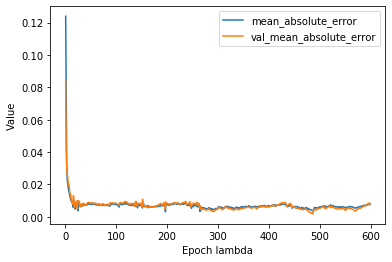

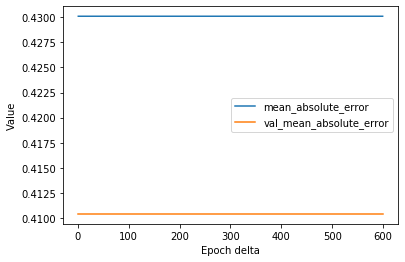

In [13]:
# Plot a graph of the metric(s) vs. epochs.
#list_of_metrics_to_plot = ['accuracy'] 
#print(hist_delta.head())
list_of_metrics_to_plot = ['mean_absolute_error',"val_mean_absolute_error"] 
plot_curve(epochs_lambda, hist_lambda, list_of_metrics_to_plot,"lambda")
plot_curve(epochs_delta, hist_delta, list_of_metrics_to_plot,"delta")

In [14]:
delta_test_result=test_model(my_model_delta,delta_test,label_delta)
delta_test_result.head(50)

[0.32808081 0.48969697 0.34626263 0.3240404  0.4169697  0.49171717
 0.40686869 0.34020202 0.50181818 0.49575758 0.41090909 0.43313131
 0.45333333 0.38868687 0.33212121]
1/1 [==============================] - ETA: 0s - loss: 0.4106 - mean_absolute_error: 0.410 - 0s 1ms/step - loss: 0.4106 - mean_absolute_error: 0.4106


,delta,delta_pred
0,0.328081,0.0
1,0.489697,0.0
2,0.346263,0.0
3,0.324040,0.0
4,0.416970,0.0
5,0.491717,0.0
6,0.406869,0.0
7,0.340202,0.0
8,0.501818,0.0
9,0.495758,0.0


In [11]:
lablda_test_result=test_model(my_model_lambda,lambda_test,label_lambda)
lablda_test_result.head(50)

[0.22575758 0.18030303 0.21060606 0.17424242 0.16515152 0.15757576
 0.13636364 0.22424242 0.11818182 0.1030303  0.12272727 0.14848485
 0.20606061 0.15       0.23636364 0.10606061 0.21969697 0.21818182
 0.12121212 0.1469697 ]
1/1 [==============================] - ETA: 0s - loss: 0.0341 - mean_absolute_error: 0.034 - 0s 2ms/step - loss: 0.0341 - mean_absolute_error: 0.0341


,lambda,lambda_pred
0,0.225758,0.261644
1,0.180303,0.178690
2,0.210606,0.233993
3,0.174242,0.167304
4,0.165152,0.150497
5,0.157576,0.136400
6,0.136364,0.095736
7,0.224242,0.258933
8,0.118182,0.062594
9,0.103030,0.041196


In [15]:
MAX_TRIALS = 20

EXECUTIONS_PER_TRIAL = 3

tuner_lambda = kt.RandomSearch(

    create_model_optimizer,

    objective='val_mean_absolute_error',

    max_trials=MAX_TRIALS,

    executions_per_trial=EXECUTIONS_PER_TRIAL,

    directory='lambda_100_model_main_max',
    #overwrite = True,
    project_name='first Try',

    seed=1

)
x_train_lambda=lambda_train["main_maximum"].to_numpy()
y_train_lambda=lambda_train["lambda"].to_numpy()
x_test_lambda=lambda_test["main_maximum"].to_numpy()
y_test_lambda=lambda_test["lambda"].to_numpy()
#lambda_train, lambda_test
#delta_train, delta_test
tuner_lambda.search(x_train_lambda, y_train_lambda, epochs = 200, validation_data = (x_test_lambda, y_test_lambda))


Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1793 - mean_absolute_error: 0.179 - 0s 67ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1795 - mean_absolute_error: 0.179 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1736 - mean_absolute_error: 0.173 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1663 - mean_absolute_error: 0.166 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1747 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.1698 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.1710 - mean_absolute_error: 0.171 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.1812 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.1737 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.1775 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - m

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.1801 - mean_absolute_error: 0.180 - 0s 8ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.1696 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.1881 - mean_absolute_error: 0.188 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.1713 - mean_absolute_error: 0.171 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.1765 - mean_absolute_error: 0.176 - 0s 7ms/step - loss: 0.1766 - m

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.1950 - mean_absolute_error: 0.195 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.1714 - mean_absolute_error: 0.171 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.1820 - mean_absolute_error: 0.182 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.1784 - mean_absolute_error: 0.178 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.1601 - mean_absolute_error: 0.160 - 0s 6ms/step - loss: 0.176

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.1770 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.1791 - mean_absolute_error: 0.179 - 0s 8ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.1750 - mean_absolute_error: 0.175 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.1857 - mean_absolute_error: 0.185 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.1744 - mean_absolute_error: 0.174 - 0s 7ms/step - loss: 0.176

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.1860 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.1777 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.1693 - mean_absolute_error: 0.169 - 0s 8ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.1729 - mean_absolute_error: 0.172 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.1715 - mean_absolute_error: 0.171 - 0s 6ms/step - loss: 0.176

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.1675 - mean_absolute_error: 0.167 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.1846 - mean_absolute_error: 0.184 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.1701 - mean_absolute_error: 0.170 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.1667 - mean_absolute_error: 0.166 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.1785 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.1712 - mean_absolute_error: 0.171 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.1846 - mean_absolute_error: 0.184 - 0s 8ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.1677 - mean_absolute_error: 0.167 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.1861 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.1708 - mean_absolute_error: 0.170 - 0s 6ms/step - loss: 0.1766 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.1922 - mean_absolute_error: 0.192 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.1794 - mean_absolute_error: 0.179 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.1841 - mean_absolute_error: 0.184 - 0s 8ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.1801 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.1849 - mean_absolute_error: 0.184 - 0s 6ms/step - loss: 0.176

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.1727 - mean_absolute_error: 0.172 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.1728 - mean_absolute_error: 0.172 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.1818 - mean_absolute_error: 0.181 - 0s 8ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.1707 - mean_absolute_error: 0.170 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.1696 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.176

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.1765 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.1739 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.1677 - mean_absolute_error: 0.167 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.1706 - mean_absolute_error: 0.170 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.1816 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.176

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.0187 - mean_absolute_error: 0.018 - 0s 57ms/step - loss: 0.0199 - mean_absolute_error: 0.0199 - val_loss: 0.0163 - val_mean_absolute_error: 0.0163
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.0166 - mean_absolute_error: 0.016 - 0s 49ms/step - loss: 0.0170 - mean_absolute_error: 0.0170 - val_loss: 0.0151 - val_mean_absolute_error: 0.0151
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.0154 - mean_absolute_error: 0.015 - 0s 43ms/step - loss: 0.0159 - mean_absolute_error: 0.0159 - val_loss: 0.0142 - val_mean_absolute_error: 0.0142
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.0128 - mean_absolute_error: 0.012 - 0s 68ms/step - loss: 0.0134 - mean_absolute_error: 0.0134 - val_loss: 0.0142 - val_mean_absolute_error: 0.0142
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.0132 - mean_absolute_error: 0.013 - 0s 46ms/step - loss: 0.015

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.0157 - mean_absolute_error: 0.015 - 0s 8ms/step - loss: 0.0084 - mean_absolute_error: 0.0084 - val_loss: 0.0034 - val_mean_absolute_error: 0.0034
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.0039 - mean_absolute_error: 0.003 - 0s 6ms/step - loss: 0.0079 - mean_absolute_error: 0.0079 - val_loss: 0.0035 - val_mean_absolute_error: 0.0035
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.0041 - mean_absolute_error: 0.004 - 0s 6ms/step - loss: 0.0074 - mean_absolute_error: 0.0074 - val_loss: 0.0084 - val_mean_absolute_error: 0.0084
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.0083 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0103 - mean_absolute_error: 0.0103 - val_loss: 0.0070 - val_mean_absolute_error: 0.0070
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.0068 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0090 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.0045 - mean_absolute_error: 0.004 - 0s 6ms/step - loss: 0.0079 - mean_absolute_error: 0.0079 - val_loss: 0.0119 - val_mean_absolute_error: 0.0119
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.0112 - mean_absolute_error: 0.011 - 0s 8ms/step - loss: 0.0088 - mean_absolute_error: 0.0088 - val_loss: 0.0044 - val_mean_absolute_error: 0.0044
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.0040 - mean_absolute_error: 0.004 - 0s 6ms/step - loss: 0.0066 - mean_absolute_error: 0.0066 - val_loss: 0.0083 - val_mean_absolute_error: 0.0083
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.0087 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0098 - mean_absolute_error: 0.0098 - val_loss: 0.0095 - val_mean_absolute_error: 0.0095
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.0089 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0093 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.0139 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.0088 - mean_absolute_error: 0.0088 - val_loss: 0.0110 - val_mean_absolute_error: 0.0110
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.0109 - mean_absolute_error: 0.010 - 0s 8ms/step - loss: 0.0091 - mean_absolute_error: 0.0091 - val_loss: 0.0019 - val_mean_absolute_error: 0.0019
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.0023 - mean_absolute_error: 0.002 - 0s 6ms/step - loss: 0.0067 - mean_absolute_error: 0.0067 - val_loss: 0.0096 - val_mean_absolute_error: 0.0096
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.0091 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0092 - mean_absolute_error: 0.0092 - val_loss: 0.0025 - val_mean_absolute_error: 0.0025
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.0024 - mean_absolute_error: 0.002 - 0s 6ms/step - loss: 0.006

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 7ms/step - loss: 0.0091 - mean_absolute_error: 0.0091 - val_loss: 0.0121 - val_mean_absolute_error: 0.0121
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.0117 - mean_absolute_error: 0.011 - 0s 7ms/step - loss: 0.0091 - mean_absolute_error: 0.0091 - val_loss: 0.0026 - val_mean_absolute_error: 0.0026
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.0023 - mean_absolute_error: 0.002 - 0s 7ms/step - loss: 0.0057 - mean_absolute_error: 0.0057 - val_loss: 0.0027 - val_mean_absolute_error: 0.0027
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.0029 - mean_absolute_error: 0.002 - 0s 8ms/step - loss: 0.0098 - mean_absolute_error: 0.0098 - val_loss: 0.0125 - val_mean_absolute_error: 0.0125
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.0114 - mean_absolute_error: 0.011 - 0s 7ms/step - loss: 0.009

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1813 - mean_absolute_error: 0.181 - 0s 71ms/step - loss: 0.1725 - mean_absolute_error: 0.1725 - val_loss: 0.1600 - val_mean_absolute_error: 0.1600
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1730 - mean_absolute_error: 0.173 - 0s 68ms/step - loss: 0.1660 - mean_absolute_error: 0.1660 - val_loss: 0.1535 - val_mean_absolute_error: 0.1535
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1670 - mean_absolute_error: 0.167 - 0s 57ms/step - loss: 0.1595 - mean_absolute_error: 0.1595 - val_loss: 0.1473 - val_mean_absolute_error: 0.1473
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1498 - mean_absolute_error: 0.149 - 0s 76ms/step - loss: 0.1532 - mean_absolute_error: 0.1532 - val_loss: 0.1411 - val_mean_absolute_error: 0.1411
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1396 - mean_absolute_error: 0.139 - 0s 57ms/step - loss: 0.1471 - m

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.0371 - mean_absolute_error: 0.037 - 0s 7ms/step - loss: 0.0356 - mean_absolute_error: 0.0356 - val_loss: 0.0349 - val_mean_absolute_error: 0.0349
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.0379 - mean_absolute_error: 0.037 - 0s 6ms/step - loss: 0.0355 - mean_absolute_error: 0.0355 - val_loss: 0.0350 - val_mean_absolute_error: 0.0350
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.0370 - mean_absolute_error: 0.037 - 0s 6ms/step - loss: 0.0353 - mean_absolute_error: 0.0353 - val_loss: 0.0351 - val_mean_absolute_error: 0.0351
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.0386 - mean_absolute_error: 0.038 - 0s 6ms/step - loss: 0.0352 - mean_absolute_error: 0.0352 - val_loss: 0.0351 - val_mean_absolute_error: 0.0351
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.0349 - mean_absolute_error: 0.034 - 0s 7ms/step - loss: 0.0352 - m

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.0338 - mean_absolute_error: 0.033 - 0s 9ms/step - loss: 0.0341 - mean_absolute_error: 0.0341 - val_loss: 0.0352 - val_mean_absolute_error: 0.0352
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.0325 - mean_absolute_error: 0.032 - 0s 7ms/step - loss: 0.0340 - mean_absolute_error: 0.0340 - val_loss: 0.0351 - val_mean_absolute_error: 0.0351
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.0345 - mean_absolute_error: 0.034 - 0s 7ms/step - loss: 0.0340 - mean_absolute_error: 0.0340 - val_loss: 0.0350 - val_mean_absolute_error: 0.0350
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.0365 - mean_absolute_error: 0.036 - 0s 7ms/step - loss: 0.0338 - mean_absolute_error: 0.0338 - val_loss: 0.0349 - val_mean_absolute_error: 0.0349
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.0391 - mean_absolute_error: 0.039 - 0s 7ms/step - loss: 0.0338 - m

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.0267 - mean_absolute_error: 0.026 - 0s 54ms/step - loss: 0.0264 - mean_absolute_error: 0.0264 - val_loss: 0.0253 - val_mean_absolute_error: 0.0253
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.0288 - mean_absolute_error: 0.028 - 0s 54ms/step - loss: 0.0256 - mean_absolute_error: 0.0256 - val_loss: 0.0243 - val_mean_absolute_error: 0.0243
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.0263 - mean_absolute_error: 0.026 - 0s 60ms/step - loss: 0.0250 - mean_absolute_error: 0.0250 - val_loss: 0.0238 - val_mean_absolute_error: 0.0238
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.0217 - mean_absolute_error: 0.021 - 0s 43ms/step - loss: 0.0247 - mean_absolute_error: 0.0247 - val_loss: 0.0236 - val_mean_absolute_error: 0.0236
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.0284 - mean_absolute_error: 0.028 - 0s 60ms/step - loss: 

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.0171 - mean_absolute_error: 0.017 - 0s 38ms/step - loss: 0.0176 - mean_absolute_error: 0.0176 - val_loss: 0.0174 - val_mean_absolute_error: 0.0174
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.0152 - mean_absolute_error: 0.015 - 0s 46ms/step - loss: 0.0175 - mean_absolute_error: 0.0175 - val_loss: 0.0173 - val_mean_absolute_error: 0.0173
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.0207 - mean_absolute_error: 0.020 - 0s 66ms/step - loss: 0.0174 - mean_absolute_error: 0.0174 - val_loss: 0.0170 - val_mean_absolute_error: 0.0170
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.0155 - mean_absolute_error: 0.015 - 0s 66ms/step - loss: 0.0172 - mean_absolute_error: 0.0172 - val_loss: 0.0169 - val_mean_absolute_error: 0.0169
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.0199 - mean_absolute_error: 0.019 - 0s 73ms/step - loss: 

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.0121 - mean_absolute_error: 0.012 - 0s 46ms/step - loss: 0.0126 - mean_absolute_error: 0.0126 - val_loss: 0.0121 - val_mean_absolute_error: 0.0121
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.0136 - mean_absolute_error: 0.013 - 0s 62ms/step - loss: 0.0125 - mean_absolute_error: 0.0125 - val_loss: 0.0120 - val_mean_absolute_error: 0.0120
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.0125 - mean_absolute_error: 0.012 - 0s 7ms/step - loss: 0.0124 - mean_absolute_error: 0.0124 - val_loss: 0.0120 - val_mean_absolute_error: 0.0120
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.0129 - mean_absolute_error: 0.012 - 0s 49ms/step - loss: 0.0122 - mean_absolute_error: 0.0122 - val_loss: 0.0118 - val_mean_absolute_error: 0.0118
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.0140 - mean_absolute_error: 0.014 - 0s 49ms/step - loss: 0

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.0524 - mean_absolute_error: 0.052 - 0s 6ms/step - loss: 0.0523 - mean_absolute_error: 0.0523 - val_loss: 0.0451 - val_mean_absolute_error: 0.0451
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.0587 - mean_absolute_error: 0.058 - 0s 6ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0438 - val_mean_absolute_error: 0.0438
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 6ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0426 - val_mean_absolute_error: 0.0426
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.0414 - mean_absolute_error: 0.041 - 0s 6ms/step - loss: 0.0477 - mean_absolute_error: 0.0477 - val_loss: 0.0416 - val_mean_absolute_error: 0.0416
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.0395 - mean_absolute_error: 0.039 - 0s 6ms/step - loss: 0.0465 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.0420 - mean_absolute_error: 0.042 - 0s 7ms/step - loss: 0.0378 - mean_absolute_error: 0.0378 - val_loss: 0.0384 - val_mean_absolute_error: 0.0384
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.0351 - mean_absolute_error: 0.035 - 0s 6ms/step - loss: 0.0378 - mean_absolute_error: 0.0378 - val_loss: 0.0384 - val_mean_absolute_error: 0.0384
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.0342 - mean_absolute_error: 0.034 - 0s 6ms/step - loss: 0.0378 - mean_absolute_error: 0.0378 - val_loss: 0.0384 - val_mean_absolute_error: 0.0384
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.0405 - mean_absolute_error: 0.040 - 0s 7ms/step - loss: 0.0378 - mean_absolute_error: 0.0378 - val_loss: 0.0385 - val_mean_absolute_error: 0.0385
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.0362 - mean_absolute_error: 0.036 - 0s 6ms/step - loss: 0.0378 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.0358 - mean_absolute_error: 0.035 - 0s 6ms/step - loss: 0.0377 - mean_absolute_error: 0.0377 - val_loss: 0.0393 - val_mean_absolute_error: 0.0393
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.0385 - mean_absolute_error: 0.038 - 0s 6ms/step - loss: 0.0377 - mean_absolute_error: 0.0377 - val_loss: 0.0393 - val_mean_absolute_error: 0.0393
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.0336 - mean_absolute_error: 0.033 - 0s 6ms/step - loss: 0.0377 - mean_absolute_error: 0.0377 - val_loss: 0.0393 - val_mean_absolute_error: 0.0393
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.0341 - mean_absolute_error: 0.034 - 0s 7ms/step - loss: 0.0377 - mean_absolute_error: 0.0377 - val_loss: 0.0392 - val_mean_absolute_error: 0.0392
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.0388 - mean_absolute_error: 0.038 - 0s 6ms/step - loss: 0.037

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.0364 - mean_absolute_error: 0.036 - 0s 7ms/step - loss: 0.0376 - mean_absolute_error: 0.0376 - val_loss: 0.0390 - val_mean_absolute_error: 0.0390
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.0406 - mean_absolute_error: 0.040 - 0s 6ms/step - loss: 0.0377 - mean_absolute_error: 0.0377 - val_loss: 0.0390 - val_mean_absolute_error: 0.0390
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.0320 - mean_absolute_error: 0.032 - 0s 7ms/step - loss: 0.0376 - mean_absolute_error: 0.0376 - val_loss: 0.0390 - val_mean_absolute_error: 0.0390
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.0384 - mean_absolute_error: 0.038 - 0s 6ms/step - loss: 0.0376 - mean_absolute_error: 0.0376 - val_loss: 0.0391 - val_mean_absolute_error: 0.0391
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.0378 - mean_absolute_error: 0.037 - 0s 6ms/step - loss: 0.037

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.0429 - mean_absolute_error: 0.042 - 0s 7ms/step - loss: 0.0376 - mean_absolute_error: 0.0376 - val_loss: 0.0393 - val_mean_absolute_error: 0.0393
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.0329 - mean_absolute_error: 0.032 - 0s 6ms/step - loss: 0.0377 - mean_absolute_error: 0.0377 - val_loss: 0.0393 - val_mean_absolute_error: 0.0393
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.0409 - mean_absolute_error: 0.040 - 0s 6ms/step - loss: 0.0377 - mean_absolute_error: 0.0377 - val_loss: 0.0392 - val_mean_absolute_error: 0.0392
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.0391 - mean_absolute_error: 0.039 - 0s 6ms/step - loss: 0.0376 - mean_absolute_error: 0.0376 - val_loss: 0.0392 - val_mean_absolute_error: 0.0392
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.0360 - mean_absolute_error: 0.036 - 0s 6ms/step - loss: 0.037

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.0379 - mean_absolute_error: 0.037 - 0s 6ms/step - loss: 0.0391 - mean_absolute_error: 0.0391 - val_loss: 0.0347 - val_mean_absolute_error: 0.0347
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.0379 - mean_absolute_error: 0.037 - 0s 7ms/step - loss: 0.0379 - mean_absolute_error: 0.0379 - val_loss: 0.0342 - val_mean_absolute_error: 0.0342
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.0405 - mean_absolute_error: 0.040 - 0s 6ms/step - loss: 0.0369 - mean_absolute_error: 0.0369 - val_loss: 0.0341 - val_mean_absolute_error: 0.0341
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.0370 - mean_absolute_error: 0.037 - 0s 6ms/step - loss: 0.0362 - mean_absolute_error: 0.0362 - val_loss: 0.0340 - val_mean_absolute_error: 0.0340
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.0350 - mean_absolute_error: 0.035 - 0s 6ms/step - loss: 0.0356 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.0316 - mean_absolute_error: 0.031 - 0s 6ms/step - loss: 0.0334 - mean_absolute_error: 0.0334 - val_loss: 0.0347 - val_mean_absolute_error: 0.0347
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.0352 - mean_absolute_error: 0.035 - 0s 7ms/step - loss: 0.0333 - mean_absolute_error: 0.0333 - val_loss: 0.0348 - val_mean_absolute_error: 0.0348
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.0325 - mean_absolute_error: 0.032 - 0s 6ms/step - loss: 0.0334 - mean_absolute_error: 0.0334 - val_loss: 0.0349 - val_mean_absolute_error: 0.0349
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.0345 - mean_absolute_error: 0.034 - 0s 6ms/step - loss: 0.0334 - mean_absolute_error: 0.0334 - val_loss: 0.0350 - val_mean_absolute_error: 0.0350
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.0277 - mean_absolute_error: 0.027 - 0s 6ms/step - loss: 0.0334 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.0332 - mean_absolute_error: 0.033 - 0s 7ms/step - loss: 0.0332 - mean_absolute_error: 0.0332 - val_loss: 0.0342 - val_mean_absolute_error: 0.0342
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.0380 - mean_absolute_error: 0.038 - 0s 7ms/step - loss: 0.0331 - mean_absolute_error: 0.0331 - val_loss: 0.0342 - val_mean_absolute_error: 0.0342
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.0353 - mean_absolute_error: 0.035 - 0s 7ms/step - loss: 0.0331 - mean_absolute_error: 0.0331 - val_loss: 0.0343 - val_mean_absolute_error: 0.0343
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.0322 - mean_absolute_error: 0.032 - 0s 6ms/step - loss: 0.0331 - mean_absolute_error: 0.0331 - val_loss: 0.0344 - val_mean_absolute_error: 0.0344
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.0385 - mean_absolute_error: 0.038 - 0s 7ms/step - loss: 0.0331 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.0334 - mean_absolute_error: 0.033 - 0s 8ms/step - loss: 0.0327 - mean_absolute_error: 0.0327 - val_loss: 0.0338 - val_mean_absolute_error: 0.0338
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.0289 - mean_absolute_error: 0.028 - 0s 6ms/step - loss: 0.0327 - mean_absolute_error: 0.0327 - val_loss: 0.0339 - val_mean_absolute_error: 0.0339
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.0366 - mean_absolute_error: 0.036 - 0s 6ms/step - loss: 0.0327 - mean_absolute_error: 0.0327 - val_loss: 0.0339 - val_mean_absolute_error: 0.0339
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.0315 - mean_absolute_error: 0.031 - 0s 6ms/step - loss: 0.0327 - mean_absolute_error: 0.0327 - val_loss: 0.0339 - val_mean_absolute_error: 0.0339
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.0359 - mean_absolute_error: 0.035 - 0s 6ms/step - loss: 0.032

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.0340 - mean_absolute_error: 0.034 - 0s 8ms/step - loss: 0.0324 - mean_absolute_error: 0.0324 - val_loss: 0.0336 - val_mean_absolute_error: 0.0336
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.0289 - mean_absolute_error: 0.028 - 0s 7ms/step - loss: 0.0322 - mean_absolute_error: 0.0322 - val_loss: 0.0336 - val_mean_absolute_error: 0.0336
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.0324 - mean_absolute_error: 0.032 - 0s 6ms/step - loss: 0.0323 - mean_absolute_error: 0.0323 - val_loss: 0.0334 - val_mean_absolute_error: 0.0334
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.0283 - mean_absolute_error: 0.028 - 0s 6ms/step - loss: 0.0322 - mean_absolute_error: 0.0322 - val_loss: 0.0334 - val_mean_absolute_error: 0.0334
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.0286 - mean_absolute_error: 0.028 - 0s 6ms/step - loss: 0.032

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1354 - mean_absolute_error: 0.135 - 0s 63ms/step - loss: 0.1090 - mean_absolute_error: 0.1090 - val_loss: 0.0161 - val_mean_absolute_error: 0.0161
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.0200 - mean_absolute_error: 0.020 - 0s 57ms/step - loss: 0.0206 - mean_absolute_error: 0.0206 - val_loss: 0.0103 - val_mean_absolute_error: 0.0103
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.0100 - mean_absolute_error: 0.010 - 0s 50ms/step - loss: 0.0111 - mean_absolute_error: 0.0111 - val_loss: 0.0068 - val_mean_absolute_error: 0.0068
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.0062 - mean_absolute_error: 0.006 - 0s 50ms/step - loss: 0.0113 - mean_absolute_error: 0.0113 - val_loss: 0.0066 - val_mean_absolute_error: 0.0066
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0141 - me

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.0082 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0122 - mean_absolute_error: 0.0122 - val_loss: 0.0165 - val_mean_absolute_error: 0.0165
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.0168 - mean_absolute_error: 0.016 - 0s 7ms/step - loss: 0.0142 - mean_absolute_error: 0.0142 - val_loss: 0.0143 - val_mean_absolute_error: 0.0143
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.0145 - mean_absolute_error: 0.014 - 0s 6ms/step - loss: 0.0119 - mean_absolute_error: 0.0119 - val_loss: 0.0195 - val_mean_absolute_error: 0.0195
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.0192 - mean_absolute_error: 0.019 - 0s 6ms/step - loss: 0.0145 - mean_absolute_error: 0.0145 - val_loss: 0.0116 - val_mean_absolute_error: 0.0116
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.0126 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0131 - m

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.0127 - mean_absolute_error: 0.012 - 0s 8ms/step - loss: 0.0137 - mean_absolute_error: 0.0137 - val_loss: 0.0123 - val_mean_absolute_error: 0.0123
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.0101 - mean_absolute_error: 0.010 - 0s 7ms/step - loss: 0.0118 - mean_absolute_error: 0.0118 - val_loss: 0.0113 - val_mean_absolute_error: 0.0113
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.0130 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.0135 - mean_absolute_error: 0.0135 - val_loss: 0.0083 - val_mean_absolute_error: 0.0083
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0113 - mean_absolute_error: 0.0113 - val_loss: 0.0127 - val_mean_absolute_error: 0.0127
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.0137 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.0136 - m

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.0120 - mean_absolute_error: 0.012 - 0s 8ms/step - loss: 0.0132 - mean_absolute_error: 0.0132 - val_loss: 0.0143 - val_mean_absolute_error: 0.0143
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.0127 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0127 - mean_absolute_error: 0.0127 - val_loss: 0.0137 - val_mean_absolute_error: 0.0137
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.0135 - mean_absolute_error: 0.013 - 0s 7ms/step - loss: 0.0111 - mean_absolute_error: 0.0111 - val_loss: 0.0123 - val_mean_absolute_error: 0.0123
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.0092 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0100 - mean_absolute_error: 0.0100 - val_loss: 0.0046 - val_mean_absolute_error: 0.0046
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.0052 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.010

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.0122 - mean_absolute_error: 0.012 - 0s 8ms/step - loss: 0.0127 - mean_absolute_error: 0.0127 - val_loss: 0.0127 - val_mean_absolute_error: 0.0127
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.0117 - mean_absolute_error: 0.011 - 0s 7ms/step - loss: 0.0124 - mean_absolute_error: 0.0124 - val_loss: 0.0127 - val_mean_absolute_error: 0.0127
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.0131 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.0126 - mean_absolute_error: 0.0126 - val_loss: 0.0173 - val_mean_absolute_error: 0.0173
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.0173 - mean_absolute_error: 0.017 - 0s 7ms/step - loss: 0.0135 - mean_absolute_error: 0.0135 - val_loss: 0.0085 - val_mean_absolute_error: 0.0085
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.0108 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.012

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.0134 - mean_absolute_error: 0.013 - 0s 7ms/step - loss: 0.0122 - mean_absolute_error: 0.0122 - val_loss: 0.0110 - val_mean_absolute_error: 0.0110
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.0106 - mean_absolute_error: 0.010 - 0s 9ms/step - loss: 0.0119 - mean_absolute_error: 0.0119 - val_loss: 0.0063 - val_mean_absolute_error: 0.0063
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.0071 - mean_absolute_error: 0.007 - 0s 7ms/step - loss: 0.0115 - mean_absolute_error: 0.0115 - val_loss: 0.0148 - val_mean_absolute_error: 0.0148
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.0148 - mean_absolute_error: 0.014 - 0s 7ms/step - loss: 0.0132 - mean_absolute_error: 0.0132 - val_loss: 0.0104 - val_mean_absolute_error: 0.0104
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.0109 - mean_absolute_error: 0.010 - 0s 7ms/step - loss: 0.011

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.1864 - mean_absolute_error: 0.186 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.1715 - mean_absolute_error: 0.171 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.1800 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.1838 - mean_absolute_error: 0.183 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.1705 - mean_absolute_error: 0.170 - 0s 6ms/step - loss: 0.1766 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.1752 - mean_absolute_error: 0.175 - 0s 8ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.1891 - mean_absolute_error: 0.189 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.1764 - mean_absolute_error: 0.176 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.1866 - mean_absolute_error: 0.186 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.1826 - mean_absolute_error: 0.182 - 0s 6ms/step - loss: 0.1766 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.1693 - mean_absolute_error: 0.169 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.1739 - mean_absolute_error: 0.173 - 0s 9ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.1739 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.1775 - mean_absolute_error: 0.177 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.1795 - mean_absolute_error: 0.179 - 0s 7ms/step - loss: 0.176

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.1759 - mean_absolute_error: 0.175 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.1663 - mean_absolute_error: 0.166 - 0s 8ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.1737 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.1757 - mean_absolute_error: 0.175 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.1712 - mean_absolute_error: 0.171 - 0s 7ms/step - loss: 0.176

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.1816 - mean_absolute_error: 0.181 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.1599 - mean_absolute_error: 0.159 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.1723 - mean_absolute_error: 0.172 - 0s 9ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.1726 - mean_absolute_error: 0.172 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.1737 - mean_absolute_error: 0.173 - 0s 7ms/step - loss: 0.176

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.0152 - mean_absolute_error: 0.015 - 0s 9ms/step - loss: 0.0117 - mean_absolute_error: 0.0117 - val_loss: 0.0074 - val_mean_absolute_error: 0.0074
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.0093 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0114 - mean_absolute_error: 0.0114 - val_loss: 0.0154 - val_mean_absolute_error: 0.0154
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.0122 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0098 - mean_absolute_error: 0.0098 - val_loss: 0.0071 - val_mean_absolute_error: 0.0071
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.0079 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0099 - mean_absolute_error: 0.0099 - val_loss: 0.0142 - val_mean_absolute_error: 0.0142
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.0135 - mean_absolute_error: 0.013 - 0s 7ms/step - loss: 0.0115 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.0080 - mean_absolute_error: 0.008 - 0s 7ms/step - loss: 0.0092 - mean_absolute_error: 0.0092 - val_loss: 0.0107 - val_mean_absolute_error: 0.0107
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.0104 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0099 - mean_absolute_error: 0.0099 - val_loss: 0.0073 - val_mean_absolute_error: 0.0073
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.0081 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0095 - mean_absolute_error: 0.0095 - val_loss: 0.0151 - val_mean_absolute_error: 0.0151
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.0154 - mean_absolute_error: 0.015 - 0s 6ms/step - loss: 0.0116 - mean_absolute_error: 0.0116 - val_loss: 0.0045 - val_mean_absolute_error: 0.0045
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.0055 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.0099 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.0058 - mean_absolute_error: 0.005 - 0s 8ms/step - loss: 0.0089 - mean_absolute_error: 0.0089 - val_loss: 0.0158 - val_mean_absolute_error: 0.0158
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.0154 - mean_absolute_error: 0.015 - 0s 6ms/step - loss: 0.0110 - mean_absolute_error: 0.0110 - val_loss: 0.0062 - val_mean_absolute_error: 0.0062
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.0061 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0083 - mean_absolute_error: 0.0083 - val_loss: 0.0143 - val_mean_absolute_error: 0.0143
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.0139 - mean_absolute_error: 0.013 - 0s 7ms/step - loss: 0.0107 - mean_absolute_error: 0.0107 - val_loss: 0.0062 - val_mean_absolute_error: 0.0062
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.0061 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0082 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.0075 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0074 - mean_absolute_error: 0.0074 - val_loss: 0.0144 - val_mean_absolute_error: 0.0144
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.0143 - mean_absolute_error: 0.014 - 0s 7ms/step - loss: 0.0107 - mean_absolute_error: 0.0107 - val_loss: 0.0052 - val_mean_absolute_error: 0.0052
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.0057 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.0094 - mean_absolute_error: 0.0094 - val_loss: 0.0153 - val_mean_absolute_error: 0.0153
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.0150 - mean_absolute_error: 0.015 - 0s 6ms/step - loss: 0.0111 - mean_absolute_error: 0.0111 - val_loss: 0.0055 - val_mean_absolute_error: 0.0055
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.0071 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.010

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.0085 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0099 - mean_absolute_error: 0.0099 - val_loss: 0.0123 - val_mean_absolute_error: 0.0123
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.0126 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0106 - mean_absolute_error: 0.0106 - val_loss: 0.0052 - val_mean_absolute_error: 0.0052
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.0063 - mean_absolute_error: 0.006 - 0s 7ms/step - loss: 0.0098 - mean_absolute_error: 0.0098 - val_loss: 0.0136 - val_mean_absolute_error: 0.0136
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.0134 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.0102 - mean_absolute_error: 0.0102 - val_loss: 0.0064 - val_mean_absolute_error: 0.0064
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.010

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1728 - mean_absolute_error: 0.172 - 0s 77ms/step - loss: 0.1762 - mean_absolute_error: 0.1762 - val_loss: 0.1676 - val_mean_absolute_error: 0.1676
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1785 - mean_absolute_error: 0.178 - 0s 51ms/step - loss: 0.1754 - mean_absolute_error: 0.1754 - val_loss: 0.1667 - val_mean_absolute_error: 0.1667
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1758 - mean_absolute_error: 0.175 - 0s 51ms/step - loss: 0.1745 - mean_absolute_error: 0.1745 - val_loss: 0.1659 - val_mean_absolute_error: 0.1659
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1777 - mean_absolute_error: 0.177 - 0s 43ms/step - loss: 0.1737 - mean_absolute_error: 0.1737 - val_loss: 0.1651 - val_mean_absolute_error: 0.1651
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1630 - mean_absolute_error: 0.163 - 0s 40ms/step - loss: 0.1729 - m

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.1451 - mean_absolute_error: 0.145 - 0s 57ms/step - loss: 0.1473 - mean_absolute_error: 0.1473 - val_loss: 0.1390 - val_mean_absolute_error: 0.1390
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.1497 - mean_absolute_error: 0.149 - 0s 97ms/step - loss: 0.1466 - mean_absolute_error: 0.1466 - val_loss: 0.1383 - val_mean_absolute_error: 0.1383
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.1416 - mean_absolute_error: 0.141 - 0s 90ms/step - loss: 0.1459 - mean_absolute_error: 0.1459 - val_loss: 0.1376 - val_mean_absolute_error: 0.1376
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.1380 - mean_absolute_error: 0.138 - 0s 46ms/step - loss: 0.1452 - mean_absolute_error: 0.1452 - val_loss: 0.1369 - val_mean_absolute_error: 0.1369
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.1426 - mean_absolute_error: 0.142 - 0s 38ms/step - loss: 0.144

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.1175 - mean_absolute_error: 0.117 - 0s 37ms/step - loss: 0.1190 - mean_absolute_error: 0.1190 - val_loss: 0.1108 - val_mean_absolute_error: 0.1108
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.1303 - mean_absolute_error: 0.130 - 0s 41ms/step - loss: 0.1182 - mean_absolute_error: 0.1182 - val_loss: 0.1100 - val_mean_absolute_error: 0.1100
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.1157 - mean_absolute_error: 0.115 - 0s 40ms/step - loss: 0.1175 - mean_absolute_error: 0.1175 - val_loss: 0.1093 - val_mean_absolute_error: 0.1093
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.1187 - mean_absolute_error: 0.118 - 0s 68ms/step - loss: 0.1167 - mean_absolute_error: 0.1167 - val_loss: 0.1085 - val_mean_absolute_error: 0.1085
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.1187 - mean_absolute_error: 0.118 - 0s 49ms/step - loss: 0.116

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.0834 - mean_absolute_error: 0.083 - 0s 62ms/step - loss: 0.0905 - mean_absolute_error: 0.0905 - val_loss: 0.0824 - val_mean_absolute_error: 0.0824
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.0868 - mean_absolute_error: 0.086 - 0s 60ms/step - loss: 0.0898 - mean_absolute_error: 0.0898 - val_loss: 0.0817 - val_mean_absolute_error: 0.0817
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.0882 - mean_absolute_error: 0.088 - 0s 68ms/step - loss: 0.0890 - mean_absolute_error: 0.0890 - val_loss: 0.0809 - val_mean_absolute_error: 0.0809
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.0859 - mean_absolute_error: 0.085 - 0s 43ms/step - loss: 0.0883 - mean_absolute_error: 0.0883 - val_loss: 0.0802 - val_mean_absolute_error: 0.0802
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.0883 - mean_absolute_error: 0.088 - 0s 63ms/step - loss: 

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.0724 - mean_absolute_error: 0.072 - 0s 93ms/step - loss: 0.0629 - mean_absolute_error: 0.0629 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.0619 - mean_absolute_error: 0.061 - 0s 60ms/step - loss: 0.0623 - mean_absolute_error: 0.0623 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.0656 - mean_absolute_error: 0.065 - 0s 65ms/step - loss: 0.0617 - mean_absolute_error: 0.0617 - val_loss: 0.0541 - val_mean_absolute_error: 0.0541
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.0626 - mean_absolute_error: 0.062 - 0s 48ms/step - loss: 0.0611 - mean_absolute_error: 0.0611 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.0581 - mean_absolute_error: 0.058 - 0s 68ms/step - loss: 

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.0356 - mean_absolute_error: 0.035 - 0s 71ms/step - loss: 0.0468 - mean_absolute_error: 0.0468 - val_loss: 0.0411 - val_mean_absolute_error: 0.0411
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.0478 - mean_absolute_error: 0.047 - 0s 40ms/step - loss: 0.0465 - mean_absolute_error: 0.0465 - val_loss: 0.0409 - val_mean_absolute_error: 0.0409
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.0425 - mean_absolute_error: 0.042 - 0s 46ms/step - loss: 0.0463 - mean_absolute_error: 0.0463 - val_loss: 0.0407 - val_mean_absolute_error: 0.0407
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 51ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0405 - val_mean_absolute_error: 0.0405
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 41ms/step - loss: 

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.1460 - mean_absolute_error: 0.146 - 0s 6ms/step - loss: 0.1457 - mean_absolute_error: 0.1457 - val_loss: 0.1373 - val_mean_absolute_error: 0.1373
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.1439 - mean_absolute_error: 0.143 - 0s 6ms/step - loss: 0.1446 - mean_absolute_error: 0.1446 - val_loss: 0.1362 - val_mean_absolute_error: 0.1362
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.1492 - mean_absolute_error: 0.149 - 0s 6ms/step - loss: 0.1436 - mean_absolute_error: 0.1436 - val_loss: 0.1352 - val_mean_absolute_error: 0.1352
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.1531 - mean_absolute_error: 0.153 - 0s 6ms/step - loss: 0.1425 - mean_absolute_error: 0.1425 - val_loss: 0.1341 - val_mean_absolute_error: 0.1341
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.1467 - mean_absolute_error: 0.146 - 0s 6ms/step - loss: 0.1414 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.1054 - mean_absolute_error: 0.105 - 0s 6ms/step - loss: 0.1048 - mean_absolute_error: 0.1048 - val_loss: 0.0967 - val_mean_absolute_error: 0.0967
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.0991 - mean_absolute_error: 0.099 - 0s 6ms/step - loss: 0.1037 - mean_absolute_error: 0.1037 - val_loss: 0.0956 - val_mean_absolute_error: 0.0956
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.0996 - mean_absolute_error: 0.099 - 0s 6ms/step - loss: 0.1026 - mean_absolute_error: 0.1026 - val_loss: 0.0946 - val_mean_absolute_error: 0.0946
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.1115 - mean_absolute_error: 0.111 - 0s 6ms/step - loss: 0.1016 - mean_absolute_error: 0.1016 - val_loss: 0.0935 - val_mean_absolute_error: 0.0935
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.1046 - mean_absolute_error: 0.104 - 0s 6ms/step - loss: 0.1005 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.0607 - mean_absolute_error: 0.060 - 0s 6ms/step - loss: 0.0652 - mean_absolute_error: 0.0652 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.0642 - mean_absolute_error: 0.064 - 0s 6ms/step - loss: 0.0642 - mean_absolute_error: 0.0642 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.0605 - mean_absolute_error: 0.060 - 0s 6ms/step - loss: 0.0633 - mean_absolute_error: 0.0633 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.0633 - mean_absolute_error: 0.063 - 0s 6ms/step - loss: 0.0623 - mean_absolute_error: 0.0623 - val_loss: 0.0545 - val_mean_absolute_error: 0.0545
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.0532 - mean_absolute_error: 0.053 - 0s 6ms/step - loss: 0.061

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.0448 - mean_absolute_error: 0.044 - 0s 49ms/step - loss: 0.0416 - mean_absolute_error: 0.0416 - val_loss: 0.0365 - val_mean_absolute_error: 0.0365
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 52ms/step - loss: 0.0413 - mean_absolute_error: 0.0413 - val_loss: 0.0362 - val_mean_absolute_error: 0.0362
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 65ms/step - loss: 0.0410 - mean_absolute_error: 0.0410 - val_loss: 0.0360 - val_mean_absolute_error: 0.0360
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.0372 - mean_absolute_error: 0.037 - 0s 52ms/step - loss: 0.0407 - mean_absolute_error: 0.0407 - val_loss: 0.0358 - val_mean_absolute_error: 0.0358
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.0440 - mean_absolute_error: 0.044 - 0s 52ms/step - loss: 

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.0345 - mean_absolute_error: 0.034 - 0s 54ms/step - loss: 0.0343 - mean_absolute_error: 0.0343 - val_loss: 0.0312 - val_mean_absolute_error: 0.0312
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.0339 - mean_absolute_error: 0.033 - 0s 65ms/step - loss: 0.0342 - mean_absolute_error: 0.0342 - val_loss: 0.0311 - val_mean_absolute_error: 0.0311
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.0307 - mean_absolute_error: 0.030 - 0s 46ms/step - loss: 0.0341 - mean_absolute_error: 0.0341 - val_loss: 0.0311 - val_mean_absolute_error: 0.0311
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.0346 - mean_absolute_error: 0.034 - 0s 46ms/step - loss: 0.0340 - mean_absolute_error: 0.0340 - val_loss: 0.0311 - val_mean_absolute_error: 0.0311
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.0357 - mean_absolute_error: 0.035 - 0s 51ms/step - loss: 

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.1578 - mean_absolute_error: 0.157 - 0s 6ms/step - loss: 0.1537 - mean_absolute_error: 0.1537 - val_loss: 0.1458 - val_mean_absolute_error: 0.1458
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.1554 - mean_absolute_error: 0.155 - 0s 6ms/step - loss: 0.1528 - mean_absolute_error: 0.1528 - val_loss: 0.1450 - val_mean_absolute_error: 0.1450
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.1395 - mean_absolute_error: 0.139 - 0s 6ms/step - loss: 0.1520 - mean_absolute_error: 0.1520 - val_loss: 0.1441 - val_mean_absolute_error: 0.1441
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.1473 - mean_absolute_error: 0.147 - 0s 6ms/step - loss: 0.1511 - mean_absolute_error: 0.1511 - val_loss: 0.1433 - val_mean_absolute_error: 0.1433
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.1540 - mean_absolute_error: 0.154 - 0s 6ms/step - loss: 0.1503 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.1211 - mean_absolute_error: 0.121 - 0s 6ms/step - loss: 0.1195 - mean_absolute_error: 0.1195 - val_loss: 0.1117 - val_mean_absolute_error: 0.1117
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.1295 - mean_absolute_error: 0.129 - 0s 6ms/step - loss: 0.1186 - mean_absolute_error: 0.1186 - val_loss: 0.1108 - val_mean_absolute_error: 0.1108
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.1057 - mean_absolute_error: 0.105 - 0s 6ms/step - loss: 0.1177 - mean_absolute_error: 0.1177 - val_loss: 0.1098 - val_mean_absolute_error: 0.1098
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.1164 - mean_absolute_error: 0.116 - 0s 6ms/step - loss: 0.1167 - mean_absolute_error: 0.1167 - val_loss: 0.1089 - val_mean_absolute_error: 0.1089
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.1177 - mean_absolute_error: 0.117 - 0s 6ms/step - loss: 0.1158 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.0792 - mean_absolute_error: 0.079 - 0s 6ms/step - loss: 0.0845 - mean_absolute_error: 0.0845 - val_loss: 0.0768 - val_mean_absolute_error: 0.0768
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.0839 - mean_absolute_error: 0.083 - 0s 6ms/step - loss: 0.0836 - mean_absolute_error: 0.0836 - val_loss: 0.0759 - val_mean_absolute_error: 0.0759
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.0824 - mean_absolute_error: 0.082 - 0s 6ms/step - loss: 0.0827 - mean_absolute_error: 0.0827 - val_loss: 0.0749 - val_mean_absolute_error: 0.0749
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.0777 - mean_absolute_error: 0.077 - 0s 6ms/step - loss: 0.0817 - mean_absolute_error: 0.0817 - val_loss: 0.0740 - val_mean_absolute_error: 0.0740
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.0880 - mean_absolute_error: 0.088 - 0s 6ms/step - loss: 0.0808 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.0555 - mean_absolute_error: 0.055 - 0s 6ms/step - loss: 0.0525 - mean_absolute_error: 0.0525 - val_loss: 0.0456 - val_mean_absolute_error: 0.0456
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.0519 - mean_absolute_error: 0.051 - 0s 6ms/step - loss: 0.0520 - mean_absolute_error: 0.0520 - val_loss: 0.0450 - val_mean_absolute_error: 0.0450
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.0520 - mean_absolute_error: 0.052 - 0s 6ms/step - loss: 0.0514 - mean_absolute_error: 0.0514 - val_loss: 0.0445 - val_mean_absolute_error: 0.0445
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.0575 - mean_absolute_error: 0.057 - 0s 6ms/step - loss: 0.0509 - mean_absolute_error: 0.0509 - val_loss: 0.0440 - val_mean_absolute_error: 0.0440
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.0544 - mean_absolute_error: 0.054 - 0s 6ms/step - loss: 0.050

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.0424 - mean_absolute_error: 0.042 - 0s 7ms/step - loss: 0.0387 - mean_absolute_error: 0.0387 - val_loss: 0.0340 - val_mean_absolute_error: 0.0340
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.0392 - mean_absolute_error: 0.039 - 0s 6ms/step - loss: 0.0385 - mean_absolute_error: 0.0385 - val_loss: 0.0338 - val_mean_absolute_error: 0.0338
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.0339 - mean_absolute_error: 0.033 - 0s 5ms/step - loss: 0.0383 - mean_absolute_error: 0.0383 - val_loss: 0.0337 - val_mean_absolute_error: 0.0337
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.0320 - mean_absolute_error: 0.032 - 0s 6ms/step - loss: 0.0381 - mean_absolute_error: 0.0381 - val_loss: 0.0335 - val_mean_absolute_error: 0.0335
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.0380 - mean_absolute_error: 0.038 - 0s 6ms/step - loss: 0.037

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1520 - mean_absolute_error: 0.152 - 0s 67ms/step - loss: 0.1543 - mean_absolute_error: 0.1543 - val_loss: 0.1481 - val_mean_absolute_error: 0.1481
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1463 - mean_absolute_error: 0.146 - 0s 49ms/step - loss: 0.1534 - mean_absolute_error: 0.1534 - val_loss: 0.1472 - val_mean_absolute_error: 0.1472
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1430 - mean_absolute_error: 0.143 - 0s 54ms/step - loss: 0.1525 - mean_absolute_error: 0.1525 - val_loss: 0.1463 - val_mean_absolute_error: 0.1463
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1478 - mean_absolute_error: 0.147 - 0s 57ms/step - loss: 0.1516 - mean_absolute_error: 0.1516 - val_loss: 0.1454 - val_mean_absolute_error: 0.1454
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1576 - mean_absolute_error: 0.157 - 0s 49ms/step - loss: 0.1506 - m

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.1233 - mean_absolute_error: 0.123 - 0s 57ms/step - loss: 0.1206 - mean_absolute_error: 0.1206 - val_loss: 0.1147 - val_mean_absolute_error: 0.1147
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.1209 - mean_absolute_error: 0.120 - 0s 62ms/step - loss: 0.1198 - mean_absolute_error: 0.1198 - val_loss: 0.1139 - val_mean_absolute_error: 0.1139
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.1178 - mean_absolute_error: 0.117 - 0s 57ms/step - loss: 0.1189 - mean_absolute_error: 0.1189 - val_loss: 0.1130 - val_mean_absolute_error: 0.1130
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.1165 - mean_absolute_error: 0.116 - 0s 40ms/step - loss: 0.1180 - mean_absolute_error: 0.1180 - val_loss: 0.1121 - val_mean_absolute_error: 0.1121
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.1175 - mean_absolute_error: 0.117 - 0s 76ms/step - loss: 0.117

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.0894 - mean_absolute_error: 0.089 - 0s 41ms/step - loss: 0.0880 - mean_absolute_error: 0.0880 - val_loss: 0.0822 - val_mean_absolute_error: 0.0822
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.0867 - mean_absolute_error: 0.086 - 0s 85ms/step - loss: 0.0871 - mean_absolute_error: 0.0871 - val_loss: 0.0814 - val_mean_absolute_error: 0.0814
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.0899 - mean_absolute_error: 0.089 - 0s 46ms/step - loss: 0.0862 - mean_absolute_error: 0.0862 - val_loss: 0.0805 - val_mean_absolute_error: 0.0805
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.0848 - mean_absolute_error: 0.084 - 0s 49ms/step - loss: 0.0854 - mean_absolute_error: 0.0854 - val_loss: 0.0797 - val_mean_absolute_error: 0.0797
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.0843 - mean_absolute_error: 0.084 - 0s 48ms/step - loss: 0.084

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.0490 - mean_absolute_error: 0.049 - 0s 63ms/step - loss: 0.0554 - mean_absolute_error: 0.0554 - val_loss: 0.0497 - val_mean_absolute_error: 0.0497
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.0582 - mean_absolute_error: 0.058 - 0s 58ms/step - loss: 0.0545 - mean_absolute_error: 0.0545 - val_loss: 0.0489 - val_mean_absolute_error: 0.0489
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.0544 - mean_absolute_error: 0.054 - 0s 53ms/step - loss: 0.0536 - mean_absolute_error: 0.0536 - val_loss: 0.0480 - val_mean_absolute_error: 0.0480
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 54ms/step - loss: 0.0528 - mean_absolute_error: 0.0528 - val_loss: 0.0472 - val_mean_absolute_error: 0.0472
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.0507 - mean_absolute_error: 0.050 - 0s 57ms/step - loss: 

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.0310 - mean_absolute_error: 0.031 - 0s 50ms/step - loss: 0.0308 - mean_absolute_error: 0.0308 - val_loss: 0.0269 - val_mean_absolute_error: 0.0269
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.0314 - mean_absolute_error: 0.031 - 0s 47ms/step - loss: 0.0305 - mean_absolute_error: 0.0305 - val_loss: 0.0266 - val_mean_absolute_error: 0.0266
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.0330 - mean_absolute_error: 0.033 - 0s 60ms/step - loss: 0.0302 - mean_absolute_error: 0.0302 - val_loss: 0.0264 - val_mean_absolute_error: 0.0264
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.0318 - mean_absolute_error: 0.031 - 0s 71ms/step - loss: 0.0299 - mean_absolute_error: 0.0299 - val_loss: 0.0262 - val_mean_absolute_error: 0.0262
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.0351 - mean_absolute_error: 0.035 - 0s 52ms/step - loss: 

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.0221 - mean_absolute_error: 0.022 - 0s 54ms/step - loss: 0.0240 - mean_absolute_error: 0.0240 - val_loss: 0.0217 - val_mean_absolute_error: 0.0217
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.0259 - mean_absolute_error: 0.025 - 0s 46ms/step - loss: 0.0239 - mean_absolute_error: 0.0239 - val_loss: 0.0217 - val_mean_absolute_error: 0.0217
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.0229 - mean_absolute_error: 0.022 - 0s 46ms/step - loss: 0.0238 - mean_absolute_error: 0.0238 - val_loss: 0.0216 - val_mean_absolute_error: 0.0216
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.0262 - mean_absolute_error: 0.026 - 0s 52ms/step - loss: 0.0237 - mean_absolute_error: 0.0237 - val_loss: 0.0216 - val_mean_absolute_error: 0.0216
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.0236 - mean_absolute_error: 0.023 - 0s 60ms/step - loss: 

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.1434 - mean_absolute_error: 0.143 - 0s 6ms/step - loss: 0.1475 - mean_absolute_error: 0.1475 - val_loss: 0.1395 - val_mean_absolute_error: 0.1395
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.1497 - mean_absolute_error: 0.149 - 0s 6ms/step - loss: 0.1466 - mean_absolute_error: 0.1466 - val_loss: 0.1387 - val_mean_absolute_error: 0.1387
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.1443 - mean_absolute_error: 0.144 - 0s 6ms/step - loss: 0.1458 - mean_absolute_error: 0.1458 - val_loss: 0.1379 - val_mean_absolute_error: 0.1379
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.1458 - mean_absolute_error: 0.145 - 0s 6ms/step - loss: 0.1450 - mean_absolute_error: 0.1450 - val_loss: 0.1370 - val_mean_absolute_error: 0.1370
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.1397 - mean_absolute_error: 0.139 - 0s 6ms/step - loss: 0.1441 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.1176 - mean_absolute_error: 0.117 - 0s 6ms/step - loss: 0.1167 - mean_absolute_error: 0.1167 - val_loss: 0.1090 - val_mean_absolute_error: 0.1090
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.1114 - mean_absolute_error: 0.111 - 0s 6ms/step - loss: 0.1159 - mean_absolute_error: 0.1159 - val_loss: 0.1083 - val_mean_absolute_error: 0.1083
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.1085 - mean_absolute_error: 0.108 - 0s 6ms/step - loss: 0.1151 - mean_absolute_error: 0.1151 - val_loss: 0.1075 - val_mean_absolute_error: 0.1075
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.1182 - mean_absolute_error: 0.118 - 0s 6ms/step - loss: 0.1143 - mean_absolute_error: 0.1143 - val_loss: 0.1067 - val_mean_absolute_error: 0.1067
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.1076 - mean_absolute_error: 0.107 - 0s 6ms/step - loss: 0.1135 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.0854 - mean_absolute_error: 0.085 - 0s 7ms/step - loss: 0.0870 - mean_absolute_error: 0.0870 - val_loss: 0.0798 - val_mean_absolute_error: 0.0798
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.0879 - mean_absolute_error: 0.087 - 0s 6ms/step - loss: 0.0862 - mean_absolute_error: 0.0862 - val_loss: 0.0790 - val_mean_absolute_error: 0.0790
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.0834 - mean_absolute_error: 0.083 - 0s 6ms/step - loss: 0.0854 - mean_absolute_error: 0.0854 - val_loss: 0.0782 - val_mean_absolute_error: 0.0782
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.0867 - mean_absolute_error: 0.086 - 0s 6ms/step - loss: 0.0847 - mean_absolute_error: 0.0847 - val_loss: 0.0775 - val_mean_absolute_error: 0.0775
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.0761 - mean_absolute_error: 0.076 - 0s 6ms/step - loss: 0.083

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.0588 - mean_absolute_error: 0.058 - 0s 7ms/step - loss: 0.0578 - mean_absolute_error: 0.0578 - val_loss: 0.0508 - val_mean_absolute_error: 0.0508
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.0533 - mean_absolute_error: 0.053 - 0s 6ms/step - loss: 0.0571 - mean_absolute_error: 0.0571 - val_loss: 0.0502 - val_mean_absolute_error: 0.0502
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.0634 - mean_absolute_error: 0.063 - 0s 6ms/step - loss: 0.0565 - mean_absolute_error: 0.0565 - val_loss: 0.0495 - val_mean_absolute_error: 0.0495
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.0535 - mean_absolute_error: 0.053 - 0s 6ms/step - loss: 0.0558 - mean_absolute_error: 0.0558 - val_loss: 0.0489 - val_mean_absolute_error: 0.0489
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 6ms/step - loss: 0.055

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.0363 - mean_absolute_error: 0.036 - 0s 6ms/step - loss: 0.0391 - mean_absolute_error: 0.0391 - val_loss: 0.0342 - val_mean_absolute_error: 0.0342
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.0332 - mean_absolute_error: 0.033 - 0s 8ms/step - loss: 0.0387 - mean_absolute_error: 0.0387 - val_loss: 0.0340 - val_mean_absolute_error: 0.0340
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.0346 - mean_absolute_error: 0.034 - 0s 6ms/step - loss: 0.0385 - mean_absolute_error: 0.0385 - val_loss: 0.0337 - val_mean_absolute_error: 0.0337
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.0389 - mean_absolute_error: 0.038 - 0s 7ms/step - loss: 0.0382 - mean_absolute_error: 0.0382 - val_loss: 0.0335 - val_mean_absolute_error: 0.0335
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.0388 - mean_absolute_error: 0.038 - 0s 6ms/step - loss: 0.037

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.1557 - mean_absolute_error: 0.155 - 0s 6ms/step - loss: 0.1543 - mean_absolute_error: 0.1543 - val_loss: 0.1464 - val_mean_absolute_error: 0.1464
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.1501 - mean_absolute_error: 0.150 - 0s 6ms/step - loss: 0.1534 - mean_absolute_error: 0.1534 - val_loss: 0.1456 - val_mean_absolute_error: 0.1456
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.1575 - mean_absolute_error: 0.157 - 0s 6ms/step - loss: 0.1525 - mean_absolute_error: 0.1525 - val_loss: 0.1447 - val_mean_absolute_error: 0.1447
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.1459 - mean_absolute_error: 0.145 - 0s 6ms/step - loss: 0.1516 - mean_absolute_error: 0.1516 - val_loss: 0.1438 - val_mean_absolute_error: 0.1438
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.1424 - mean_absolute_error: 0.142 - 0s 6ms/step - loss: 0.1507 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.1304 - mean_absolute_error: 0.130 - 0s 7ms/step - loss: 0.1224 - mean_absolute_error: 0.1224 - val_loss: 0.1155 - val_mean_absolute_error: 0.1155
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.1220 - mean_absolute_error: 0.122 - 0s 6ms/step - loss: 0.1217 - mean_absolute_error: 0.1217 - val_loss: 0.1148 - val_mean_absolute_error: 0.1148
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.1256 - mean_absolute_error: 0.125 - 0s 6ms/step - loss: 0.1209 - mean_absolute_error: 0.1209 - val_loss: 0.1140 - val_mean_absolute_error: 0.1140
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.1220 - mean_absolute_error: 0.122 - 0s 6ms/step - loss: 0.1201 - mean_absolute_error: 0.1201 - val_loss: 0.1133 - val_mean_absolute_error: 0.1133
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.1181 - mean_absolute_error: 0.118 - 0s 6ms/step - loss: 0.1193 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.0912 - mean_absolute_error: 0.091 - 0s 7ms/step - loss: 0.0938 - mean_absolute_error: 0.0938 - val_loss: 0.0878 - val_mean_absolute_error: 0.0878
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.0924 - mean_absolute_error: 0.092 - 0s 6ms/step - loss: 0.0931 - mean_absolute_error: 0.0931 - val_loss: 0.0871 - val_mean_absolute_error: 0.0871
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.0893 - mean_absolute_error: 0.089 - 0s 6ms/step - loss: 0.0923 - mean_absolute_error: 0.0923 - val_loss: 0.0864 - val_mean_absolute_error: 0.0864
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.0864 - mean_absolute_error: 0.086 - 0s 6ms/step - loss: 0.0916 - mean_absolute_error: 0.0916 - val_loss: 0.0857 - val_mean_absolute_error: 0.0857
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.0911 - mean_absolute_error: 0.091 - 0s 6ms/step - loss: 0.0909 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.0661 - mean_absolute_error: 0.066 - 0s 6ms/step - loss: 0.0668 - mean_absolute_error: 0.0668 - val_loss: 0.0613 - val_mean_absolute_error: 0.0613
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.0646 - mean_absolute_error: 0.064 - 0s 8ms/step - loss: 0.0661 - mean_absolute_error: 0.0661 - val_loss: 0.0606 - val_mean_absolute_error: 0.0606
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.0661 - mean_absolute_error: 0.066 - 0s 6ms/step - loss: 0.0654 - mean_absolute_error: 0.0654 - val_loss: 0.0599 - val_mean_absolute_error: 0.0599
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.0601 - mean_absolute_error: 0.060 - 0s 6ms/step - loss: 0.0647 - mean_absolute_error: 0.0647 - val_loss: 0.0592 - val_mean_absolute_error: 0.0592
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.0576 - mean_absolute_error: 0.057 - 0s 6ms/step - loss: 0.064

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.0441 - mean_absolute_error: 0.044 - 0s 6ms/step - loss: 0.0406 - mean_absolute_error: 0.0406 - val_loss: 0.0354 - val_mean_absolute_error: 0.0354
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.0342 - mean_absolute_error: 0.034 - 0s 6ms/step - loss: 0.0400 - mean_absolute_error: 0.0400 - val_loss: 0.0348 - val_mean_absolute_error: 0.0348
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.0355 - mean_absolute_error: 0.035 - 0s 8ms/step - loss: 0.0393 - mean_absolute_error: 0.0393 - val_loss: 0.0341 - val_mean_absolute_error: 0.0341
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.0456 - mean_absolute_error: 0.045 - 0s 6ms/step - loss: 0.0387 - mean_absolute_error: 0.0387 - val_loss: 0.0335 - val_mean_absolute_error: 0.0335
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.0360 - mean_absolute_error: 0.036 - 0s 6ms/step - loss: 0.038

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1820 - mean_absolute_error: 0.182 - 0s 65ms/step - loss: 0.1765 - mean_absolute_error: 0.1765 - val_loss: 0.1684 - val_mean_absolute_error: 0.1684
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1903 - mean_absolute_error: 0.190 - 0s 43ms/step - loss: 0.1765 - mean_absolute_error: 0.1765 - val_loss: 0.1684 - val_mean_absolute_error: 0.1684
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1741 - mean_absolute_error: 0.174 - 0s 49ms/step - loss: 0.1765 - mean_absolute_error: 0.1765 - val_loss: 0.1684 - val_mean_absolute_error: 0.1684
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1804 - mean_absolute_error: 0.180 - 0s 46ms/step - loss: 0.1765 - mean_absolute_error: 0.1765 - val_loss: 0.1684 - val_mean_absolute_error: 0.1684
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1717 - mean_absolute_error: 0.171 - 0s 60ms/step - loss: 0.1765 - m

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.1593 - mean_absolute_error: 0.159 - 0s 52ms/step - loss: 0.1677 - mean_absolute_error: 0.1677 - val_loss: 0.1583 - val_mean_absolute_error: 0.1583
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.1686 - mean_absolute_error: 0.168 - 0s 71ms/step - loss: 0.1665 - mean_absolute_error: 0.1665 - val_loss: 0.1572 - val_mean_absolute_error: 0.1572
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.1636 - mean_absolute_error: 0.163 - 0s 54ms/step - loss: 0.1654 - mean_absolute_error: 0.1654 - val_loss: 0.1561 - val_mean_absolute_error: 0.1561
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.1521 - mean_absolute_error: 0.152 - 0s 51ms/step - loss: 0.1643 - mean_absolute_error: 0.1643 - val_loss: 0.1550 - val_mean_absolute_error: 0.1550
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.1622 - mean_absolute_error: 0.162 - 0s 62ms/step - loss: 0.163

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.1251 - mean_absolute_error: 0.125 - 0s 51ms/step - loss: 0.1253 - mean_absolute_error: 0.1253 - val_loss: 0.1174 - val_mean_absolute_error: 0.1174
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.1339 - mean_absolute_error: 0.133 - 0s 71ms/step - loss: 0.1242 - mean_absolute_error: 0.1242 - val_loss: 0.1163 - val_mean_absolute_error: 0.1163
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.1218 - mean_absolute_error: 0.121 - 0s 74ms/step - loss: 0.1232 - mean_absolute_error: 0.1232 - val_loss: 0.1153 - val_mean_absolute_error: 0.1153
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.1186 - mean_absolute_error: 0.118 - 0s 63ms/step - loss: 0.1221 - mean_absolute_error: 0.1221 - val_loss: 0.1143 - val_mean_absolute_error: 0.1143
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.1265 - mean_absolute_error: 0.126 - 0s 82ms/step - loss: 0.121

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.0877 - mean_absolute_error: 0.087 - 0s 57ms/step - loss: 0.0866 - mean_absolute_error: 0.0866 - val_loss: 0.0802 - val_mean_absolute_error: 0.0802
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.0765 - mean_absolute_error: 0.076 - 0s 54ms/step - loss: 0.0856 - mean_absolute_error: 0.0856 - val_loss: 0.0792 - val_mean_absolute_error: 0.0792
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.0755 - mean_absolute_error: 0.075 - 0s 60ms/step - loss: 0.0847 - mean_absolute_error: 0.0847 - val_loss: 0.0783 - val_mean_absolute_error: 0.0783
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.0901 - mean_absolute_error: 0.090 - 0s 54ms/step - loss: 0.0837 - mean_absolute_error: 0.0837 - val_loss: 0.0774 - val_mean_absolute_error: 0.0774
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.0806 - mean_absolute_error: 0.080 - 0s 48ms/step - loss: 

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 57ms/step - loss: 0.0522 - mean_absolute_error: 0.0522 - val_loss: 0.0463 - val_mean_absolute_error: 0.0463
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.0512 - mean_absolute_error: 0.051 - 0s 43ms/step - loss: 0.0513 - mean_absolute_error: 0.0513 - val_loss: 0.0454 - val_mean_absolute_error: 0.0454
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.0554 - mean_absolute_error: 0.055 - 0s 55ms/step - loss: 0.0504 - mean_absolute_error: 0.0504 - val_loss: 0.0446 - val_mean_absolute_error: 0.0446
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 57ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0437 - val_mean_absolute_error: 0.0437
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.0535 - mean_absolute_error: 0.053 - 0s 71ms/step - loss: 

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.0275 - mean_absolute_error: 0.027 - 0s 60ms/step - loss: 0.0279 - mean_absolute_error: 0.0279 - val_loss: 0.0239 - val_mean_absolute_error: 0.0239
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.0275 - mean_absolute_error: 0.027 - 0s 62ms/step - loss: 0.0276 - mean_absolute_error: 0.0276 - val_loss: 0.0236 - val_mean_absolute_error: 0.0236
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.0320 - mean_absolute_error: 0.032 - 0s 68ms/step - loss: 0.0273 - mean_absolute_error: 0.0273 - val_loss: 0.0233 - val_mean_absolute_error: 0.0233
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.0224 - mean_absolute_error: 0.022 - 0s 40ms/step - loss: 0.0270 - mean_absolute_error: 0.0270 - val_loss: 0.0231 - val_mean_absolute_error: 0.0231
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.0237 - mean_absolute_error: 0.023 - 0s 46ms/step - loss: 

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.1780 - mean_absolute_error: 0.178 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.1847 - mean_absolute_error: 0.184 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.1761 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.1770 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.1782 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.1741 - mean_absolute_error: 0.174 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.1821 - mean_absolute_error: 0.182 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.1745 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.1638 - mean_absolute_error: 0.163 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.1825 - mean_absolute_error: 0.182 - 0s 6ms/step - loss: 0.1766 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.1847 - mean_absolute_error: 0.184 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.1727 - mean_absolute_error: 0.172 - 0s 8ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.1664 - mean_absolute_error: 0.166 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.1840 - mean_absolute_error: 0.184 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.1765 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.176

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.1799 - mean_absolute_error: 0.179 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.1715 - mean_absolute_error: 0.171 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.1731 - mean_absolute_error: 0.173 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.1775 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.1695 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.176

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.1795 - mean_absolute_error: 0.179 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.1616 - mean_absolute_error: 0.161 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.1728 - mean_absolute_error: 0.172 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.1626 - mean_absolute_error: 0.162 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.1786 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.176

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.0931 - mean_absolute_error: 0.093 - 0s 7ms/step - loss: 0.0936 - mean_absolute_error: 0.0936 - val_loss: 0.0918 - val_mean_absolute_error: 0.0918
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.0937 - mean_absolute_error: 0.093 - 0s 6ms/step - loss: 0.0924 - mean_absolute_error: 0.0924 - val_loss: 0.0907 - val_mean_absolute_error: 0.0907
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.0923 - mean_absolute_error: 0.092 - 0s 6ms/step - loss: 0.0913 - mean_absolute_error: 0.0913 - val_loss: 0.0896 - val_mean_absolute_error: 0.0896
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.0904 - mean_absolute_error: 0.090 - 0s 6ms/step - loss: 0.0901 - mean_absolute_error: 0.0901 - val_loss: 0.0885 - val_mean_absolute_error: 0.0885
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.0893 - mean_absolute_error: 0.089 - 0s 7ms/step - loss: 0.0890 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 6ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0490 - val_mean_absolute_error: 0.0490
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.0492 - mean_absolute_error: 0.049 - 0s 7ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0478 - val_mean_absolute_error: 0.0478
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.0486 - mean_absolute_error: 0.048 - 0s 6ms/step - loss: 0.0478 - mean_absolute_error: 0.0478 - val_loss: 0.0467 - val_mean_absolute_error: 0.0467
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.0467 - mean_absolute_error: 0.046 - 0s 6ms/step - loss: 0.0466 - mean_absolute_error: 0.0466 - val_loss: 0.0456 - val_mean_absolute_error: 0.0456
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.0453 - mean_absolute_error: 0.045 - 0s 7ms/step - loss: 0.0455 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.0066 - mean_absolute_error: 0.006 - 0s 43ms/step - loss: 0.0065 - mean_absolute_error: 0.0065 - val_loss: 0.0060 - val_mean_absolute_error: 0.0060
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.0064 - mean_absolute_error: 0.006 - 0s 49ms/step - loss: 0.0054 - mean_absolute_error: 0.0054 - val_loss: 0.0049 - val_mean_absolute_error: 0.0049
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.0052 - mean_absolute_error: 0.005 - 0s 46ms/step - loss: 0.0042 - mean_absolute_error: 0.0042 - val_loss: 0.0038 - val_mean_absolute_error: 0.0038
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.0031 - mean_absolute_error: 0.003 - 0s 57ms/step - loss: 0.0031 - mean_absolute_error: 0.0031 - val_loss: 0.0026 - val_mean_absolute_error: 0.0026
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.0026 - mean_absolute_error: 0.002 - 0s 46ms/step - loss: 0.002

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.0021 - mean_absolute_error: 0.002 - 0s 49ms/step - loss: 0.0016 - mean_absolute_error: 0.0016 - val_loss: 0.0019 - val_mean_absolute_error: 0.0019
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.0017 - mean_absolute_error: 0.001 - 0s 46ms/step - loss: 0.0016 - mean_absolute_error: 0.0016 - val_loss: 0.0019 - val_mean_absolute_error: 0.0019
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.0019 - mean_absolute_error: 0.001 - 0s 68ms/step - loss: 0.0016 - mean_absolute_error: 0.0016 - val_loss: 0.0019 - val_mean_absolute_error: 0.0019
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.0018 - mean_absolute_error: 0.001 - 0s 49ms/step - loss: 0.0015 - mean_absolute_error: 0.0015 - val_loss: 0.0019 - val_mean_absolute_error: 0.0019
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.0012 - mean_absolute_error: 0.001 - 0s 57ms/step - loss: 

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.0012 - mean_absolute_error: 0.001 - 0s 54ms/step - loss: 0.0012 - mean_absolute_error: 0.0012 - val_loss: 0.0015 - val_mean_absolute_error: 0.0015
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.0011 - mean_absolute_error: 0.001 - 0s 46ms/step - loss: 0.0012 - mean_absolute_error: 0.0012 - val_loss: 0.0015 - val_mean_absolute_error: 0.0015
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.0013 - mean_absolute_error: 0.001 - 0s 40ms/step - loss: 0.0012 - mean_absolute_error: 0.0012 - val_loss: 0.0015 - val_mean_absolute_error: 0.0015
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 9.9830e-04 - mean_absolute_error: 9.9830e-0 - 0s 46ms/step - loss: 0.0012 - mean_absolute_error: 0.0012 - val_loss: 0.0015 - val_mean_absolute_error: 0.0015
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.0012 - mean_absolute_error: 0.001 - 0s 46ms/step 

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1625 - mean_absolute_error: 0.162 - 0s 73ms/step - loss: 0.1397 - mean_absolute_error: 0.1397 - val_loss: 0.0647 - val_mean_absolute_error: 0.0647
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.0737 - mean_absolute_error: 0.073 - 0s 71ms/step - loss: 0.0471 - mean_absolute_error: 0.0471 - val_loss: 0.0244 - val_mean_absolute_error: 0.0244
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.0211 - mean_absolute_error: 0.021 - 0s 56ms/step - loss: 0.0219 - mean_absolute_error: 0.0219 - val_loss: 0.0192 - val_mean_absolute_error: 0.0192
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.0184 - mean_absolute_error: 0.018 - 0s 67ms/step - loss: 0.0191 - mean_absolute_error: 0.0191 - val_loss: 0.0172 - val_mean_absolute_error: 0.0172
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.0165 - mean_absolute_error: 0.016 - 0s 6ms/step - loss: 0.0173 - me

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.0072 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0112 - mean_absolute_error: 0.0112 - val_loss: 0.0131 - val_mean_absolute_error: 0.0131
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.0118 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0110 - mean_absolute_error: 0.0110 - val_loss: 0.0059 - val_mean_absolute_error: 0.0059
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.0066 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0106 - mean_absolute_error: 0.0106 - val_loss: 0.0129 - val_mean_absolute_error: 0.0129
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.0142 - mean_absolute_error: 0.014 - 0s 6ms/step - loss: 0.0139 - mean_absolute_error: 0.0139 - val_loss: 0.0067 - val_mean_absolute_error: 0.0067
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.0071 - mean_absolute_error: 0.007 - 0s 8ms/step - loss: 0.0114 - m

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.0150 - mean_absolute_error: 0.015 - 0s 6ms/step - loss: 0.0134 - mean_absolute_error: 0.0134 - val_loss: 0.0097 - val_mean_absolute_error: 0.0097
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.0088 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0107 - mean_absolute_error: 0.0107 - val_loss: 0.0121 - val_mean_absolute_error: 0.0121
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.0122 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0126 - mean_absolute_error: 0.0126 - val_loss: 0.0124 - val_mean_absolute_error: 0.0124
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.0111 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0117 - mean_absolute_error: 0.0117 - val_loss: 0.0120 - val_mean_absolute_error: 0.0120
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.0126 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0128 - m

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.0106 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0113 - mean_absolute_error: 0.0113 - val_loss: 0.0131 - val_mean_absolute_error: 0.0131
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.0124 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0115 - mean_absolute_error: 0.0115 - val_loss: 0.0106 - val_mean_absolute_error: 0.0106
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.0115 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0120 - mean_absolute_error: 0.0120 - val_loss: 0.0117 - val_mean_absolute_error: 0.0117
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.0105 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0115 - mean_absolute_error: 0.0115 - val_loss: 0.0096 - val_mean_absolute_error: 0.0096
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.0104 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.011

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0108 - mean_absolute_error: 0.0108 - val_loss: 0.0143 - val_mean_absolute_error: 0.0143
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.0140 - mean_absolute_error: 0.014 - 0s 6ms/step - loss: 0.0115 - mean_absolute_error: 0.0115 - val_loss: 0.0090 - val_mean_absolute_error: 0.0090
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.0081 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0095 - mean_absolute_error: 0.0095 - val_loss: 0.0141 - val_mean_absolute_error: 0.0141
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.0125 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0107 - mean_absolute_error: 0.0107 - val_loss: 0.0043 - val_mean_absolute_error: 0.0043
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.0060 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.008

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.0133 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.0116 - mean_absolute_error: 0.0116 - val_loss: 0.0125 - val_mean_absolute_error: 0.0125
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.0119 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0108 - mean_absolute_error: 0.0108 - val_loss: 0.0121 - val_mean_absolute_error: 0.0121
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.0122 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0106 - mean_absolute_error: 0.0106 - val_loss: 0.0113 - val_mean_absolute_error: 0.0113
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.0111 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0114 - mean_absolute_error: 0.0114 - val_loss: 0.0132 - val_mean_absolute_error: 0.0132
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.0126 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.011

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.0335 - mean_absolute_error: 0.033 - 0s 6ms/step - loss: 0.0310 - mean_absolute_error: 0.0310 - val_loss: 0.0318 - val_mean_absolute_error: 0.0318
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.0333 - mean_absolute_error: 0.033 - 0s 6ms/step - loss: 0.0310 - mean_absolute_error: 0.0310 - val_loss: 0.0322 - val_mean_absolute_error: 0.0322
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.0299 - mean_absolute_error: 0.029 - 0s 6ms/step - loss: 0.0311 - mean_absolute_error: 0.0311 - val_loss: 0.0315 - val_mean_absolute_error: 0.0315
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.0291 - mean_absolute_error: 0.029 - 0s 7ms/step - loss: 0.0309 - mean_absolute_error: 0.0309 - val_loss: 0.0316 - val_mean_absolute_error: 0.0316
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.0286 - mean_absolute_error: 0.028 - 0s 6ms/step - loss: 0.0305 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.0267 - mean_absolute_error: 0.026 - 0s 6ms/step - loss: 0.0266 - mean_absolute_error: 0.0266 - val_loss: 0.0275 - val_mean_absolute_error: 0.0275
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.0228 - mean_absolute_error: 0.022 - 0s 6ms/step - loss: 0.0264 - mean_absolute_error: 0.0264 - val_loss: 0.0282 - val_mean_absolute_error: 0.0282
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.0298 - mean_absolute_error: 0.029 - 0s 6ms/step - loss: 0.0264 - mean_absolute_error: 0.0264 - val_loss: 0.0267 - val_mean_absolute_error: 0.0267
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.0265 - mean_absolute_error: 0.026 - 0s 6ms/step - loss: 0.0260 - mean_absolute_error: 0.0260 - val_loss: 0.0266 - val_mean_absolute_error: 0.0266
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.0235 - mean_absolute_error: 0.023 - 0s 6ms/step - loss: 0.0260 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.0154 - mean_absolute_error: 0.015 - 0s 6ms/step - loss: 0.0138 - mean_absolute_error: 0.0138 - val_loss: 0.0129 - val_mean_absolute_error: 0.0129
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.0121 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0138 - mean_absolute_error: 0.0138 - val_loss: 0.0123 - val_mean_absolute_error: 0.0123
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.0127 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0127 - mean_absolute_error: 0.0127 - val_loss: 0.0119 - val_mean_absolute_error: 0.0119
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.0123 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0122 - mean_absolute_error: 0.0122 - val_loss: 0.0126 - val_mean_absolute_error: 0.0126
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.0111 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.011

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.0049 - mean_absolute_error: 0.004 - 0s 6ms/step - loss: 0.0075 - mean_absolute_error: 0.0075 - val_loss: 0.0059 - val_mean_absolute_error: 0.0059
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.0061 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0068 - mean_absolute_error: 0.0068 - val_loss: 0.0059 - val_mean_absolute_error: 0.0059
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.0062 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0071 - mean_absolute_error: 0.0071 - val_loss: 0.0054 - val_mean_absolute_error: 0.0054
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.0055 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.0065 - mean_absolute_error: 0.0065 - val_loss: 0.0053 - val_mean_absolute_error: 0.0053
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.0060 - mean_absolute_error: 0.006 - 0s 7ms/step - loss: 0.007

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.0084 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0074 - mean_absolute_error: 0.0074 - val_loss: 0.0057 - val_mean_absolute_error: 0.0057
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.0048 - mean_absolute_error: 0.004 - 0s 6ms/step - loss: 0.0062 - mean_absolute_error: 0.0062 - val_loss: 0.0062 - val_mean_absolute_error: 0.0062
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.0057 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.0054 - mean_absolute_error: 0.0054 - val_loss: 0.0049 - val_mean_absolute_error: 0.0049
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.0052 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.0063 - mean_absolute_error: 0.0063 - val_loss: 0.0096 - val_mean_absolute_error: 0.0096
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.0097 - mean_absolute_error: 0.009 - 0s 7ms/step - loss: 0.007

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.0332 - mean_absolute_error: 0.033 - 0s 6ms/step - loss: 0.0290 - mean_absolute_error: 0.0290 - val_loss: 0.0294 - val_mean_absolute_error: 0.0294
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.0297 - mean_absolute_error: 0.029 - 0s 7ms/step - loss: 0.0288 - mean_absolute_error: 0.0288 - val_loss: 0.0317 - val_mean_absolute_error: 0.0317
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.0298 - mean_absolute_error: 0.029 - 0s 6ms/step - loss: 0.0293 - mean_absolute_error: 0.0293 - val_loss: 0.0294 - val_mean_absolute_error: 0.0294
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.0310 - mean_absolute_error: 0.031 - 0s 6ms/step - loss: 0.0280 - mean_absolute_error: 0.0280 - val_loss: 0.0283 - val_mean_absolute_error: 0.0283
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.0268 - mean_absolute_error: 0.026 - 0s 6ms/step - loss: 0.0278 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.0223 - mean_absolute_error: 0.022 - 0s 7ms/step - loss: 0.0161 - mean_absolute_error: 0.0161 - val_loss: 0.0169 - val_mean_absolute_error: 0.0169
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.0148 - mean_absolute_error: 0.014 - 0s 7ms/step - loss: 0.0129 - mean_absolute_error: 0.0129 - val_loss: 0.0109 - val_mean_absolute_error: 0.0109
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.0130 - mean_absolute_error: 0.013 - 0s 7ms/step - loss: 0.0168 - mean_absolute_error: 0.0168 - val_loss: 0.0133 - val_mean_absolute_error: 0.0133
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.0120 - mean_absolute_error: 0.012 - 0s 8ms/step - loss: 0.0146 - mean_absolute_error: 0.0146 - val_loss: 0.0136 - val_mean_absolute_error: 0.0136
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.0165 - mean_absolute_error: 0.016 - 0s 7ms/step - loss: 0.0166 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.0161 - mean_absolute_error: 0.016 - 0s 8ms/step - loss: 0.0148 - mean_absolute_error: 0.0148 - val_loss: 0.0243 - val_mean_absolute_error: 0.0243
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.0221 - mean_absolute_error: 0.022 - 0s 7ms/step - loss: 0.0180 - mean_absolute_error: 0.0180 - val_loss: 0.0085 - val_mean_absolute_error: 0.0085
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.0093 - mean_absolute_error: 0.009 - 0s 8ms/step - loss: 0.0141 - mean_absolute_error: 0.0141 - val_loss: 0.0214 - val_mean_absolute_error: 0.0214
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.0199 - mean_absolute_error: 0.019 - 0s 7ms/step - loss: 0.0141 - mean_absolute_error: 0.0141 - val_loss: 0.0162 - val_mean_absolute_error: 0.0162
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.0195 - mean_absolute_error: 0.019 - 0s 7ms/step - loss: 0.0190 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.0133 - mean_absolute_error: 0.013 - 0s 7ms/step - loss: 0.0146 - mean_absolute_error: 0.0146 - val_loss: 0.0125 - val_mean_absolute_error: 0.0125
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.0108 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0121 - mean_absolute_error: 0.0121 - val_loss: 0.0198 - val_mean_absolute_error: 0.0198
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.0207 - mean_absolute_error: 0.020 - 0s 6ms/step - loss: 0.0149 - mean_absolute_error: 0.0149 - val_loss: 0.0176 - val_mean_absolute_error: 0.0176
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.0162 - mean_absolute_error: 0.016 - 0s 7ms/step - loss: 0.0152 - mean_absolute_error: 0.0152 - val_loss: 0.0129 - val_mean_absolute_error: 0.0129
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.0134 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.014

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.0165 - mean_absolute_error: 0.016 - 0s 7ms/step - loss: 0.0146 - mean_absolute_error: 0.0146 - val_loss: 0.0087 - val_mean_absolute_error: 0.0087
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.0087 - mean_absolute_error: 0.008 - 0s 7ms/step - loss: 0.0139 - mean_absolute_error: 0.0139 - val_loss: 0.0135 - val_mean_absolute_error: 0.0135
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.0143 - mean_absolute_error: 0.014 - 0s 7ms/step - loss: 0.0147 - mean_absolute_error: 0.0147 - val_loss: 0.0098 - val_mean_absolute_error: 0.0098
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.0096 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0126 - mean_absolute_error: 0.0126 - val_loss: 0.0125 - val_mean_absolute_error: 0.0125
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.0130 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.014

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1704 - mean_absolute_error: 0.170 - 0s 65ms/step - loss: 0.1765 - mean_absolute_error: 0.1765 - val_loss: 0.1678 - val_mean_absolute_error: 0.1678
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1649 - mean_absolute_error: 0.164 - 0s 56ms/step - loss: 0.1760 - mean_absolute_error: 0.1760 - val_loss: 0.1667 - val_mean_absolute_error: 0.1667
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1619 - mean_absolute_error: 0.161 - 0s 50ms/step - loss: 0.1749 - mean_absolute_error: 0.1749 - val_loss: 0.1634 - val_mean_absolute_error: 0.1634
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1758 - mean_absolute_error: 0.175 - 0s 49ms/step - loss: 0.1717 - mean_absolute_error: 0.1717 - val_loss: 0.1565 - val_mean_absolute_error: 0.1565
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1490 - mean_absolute_error: 0.149 - 0s 52ms/step - loss: 0.1637 - m

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.0064 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0082 - mean_absolute_error: 0.0082 - val_loss: 0.0103 - val_mean_absolute_error: 0.0103
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.0107 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0071 - mean_absolute_error: 0.0071 - val_loss: 0.0094 - val_mean_absolute_error: 0.0094
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.0096 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0089 - mean_absolute_error: 0.0089 - val_loss: 0.0072 - val_mean_absolute_error: 0.0072
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.0071 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0081 - mean_absolute_error: 0.0081 - val_loss: 0.0090 - val_mean_absolute_error: 0.0090
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.0087 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0087 - m

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.0090 - mean_absolute_error: 0.009 - 0s 7ms/step - loss: 0.0079 - mean_absolute_error: 0.0079 - val_loss: 0.0082 - val_mean_absolute_error: 0.0082
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.0090 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0086 - mean_absolute_error: 0.0086 - val_loss: 0.0077 - val_mean_absolute_error: 0.0077
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.0073 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0080 - mean_absolute_error: 0.0080 - val_loss: 0.0084 - val_mean_absolute_error: 0.0084
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.0095 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0085 - mean_absolute_error: 0.0085 - val_loss: 0.0074 - val_mean_absolute_error: 0.0074
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.0074 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0078 - m

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.0062 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0079 - mean_absolute_error: 0.0079 - val_loss: 0.0101 - val_mean_absolute_error: 0.0101
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.0101 - mean_absolute_error: 0.010 - 0s 7ms/step - loss: 0.0083 - mean_absolute_error: 0.0083 - val_loss: 0.0074 - val_mean_absolute_error: 0.0074
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.0073 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0077 - mean_absolute_error: 0.0077 - val_loss: 0.0090 - val_mean_absolute_error: 0.0090
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.0089 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0083 - mean_absolute_error: 0.0083 - val_loss: 0.0069 - val_mean_absolute_error: 0.0069
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.0070 - mean_absolute_error: 0.007 - 0s 7ms/step - loss: 0.007

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.0112 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0087 - mean_absolute_error: 0.0087 - val_loss: 0.0051 - val_mean_absolute_error: 0.0051
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.0047 - mean_absolute_error: 0.004 - 0s 8ms/step - loss: 0.0072 - mean_absolute_error: 0.0072 - val_loss: 0.0107 - val_mean_absolute_error: 0.0107
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.0115 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0087 - mean_absolute_error: 0.0087 - val_loss: 0.0052 - val_mean_absolute_error: 0.0052
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.0053 - mean_absolute_error: 0.005 - 0s 7ms/step - loss: 0.0076 - mean_absolute_error: 0.0076 - val_loss: 0.0102 - val_mean_absolute_error: 0.0102
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.0102 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.008

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.0093 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0081 - mean_absolute_error: 0.0081 - val_loss: 0.0061 - val_mean_absolute_error: 0.0061
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.0062 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0078 - mean_absolute_error: 0.0078 - val_loss: 0.0093 - val_mean_absolute_error: 0.0093
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.0092 - mean_absolute_error: 0.009 - 0s 7ms/step - loss: 0.0081 - mean_absolute_error: 0.0081 - val_loss: 0.0058 - val_mean_absolute_error: 0.0058
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.0054 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.0070 - mean_absolute_error: 0.0070 - val_loss: 0.0103 - val_mean_absolute_error: 0.0103
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.0101 - mean_absolute_error: 0.010 - 0s 53ms/step - loss: 0.00

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.0056 - mean_absolute_error: 0.005 - 0s 7ms/step - loss: 0.0074 - mean_absolute_error: 0.0074 - val_loss: 0.0108 - val_mean_absolute_error: 0.0108
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.0111 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0086 - mean_absolute_error: 0.0086 - val_loss: 0.0057 - val_mean_absolute_error: 0.0057
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.0051 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.0074 - mean_absolute_error: 0.0074 - val_loss: 0.0110 - val_mean_absolute_error: 0.0110
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.0113 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0090 - mean_absolute_error: 0.0090 - val_loss: 0.0044 - val_mean_absolute_error: 0.0044
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.0042 - mean_absolute_error: 0.004 - 0s 6ms/step - loss: 0.0074 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.0068 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0079 - mean_absolute_error: 0.0079 - val_loss: 0.0095 - val_mean_absolute_error: 0.0095
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.0092 - mean_absolute_error: 0.009 - 0s 7ms/step - loss: 0.0081 - mean_absolute_error: 0.0081 - val_loss: 0.0073 - val_mean_absolute_error: 0.0073
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.0072 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0082 - mean_absolute_error: 0.0082 - val_loss: 0.0085 - val_mean_absolute_error: 0.0085
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.0083 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0083 - mean_absolute_error: 0.0083 - val_loss: 0.0069 - val_mean_absolute_error: 0.0069
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.0067 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0074 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.0090 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0082 - mean_absolute_error: 0.0082 - val_loss: 0.0065 - val_mean_absolute_error: 0.0065
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.0062 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0077 - mean_absolute_error: 0.0077 - val_loss: 0.0075 - val_mean_absolute_error: 0.0075
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 7ms/step - loss: 0.0073 - mean_absolute_error: 0.0073 - val_loss: 0.0077 - val_mean_absolute_error: 0.0077
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.0084 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0086 - mean_absolute_error: 0.0086 - val_loss: 0.0075 - val_mean_absolute_error: 0.0075
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.0081 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.008

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.0087 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0081 - mean_absolute_error: 0.0081 - val_loss: 0.0082 - val_mean_absolute_error: 0.0082
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.0081 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0083 - mean_absolute_error: 0.0083 - val_loss: 0.0070 - val_mean_absolute_error: 0.0070
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.0073 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0079 - mean_absolute_error: 0.0079 - val_loss: 0.0086 - val_mean_absolute_error: 0.0086
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.0085 - mean_absolute_error: 0.008 - 0s 8ms/step - loss: 0.0079 - mean_absolute_error: 0.0079 - val_loss: 0.0071 - val_mean_absolute_error: 0.0071
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.0079 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.008

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.0061 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0075 - mean_absolute_error: 0.0075 - val_loss: 0.0104 - val_mean_absolute_error: 0.0104
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.0097 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0084 - mean_absolute_error: 0.0084 - val_loss: 0.0046 - val_mean_absolute_error: 0.0046
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.0048 - mean_absolute_error: 0.004 - 0s 6ms/step - loss: 0.0069 - mean_absolute_error: 0.0069 - val_loss: 0.0106 - val_mean_absolute_error: 0.0106
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.0105 - mean_absolute_error: 0.010 - 0s 7ms/step - loss: 0.0085 - mean_absolute_error: 0.0085 - val_loss: 0.0046 - val_mean_absolute_error: 0.0046
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.0048 - mean_absolute_error: 0.004 - 0s 6ms/step - loss: 0.007

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.0343 - mean_absolute_error: 0.034 - 0s 6ms/step - loss: 0.0346 - mean_absolute_error: 0.0346 - val_loss: 0.0334 - val_mean_absolute_error: 0.0334
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.0328 - mean_absolute_error: 0.032 - 0s 7ms/step - loss: 0.0335 - mean_absolute_error: 0.0335 - val_loss: 0.0321 - val_mean_absolute_error: 0.0321
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.0400 - mean_absolute_error: 0.040 - 0s 6ms/step - loss: 0.0327 - mean_absolute_error: 0.0327 - val_loss: 0.0315 - val_mean_absolute_error: 0.0315
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.0311 - mean_absolute_error: 0.031 - 0s 6ms/step - loss: 0.0321 - mean_absolute_error: 0.0321 - val_loss: 0.0312 - val_mean_absolute_error: 0.0312
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.0309 - mean_absolute_error: 0.030 - 0s 6ms/step - loss: 0.0312 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.0086 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0073 - mean_absolute_error: 0.0073 - val_loss: 0.0042 - val_mean_absolute_error: 0.0042
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.0042 - mean_absolute_error: 0.004 - 0s 6ms/step - loss: 0.0054 - mean_absolute_error: 0.0054 - val_loss: 0.0083 - val_mean_absolute_error: 0.0083
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.0087 - mean_absolute_error: 0.008 - 0s 7ms/step - loss: 0.0062 - mean_absolute_error: 0.0062 - val_loss: 0.0037 - val_mean_absolute_error: 0.0037
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.0049 - mean_absolute_error: 0.004 - 0s 6ms/step - loss: 0.0071 - mean_absolute_error: 0.0071 - val_loss: 0.0045 - val_mean_absolute_error: 0.0045
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.0055 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.0066 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.0028 - mean_absolute_error: 0.002 - 0s 6ms/step - loss: 0.0053 - mean_absolute_error: 0.0053 - val_loss: 0.0096 - val_mean_absolute_error: 0.0096
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.0097 - mean_absolute_error: 0.009 - 0s 49ms/step - loss: 0.0070 - mean_absolute_error: 0.0070 - val_loss: 9.0449e-04 - val_mean_absolute_error: 9.0449e-04
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.0013 - mean_absolute_error: 0.001 - 0s 7ms/step - loss: 0.0044 - mean_absolute_error: 0.0044 - val_loss: 0.0022 - val_mean_absolute_error: 0.0022
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.0024 - mean_absolute_error: 0.002 - 0s 6ms/step - loss: 0.0054 - mean_absolute_error: 0.0054 - val_loss: 0.0075 - val_mean_absolute_error: 0.0075
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.0075 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.0024 - mean_absolute_error: 0.002 - 0s 6ms/step - loss: 0.0052 - mean_absolute_error: 0.0052 - val_loss: 0.0113 - val_mean_absolute_error: 0.0113
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.0113 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0074 - mean_absolute_error: 0.0074 - val_loss: 0.0010 - val_mean_absolute_error: 0.0010
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 9.4348e-04 - mean_absolute_error: 9.4348e-0 - 0s 6ms/step - loss: 0.0045 - mean_absolute_error: 0.0045 - val_loss: 0.0114 - val_mean_absolute_error: 0.0114
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.0103 - mean_absolute_error: 0.010 - 0s 7ms/step - loss: 0.0060 - mean_absolute_error: 0.0060 - val_loss: 0.0068 - val_mean_absolute_error: 0.0068
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.0065 - mean_absolute_error: 0.006 - 0s 6ms/step - los

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.0087 - mean_absolute_error: 0.008 - 0s 7ms/step - loss: 0.0065 - mean_absolute_error: 0.0065 - val_loss: 0.0016 - val_mean_absolute_error: 0.0016
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.0016 - mean_absolute_error: 0.001 - 0s 6ms/step - loss: 0.0048 - mean_absolute_error: 0.0048 - val_loss: 0.0106 - val_mean_absolute_error: 0.0106
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.0106 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0068 - mean_absolute_error: 0.0068 - val_loss: 0.0013 - val_mean_absolute_error: 0.0013
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.0014 - mean_absolute_error: 0.001 - 0s 7ms/step - loss: 0.0032 - mean_absolute_error: 0.0032 - val_loss: 0.0052 - val_mean_absolute_error: 0.0052
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.0050 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.005

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1367 - mean_absolute_error: 0.136 - 0s 54ms/step - loss: 0.1129 - mean_absolute_error: 0.1129 - val_loss: 0.0469 - val_mean_absolute_error: 0.0469
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.0472 - mean_absolute_error: 0.047 - 0s 51ms/step - loss: 0.0287 - mean_absolute_error: 0.0287 - val_loss: 0.0064 - val_mean_absolute_error: 0.0064
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.0071 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0086 - mean_absolute_error: 0.0086 - val_loss: 0.0123 - val_mean_absolute_error: 0.0123
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.0125 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0113 - mean_absolute_error: 0.0113 - val_loss: 0.0074 - val_mean_absolute_error: 0.0074
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.0082 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0108 - mean

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.0042 - mean_absolute_error: 0.004 - 0s 7ms/step - loss: 0.0077 - mean_absolute_error: 0.0077 - val_loss: 0.0057 - val_mean_absolute_error: 0.0057
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.0055 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.0095 - mean_absolute_error: 0.0095 - val_loss: 0.0131 - val_mean_absolute_error: 0.0131
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.0139 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.0110 - mean_absolute_error: 0.0110 - val_loss: 0.0044 - val_mean_absolute_error: 0.0044
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.0048 - mean_absolute_error: 0.004 - 0s 6ms/step - loss: 0.0083 - mean_absolute_error: 0.0083 - val_loss: 0.0098 - val_mean_absolute_error: 0.0098
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.0106 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0100 - m

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.0090 - mean_absolute_error: 0.009 - 0s 8ms/step - loss: 0.0091 - mean_absolute_error: 0.0091 - val_loss: 0.0121 - val_mean_absolute_error: 0.0121
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.0120 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0103 - mean_absolute_error: 0.0103 - val_loss: 0.0071 - val_mean_absolute_error: 0.0071
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.0081 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0091 - mean_absolute_error: 0.0091 - val_loss: 0.0110 - val_mean_absolute_error: 0.0110
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.0100 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0109 - mean_absolute_error: 0.0109 - val_loss: 0.0069 - val_mean_absolute_error: 0.0069
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.0075 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0086 - m

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.0083 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0092 - mean_absolute_error: 0.0092 - val_loss: 0.0109 - val_mean_absolute_error: 0.0109
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.0101 - mean_absolute_error: 0.010 - 0s 7ms/step - loss: 0.0093 - mean_absolute_error: 0.0093 - val_loss: 0.0085 - val_mean_absolute_error: 0.0085
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.0088 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0092 - mean_absolute_error: 0.0092 - val_loss: 0.0093 - val_mean_absolute_error: 0.0093
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0086 - mean_absolute_error: 0.0086 - val_loss: 0.0100 - val_mean_absolute_error: 0.0100
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.0119 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.009

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.0061 - mean_absolute_error: 0.006 - 0s 8ms/step - loss: 0.0087 - mean_absolute_error: 0.0087 - val_loss: 0.0129 - val_mean_absolute_error: 0.0129
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.0128 - mean_absolute_error: 0.012 - 0s 12ms/step - loss: 0.0098 - mean_absolute_error: 0.0098 - val_loss: 0.0061 - val_mean_absolute_error: 0.0061
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.0069 - mean_absolute_error: 0.006 - 0s 7ms/step - loss: 0.0085 - mean_absolute_error: 0.0085 - val_loss: 0.0128 - val_mean_absolute_error: 0.0128
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.0127 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0096 - mean_absolute_error: 0.0096 - val_loss: 0.0060 - val_mean_absolute_error: 0.0060
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.0067 - mean_absolute_error: 0.006 - 0s 7ms/step - loss: 0.00

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.0069 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0084 - mean_absolute_error: 0.0084 - val_loss: 0.0116 - val_mean_absolute_error: 0.0116
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.0117 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0094 - mean_absolute_error: 0.0094 - val_loss: 0.0067 - val_mean_absolute_error: 0.0067
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.0070 - mean_absolute_error: 0.007 - 0s 8ms/step - loss: 0.0088 - mean_absolute_error: 0.0088 - val_loss: 0.0114 - val_mean_absolute_error: 0.0114
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.0111 - mean_absolute_error: 0.011 - 0s 7ms/step - loss: 0.0095 - mean_absolute_error: 0.0095 - val_loss: 0.0064 - val_mean_absolute_error: 0.0064
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.009

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.1866 - mean_absolute_error: 0.186 - 0s 8ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.1751 - mean_absolute_error: 0.175 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.1702 - mean_absolute_error: 0.170 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.1747 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.1767 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.1672 - mean_absolute_error: 0.167 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.1721 - mean_absolute_error: 0.172 - 0s 9ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.1864 - mean_absolute_error: 0.186 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.1768 - mean_absolute_error: 0.176 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.1795 - mean_absolute_error: 0.179 - 0s 7ms/step - loss: 0.1766 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.1759 - mean_absolute_error: 0.175 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.1757 - mean_absolute_error: 0.175 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.1754 - mean_absolute_error: 0.175 - 0s 8ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.1789 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.1911 - mean_absolute_error: 0.191 - 0s 7ms/step - loss: 0.176

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.1818 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.1737 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.1800 - mean_absolute_error: 0.180 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.1788 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.1734 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.176

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.1870 - mean_absolute_error: 0.187 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.1658 - mean_absolute_error: 0.165 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.1813 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.1857 - mean_absolute_error: 0.185 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.1736 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.176

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.0109 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0095 - mean_absolute_error: 0.0095 - val_loss: 0.0089 - val_mean_absolute_error: 0.0089
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.0083 - mean_absolute_error: 0.008 - 0s 8ms/step - loss: 0.0085 - mean_absolute_error: 0.0085 - val_loss: 0.0075 - val_mean_absolute_error: 0.0075
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.0075 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0088 - mean_absolute_error: 0.0088 - val_loss: 0.0108 - val_mean_absolute_error: 0.0108
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.0113 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0102 - mean_absolute_error: 0.0102 - val_loss: 0.0073 - val_mean_absolute_error: 0.0073
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0088 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.0083 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0093 - mean_absolute_error: 0.0093 - val_loss: 0.0098 - val_mean_absolute_error: 0.0098
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.0101 - mean_absolute_error: 0.010 - 0s 7ms/step - loss: 0.0095 - mean_absolute_error: 0.0095 - val_loss: 0.0077 - val_mean_absolute_error: 0.0077
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.0076 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0088 - mean_absolute_error: 0.0088 - val_loss: 0.0103 - val_mean_absolute_error: 0.0103
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.0099 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0091 - mean_absolute_error: 0.0091 - val_loss: 0.0074 - val_mean_absolute_error: 0.0074
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.0072 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0083 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.0088 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0084 - mean_absolute_error: 0.0084 - val_loss: 0.0070 - val_mean_absolute_error: 0.0070
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.0067 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0086 - mean_absolute_error: 0.0086 - val_loss: 0.0081 - val_mean_absolute_error: 0.0081
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.0088 - mean_absolute_error: 0.008 - 0s 7ms/step - loss: 0.0087 - mean_absolute_error: 0.0087 - val_loss: 0.0070 - val_mean_absolute_error: 0.0070
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.0060 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0078 - mean_absolute_error: 0.0078 - val_loss: 0.0099 - val_mean_absolute_error: 0.0099
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.0106 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0087 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.0105 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0094 - mean_absolute_error: 0.0094 - val_loss: 0.0082 - val_mean_absolute_error: 0.0082
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.0078 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0083 - mean_absolute_error: 0.0083 - val_loss: 0.0090 - val_mean_absolute_error: 0.0090
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.0100 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0083 - mean_absolute_error: 0.0083 - val_loss: 0.0084 - val_mean_absolute_error: 0.0084
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.0076 - mean_absolute_error: 0.007 - 0s 7ms/step - loss: 0.0088 - mean_absolute_error: 0.0088 - val_loss: 0.0090 - val_mean_absolute_error: 0.0090
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.0095 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.009

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.0129 - mean_absolute_error: 0.012 - 0s 7ms/step - loss: 0.0093 - mean_absolute_error: 0.0093 - val_loss: 0.0044 - val_mean_absolute_error: 0.0044
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.0040 - mean_absolute_error: 0.004 - 0s 8ms/step - loss: 0.0066 - mean_absolute_error: 0.0066 - val_loss: 0.0121 - val_mean_absolute_error: 0.0121
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.0126 - mean_absolute_error: 0.012 - 0s 7ms/step - loss: 0.0097 - mean_absolute_error: 0.0097 - val_loss: 0.0055 - val_mean_absolute_error: 0.0055
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.0050 - mean_absolute_error: 0.005 - 0s 8ms/step - loss: 0.0079 - mean_absolute_error: 0.0079 - val_loss: 0.0108 - val_mean_absolute_error: 0.0108
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.0115 - mean_absolute_error: 0.011 - 0s 7ms/step - loss: 0.009

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1893 - mean_absolute_error: 0.189 - 0s 64ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1685 - val_mean_absolute_error: 0.1685
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1768 - mean_absolute_error: 0.176 - 0s 54ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1685 - val_mean_absolute_error: 0.1685
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1792 - mean_absolute_error: 0.179 - 0s 43ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1685 - val_mean_absolute_error: 0.1685
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1779 - mean_absolute_error: 0.177 - 0s 49ms/step - loss: 0.1765 - mean_absolute_error: 0.1765 - val_loss: 0.1685 - val_mean_absolute_error: 0.1685
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1925 - mean_absolute_error: 0.192 - 0s 49ms/step - loss: 0.1765 - m

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.1688 - mean_absolute_error: 0.168 - 0s 63ms/step - loss: 0.1764 - mean_absolute_error: 0.1764 - val_loss: 0.1683 - val_mean_absolute_error: 0.1683
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.1652 - mean_absolute_error: 0.165 - 0s 80ms/step - loss: 0.1764 - mean_absolute_error: 0.1764 - val_loss: 0.1683 - val_mean_absolute_error: 0.1683
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.1777 - mean_absolute_error: 0.177 - 0s 68ms/step - loss: 0.1764 - mean_absolute_error: 0.1764 - val_loss: 0.1682 - val_mean_absolute_error: 0.1682
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.1813 - mean_absolute_error: 0.181 - 0s 51ms/step - loss: 0.1764 - mean_absolute_error: 0.1764 - val_loss: 0.1682 - val_mean_absolute_error: 0.1682
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.1777 - mean_absolute_error: 0.177 - 0s 46ms/step - loss: 0.176

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.1818 - mean_absolute_error: 0.181 - 0s 55ms/step - loss: 0.1763 - mean_absolute_error: 0.1763 - val_loss: 0.1680 - val_mean_absolute_error: 0.1680
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.1822 - mean_absolute_error: 0.182 - 0s 51ms/step - loss: 0.1763 - mean_absolute_error: 0.1763 - val_loss: 0.1680 - val_mean_absolute_error: 0.1680
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.1797 - mean_absolute_error: 0.179 - 0s 43ms/step - loss: 0.1763 - mean_absolute_error: 0.1763 - val_loss: 0.1680 - val_mean_absolute_error: 0.1680
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.1776 - mean_absolute_error: 0.177 - 0s 46ms/step - loss: 0.1763 - mean_absolute_error: 0.1763 - val_loss: 0.1680 - val_mean_absolute_error: 0.1680
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.1791 - mean_absolute_error: 0.179 - 0s 71ms/step - loss: 0.176

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.1753 - mean_absolute_error: 0.175 - 0s 46ms/step - loss: 0.1760 - mean_absolute_error: 0.1760 - val_loss: 0.1677 - val_mean_absolute_error: 0.1677
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.1841 - mean_absolute_error: 0.184 - 0s 63ms/step - loss: 0.1760 - mean_absolute_error: 0.1760 - val_loss: 0.1677 - val_mean_absolute_error: 0.1677
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.1835 - mean_absolute_error: 0.183 - 0s 49ms/step - loss: 0.1760 - mean_absolute_error: 0.1760 - val_loss: 0.1677 - val_mean_absolute_error: 0.1677
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.1788 - mean_absolute_error: 0.178 - 0s 49ms/step - loss: 0.1760 - mean_absolute_error: 0.1760 - val_loss: 0.1677 - val_mean_absolute_error: 0.1677
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.1671 - mean_absolute_error: 0.167 - 0s 55ms/step - loss: 

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.1792 - mean_absolute_error: 0.179 - 0s 43ms/step - loss: 0.1756 - mean_absolute_error: 0.1756 - val_loss: 0.1673 - val_mean_absolute_error: 0.1673
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.1771 - mean_absolute_error: 0.177 - 0s 49ms/step - loss: 0.1755 - mean_absolute_error: 0.1755 - val_loss: 0.1673 - val_mean_absolute_error: 0.1673
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.1790 - mean_absolute_error: 0.179 - 0s 54ms/step - loss: 0.1755 - mean_absolute_error: 0.1755 - val_loss: 0.1673 - val_mean_absolute_error: 0.1673
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.1739 - mean_absolute_error: 0.173 - 0s 62ms/step - loss: 0.1755 - mean_absolute_error: 0.1755 - val_loss: 0.1673 - val_mean_absolute_error: 0.1673
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.1674 - mean_absolute_error: 0.167 - 0s 54ms/step - loss: 

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.1716 - mean_absolute_error: 0.171 - 0s 57ms/step - loss: 0.1750 - mean_absolute_error: 0.1750 - val_loss: 0.1665 - val_mean_absolute_error: 0.1665
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.1864 - mean_absolute_error: 0.186 - 0s 77ms/step - loss: 0.1749 - mean_absolute_error: 0.1749 - val_loss: 0.1664 - val_mean_absolute_error: 0.1664
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.1789 - mean_absolute_error: 0.178 - 0s 62ms/step - loss: 0.1749 - mean_absolute_error: 0.1749 - val_loss: 0.1664 - val_mean_absolute_error: 0.1664
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.1795 - mean_absolute_error: 0.179 - 0s 49ms/step - loss: 0.1749 - mean_absolute_error: 0.1749 - val_loss: 0.1664 - val_mean_absolute_error: 0.1664
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.1729 - mean_absolute_error: 0.172 - 0s 54ms/step - loss: 

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.1682 - mean_absolute_error: 0.168 - 0s 7ms/step - loss: 0.1762 - mean_absolute_error: 0.1762 - val_loss: 0.1679 - val_mean_absolute_error: 0.1679
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.1771 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1761 - mean_absolute_error: 0.1761 - val_loss: 0.1679 - val_mean_absolute_error: 0.1679
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.1788 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1761 - mean_absolute_error: 0.1761 - val_loss: 0.1678 - val_mean_absolute_error: 0.1678
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.1824 - mean_absolute_error: 0.182 - 0s 6ms/step - loss: 0.1761 - mean_absolute_error: 0.1761 - val_loss: 0.1678 - val_mean_absolute_error: 0.1678
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.1831 - mean_absolute_error: 0.183 - 0s 5ms/step - loss: 0.1761 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.1809 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1757 - mean_absolute_error: 0.1757 - val_loss: 0.1672 - val_mean_absolute_error: 0.1672
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.1883 - mean_absolute_error: 0.188 - 0s 7ms/step - loss: 0.1756 - mean_absolute_error: 0.1756 - val_loss: 0.1671 - val_mean_absolute_error: 0.1671
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.1781 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1756 - mean_absolute_error: 0.1756 - val_loss: 0.1671 - val_mean_absolute_error: 0.1671
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.1855 - mean_absolute_error: 0.185 - 0s 6ms/step - loss: 0.1756 - mean_absolute_error: 0.1756 - val_loss: 0.1671 - val_mean_absolute_error: 0.1671
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.1763 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1755 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.1745 - mean_absolute_error: 0.174 - 0s 46ms/step - loss: 0.1730 - mean_absolute_error: 0.1730 - val_loss: 0.1638 - val_mean_absolute_error: 0.1638
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.1824 - mean_absolute_error: 0.182 - 0s 46ms/step - loss: 0.1728 - mean_absolute_error: 0.1728 - val_loss: 0.1636 - val_mean_absolute_error: 0.1636
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.1727 - mean_absolute_error: 0.172 - 0s 52ms/step - loss: 0.1726 - mean_absolute_error: 0.1726 - val_loss: 0.1634 - val_mean_absolute_error: 0.1634
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.1690 - mean_absolute_error: 0.169 - 0s 57ms/step - loss: 0.1725 - mean_absolute_error: 0.1725 - val_loss: 0.1632 - val_mean_absolute_error: 0.1632
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.1733 - mean_absolute_error: 0.173 - 0s 68ms/step - loss: 

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.1424 - mean_absolute_error: 0.142 - 0s 44ms/step - loss: 0.1535 - mean_absolute_error: 0.1535 - val_loss: 0.1432 - val_mean_absolute_error: 0.1432
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.1520 - mean_absolute_error: 0.152 - 0s 48ms/step - loss: 0.1526 - mean_absolute_error: 0.1526 - val_loss: 0.1422 - val_mean_absolute_error: 0.1422
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.1443 - mean_absolute_error: 0.144 - 0s 47ms/step - loss: 0.1517 - mean_absolute_error: 0.1517 - val_loss: 0.1413 - val_mean_absolute_error: 0.1413
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.1525 - mean_absolute_error: 0.152 - 0s 51ms/step - loss: 0.1508 - mean_absolute_error: 0.1508 - val_loss: 0.1404 - val_mean_absolute_error: 0.1404
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.1477 - mean_absolute_error: 0.147 - 0s 43ms/step - loss: 

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.1122 - mean_absolute_error: 0.112 - 0s 79ms/step - loss: 0.1189 - mean_absolute_error: 0.1189 - val_loss: 0.1092 - val_mean_absolute_error: 0.1092
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.1125 - mean_absolute_error: 0.112 - 0s 71ms/step - loss: 0.1180 - mean_absolute_error: 0.1180 - val_loss: 0.1083 - val_mean_absolute_error: 0.1083
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.1294 - mean_absolute_error: 0.129 - 0s 66ms/step - loss: 0.1171 - mean_absolute_error: 0.1171 - val_loss: 0.1075 - val_mean_absolute_error: 0.1075
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.1115 - mean_absolute_error: 0.111 - 0s 60ms/step - loss: 0.1162 - mean_absolute_error: 0.1162 - val_loss: 0.1066 - val_mean_absolute_error: 0.1066
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.1227 - mean_absolute_error: 0.122 - 0s 71ms/step - loss: 

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.1898 - mean_absolute_error: 0.189 - 0s 8ms/step - loss: 0.1762 - mean_absolute_error: 0.1762 - val_loss: 0.1679 - val_mean_absolute_error: 0.1679
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.1818 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.1762 - mean_absolute_error: 0.1762 - val_loss: 0.1679 - val_mean_absolute_error: 0.1679
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.1729 - mean_absolute_error: 0.172 - 0s 6ms/step - loss: 0.1762 - mean_absolute_error: 0.1762 - val_loss: 0.1679 - val_mean_absolute_error: 0.1679
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.1579 - mean_absolute_error: 0.157 - 0s 6ms/step - loss: 0.1762 - mean_absolute_error: 0.1762 - val_loss: 0.1679 - val_mean_absolute_error: 0.1679
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.1663 - mean_absolute_error: 0.166 - 0s 6ms/step - loss: 0.1762 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.1769 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1760 - mean_absolute_error: 0.1760 - val_loss: 0.1677 - val_mean_absolute_error: 0.1677
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.1811 - mean_absolute_error: 0.181 - 0s 8ms/step - loss: 0.1760 - mean_absolute_error: 0.1760 - val_loss: 0.1677 - val_mean_absolute_error: 0.1677
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.1869 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1760 - mean_absolute_error: 0.1760 - val_loss: 0.1677 - val_mean_absolute_error: 0.1677
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.1916 - mean_absolute_error: 0.191 - 0s 6ms/step - loss: 0.1760 - mean_absolute_error: 0.1760 - val_loss: 0.1677 - val_mean_absolute_error: 0.1677
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.1807 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1760 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.1864 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1756 - mean_absolute_error: 0.1756 - val_loss: 0.1671 - val_mean_absolute_error: 0.1671
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.1721 - mean_absolute_error: 0.172 - 0s 6ms/step - loss: 0.1756 - mean_absolute_error: 0.1756 - val_loss: 0.1671 - val_mean_absolute_error: 0.1671
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.1876 - mean_absolute_error: 0.187 - 0s 7ms/step - loss: 0.1755 - mean_absolute_error: 0.1755 - val_loss: 0.1670 - val_mean_absolute_error: 0.1670
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.1712 - mean_absolute_error: 0.171 - 0s 6ms/step - loss: 0.1755 - mean_absolute_error: 0.1755 - val_loss: 0.1670 - val_mean_absolute_error: 0.1670
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.1667 - mean_absolute_error: 0.166 - 0s 6ms/step - loss: 0.1755 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.1835 - mean_absolute_error: 0.183 - 0s 6ms/step - loss: 0.1745 - mean_absolute_error: 0.1745 - val_loss: 0.1657 - val_mean_absolute_error: 0.1657
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.1790 - mean_absolute_error: 0.179 - 0s 6ms/step - loss: 0.1745 - mean_absolute_error: 0.1745 - val_loss: 0.1656 - val_mean_absolute_error: 0.1656
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.1752 - mean_absolute_error: 0.175 - 0s 7ms/step - loss: 0.1744 - mean_absolute_error: 0.1744 - val_loss: 0.1656 - val_mean_absolute_error: 0.1656
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.1759 - mean_absolute_error: 0.175 - 0s 6ms/step - loss: 0.1744 - mean_absolute_error: 0.1744 - val_loss: 0.1655 - val_mean_absolute_error: 0.1655
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.1743 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.174

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.1751 - mean_absolute_error: 0.175 - 0s 6ms/step - loss: 0.1715 - mean_absolute_error: 0.1715 - val_loss: 0.1619 - val_mean_absolute_error: 0.1619
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.1667 - mean_absolute_error: 0.166 - 0s 6ms/step - loss: 0.1714 - mean_absolute_error: 0.1714 - val_loss: 0.1617 - val_mean_absolute_error: 0.1617
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.1813 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.1713 - mean_absolute_error: 0.1713 - val_loss: 0.1616 - val_mean_absolute_error: 0.1616
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.1553 - mean_absolute_error: 0.155 - 0s 7ms/step - loss: 0.1711 - mean_absolute_error: 0.1711 - val_loss: 0.1614 - val_mean_absolute_error: 0.1614
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.1704 - mean_absolute_error: 0.170 - 0s 6ms/step - loss: 0.171

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1734 - mean_absolute_error: 0.173 - 0s 74ms/step - loss: 0.1759 - mean_absolute_error: 0.1759 - val_loss: 0.1673 - val_mean_absolute_error: 0.1673
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1751 - mean_absolute_error: 0.175 - 0s 65ms/step - loss: 0.1751 - mean_absolute_error: 0.1751 - val_loss: 0.1665 - val_mean_absolute_error: 0.1665
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1820 - mean_absolute_error: 0.182 - 0s 57ms/step - loss: 0.1743 - mean_absolute_error: 0.1743 - val_loss: 0.1657 - val_mean_absolute_error: 0.1657
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1822 - mean_absolute_error: 0.182 - 0s 54ms/step - loss: 0.1734 - mean_absolute_error: 0.1734 - val_loss: 0.1649 - val_mean_absolute_error: 0.1649
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1773 - mean_absolute_error: 0.177 - 0s 57ms/step - loss: 0.1726 - m

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.1518 - mean_absolute_error: 0.151 - 0s 65ms/step - loss: 0.1458 - mean_absolute_error: 0.1458 - val_loss: 0.1373 - val_mean_absolute_error: 0.1373
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.1470 - mean_absolute_error: 0.147 - 0s 62ms/step - loss: 0.1450 - mean_absolute_error: 0.1450 - val_loss: 0.1365 - val_mean_absolute_error: 0.1365
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.1451 - mean_absolute_error: 0.145 - 0s 77ms/step - loss: 0.1442 - mean_absolute_error: 0.1442 - val_loss: 0.1357 - val_mean_absolute_error: 0.1357
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.1427 - mean_absolute_error: 0.142 - 0s 51ms/step - loss: 0.1434 - mean_absolute_error: 0.1434 - val_loss: 0.1349 - val_mean_absolute_error: 0.1349
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.1480 - mean_absolute_error: 0.148 - 0s 41ms/step - loss: 0.142

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.1196 - mean_absolute_error: 0.119 - 0s 46ms/step - loss: 0.1160 - mean_absolute_error: 0.1160 - val_loss: 0.1075 - val_mean_absolute_error: 0.1075
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.1161 - mean_absolute_error: 0.116 - 0s 54ms/step - loss: 0.1152 - mean_absolute_error: 0.1152 - val_loss: 0.1068 - val_mean_absolute_error: 0.1068
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.1175 - mean_absolute_error: 0.117 - 0s 73ms/step - loss: 0.1145 - mean_absolute_error: 0.1145 - val_loss: 0.1060 - val_mean_absolute_error: 0.1060
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.1104 - mean_absolute_error: 0.110 - 0s 88ms/step - loss: 0.1137 - mean_absolute_error: 0.1137 - val_loss: 0.1052 - val_mean_absolute_error: 0.1052
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.1104 - mean_absolute_error: 0.110 - 0s 60ms/step - loss: 0.112

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.0761 - mean_absolute_error: 0.076 - 0s 68ms/step - loss: 0.0862 - mean_absolute_error: 0.0862 - val_loss: 0.0777 - val_mean_absolute_error: 0.0777
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.0908 - mean_absolute_error: 0.090 - 0s 46ms/step - loss: 0.0854 - mean_absolute_error: 0.0854 - val_loss: 0.0770 - val_mean_absolute_error: 0.0770
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.0806 - mean_absolute_error: 0.080 - 0s 43ms/step - loss: 0.0847 - mean_absolute_error: 0.0847 - val_loss: 0.0762 - val_mean_absolute_error: 0.0762
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.0795 - mean_absolute_error: 0.079 - 0s 41ms/step - loss: 0.0839 - mean_absolute_error: 0.0839 - val_loss: 0.0754 - val_mean_absolute_error: 0.0754
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.0820 - mean_absolute_error: 0.082 - 0s 56ms/step - loss: 

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.0632 - mean_absolute_error: 0.063 - 0s 51ms/step - loss: 0.0604 - mean_absolute_error: 0.0604 - val_loss: 0.0527 - val_mean_absolute_error: 0.0527
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.0594 - mean_absolute_error: 0.059 - 0s 46ms/step - loss: 0.0599 - mean_absolute_error: 0.0599 - val_loss: 0.0522 - val_mean_absolute_error: 0.0522
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.0631 - mean_absolute_error: 0.063 - 0s 57ms/step - loss: 0.0595 - mean_absolute_error: 0.0595 - val_loss: 0.0517 - val_mean_absolute_error: 0.0517
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.0601 - mean_absolute_error: 0.060 - 0s 60ms/step - loss: 0.0590 - mean_absolute_error: 0.0590 - val_loss: 0.0513 - val_mean_absolute_error: 0.0513
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.0631 - mean_absolute_error: 0.063 - 0s 63ms/step - loss: 

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.0455 - mean_absolute_error: 0.045 - 0s 43ms/step - loss: 0.0474 - mean_absolute_error: 0.0474 - val_loss: 0.0418 - val_mean_absolute_error: 0.0418
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.0470 - mean_absolute_error: 0.047 - 0s 63ms/step - loss: 0.0472 - mean_absolute_error: 0.0472 - val_loss: 0.0417 - val_mean_absolute_error: 0.0417
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.0487 - mean_absolute_error: 0.048 - 0s 65ms/step - loss: 0.0470 - mean_absolute_error: 0.0470 - val_loss: 0.0415 - val_mean_absolute_error: 0.0415
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.0492 - mean_absolute_error: 0.049 - 0s 43ms/step - loss: 0.0468 - mean_absolute_error: 0.0468 - val_loss: 0.0413 - val_mean_absolute_error: 0.0413
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 56ms/step - loss: 

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.1495 - mean_absolute_error: 0.149 - 0s 6ms/step - loss: 0.1478 - mean_absolute_error: 0.1478 - val_loss: 0.1392 - val_mean_absolute_error: 0.1392
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.1525 - mean_absolute_error: 0.152 - 0s 6ms/step - loss: 0.1468 - mean_absolute_error: 0.1468 - val_loss: 0.1382 - val_mean_absolute_error: 0.1382
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.1511 - mean_absolute_error: 0.151 - 0s 7ms/step - loss: 0.1458 - mean_absolute_error: 0.1458 - val_loss: 0.1371 - val_mean_absolute_error: 0.1371
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.1413 - mean_absolute_error: 0.141 - 0s 6ms/step - loss: 0.1448 - mean_absolute_error: 0.1448 - val_loss: 0.1361 - val_mean_absolute_error: 0.1361
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.1515 - mean_absolute_error: 0.151 - 0s 6ms/step - loss: 0.1437 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.1071 - mean_absolute_error: 0.107 - 0s 6ms/step - loss: 0.1041 - mean_absolute_error: 0.1041 - val_loss: 0.0952 - val_mean_absolute_error: 0.0952
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.1011 - mean_absolute_error: 0.101 - 0s 6ms/step - loss: 0.1027 - mean_absolute_error: 0.1027 - val_loss: 0.0939 - val_mean_absolute_error: 0.0939
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.0998 - mean_absolute_error: 0.099 - 0s 7ms/step - loss: 0.1013 - mean_absolute_error: 0.1013 - val_loss: 0.0925 - val_mean_absolute_error: 0.0925
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.0995 - mean_absolute_error: 0.099 - 0s 6ms/step - loss: 0.1000 - mean_absolute_error: 0.1000 - val_loss: 0.0911 - val_mean_absolute_error: 0.0911
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.0979 - mean_absolute_error: 0.097 - 0s 6ms/step - loss: 0.0986 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.0633 - mean_absolute_error: 0.063 - 0s 6ms/step - loss: 0.0573 - mean_absolute_error: 0.0573 - val_loss: 0.0495 - val_mean_absolute_error: 0.0495
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.0564 - mean_absolute_error: 0.056 - 0s 6ms/step - loss: 0.0566 - mean_absolute_error: 0.0566 - val_loss: 0.0489 - val_mean_absolute_error: 0.0489
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 6ms/step - loss: 0.0559 - mean_absolute_error: 0.0559 - val_loss: 0.0483 - val_mean_absolute_error: 0.0483
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.0586 - mean_absolute_error: 0.058 - 0s 7ms/step - loss: 0.0551 - mean_absolute_error: 0.0551 - val_loss: 0.0477 - val_mean_absolute_error: 0.0477
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.0575 - mean_absolute_error: 0.057 - 0s 6ms/step - loss: 0.054

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 46ms/step - loss: 0.0416 - mean_absolute_error: 0.0416 - val_loss: 0.0367 - val_mean_absolute_error: 0.0367
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.0389 - mean_absolute_error: 0.038 - 0s 60ms/step - loss: 0.0414 - mean_absolute_error: 0.0414 - val_loss: 0.0366 - val_mean_absolute_error: 0.0366
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.0407 - mean_absolute_error: 0.040 - 0s 43ms/step - loss: 0.0412 - mean_absolute_error: 0.0412 - val_loss: 0.0365 - val_mean_absolute_error: 0.0365
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.0353 - mean_absolute_error: 0.035 - 0s 54ms/step - loss: 0.0410 - mean_absolute_error: 0.0410 - val_loss: 0.0365 - val_mean_absolute_error: 0.0365
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.0383 - mean_absolute_error: 0.038 - 0s 43ms/step - loss: 

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.0374 - mean_absolute_error: 0.037 - 0s 52ms/step - loss: 0.0370 - mean_absolute_error: 0.0370 - val_loss: 0.0356 - val_mean_absolute_error: 0.0356
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.0314 - mean_absolute_error: 0.031 - 0s 71ms/step - loss: 0.0369 - mean_absolute_error: 0.0369 - val_loss: 0.0356 - val_mean_absolute_error: 0.0356
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.0363 - mean_absolute_error: 0.036 - 0s 60ms/step - loss: 0.0369 - mean_absolute_error: 0.0369 - val_loss: 0.0356 - val_mean_absolute_error: 0.0356
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.0374 - mean_absolute_error: 0.037 - 0s 6ms/step - loss: 0.0368 - mean_absolute_error: 0.0368 - val_loss: 0.0356 - val_mean_absolute_error: 0.0356
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.0373 - mean_absolute_error: 0.037 - 0s 6ms/step - loss: 0.

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.1689 - mean_absolute_error: 0.168 - 0s 6ms/step - loss: 0.1683 - mean_absolute_error: 0.1683 - val_loss: 0.1600 - val_mean_absolute_error: 0.1600
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.1697 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.1679 - mean_absolute_error: 0.1679 - val_loss: 0.1596 - val_mean_absolute_error: 0.1596
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.1695 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.1675 - mean_absolute_error: 0.1675 - val_loss: 0.1592 - val_mean_absolute_error: 0.1592
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.1625 - mean_absolute_error: 0.162 - 0s 6ms/step - loss: 0.1670 - mean_absolute_error: 0.1670 - val_loss: 0.1587 - val_mean_absolute_error: 0.1587
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.1570 - mean_absolute_error: 0.157 - 0s 6ms/step - loss: 0.1666 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.1483 - mean_absolute_error: 0.148 - 0s 6ms/step - loss: 0.1521 - mean_absolute_error: 0.1521 - val_loss: 0.1438 - val_mean_absolute_error: 0.1438
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.1619 - mean_absolute_error: 0.161 - 0s 6ms/step - loss: 0.1517 - mean_absolute_error: 0.1517 - val_loss: 0.1434 - val_mean_absolute_error: 0.1434
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.1550 - mean_absolute_error: 0.155 - 0s 6ms/step - loss: 0.1513 - mean_absolute_error: 0.1513 - val_loss: 0.1430 - val_mean_absolute_error: 0.1430
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.1492 - mean_absolute_error: 0.149 - 0s 6ms/step - loss: 0.1509 - mean_absolute_error: 0.1509 - val_loss: 0.1426 - val_mean_absolute_error: 0.1426
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.1448 - mean_absolute_error: 0.144 - 0s 6ms/step - loss: 0.1504 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.1312 - mean_absolute_error: 0.131 - 0s 6ms/step - loss: 0.1360 - mean_absolute_error: 0.1360 - val_loss: 0.1277 - val_mean_absolute_error: 0.1277
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.1369 - mean_absolute_error: 0.136 - 0s 6ms/step - loss: 0.1355 - mean_absolute_error: 0.1355 - val_loss: 0.1272 - val_mean_absolute_error: 0.1272
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.1298 - mean_absolute_error: 0.129 - 0s 6ms/step - loss: 0.1351 - mean_absolute_error: 0.1351 - val_loss: 0.1268 - val_mean_absolute_error: 0.1268
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.1374 - mean_absolute_error: 0.137 - 0s 6ms/step - loss: 0.1347 - mean_absolute_error: 0.1347 - val_loss: 0.1264 - val_mean_absolute_error: 0.1264
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.1386 - mean_absolute_error: 0.138 - 0s 6ms/step - loss: 0.1343 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.1303 - mean_absolute_error: 0.130 - 0s 6ms/step - loss: 0.1198 - mean_absolute_error: 0.1198 - val_loss: 0.1115 - val_mean_absolute_error: 0.1115
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.1226 - mean_absolute_error: 0.122 - 0s 6ms/step - loss: 0.1193 - mean_absolute_error: 0.1193 - val_loss: 0.1111 - val_mean_absolute_error: 0.1111
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.1217 - mean_absolute_error: 0.121 - 0s 6ms/step - loss: 0.1189 - mean_absolute_error: 0.1189 - val_loss: 0.1106 - val_mean_absolute_error: 0.1106
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.1141 - mean_absolute_error: 0.114 - 0s 6ms/step - loss: 0.1185 - mean_absolute_error: 0.1185 - val_loss: 0.1102 - val_mean_absolute_error: 0.1102
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.1230 - mean_absolute_error: 0.123 - 0s 6ms/step - loss: 0.118

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.1083 - mean_absolute_error: 0.108 - 0s 8ms/step - loss: 0.1036 - mean_absolute_error: 0.1036 - val_loss: 0.0953 - val_mean_absolute_error: 0.0953
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.1156 - mean_absolute_error: 0.115 - 0s 6ms/step - loss: 0.1031 - mean_absolute_error: 0.1031 - val_loss: 0.0949 - val_mean_absolute_error: 0.0949
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.1082 - mean_absolute_error: 0.108 - 0s 6ms/step - loss: 0.1027 - mean_absolute_error: 0.1027 - val_loss: 0.0944 - val_mean_absolute_error: 0.0944
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.1011 - mean_absolute_error: 0.101 - 0s 6ms/step - loss: 0.1023 - mean_absolute_error: 0.1023 - val_loss: 0.0940 - val_mean_absolute_error: 0.0940
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.0982 - mean_absolute_error: 0.098 - 0s 6ms/step - loss: 0.101

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1748 - mean_absolute_error: 0.174 - 0s 61ms/step - loss: 0.1737 - mean_absolute_error: 0.1737 - val_loss: 0.1652 - val_mean_absolute_error: 0.1652
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1725 - mean_absolute_error: 0.172 - 0s 48ms/step - loss: 0.1727 - mean_absolute_error: 0.1727 - val_loss: 0.1642 - val_mean_absolute_error: 0.1642
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1833 - mean_absolute_error: 0.183 - 0s 46ms/step - loss: 0.1716 - mean_absolute_error: 0.1716 - val_loss: 0.1631 - val_mean_absolute_error: 0.1631
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1651 - mean_absolute_error: 0.165 - 0s 49ms/step - loss: 0.1706 - mean_absolute_error: 0.1706 - val_loss: 0.1620 - val_mean_absolute_error: 0.1620
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1583 - mean_absolute_error: 0.158 - 0s 49ms/step - loss: 0.1695 - m

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.1349 - mean_absolute_error: 0.134 - 0s 51ms/step - loss: 0.1347 - mean_absolute_error: 0.1347 - val_loss: 0.1263 - val_mean_absolute_error: 0.1263
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.1292 - mean_absolute_error: 0.129 - 0s 49ms/step - loss: 0.1337 - mean_absolute_error: 0.1337 - val_loss: 0.1253 - val_mean_absolute_error: 0.1253
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.1318 - mean_absolute_error: 0.131 - 0s 52ms/step - loss: 0.1326 - mean_absolute_error: 0.1326 - val_loss: 0.1243 - val_mean_absolute_error: 0.1243
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.1341 - mean_absolute_error: 0.134 - 0s 63ms/step - loss: 0.1316 - mean_absolute_error: 0.1316 - val_loss: 0.1233 - val_mean_absolute_error: 0.1233
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.1279 - mean_absolute_error: 0.127 - 0s 69ms/step - loss: 0.130

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.0967 - mean_absolute_error: 0.096 - 0s 51ms/step - loss: 0.0964 - mean_absolute_error: 0.0964 - val_loss: 0.0880 - val_mean_absolute_error: 0.0880
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.0998 - mean_absolute_error: 0.099 - 0s 49ms/step - loss: 0.0953 - mean_absolute_error: 0.0953 - val_loss: 0.0870 - val_mean_absolute_error: 0.0870
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.0953 - mean_absolute_error: 0.095 - 0s 60ms/step - loss: 0.0943 - mean_absolute_error: 0.0943 - val_loss: 0.0860 - val_mean_absolute_error: 0.0860
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.0878 - mean_absolute_error: 0.087 - 0s 68ms/step - loss: 0.0933 - mean_absolute_error: 0.0933 - val_loss: 0.0850 - val_mean_absolute_error: 0.0850
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.0883 - mean_absolute_error: 0.088 - 0s 52ms/step - loss: 0.092

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.0639 - mean_absolute_error: 0.063 - 0s 49ms/step - loss: 0.0600 - mean_absolute_error: 0.0600 - val_loss: 0.0526 - val_mean_absolute_error: 0.0526
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.0601 - mean_absolute_error: 0.060 - 0s 43ms/step - loss: 0.0593 - mean_absolute_error: 0.0593 - val_loss: 0.0519 - val_mean_absolute_error: 0.0519
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.0591 - mean_absolute_error: 0.059 - 0s 71ms/step - loss: 0.0586 - mean_absolute_error: 0.0586 - val_loss: 0.0512 - val_mean_absolute_error: 0.0512
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.0579 - mean_absolute_error: 0.057 - 0s 57ms/step - loss: 0.0580 - mean_absolute_error: 0.0580 - val_loss: 0.0505 - val_mean_absolute_error: 0.0505
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.0548 - mean_absolute_error: 0.054 - 0s 40ms/step - loss: 

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.0479 - mean_absolute_error: 0.047 - 0s 57ms/step - loss: 0.0432 - mean_absolute_error: 0.0432 - val_loss: 0.0382 - val_mean_absolute_error: 0.0382
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.0451 - mean_absolute_error: 0.045 - 0s 51ms/step - loss: 0.0430 - mean_absolute_error: 0.0430 - val_loss: 0.0380 - val_mean_absolute_error: 0.0380
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.0363 - mean_absolute_error: 0.036 - 0s 65ms/step - loss: 0.0428 - mean_absolute_error: 0.0428 - val_loss: 0.0378 - val_mean_absolute_error: 0.0378
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.0537 - mean_absolute_error: 0.053 - 0s 71ms/step - loss: 0.0425 - mean_absolute_error: 0.0425 - val_loss: 0.0376 - val_mean_absolute_error: 0.0376
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.0370 - mean_absolute_error: 0.037 - 0s 63ms/step - loss: 

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.0397 - mean_absolute_error: 0.039 - 0s 40ms/step - loss: 0.0373 - mean_absolute_error: 0.0373 - val_loss: 0.0341 - val_mean_absolute_error: 0.0341
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.0352 - mean_absolute_error: 0.035 - 0s 46ms/step - loss: 0.0372 - mean_absolute_error: 0.0372 - val_loss: 0.0341 - val_mean_absolute_error: 0.0341
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.0382 - mean_absolute_error: 0.038 - 0s 49ms/step - loss: 0.0371 - mean_absolute_error: 0.0371 - val_loss: 0.0340 - val_mean_absolute_error: 0.0340
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.0387 - mean_absolute_error: 0.038 - 0s 62ms/step - loss: 0.0370 - mean_absolute_error: 0.0370 - val_loss: 0.0340 - val_mean_absolute_error: 0.0340
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.0427 - mean_absolute_error: 0.042 - 0s 54ms/step - loss: 

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.1558 - mean_absolute_error: 0.155 - 0s 6ms/step - loss: 0.1559 - mean_absolute_error: 0.1559 - val_loss: 0.1477 - val_mean_absolute_error: 0.1477
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.1594 - mean_absolute_error: 0.159 - 0s 6ms/step - loss: 0.1553 - mean_absolute_error: 0.1553 - val_loss: 0.1470 - val_mean_absolute_error: 0.1470
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.1575 - mean_absolute_error: 0.157 - 0s 6ms/step - loss: 0.1546 - mean_absolute_error: 0.1546 - val_loss: 0.1464 - val_mean_absolute_error: 0.1464
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.1556 - mean_absolute_error: 0.155 - 0s 6ms/step - loss: 0.1540 - mean_absolute_error: 0.1540 - val_loss: 0.1457 - val_mean_absolute_error: 0.1457
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.1566 - mean_absolute_error: 0.156 - 0s 6ms/step - loss: 0.1533 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.1273 - mean_absolute_error: 0.127 - 0s 6ms/step - loss: 0.1312 - mean_absolute_error: 0.1312 - val_loss: 0.1230 - val_mean_absolute_error: 0.1230
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.1346 - mean_absolute_error: 0.134 - 0s 6ms/step - loss: 0.1306 - mean_absolute_error: 0.1306 - val_loss: 0.1224 - val_mean_absolute_error: 0.1224
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.1260 - mean_absolute_error: 0.126 - 0s 6ms/step - loss: 0.1299 - mean_absolute_error: 0.1299 - val_loss: 0.1217 - val_mean_absolute_error: 0.1217
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.1418 - mean_absolute_error: 0.141 - 0s 6ms/step - loss: 0.1293 - mean_absolute_error: 0.1293 - val_loss: 0.1211 - val_mean_absolute_error: 0.1211
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.1293 - mean_absolute_error: 0.129 - 0s 6ms/step - loss: 0.1286 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.1001 - mean_absolute_error: 0.100 - 0s 6ms/step - loss: 0.1063 - mean_absolute_error: 0.1063 - val_loss: 0.0981 - val_mean_absolute_error: 0.0981
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.1040 - mean_absolute_error: 0.104 - 0s 6ms/step - loss: 0.1056 - mean_absolute_error: 0.1056 - val_loss: 0.0974 - val_mean_absolute_error: 0.0974
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.1168 - mean_absolute_error: 0.116 - 0s 6ms/step - loss: 0.1050 - mean_absolute_error: 0.1050 - val_loss: 0.0968 - val_mean_absolute_error: 0.0968
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.1049 - mean_absolute_error: 0.104 - 0s 6ms/step - loss: 0.1043 - mean_absolute_error: 0.1043 - val_loss: 0.0961 - val_mean_absolute_error: 0.0961
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.1097 - mean_absolute_error: 0.109 - 0s 6ms/step - loss: 0.103

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.0782 - mean_absolute_error: 0.078 - 0s 6ms/step - loss: 0.0812 - mean_absolute_error: 0.0812 - val_loss: 0.0730 - val_mean_absolute_error: 0.0730
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.0756 - mean_absolute_error: 0.075 - 0s 6ms/step - loss: 0.0805 - mean_absolute_error: 0.0805 - val_loss: 0.0724 - val_mean_absolute_error: 0.0724
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.0641 - mean_absolute_error: 0.064 - 0s 6ms/step - loss: 0.0799 - mean_absolute_error: 0.0799 - val_loss: 0.0717 - val_mean_absolute_error: 0.0717
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.0817 - mean_absolute_error: 0.081 - 0s 6ms/step - loss: 0.0792 - mean_absolute_error: 0.0792 - val_loss: 0.0711 - val_mean_absolute_error: 0.0711
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.0844 - mean_absolute_error: 0.084 - 0s 6ms/step - loss: 0.078

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.0554 - mean_absolute_error: 0.055 - 0s 7ms/step - loss: 0.0591 - mean_absolute_error: 0.0591 - val_loss: 0.0516 - val_mean_absolute_error: 0.0516
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.0562 - mean_absolute_error: 0.056 - 0s 6ms/step - loss: 0.0587 - mean_absolute_error: 0.0587 - val_loss: 0.0512 - val_mean_absolute_error: 0.0512
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.0527 - mean_absolute_error: 0.052 - 0s 6ms/step - loss: 0.0583 - mean_absolute_error: 0.0583 - val_loss: 0.0508 - val_mean_absolute_error: 0.0508
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.0547 - mean_absolute_error: 0.054 - 0s 6ms/step - loss: 0.0579 - mean_absolute_error: 0.0579 - val_loss: 0.0504 - val_mean_absolute_error: 0.0504
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 7ms/step - loss: 0.057

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.1385 - mean_absolute_error: 0.138 - 0s 6ms/step - loss: 0.1470 - mean_absolute_error: 0.1470 - val_loss: 0.1398 - val_mean_absolute_error: 0.1398
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.1499 - mean_absolute_error: 0.149 - 0s 6ms/step - loss: 0.1461 - mean_absolute_error: 0.1461 - val_loss: 0.1389 - val_mean_absolute_error: 0.1389
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.1374 - mean_absolute_error: 0.137 - 0s 6ms/step - loss: 0.1452 - mean_absolute_error: 0.1452 - val_loss: 0.1380 - val_mean_absolute_error: 0.1380
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.1499 - mean_absolute_error: 0.149 - 0s 6ms/step - loss: 0.1444 - mean_absolute_error: 0.1444 - val_loss: 0.1372 - val_mean_absolute_error: 0.1372
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.1431 - mean_absolute_error: 0.143 - 0s 6ms/step - loss: 0.1435 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.1085 - mean_absolute_error: 0.108 - 0s 6ms/step - loss: 0.1114 - mean_absolute_error: 0.1114 - val_loss: 0.1042 - val_mean_absolute_error: 0.1042
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.1064 - mean_absolute_error: 0.106 - 0s 6ms/step - loss: 0.1104 - mean_absolute_error: 0.1104 - val_loss: 0.1032 - val_mean_absolute_error: 0.1032
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.1087 - mean_absolute_error: 0.108 - 0s 6ms/step - loss: 0.1095 - mean_absolute_error: 0.1095 - val_loss: 0.1022 - val_mean_absolute_error: 0.1022
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.1060 - mean_absolute_error: 0.106 - 0s 6ms/step - loss: 0.1085 - mean_absolute_error: 0.1085 - val_loss: 0.1012 - val_mean_absolute_error: 0.1012
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.1130 - mean_absolute_error: 0.113 - 0s 6ms/step - loss: 0.1075 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.0665 - mean_absolute_error: 0.066 - 0s 6ms/step - loss: 0.0733 - mean_absolute_error: 0.0733 - val_loss: 0.0658 - val_mean_absolute_error: 0.0658
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.0733 - mean_absolute_error: 0.073 - 0s 6ms/step - loss: 0.0722 - mean_absolute_error: 0.0722 - val_loss: 0.0648 - val_mean_absolute_error: 0.0648
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.0795 - mean_absolute_error: 0.079 - 0s 6ms/step - loss: 0.0712 - mean_absolute_error: 0.0712 - val_loss: 0.0638 - val_mean_absolute_error: 0.0638
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.0663 - mean_absolute_error: 0.066 - 0s 6ms/step - loss: 0.0702 - mean_absolute_error: 0.0702 - val_loss: 0.0627 - val_mean_absolute_error: 0.0627
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.0722 - mean_absolute_error: 0.072 - 0s 6ms/step - loss: 0.0691 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.0453 - mean_absolute_error: 0.045 - 0s 7ms/step - loss: 0.0431 - mean_absolute_error: 0.0431 - val_loss: 0.0378 - val_mean_absolute_error: 0.0378
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.0415 - mean_absolute_error: 0.041 - 0s 6ms/step - loss: 0.0427 - mean_absolute_error: 0.0427 - val_loss: 0.0375 - val_mean_absolute_error: 0.0375
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.0372 - mean_absolute_error: 0.037 - 0s 6ms/step - loss: 0.0423 - mean_absolute_error: 0.0423 - val_loss: 0.0371 - val_mean_absolute_error: 0.0371
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.0458 - mean_absolute_error: 0.045 - 0s 6ms/step - loss: 0.0420 - mean_absolute_error: 0.0420 - val_loss: 0.0368 - val_mean_absolute_error: 0.0368
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.0358 - mean_absolute_error: 0.035 - 0s 6ms/step - loss: 0.041

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.0322 - mean_absolute_error: 0.032 - 0s 40ms/step - loss: 0.0339 - mean_absolute_error: 0.0339 - val_loss: 0.0308 - val_mean_absolute_error: 0.0308
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.0348 - mean_absolute_error: 0.034 - 0s 57ms/step - loss: 0.0337 - mean_absolute_error: 0.0337 - val_loss: 0.0308 - val_mean_absolute_error: 0.0308
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.0399 - mean_absolute_error: 0.039 - 0s 49ms/step - loss: 0.0336 - mean_absolute_error: 0.0336 - val_loss: 0.0307 - val_mean_absolute_error: 0.0307
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.0320 - mean_absolute_error: 0.032 - 0s 46ms/step - loss: 0.0335 - mean_absolute_error: 0.0335 - val_loss: 0.0307 - val_mean_absolute_error: 0.0307
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.0309 - mean_absolute_error: 0.030 - 0s 51ms/step - loss: 

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1670 - mean_absolute_error: 0.167 - 0s 67ms/step - loss: 0.1763 - mean_absolute_error: 0.1763 - val_loss: 0.1680 - val_mean_absolute_error: 0.1680
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1674 - mean_absolute_error: 0.167 - 0s 56ms/step - loss: 0.1763 - mean_absolute_error: 0.1763 - val_loss: 0.1680 - val_mean_absolute_error: 0.1680
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1684 - mean_absolute_error: 0.168 - 0s 89ms/step - loss: 0.1763 - mean_absolute_error: 0.1763 - val_loss: 0.1680 - val_mean_absolute_error: 0.1680
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1732 - mean_absolute_error: 0.173 - 0s 64ms/step - loss: 0.1763 - mean_absolute_error: 0.1763 - val_loss: 0.1680 - val_mean_absolute_error: 0.1680
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1625 - mean_absolute_error: 0.162 - 0s 45ms/step - loss: 0.1763 - m

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.1759 - mean_absolute_error: 0.175 - 0s 49ms/step - loss: 0.1761 - mean_absolute_error: 0.1761 - val_loss: 0.1678 - val_mean_absolute_error: 0.1678
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.1806 - mean_absolute_error: 0.180 - 0s 56ms/step - loss: 0.1761 - mean_absolute_error: 0.1761 - val_loss: 0.1678 - val_mean_absolute_error: 0.1678
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.1716 - mean_absolute_error: 0.171 - 0s 66ms/step - loss: 0.1761 - mean_absolute_error: 0.1761 - val_loss: 0.1678 - val_mean_absolute_error: 0.1678
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.1757 - mean_absolute_error: 0.175 - 0s 46ms/step - loss: 0.1761 - mean_absolute_error: 0.1761 - val_loss: 0.1678 - val_mean_absolute_error: 0.1678
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.1869 - mean_absolute_error: 0.186 - 0s 51ms/step - loss: 0.176

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.1781 - mean_absolute_error: 0.178 - 0s 74ms/step - loss: 0.1760 - mean_absolute_error: 0.1760 - val_loss: 0.1675 - val_mean_absolute_error: 0.1675
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.1722 - mean_absolute_error: 0.172 - 0s 43ms/step - loss: 0.1759 - mean_absolute_error: 0.1759 - val_loss: 0.1675 - val_mean_absolute_error: 0.1675
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.1697 - mean_absolute_error: 0.169 - 0s 49ms/step - loss: 0.1759 - mean_absolute_error: 0.1759 - val_loss: 0.1675 - val_mean_absolute_error: 0.1675
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.1796 - mean_absolute_error: 0.179 - 0s 54ms/step - loss: 0.1759 - mean_absolute_error: 0.1759 - val_loss: 0.1675 - val_mean_absolute_error: 0.1675
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.1625 - mean_absolute_error: 0.162 - 0s 40ms/step - loss: 0.175

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.1853 - mean_absolute_error: 0.185 - 0s 49ms/step - loss: 0.1757 - mean_absolute_error: 0.1757 - val_loss: 0.1672 - val_mean_absolute_error: 0.1672
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.1684 - mean_absolute_error: 0.168 - 0s 46ms/step - loss: 0.1756 - mean_absolute_error: 0.1756 - val_loss: 0.1672 - val_mean_absolute_error: 0.1672
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.1744 - mean_absolute_error: 0.174 - 0s 49ms/step - loss: 0.1756 - mean_absolute_error: 0.1756 - val_loss: 0.1672 - val_mean_absolute_error: 0.1672
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.1805 - mean_absolute_error: 0.180 - 0s 46ms/step - loss: 0.1756 - mean_absolute_error: 0.1756 - val_loss: 0.1672 - val_mean_absolute_error: 0.1672
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.1776 - mean_absolute_error: 0.177 - 0s 60ms/step - loss: 

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.1745 - mean_absolute_error: 0.174 - 0s 41ms/step - loss: 0.1752 - mean_absolute_error: 0.1752 - val_loss: 0.1667 - val_mean_absolute_error: 0.1667
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.1809 - mean_absolute_error: 0.180 - 0s 48ms/step - loss: 0.1752 - mean_absolute_error: 0.1752 - val_loss: 0.1667 - val_mean_absolute_error: 0.1667
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.1851 - mean_absolute_error: 0.185 - 0s 41ms/step - loss: 0.1752 - mean_absolute_error: 0.1752 - val_loss: 0.1667 - val_mean_absolute_error: 0.1667
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.1631 - mean_absolute_error: 0.163 - 0s 40ms/step - loss: 0.1752 - mean_absolute_error: 0.1752 - val_loss: 0.1667 - val_mean_absolute_error: 0.1667
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.1766 - mean_absolute_error: 0.176 - 0s 46ms/step - loss: 

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.1718 - mean_absolute_error: 0.171 - 0s 63ms/step - loss: 0.1746 - mean_absolute_error: 0.1746 - val_loss: 0.1658 - val_mean_absolute_error: 0.1658
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.1794 - mean_absolute_error: 0.179 - 0s 82ms/step - loss: 0.1746 - mean_absolute_error: 0.1746 - val_loss: 0.1658 - val_mean_absolute_error: 0.1658
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.1738 - mean_absolute_error: 0.173 - 0s 49ms/step - loss: 0.1746 - mean_absolute_error: 0.1746 - val_loss: 0.1657 - val_mean_absolute_error: 0.1657
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.1669 - mean_absolute_error: 0.166 - 0s 65ms/step - loss: 0.1746 - mean_absolute_error: 0.1746 - val_loss: 0.1657 - val_mean_absolute_error: 0.1657
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.1578 - mean_absolute_error: 0.157 - 0s 65ms/step - loss: 

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.1752 - mean_absolute_error: 0.175 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.1700 - mean_absolute_error: 0.170 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.1691 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.1768 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.1695 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.1766 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.1763 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.1651 - mean_absolute_error: 0.165 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.1747 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.1873 - mean_absolute_error: 0.187 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.1859 - mean_absolute_error: 0.185 - 0s 6ms/step - loss: 0.1766 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.1778 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.1860 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.1862 - mean_absolute_error: 0.186 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.1843 - mean_absolute_error: 0.184 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.1782 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.176

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.1744 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.1784 - mean_absolute_error: 0.178 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.1759 - mean_absolute_error: 0.175 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.1793 - mean_absolute_error: 0.179 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.1851 - mean_absolute_error: 0.185 - 0s 6ms/step - loss: 0.176

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.1787 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.1789 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.1639 - mean_absolute_error: 0.163 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.1741 - mean_absolute_error: 0.174 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.1721 - mean_absolute_error: 0.172 - 0s 6ms/step - loss: 0.176

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.0861 - mean_absolute_error: 0.086 - 0s 46ms/step - loss: 0.0860 - mean_absolute_error: 0.0860 - val_loss: 0.0855 - val_mean_absolute_error: 0.0855
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.0851 - mean_absolute_error: 0.085 - 0s 43ms/step - loss: 0.0848 - mean_absolute_error: 0.0848 - val_loss: 0.0844 - val_mean_absolute_error: 0.0844
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.0842 - mean_absolute_error: 0.084 - 0s 55ms/step - loss: 0.0836 - mean_absolute_error: 0.0836 - val_loss: 0.0832 - val_mean_absolute_error: 0.0832
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.0829 - mean_absolute_error: 0.082 - 0s 53ms/step - loss: 0.0825 - mean_absolute_error: 0.0825 - val_loss: 0.0821 - val_mean_absolute_error: 0.0821
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.0815 - mean_absolute_error: 0.081 - 0s 40ms/step - loss: 0.081

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.0425 - mean_absolute_error: 0.042 - 0s 43ms/step - loss: 0.0418 - mean_absolute_error: 0.0418 - val_loss: 0.0423 - val_mean_absolute_error: 0.0423
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.0392 - mean_absolute_error: 0.039 - 0s 46ms/step - loss: 0.0406 - mean_absolute_error: 0.0406 - val_loss: 0.0412 - val_mean_absolute_error: 0.0412
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.0390 - mean_absolute_error: 0.039 - 0s 55ms/step - loss: 0.0395 - mean_absolute_error: 0.0395 - val_loss: 0.0400 - val_mean_absolute_error: 0.0400
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.0383 - mean_absolute_error: 0.038 - 0s 46ms/step - loss: 0.0383 - mean_absolute_error: 0.0383 - val_loss: 0.0389 - val_mean_absolute_error: 0.0389
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.0383 - mean_absolute_error: 0.038 - 0s 63ms/step - loss: 0.037

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.0082 - mean_absolute_error: 0.008 - 0s 49ms/step - loss: 0.0101 - mean_absolute_error: 0.0101 - val_loss: 0.0115 - val_mean_absolute_error: 0.0115
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.0096 - mean_absolute_error: 0.009 - 0s 62ms/step - loss: 0.0100 - mean_absolute_error: 0.0100 - val_loss: 0.0114 - val_mean_absolute_error: 0.0114
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.0106 - mean_absolute_error: 0.010 - 0s 59ms/step - loss: 0.0100 - mean_absolute_error: 0.0100 - val_loss: 0.0113 - val_mean_absolute_error: 0.0113
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.0089 - mean_absolute_error: 0.008 - 0s 75ms/step - loss: 0.0099 - mean_absolute_error: 0.0099 - val_loss: 0.0112 - val_mean_absolute_error: 0.0112
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.0115 - mean_absolute_error: 0.011 - 0s 68ms/step - loss: 0.009

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.0098 - mean_absolute_error: 0.009 - 0s 49ms/step - loss: 0.0079 - mean_absolute_error: 0.0079 - val_loss: 0.0089 - val_mean_absolute_error: 0.0089
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.0105 - mean_absolute_error: 0.010 - 0s 41ms/step - loss: 0.0079 - mean_absolute_error: 0.0079 - val_loss: 0.0089 - val_mean_absolute_error: 0.0089
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.0092 - mean_absolute_error: 0.009 - 0s 63ms/step - loss: 0.0078 - mean_absolute_error: 0.0078 - val_loss: 0.0088 - val_mean_absolute_error: 0.0088
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.0085 - mean_absolute_error: 0.008 - 0s 48ms/step - loss: 0.0078 - mean_absolute_error: 0.0078 - val_loss: 0.0087 - val_mean_absolute_error: 0.0087
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.0068 - mean_absolute_error: 0.006 - 0s 41ms/step - loss: 

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.0056 - mean_absolute_error: 0.005 - 0s 46ms/step - loss: 0.0060 - mean_absolute_error: 0.0060 - val_loss: 0.0068 - val_mean_absolute_error: 0.0068
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.0065 - mean_absolute_error: 0.006 - 0s 57ms/step - loss: 0.0060 - mean_absolute_error: 0.0060 - val_loss: 0.0068 - val_mean_absolute_error: 0.0068
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.0054 - mean_absolute_error: 0.005 - 0s 46ms/step - loss: 0.0059 - mean_absolute_error: 0.0059 - val_loss: 0.0067 - val_mean_absolute_error: 0.0067
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.0066 - mean_absolute_error: 0.006 - 0s 52ms/step - loss: 0.0059 - mean_absolute_error: 0.0059 - val_loss: 0.0067 - val_mean_absolute_error: 0.0067
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.0072 - mean_absolute_error: 0.007 - 0s 63ms/step - loss: 

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1569 - mean_absolute_error: 0.156 - 0s 57ms/step - loss: 0.1586 - mean_absolute_error: 0.1586 - val_loss: 0.1516 - val_mean_absolute_error: 0.1516
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1550 - mean_absolute_error: 0.155 - 0s 51ms/step - loss: 0.1575 - mean_absolute_error: 0.1575 - val_loss: 0.1504 - val_mean_absolute_error: 0.1504
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1559 - mean_absolute_error: 0.155 - 0s 40ms/step - loss: 0.1563 - mean_absolute_error: 0.1563 - val_loss: 0.1492 - val_mean_absolute_error: 0.1492
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1500 - mean_absolute_error: 0.150 - 0s 46ms/step - loss: 0.1550 - mean_absolute_error: 0.1550 - val_loss: 0.1481 - val_mean_absolute_error: 0.1481
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1456 - mean_absolute_error: 0.145 - 0s 65ms/step - loss: 0.1538 - m

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.1157 - mean_absolute_error: 0.115 - 0s 43ms/step - loss: 0.1135 - mean_absolute_error: 0.1135 - val_loss: 0.1077 - val_mean_absolute_error: 0.1077
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.1151 - mean_absolute_error: 0.115 - 0s 62ms/step - loss: 0.1123 - mean_absolute_error: 0.1123 - val_loss: 0.1066 - val_mean_absolute_error: 0.1066
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.1068 - mean_absolute_error: 0.106 - 0s 54ms/step - loss: 0.1112 - mean_absolute_error: 0.1112 - val_loss: 0.1054 - val_mean_absolute_error: 0.1054
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.1129 - mean_absolute_error: 0.112 - 0s 65ms/step - loss: 0.1100 - mean_absolute_error: 0.1100 - val_loss: 0.1043 - val_mean_absolute_error: 0.1043
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.1068 - mean_absolute_error: 0.106 - 0s 51ms/step - loss: 0.108

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.0688 - mean_absolute_error: 0.068 - 0s 60ms/step - loss: 0.0696 - mean_absolute_error: 0.0696 - val_loss: 0.0651 - val_mean_absolute_error: 0.0651
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.0667 - mean_absolute_error: 0.066 - 0s 41ms/step - loss: 0.0685 - mean_absolute_error: 0.0685 - val_loss: 0.0640 - val_mean_absolute_error: 0.0640
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.0687 - mean_absolute_error: 0.068 - 0s 57ms/step - loss: 0.0674 - mean_absolute_error: 0.0674 - val_loss: 0.0629 - val_mean_absolute_error: 0.0629
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.0597 - mean_absolute_error: 0.059 - 0s 49ms/step - loss: 0.0662 - mean_absolute_error: 0.0662 - val_loss: 0.0618 - val_mean_absolute_error: 0.0618
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.0611 - mean_absolute_error: 0.061 - 0s 49ms/step - loss: 0.065

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.0242 - mean_absolute_error: 0.024 - 0s 65ms/step - loss: 0.0267 - mean_absolute_error: 0.0267 - val_loss: 0.0235 - val_mean_absolute_error: 0.0235
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.0261 - mean_absolute_error: 0.026 - 0s 66ms/step - loss: 0.0255 - mean_absolute_error: 0.0255 - val_loss: 0.0224 - val_mean_absolute_error: 0.0224
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.0280 - mean_absolute_error: 0.028 - 0s 63ms/step - loss: 0.0244 - mean_absolute_error: 0.0244 - val_loss: 0.0213 - val_mean_absolute_error: 0.0213
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.0192 - mean_absolute_error: 0.019 - 0s 46ms/step - loss: 0.0233 - mean_absolute_error: 0.0233 - val_loss: 0.0202 - val_mean_absolute_error: 0.0202
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.0222 - mean_absolute_error: 0.022 - 0s 74ms/step - loss: 

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.0092 - mean_absolute_error: 0.009 - 0s 43ms/step - loss: 0.0088 - mean_absolute_error: 0.0088 - val_loss: 0.0088 - val_mean_absolute_error: 0.0088
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.0097 - mean_absolute_error: 0.009 - 0s 60ms/step - loss: 0.0087 - mean_absolute_error: 0.0087 - val_loss: 0.0088 - val_mean_absolute_error: 0.0088
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.0090 - mean_absolute_error: 0.009 - 0s 43ms/step - loss: 0.0087 - mean_absolute_error: 0.0087 - val_loss: 0.0088 - val_mean_absolute_error: 0.0088
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.0078 - mean_absolute_error: 0.007 - 0s 54ms/step - loss: 0.0086 - mean_absolute_error: 0.0086 - val_loss: 0.0087 - val_mean_absolute_error: 0.0087
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.0081 - mean_absolute_error: 0.008 - 0s 71ms/step - loss: 

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 65ms/step - loss: 0.0074 - mean_absolute_error: 0.0074 - val_loss: 0.0077 - val_mean_absolute_error: 0.0077
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.0078 - mean_absolute_error: 0.007 - 0s 55ms/step - loss: 0.0074 - mean_absolute_error: 0.0074 - val_loss: 0.0077 - val_mean_absolute_error: 0.0077
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.0078 - mean_absolute_error: 0.007 - 0s 74ms/step - loss: 0.0074 - mean_absolute_error: 0.0074 - val_loss: 0.0077 - val_mean_absolute_error: 0.0077
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.0079 - mean_absolute_error: 0.007 - 0s 65ms/step - loss: 0.0073 - mean_absolute_error: 0.0073 - val_loss: 0.0076 - val_mean_absolute_error: 0.0076
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.0075 - mean_absolute_error: 0.007 - 0s 46ms/step - loss: 

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.1857 - mean_absolute_error: 0.185 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.1713 - mean_absolute_error: 0.171 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.1863 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.1696 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.1816 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.1766 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.1704 - mean_absolute_error: 0.170 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.1758 - mean_absolute_error: 0.175 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.1865 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.1779 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.1693 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.1766 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.1786 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.1851 - mean_absolute_error: 0.185 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.1795 - mean_absolute_error: 0.179 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.1780 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.1741 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.176

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.1751 - mean_absolute_error: 0.175 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.1849 - mean_absolute_error: 0.184 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.1777 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.1754 - mean_absolute_error: 0.175 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.1664 - mean_absolute_error: 0.166 - 0s 6ms/step - loss: 0.176

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.1715 - mean_absolute_error: 0.171 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.1836 - mean_absolute_error: 0.183 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.1761 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.1795 - mean_absolute_error: 0.179 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.1737 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.176

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.0994 - mean_absolute_error: 0.099 - 0s 6ms/step - loss: 0.0991 - mean_absolute_error: 0.0991 - val_loss: 0.0972 - val_mean_absolute_error: 0.0972
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.0982 - mean_absolute_error: 0.098 - 0s 6ms/step - loss: 0.0980 - mean_absolute_error: 0.0980 - val_loss: 0.0961 - val_mean_absolute_error: 0.0961
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.0971 - mean_absolute_error: 0.097 - 0s 7ms/step - loss: 0.0968 - mean_absolute_error: 0.0968 - val_loss: 0.0950 - val_mean_absolute_error: 0.0950
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.0968 - mean_absolute_error: 0.096 - 0s 6ms/step - loss: 0.0957 - mean_absolute_error: 0.0957 - val_loss: 0.0939 - val_mean_absolute_error: 0.0939
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.0947 - mean_absolute_error: 0.094 - 0s 6ms/step - loss: 0.0946 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.0569 - mean_absolute_error: 0.056 - 0s 6ms/step - loss: 0.0570 - mean_absolute_error: 0.0570 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.0562 - mean_absolute_error: 0.056 - 0s 6ms/step - loss: 0.0559 - mean_absolute_error: 0.0559 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.0551 - mean_absolute_error: 0.055 - 0s 7ms/step - loss: 0.0548 - mean_absolute_error: 0.0548 - val_loss: 0.0539 - val_mean_absolute_error: 0.0539
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.0542 - mean_absolute_error: 0.054 - 0s 6ms/step - loss: 0.0537 - mean_absolute_error: 0.0537 - val_loss: 0.0529 - val_mean_absolute_error: 0.0529
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.0529 - mean_absolute_error: 0.052 - 0s 6ms/step - loss: 0.0526 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.0163 - mean_absolute_error: 0.016 - 0s 6ms/step - loss: 0.0151 - mean_absolute_error: 0.0151 - val_loss: 0.0155 - val_mean_absolute_error: 0.0155
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.0148 - mean_absolute_error: 0.014 - 0s 6ms/step - loss: 0.0140 - mean_absolute_error: 0.0140 - val_loss: 0.0144 - val_mean_absolute_error: 0.0144
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.0128 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0129 - mean_absolute_error: 0.0129 - val_loss: 0.0133 - val_mean_absolute_error: 0.0133
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.0133 - mean_absolute_error: 0.013 - 0s 7ms/step - loss: 0.0118 - mean_absolute_error: 0.0118 - val_loss: 0.0122 - val_mean_absolute_error: 0.0122
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.0108 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0107 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.0037 - mean_absolute_error: 0.003 - 0s 46ms/step - loss: 0.0042 - mean_absolute_error: 0.0042 - val_loss: 0.0052 - val_mean_absolute_error: 0.0052
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.0037 - mean_absolute_error: 0.003 - 0s 49ms/step - loss: 0.0042 - mean_absolute_error: 0.0042 - val_loss: 0.0051 - val_mean_absolute_error: 0.0051
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.0043 - mean_absolute_error: 0.004 - 0s 41ms/step - loss: 0.0041 - mean_absolute_error: 0.0041 - val_loss: 0.0051 - val_mean_absolute_error: 0.0051
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.0044 - mean_absolute_error: 0.004 - 0s 63ms/step - loss: 0.0041 - mean_absolute_error: 0.0041 - val_loss: 0.0050 - val_mean_absolute_error: 0.0050
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.0045 - mean_absolute_error: 0.004 - 0s 49ms/step - loss: 

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.0033 - mean_absolute_error: 0.003 - 0s 51ms/step - loss: 0.0023 - mean_absolute_error: 0.0023 - val_loss: 0.0030 - val_mean_absolute_error: 0.0030
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.0016 - mean_absolute_error: 0.001 - 0s 76ms/step - loss: 0.0022 - mean_absolute_error: 0.0022 - val_loss: 0.0029 - val_mean_absolute_error: 0.0029
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.0014 - mean_absolute_error: 0.001 - 0s 70ms/step - loss: 0.0022 - mean_absolute_error: 0.0022 - val_loss: 0.0029 - val_mean_absolute_error: 0.0029
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.0018 - mean_absolute_error: 0.001 - 0s 60ms/step - loss: 0.0021 - mean_absolute_error: 0.0021 - val_loss: 0.0028 - val_mean_absolute_error: 0.0028
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.0017 - mean_absolute_error: 0.001 - 0s 61ms/step - loss: 

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1795 - mean_absolute_error: 0.179 - 0s 55ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1741 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1710 - mean_absolute_error: 0.171 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1839 - mean_absolute_error: 0.183 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1867 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1766 - mean_

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.1750 - mean_absolute_error: 0.175 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.1705 - mean_absolute_error: 0.170 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.1779 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.1787 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.1713 - mean_absolute_error: 0.171 - 0s 6ms/step - loss: 0.1766 - m

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.1738 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.1749 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.1748 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.1736 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.1785 - mean_absolute_error: 0.178 - 0s 7ms/step - loss: 0.1766 - m

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.1724 - mean_absolute_error: 0.172 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.1819 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.1741 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.1729 - mean_absolute_error: 0.172 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.1784 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.176

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.1740 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.1674 - mean_absolute_error: 0.167 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.1810 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.1756 - mean_absolute_error: 0.175 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.1821 - mean_absolute_error: 0.182 - 0s 6ms/step - loss: 0.176

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.1746 - mean_absolute_error: 0.174 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.1769 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.1804 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.1682 - mean_absolute_error: 0.168 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.1724 - mean_absolute_error: 0.172 - 0s 6ms/step - loss: 0.176

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.1792 - mean_absolute_error: 0.179 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.1805 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.1837 - mean_absolute_error: 0.183 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.1821 - mean_absolute_error: 0.182 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.1815 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.1766 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.1790 - mean_absolute_error: 0.179 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.1729 - mean_absolute_error: 0.172 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.1830 - mean_absolute_error: 0.183 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.1846 - mean_absolute_error: 0.184 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.1743 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.1905 - mean_absolute_error: 0.190 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.1862 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.1740 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.1697 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.1682 - mean_absolute_error: 0.168 - 0s 6ms/step - loss: 0.176

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.1698 - mean_absolute_error: 0.169 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.1778 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.1902 - mean_absolute_error: 0.190 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.1788 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.1732 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.176

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.1865 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.1794 - mean_absolute_error: 0.179 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.1742 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.1844 - mean_absolute_error: 0.184 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.1851 - mean_absolute_error: 0.185 - 0s 6ms/step - loss: 0.176

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.1766 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.1771 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.1881 - mean_absolute_error: 0.188 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.1863 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.1705 - mean_absolute_error: 0.170 - 0s 6ms/step - loss: 0.1766 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.1799 - mean_absolute_error: 0.179 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.1696 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.1681 - mean_absolute_error: 0.168 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.1726 - mean_absolute_error: 0.172 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.1771 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.1767 - mean_absolute_error: 0.176 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.1747 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.1699 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.1779 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.1850 - mean_absolute_error: 0.185 - 0s 6ms/step - loss: 0.1766 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.1764 - mean_absolute_error: 0.176 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.1736 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.1838 - mean_absolute_error: 0.183 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.1811 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.1669 - mean_absolute_error: 0.166 - 0s 6ms/step - loss: 0.176

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.1800 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.1753 - mean_absolute_error: 0.175 - 0s 8ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.1718 - mean_absolute_error: 0.171 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.1759 - mean_absolute_error: 0.175 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.1789 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.176

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1756 - mean_absolute_error: 0.175 - 0s 65ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1777 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1675 - mean_absolute_error: 0.167 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1712 - mean_absolute_error: 0.171 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1760 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - mean_

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.1732 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.1626 - mean_absolute_error: 0.162 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.1746 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.1838 - mean_absolute_error: 0.183 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.1768 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - m

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.1768 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.1768 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.1688 - mean_absolute_error: 0.168 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.1795 - mean_absolute_error: 0.179 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.1800 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - m

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.1745 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.1796 - mean_absolute_error: 0.179 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.1683 - mean_absolute_error: 0.168 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.1781 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.1697 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.176

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.1842 - mean_absolute_error: 0.184 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.1760 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.1830 - mean_absolute_error: 0.183 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.1680 - mean_absolute_error: 0.168 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.1745 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.176

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.1822 - mean_absolute_error: 0.182 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.1760 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.1721 - mean_absolute_error: 0.172 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.1848 - mean_absolute_error: 0.184 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.1810 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.176

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.0161 - mean_absolute_error: 0.016 - 0s 73ms/step - loss: 0.0145 - mean_absolute_error: 0.0145 - val_loss: 0.0135 - val_mean_absolute_error: 0.0135
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.0134 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.0134 - mean_absolute_error: 0.0134 - val_loss: 0.0144 - val_mean_absolute_error: 0.0144
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.0135 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.0133 - mean_absolute_error: 0.0133 - val_loss: 0.0209 - val_mean_absolute_error: 0.0209
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.0241 - mean_absolute_error: 0.024 - 0s 45ms/step - loss: 0.0210 - mean_absolute_error: 0.0210 - val_loss: 0.0123 - val_mean_absolute_error: 0.0123
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.0137 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.0125 -

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.0038 - mean_absolute_error: 0.003 - 0s 6ms/step - loss: 0.0074 - mean_absolute_error: 0.0074 - val_loss: 0.0197 - val_mean_absolute_error: 0.0197
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.0183 - mean_absolute_error: 0.018 - 0s 6ms/step - loss: 0.0141 - mean_absolute_error: 0.0141 - val_loss: 0.0037 - val_mean_absolute_error: 0.0037
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.0038 - mean_absolute_error: 0.003 - 0s 6ms/step - loss: 0.0132 - mean_absolute_error: 0.0132 - val_loss: 0.0122 - val_mean_absolute_error: 0.0122
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.0138 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.0147 - mean_absolute_error: 0.0147 - val_loss: 0.0169 - val_mean_absolute_error: 0.0169
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.0163 - mean_absolute_error: 0.016 - 0s 6ms/step - loss: 0.0137 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.0219 - mean_absolute_error: 0.021 - 0s 6ms/step - loss: 0.0153 - mean_absolute_error: 0.0153 - val_loss: 0.0083 - val_mean_absolute_error: 0.0083
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.0091 - mean_absolute_error: 0.009 - 0s 7ms/step - loss: 0.0113 - mean_absolute_error: 0.0113 - val_loss: 0.0044 - val_mean_absolute_error: 0.0044
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.0064 - mean_absolute_error: 0.006 - 0s 7ms/step - loss: 0.0114 - mean_absolute_error: 0.0114 - val_loss: 0.0199 - val_mean_absolute_error: 0.0199
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.0189 - mean_absolute_error: 0.018 - 0s 6ms/step - loss: 0.0133 - mean_absolute_error: 0.0133 - val_loss: 0.0031 - val_mean_absolute_error: 0.0031
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.0052 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.012

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.0116 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0127 - mean_absolute_error: 0.0127 - val_loss: 0.0082 - val_mean_absolute_error: 0.0082
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.0090 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0120 - mean_absolute_error: 0.0120 - val_loss: 0.0181 - val_mean_absolute_error: 0.0181
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.0170 - mean_absolute_error: 0.017 - 0s 6ms/step - loss: 0.0138 - mean_absolute_error: 0.0138 - val_loss: 0.0071 - val_mean_absolute_error: 0.0071
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.0080 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0112 - mean_absolute_error: 0.0112 - val_loss: 0.0155 - val_mean_absolute_error: 0.0155
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.0134 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.011

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.0171 - mean_absolute_error: 0.017 - 0s 6ms/step - loss: 0.0130 - mean_absolute_error: 0.0130 - val_loss: 0.0057 - val_mean_absolute_error: 0.0057
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.0059 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.0098 - mean_absolute_error: 0.0098 - val_loss: 0.0220 - val_mean_absolute_error: 0.0220
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.0186 - mean_absolute_error: 0.018 - 0s 6ms/step - loss: 0.0102 - mean_absolute_error: 0.0102 - val_loss: 0.0185 - val_mean_absolute_error: 0.0185
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.0176 - mean_absolute_error: 0.017 - 0s 6ms/step - loss: 0.0129 - mean_absolute_error: 0.0129 - val_loss: 0.0022 - val_mean_absolute_error: 0.0022
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.0034 - mean_absolute_error: 0.003 - 0s 6ms/step - loss: 0.010

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.1696 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.1682 - mean_absolute_error: 0.168 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.1821 - mean_absolute_error: 0.182 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.1804 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.1738 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.1766 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.1707 - mean_absolute_error: 0.170 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.1708 - mean_absolute_error: 0.170 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.1766 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.1748 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.1801 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.1703 - mean_absolute_error: 0.170 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.1868 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.1848 - mean_absolute_error: 0.184 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.1761 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.1793 - mean_absolute_error: 0.179 - 0s 6ms/step - loss: 0.1766 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.1830 - mean_absolute_error: 0.183 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.1748 - mean_absolute_error: 0.174 - 0s 8ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.1810 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.1747 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.1685 - mean_absolute_error: 0.168 - 0s 6ms/step - loss: 0.176

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.1861 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.1866 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.1773 - mean_absolute_error: 0.177 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.1731 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.1807 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.176

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1786 - mean_absolute_error: 0.178 - 0s 68ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1807 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1806 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1818 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1847 - mean_absolute_error: 0.184 - 0s 6ms/step - loss: 0.1766 - mean_

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.1774 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.1919 - mean_absolute_error: 0.191 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.1848 - mean_absolute_error: 0.184 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.1868 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.1732 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.1766 - m

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.1689 - mean_absolute_error: 0.168 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.1705 - mean_absolute_error: 0.170 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.1868 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.1799 - mean_absolute_error: 0.179 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.1803 - mean_absolute_error: 0.180 - 0s 7ms/step - loss: 0.1766 - m

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.1874 - mean_absolute_error: 0.187 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.1708 - mean_absolute_error: 0.170 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.1786 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.1719 - mean_absolute_error: 0.171 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.1780 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.176

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.1900 - mean_absolute_error: 0.190 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.1766 - mean_absolute_error: 0.176 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.1820 - mean_absolute_error: 0.182 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.1756 - mean_absolute_error: 0.175 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.1762 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.176

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.1774 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.1769 - mean_absolute_error: 0.176 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.1732 - mean_absolute_error: 0.173 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.1772 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.1903 - mean_absolute_error: 0.190 - 0s 6ms/step - loss: 0.176

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.1806 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.1659 - mean_absolute_error: 0.165 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.1750 - mean_absolute_error: 0.175 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.1778 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.1780 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.1872 - mean_absolute_error: 0.187 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.1812 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.1771 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.1821 - mean_absolute_error: 0.182 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.1658 - mean_absolute_error: 0.165 - 0s 6ms/step - loss: 0.1766 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.1796 - mean_absolute_error: 0.179 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.1763 - mean_absolute_error: 0.176 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.1700 - mean_absolute_error: 0.170 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.1802 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.1782 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.176

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.1828 - mean_absolute_error: 0.182 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.1745 - mean_absolute_error: 0.174 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.1746 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.1779 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.1722 - mean_absolute_error: 0.172 - 0s 6ms/step - loss: 0.176

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.1756 - mean_absolute_error: 0.175 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.1742 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.1661 - mean_absolute_error: 0.166 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.1747 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.1742 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.176

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.0086 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0096 - mean_absolute_error: 0.0096 - val_loss: 0.0112 - val_mean_absolute_error: 0.0112
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.0106 - mean_absolute_error: 0.010 - 0s 7ms/step - loss: 0.0099 - mean_absolute_error: 0.0099 - val_loss: 0.0071 - val_mean_absolute_error: 0.0071
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.0080 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0091 - mean_absolute_error: 0.0091 - val_loss: 0.0117 - val_mean_absolute_error: 0.0117
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.0107 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0091 - mean_absolute_error: 0.0091 - val_loss: 0.0070 - val_mean_absolute_error: 0.0070
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.0067 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0086 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.0105 - mean_absolute_error: 0.010 - 0s 7ms/step - loss: 0.0096 - mean_absolute_error: 0.0096 - val_loss: 0.0075 - val_mean_absolute_error: 0.0075
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.0068 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0091 - mean_absolute_error: 0.0091 - val_loss: 0.0102 - val_mean_absolute_error: 0.0102
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.0109 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0097 - mean_absolute_error: 0.0097 - val_loss: 0.0082 - val_mean_absolute_error: 0.0082
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.0083 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0091 - mean_absolute_error: 0.0091 - val_loss: 0.0104 - val_mean_absolute_error: 0.0104
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.0107 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0092 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.0111 - mean_absolute_error: 0.011 - 0s 7ms/step - loss: 0.0096 - mean_absolute_error: 0.0096 - val_loss: 0.0068 - val_mean_absolute_error: 0.0068
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.0064 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0083 - mean_absolute_error: 0.0083 - val_loss: 0.0115 - val_mean_absolute_error: 0.0115
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.0130 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.0098 - mean_absolute_error: 0.0098 - val_loss: 0.0060 - val_mean_absolute_error: 0.0060
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.0054 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.0080 - mean_absolute_error: 0.0080 - val_loss: 0.0092 - val_mean_absolute_error: 0.0092
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.0099 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0092 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.0117 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0094 - mean_absolute_error: 0.0094 - val_loss: 0.0074 - val_mean_absolute_error: 0.0074
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.0072 - mean_absolute_error: 0.007 - 0s 7ms/step - loss: 0.0079 - mean_absolute_error: 0.0079 - val_loss: 0.0067 - val_mean_absolute_error: 0.0067
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.0065 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0090 - mean_absolute_error: 0.0090 - val_loss: 0.0104 - val_mean_absolute_error: 0.0104
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.0113 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0094 - mean_absolute_error: 0.0094 - val_loss: 0.0072 - val_mean_absolute_error: 0.0072
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.0070 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.008

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.0068 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0083 - mean_absolute_error: 0.0083 - val_loss: 0.0109 - val_mean_absolute_error: 0.0109
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.0121 - mean_absolute_error: 0.012 - 0s 7ms/step - loss: 0.0098 - mean_absolute_error: 0.0098 - val_loss: 0.0066 - val_mean_absolute_error: 0.0066
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.0059 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.0080 - mean_absolute_error: 0.0080 - val_loss: 0.0111 - val_mean_absolute_error: 0.0111
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.0117 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0090 - mean_absolute_error: 0.0090 - val_loss: 0.0053 - val_mean_absolute_error: 0.0053
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.0048 - mean_absolute_error: 0.004 - 0s 6ms/step - loss: 0.007

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1877 - mean_absolute_error: 0.187 - 0s 68ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1580 - mean_absolute_error: 0.158 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1788 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1786 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1813 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.1766 - mean_

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.1781 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.1715 - mean_absolute_error: 0.171 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.1871 - mean_absolute_error: 0.187 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.1784 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.1671 - mean_absolute_error: 0.167 - 0s 6ms/step - loss: 0.1766 - m

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.1750 - mean_absolute_error: 0.175 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.1752 - mean_absolute_error: 0.175 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.1847 - mean_absolute_error: 0.184 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.1702 - mean_absolute_error: 0.170 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.1833 - mean_absolute_error: 0.183 - 0s 6ms/step - loss: 0.1766 - m

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.1741 - mean_absolute_error: 0.174 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.1802 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.1701 - mean_absolute_error: 0.170 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.1728 - mean_absolute_error: 0.172 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.1784 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.176

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.1768 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.1752 - mean_absolute_error: 0.175 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.1723 - mean_absolute_error: 0.172 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.1805 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.1812 - mean_absolute_error: 0.181 - 0s 6ms/step - loss: 0.176

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.1776 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.1740 - mean_absolute_error: 0.174 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.1746 - mean_absolute_error: 0.174 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.1775 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.1762 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.176

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.0079 - mean_absolute_error: 0.007 - 0s 7ms/step - loss: 0.0102 - mean_absolute_error: 0.0102 - val_loss: 0.0151 - val_mean_absolute_error: 0.0151
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.0149 - mean_absolute_error: 0.014 - 0s 6ms/step - loss: 0.0120 - mean_absolute_error: 0.0120 - val_loss: 0.0060 - val_mean_absolute_error: 0.0060
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.0082 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0107 - mean_absolute_error: 0.0107 - val_loss: 0.0141 - val_mean_absolute_error: 0.0141
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.0125 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0115 - mean_absolute_error: 0.0115 - val_loss: 0.0079 - val_mean_absolute_error: 0.0079
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.0079 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0102 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.0112 - mean_absolute_error: 0.011 - 0s 7ms/step - loss: 0.0115 - mean_absolute_error: 0.0115 - val_loss: 0.0101 - val_mean_absolute_error: 0.0101
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.0095 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0102 - mean_absolute_error: 0.0102 - val_loss: 0.0105 - val_mean_absolute_error: 0.0105
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.0114 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0111 - mean_absolute_error: 0.0111 - val_loss: 0.0111 - val_mean_absolute_error: 0.0111
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.0115 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0114 - mean_absolute_error: 0.0114 - val_loss: 0.0092 - val_mean_absolute_error: 0.0092
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.0092 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0105 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.0066 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0094 - mean_absolute_error: 0.0094 - val_loss: 0.0130 - val_mean_absolute_error: 0.0130
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.0141 - mean_absolute_error: 0.014 - 0s 7ms/step - loss: 0.0113 - mean_absolute_error: 0.0113 - val_loss: 0.0070 - val_mean_absolute_error: 0.0070
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.0074 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0096 - mean_absolute_error: 0.0096 - val_loss: 0.0136 - val_mean_absolute_error: 0.0136
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.0144 - mean_absolute_error: 0.014 - 0s 6ms/step - loss: 0.0102 - mean_absolute_error: 0.0102 - val_loss: 0.0101 - val_mean_absolute_error: 0.0101
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.0097 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.010

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.0112 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0103 - mean_absolute_error: 0.0103 - val_loss: 0.0091 - val_mean_absolute_error: 0.0091
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.0094 - mean_absolute_error: 0.009 - 0s 7ms/step - loss: 0.0099 - mean_absolute_error: 0.0099 - val_loss: 0.0102 - val_mean_absolute_error: 0.0102
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.0094 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0097 - mean_absolute_error: 0.0097 - val_loss: 0.0098 - val_mean_absolute_error: 0.0098
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.0110 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0104 - mean_absolute_error: 0.0104 - val_loss: 0.0094 - val_mean_absolute_error: 0.0094
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.0091 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.010

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.0088 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0094 - mean_absolute_error: 0.0094 - val_loss: 0.0102 - val_mean_absolute_error: 0.0102
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.0099 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0096 - mean_absolute_error: 0.0096 - val_loss: 0.0099 - val_mean_absolute_error: 0.0099
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.0110 - mean_absolute_error: 0.011 - 0s 7ms/step - loss: 0.0107 - mean_absolute_error: 0.0107 - val_loss: 0.0102 - val_mean_absolute_error: 0.0102
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.0093 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0100 - mean_absolute_error: 0.0100 - val_loss: 0.0084 - val_mean_absolute_error: 0.0084
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.0089 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.010

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.0112 - mean_absolute_error: 0.011 - 0s 7ms/step - loss: 0.0097 - mean_absolute_error: 0.0097 - val_loss: 0.0100 - val_mean_absolute_error: 0.0100
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.0108 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0103 - mean_absolute_error: 0.0103 - val_loss: 0.0097 - val_mean_absolute_error: 0.0097
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.0097 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0103 - mean_absolute_error: 0.0103 - val_loss: 0.0069 - val_mean_absolute_error: 0.0069
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.0066 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0091 - mean_absolute_error: 0.0091 - val_loss: 0.0115 - val_mean_absolute_error: 0.0115
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.0108 - mean_absolute_error: 0.010 - 0s 6ms/step - loss: 0.0094 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.0034 - mean_absolute_error: 0.003 - 0s 6ms/step - loss: 0.0041 - mean_absolute_error: 0.0041 - val_loss: 0.0095 - val_mean_absolute_error: 0.0095
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.0099 - mean_absolute_error: 0.009 - 0s 7ms/step - loss: 0.0100 - mean_absolute_error: 0.0100 - val_loss: 0.0058 - val_mean_absolute_error: 0.0058
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.0050 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.0076 - mean_absolute_error: 0.0076 - val_loss: 0.0068 - val_mean_absolute_error: 0.0068
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.0064 - mean_absolute_error: 0.006 - 0s 6ms/step - loss: 0.0087 - mean_absolute_error: 0.0087 - val_loss: 0.0122 - val_mean_absolute_error: 0.0122
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.0120 - mean_absolute_error: 0.012 - 0s 6ms/step - loss: 0.0102 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.0058 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.0083 - mean_absolute_error: 0.0083 - val_loss: 0.0113 - val_mean_absolute_error: 0.0113
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.0110 - mean_absolute_error: 0.011 - 0s 7ms/step - loss: 0.0087 - mean_absolute_error: 0.0087 - val_loss: 0.0063 - val_mean_absolute_error: 0.0063
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.0074 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0090 - mean_absolute_error: 0.0090 - val_loss: 0.0099 - val_mean_absolute_error: 0.0099
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.0094 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0087 - mean_absolute_error: 0.0087 - val_loss: 0.0073 - val_mean_absolute_error: 0.0073
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.0076 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0080 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.0092 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0089 - mean_absolute_error: 0.0089 - val_loss: 0.0083 - val_mean_absolute_error: 0.0083
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.0075 - mean_absolute_error: 0.007 - 0s 6ms/step - loss: 0.0078 - mean_absolute_error: 0.0078 - val_loss: 0.0074 - val_mean_absolute_error: 0.0074
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.0075 - mean_absolute_error: 0.007 - 0s 8ms/step - loss: 0.0083 - mean_absolute_error: 0.0083 - val_loss: 0.0094 - val_mean_absolute_error: 0.0094
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.0095 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0085 - mean_absolute_error: 0.0085 - val_loss: 0.0081 - val_mean_absolute_error: 0.0081
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.0084 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.008

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.0081 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0084 - mean_absolute_error: 0.0084 - val_loss: 0.0084 - val_mean_absolute_error: 0.0084
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.0086 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0083 - mean_absolute_error: 0.0083 - val_loss: 0.0080 - val_mean_absolute_error: 0.0080
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.0088 - mean_absolute_error: 0.008 - 0s 6ms/step - loss: 0.0077 - mean_absolute_error: 0.0077 - val_loss: 0.0114 - val_mean_absolute_error: 0.0114
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.0102 - mean_absolute_error: 0.010 - 0s 8ms/step - loss: 0.0079 - mean_absolute_error: 0.0079 - val_loss: 0.0052 - val_mean_absolute_error: 0.0052
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.0051 - mean_absolute_error: 0.005 - 0s 6ms/step - loss: 0.006

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1668 - mean_absolute_error: 0.166 - 0s 63ms/step - loss: 0.1583 - mean_absolute_error: 0.1583 - val_loss: 0.1452 - val_mean_absolute_error: 0.1452
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1542 - mean_absolute_error: 0.154 - 0s 46ms/step - loss: 0.1492 - mean_absolute_error: 0.1492 - val_loss: 0.1368 - val_mean_absolute_error: 0.1368
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1471 - mean_absolute_error: 0.147 - 0s 55ms/step - loss: 0.1409 - mean_absolute_error: 0.1409 - val_loss: 0.1290 - val_mean_absolute_error: 0.1290
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1383 - mean_absolute_error: 0.138 - 0s 43ms/step - loss: 0.1330 - mean_absolute_error: 0.1330 - val_loss: 0.1213 - val_mean_absolute_error: 0.1213
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1286 - mean_absolute_error: 0.128 - 0s 43ms/step - loss: 0.1253 - m

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.0223 - mean_absolute_error: 0.022 - 0s 57ms/step - loss: 0.0228 - mean_absolute_error: 0.0228 - val_loss: 0.0232 - val_mean_absolute_error: 0.0232
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.0218 - mean_absolute_error: 0.021 - 0s 57ms/step - loss: 0.0227 - mean_absolute_error: 0.0227 - val_loss: 0.0232 - val_mean_absolute_error: 0.0232
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.0223 - mean_absolute_error: 0.022 - 0s 46ms/step - loss: 0.0226 - mean_absolute_error: 0.0226 - val_loss: 0.0231 - val_mean_absolute_error: 0.0231
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.0242 - mean_absolute_error: 0.024 - 0s 57ms/step - loss: 0.0225 - mean_absolute_error: 0.0225 - val_loss: 0.0230 - val_mean_absolute_error: 0.0230
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.0215 - mean_absolute_error: 0.021 - 0s 57ms/step - loss: 0.022

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.0209 - mean_absolute_error: 0.020 - 0s 79ms/step - loss: 0.0194 - mean_absolute_error: 0.0194 - val_loss: 0.0199 - val_mean_absolute_error: 0.0199
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.0204 - mean_absolute_error: 0.020 - 0s 43ms/step - loss: 0.0194 - mean_absolute_error: 0.0194 - val_loss: 0.0199 - val_mean_absolute_error: 0.0199
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.0213 - mean_absolute_error: 0.021 - 0s 65ms/step - loss: 0.0193 - mean_absolute_error: 0.0193 - val_loss: 0.0199 - val_mean_absolute_error: 0.0199
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.0165 - mean_absolute_error: 0.016 - 0s 57ms/step - loss: 0.0193 - mean_absolute_error: 0.0193 - val_loss: 0.0198 - val_mean_absolute_error: 0.0198
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.0174 - mean_absolute_error: 0.017 - 0s 88ms/step - loss: 0.019

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.0204 - mean_absolute_error: 0.020 - 0s 46ms/step - loss: 0.0172 - mean_absolute_error: 0.0172 - val_loss: 0.0176 - val_mean_absolute_error: 0.0176
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.0174 - mean_absolute_error: 0.017 - 0s 65ms/step - loss: 0.0171 - mean_absolute_error: 0.0171 - val_loss: 0.0175 - val_mean_absolute_error: 0.0175
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.0187 - mean_absolute_error: 0.018 - 0s 54ms/step - loss: 0.0170 - mean_absolute_error: 0.0170 - val_loss: 0.0174 - val_mean_absolute_error: 0.0174
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.0186 - mean_absolute_error: 0.018 - 0s 43ms/step - loss: 0.0169 - mean_absolute_error: 0.0169 - val_loss: 0.0173 - val_mean_absolute_error: 0.0173
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.0149 - mean_absolute_error: 0.014 - 0s 65ms/step - loss: 

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.0139 - mean_absolute_error: 0.013 - 0s 93ms/step - loss: 0.0142 - mean_absolute_error: 0.0142 - val_loss: 0.0141 - val_mean_absolute_error: 0.0141
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.0128 - mean_absolute_error: 0.012 - 0s 77ms/step - loss: 0.0140 - mean_absolute_error: 0.0140 - val_loss: 0.0139 - val_mean_absolute_error: 0.0139
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.0114 - mean_absolute_error: 0.011 - 0s 76ms/step - loss: 0.0139 - mean_absolute_error: 0.0139 - val_loss: 0.0137 - val_mean_absolute_error: 0.0137
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.0139 - mean_absolute_error: 0.013 - 0s 49ms/step - loss: 0.0137 - mean_absolute_error: 0.0137 - val_loss: 0.0136 - val_mean_absolute_error: 0.0136
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.0127 - mean_absolute_error: 0.012 - 0s 40ms/step - loss: 

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.0112 - mean_absolute_error: 0.011 - 0s 45ms/step - loss: 0.0110 - mean_absolute_error: 0.0110 - val_loss: 0.0110 - val_mean_absolute_error: 0.0110
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.0116 - mean_absolute_error: 0.011 - 0s 52ms/step - loss: 0.0109 - mean_absolute_error: 0.0109 - val_loss: 0.0110 - val_mean_absolute_error: 0.0110
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.0114 - mean_absolute_error: 0.011 - 0s 6ms/step - loss: 0.0108 - mean_absolute_error: 0.0108 - val_loss: 0.0110 - val_mean_absolute_error: 0.0110
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.0099 - mean_absolute_error: 0.009 - 0s 6ms/step - loss: 0.0108 - mean_absolute_error: 0.0108 - val_loss: 0.0111 - val_mean_absolute_error: 0.0111
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.0113 - mean_absolute_error: 0.011 - 0s 56ms/step - loss: 0.

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.0329 - mean_absolute_error: 0.032 - 0s 7ms/step - loss: 0.0346 - mean_absolute_error: 0.0346 - val_loss: 0.0337 - val_mean_absolute_error: 0.0337
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.0375 - mean_absolute_error: 0.037 - 0s 6ms/step - loss: 0.0343 - mean_absolute_error: 0.0343 - val_loss: 0.0338 - val_mean_absolute_error: 0.0338
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.0375 - mean_absolute_error: 0.037 - 0s 6ms/step - loss: 0.0342 - mean_absolute_error: 0.0342 - val_loss: 0.0338 - val_mean_absolute_error: 0.0338
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.0320 - mean_absolute_error: 0.032 - 0s 6ms/step - loss: 0.0340 - mean_absolute_error: 0.0340 - val_loss: 0.0339 - val_mean_absolute_error: 0.0339
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.0328 - mean_absolute_error: 0.032 - 0s 6ms/step - loss: 0.0338 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.0299 - mean_absolute_error: 0.029 - 0s 8ms/step - loss: 0.0327 - mean_absolute_error: 0.0327 - val_loss: 0.0341 - val_mean_absolute_error: 0.0341
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.0347 - mean_absolute_error: 0.034 - 0s 6ms/step - loss: 0.0327 - mean_absolute_error: 0.0327 - val_loss: 0.0341 - val_mean_absolute_error: 0.0341
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.0360 - mean_absolute_error: 0.036 - 0s 6ms/step - loss: 0.0326 - mean_absolute_error: 0.0326 - val_loss: 0.0340 - val_mean_absolute_error: 0.0340
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.0354 - mean_absolute_error: 0.035 - 0s 6ms/step - loss: 0.0326 - mean_absolute_error: 0.0326 - val_loss: 0.0340 - val_mean_absolute_error: 0.0340
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.0308 - mean_absolute_error: 0.030 - 0s 6ms/step - loss: 0.0326 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.0318 - mean_absolute_error: 0.031 - 0s 6ms/step - loss: 0.0320 - mean_absolute_error: 0.0320 - val_loss: 0.0330 - val_mean_absolute_error: 0.0330
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.0272 - mean_absolute_error: 0.027 - 0s 7ms/step - loss: 0.0320 - mean_absolute_error: 0.0320 - val_loss: 0.0329 - val_mean_absolute_error: 0.0329
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.0328 - mean_absolute_error: 0.032 - 0s 6ms/step - loss: 0.0320 - mean_absolute_error: 0.0320 - val_loss: 0.0330 - val_mean_absolute_error: 0.0330
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.0328 - mean_absolute_error: 0.032 - 0s 6ms/step - loss: 0.0319 - mean_absolute_error: 0.0319 - val_loss: 0.0330 - val_mean_absolute_error: 0.0330
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.0340 - mean_absolute_error: 0.034 - 0s 6ms/step - loss: 0.032

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.0287 - mean_absolute_error: 0.028 - 0s 6ms/step - loss: 0.0304 - mean_absolute_error: 0.0304 - val_loss: 0.0312 - val_mean_absolute_error: 0.0312
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.0261 - mean_absolute_error: 0.026 - 0s 7ms/step - loss: 0.0302 - mean_absolute_error: 0.0302 - val_loss: 0.0311 - val_mean_absolute_error: 0.0311
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.0281 - mean_absolute_error: 0.028 - 0s 6ms/step - loss: 0.0302 - mean_absolute_error: 0.0302 - val_loss: 0.0309 - val_mean_absolute_error: 0.0309
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.0292 - mean_absolute_error: 0.029 - 0s 6ms/step - loss: 0.0301 - mean_absolute_error: 0.0301 - val_loss: 0.0307 - val_mean_absolute_error: 0.0307
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.0244 - mean_absolute_error: 0.024 - 0s 6ms/step - loss: 0.030

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.0255 - mean_absolute_error: 0.025 - 0s 6ms/step - loss: 0.0258 - mean_absolute_error: 0.0258 - val_loss: 0.0254 - val_mean_absolute_error: 0.0254
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.0256 - mean_absolute_error: 0.025 - 0s 6ms/step - loss: 0.0255 - mean_absolute_error: 0.0255 - val_loss: 0.0250 - val_mean_absolute_error: 0.0250
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.0237 - mean_absolute_error: 0.023 - 0s 8ms/step - loss: 0.0254 - mean_absolute_error: 0.0254 - val_loss: 0.0244 - val_mean_absolute_error: 0.0244
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.0257 - mean_absolute_error: 0.025 - 0s 6ms/step - loss: 0.0250 - mean_absolute_error: 0.0250 - val_loss: 0.0239 - val_mean_absolute_error: 0.0239
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.0276 - mean_absolute_error: 0.027 - 0s 6ms/step - loss: 0.024

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.0826 - mean_absolute_error: 0.082 - 0s 7ms/step - loss: 0.0812 - mean_absolute_error: 0.0812 - val_loss: 0.0690 - val_mean_absolute_error: 0.0690
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.0773 - mean_absolute_error: 0.077 - 0s 6ms/step - loss: 0.0748 - mean_absolute_error: 0.0748 - val_loss: 0.0626 - val_mean_absolute_error: 0.0626
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.0730 - mean_absolute_error: 0.073 - 0s 6ms/step - loss: 0.0686 - mean_absolute_error: 0.0686 - val_loss: 0.0567 - val_mean_absolute_error: 0.0567
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.0657 - mean_absolute_error: 0.065 - 0s 6ms/step - loss: 0.0627 - mean_absolute_error: 0.0627 - val_loss: 0.0515 - val_mean_absolute_error: 0.0515
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.0556 - mean_absolute_error: 0.055 - 0s 6ms/step - loss: 0.0571 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.0295 - mean_absolute_error: 0.029 - 0s 6ms/step - loss: 0.0275 - mean_absolute_error: 0.0275 - val_loss: 0.0273 - val_mean_absolute_error: 0.0273
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.0286 - mean_absolute_error: 0.028 - 0s 7ms/step - loss: 0.0272 - mean_absolute_error: 0.0272 - val_loss: 0.0271 - val_mean_absolute_error: 0.0271
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.0249 - mean_absolute_error: 0.024 - 0s 6ms/step - loss: 0.0270 - mean_absolute_error: 0.0270 - val_loss: 0.0271 - val_mean_absolute_error: 0.0271
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.0291 - mean_absolute_error: 0.029 - 0s 6ms/step - loss: 0.0268 - mean_absolute_error: 0.0268 - val_loss: 0.0269 - val_mean_absolute_error: 0.0269
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.0251 - mean_absolute_error: 0.025 - 0s 6ms/step - loss: 0.0267 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.0208 - mean_absolute_error: 0.020 - 0s 6ms/step - loss: 0.0224 - mean_absolute_error: 0.0224 - val_loss: 0.0227 - val_mean_absolute_error: 0.0227
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.0207 - mean_absolute_error: 0.020 - 0s 6ms/step - loss: 0.0222 - mean_absolute_error: 0.0222 - val_loss: 0.0225 - val_mean_absolute_error: 0.0225
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.0202 - mean_absolute_error: 0.020 - 0s 7ms/step - loss: 0.0221 - mean_absolute_error: 0.0221 - val_loss: 0.0223 - val_mean_absolute_error: 0.0223
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.0297 - mean_absolute_error: 0.029 - 0s 6ms/step - loss: 0.0220 - mean_absolute_error: 0.0220 - val_loss: 0.0222 - val_mean_absolute_error: 0.0222
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.0215 - mean_absolute_error: 0.021 - 0s 6ms/step - loss: 0.0219 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.0203 - mean_absolute_error: 0.020 - 0s 6ms/step - loss: 0.0185 - mean_absolute_error: 0.0185 - val_loss: 0.0182 - val_mean_absolute_error: 0.0182
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.0184 - mean_absolute_error: 0.018 - 0s 6ms/step - loss: 0.0184 - mean_absolute_error: 0.0184 - val_loss: 0.0182 - val_mean_absolute_error: 0.0182
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.0187 - mean_absolute_error: 0.018 - 0s 7ms/step - loss: 0.0183 - mean_absolute_error: 0.0183 - val_loss: 0.0182 - val_mean_absolute_error: 0.0182
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.0163 - mean_absolute_error: 0.016 - 0s 6ms/step - loss: 0.0183 - mean_absolute_error: 0.0183 - val_loss: 0.0181 - val_mean_absolute_error: 0.0181
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.0180 - mean_absolute_error: 0.018 - 0s 6ms/step - loss: 0.018

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.0146 - mean_absolute_error: 0.014 - 0s 6ms/step - loss: 0.0157 - mean_absolute_error: 0.0157 - val_loss: 0.0156 - val_mean_absolute_error: 0.0156
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.0138 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.0156 - mean_absolute_error: 0.0156 - val_loss: 0.0155 - val_mean_absolute_error: 0.0155
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.0153 - mean_absolute_error: 0.015 - 0s 6ms/step - loss: 0.0155 - mean_absolute_error: 0.0155 - val_loss: 0.0154 - val_mean_absolute_error: 0.0154
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.0157 - mean_absolute_error: 0.015 - 0s 8ms/step - loss: 0.0154 - mean_absolute_error: 0.0154 - val_loss: 0.0153 - val_mean_absolute_error: 0.0153
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.0137 - mean_absolute_error: 0.013 - 0s 6ms/step - loss: 0.015

Epoch 1/200
3/3 [==============================] - ETA: 0s - loss: 0.1656 - mean_absolute_error: 0.165 - 0s 73ms/step - loss: 0.1630 - mean_absolute_error: 0.1630 - val_loss: 0.1556 - val_mean_absolute_error: 0.1556
Epoch 2/200
3/3 [==============================] - ETA: 0s - loss: 0.1633 - mean_absolute_error: 0.163 - 0s 46ms/step - loss: 0.1619 - mean_absolute_error: 0.1619 - val_loss: 0.1544 - val_mean_absolute_error: 0.1544
Epoch 3/200
3/3 [==============================] - ETA: 0s - loss: 0.1624 - mean_absolute_error: 0.162 - 0s 49ms/step - loss: 0.1607 - mean_absolute_error: 0.1607 - val_loss: 0.1533 - val_mean_absolute_error: 0.1533
Epoch 4/200
3/3 [==============================] - ETA: 0s - loss: 0.1601 - mean_absolute_error: 0.160 - 0s 63ms/step - loss: 0.1596 - mean_absolute_error: 0.1596 - val_loss: 0.1522 - val_mean_absolute_error: 0.1522
Epoch 5/200
3/3 [==============================] - ETA: 0s - loss: 0.1606 - mean_absolute_error: 0.160 - 0s 51ms/step - loss: 0.1585 - m

Epoch 39/200
3/3 [==============================] - ETA: 0s - loss: 0.1233 - mean_absolute_error: 0.123 - 0s 65ms/step - loss: 0.1217 - mean_absolute_error: 0.1217 - val_loss: 0.1148 - val_mean_absolute_error: 0.1148
Epoch 40/200
3/3 [==============================] - ETA: 0s - loss: 0.1194 - mean_absolute_error: 0.119 - 0s 43ms/step - loss: 0.1207 - mean_absolute_error: 0.1207 - val_loss: 0.1138 - val_mean_absolute_error: 0.1138
Epoch 41/200
3/3 [==============================] - ETA: 0s - loss: 0.1110 - mean_absolute_error: 0.111 - 0s 63ms/step - loss: 0.1196 - mean_absolute_error: 0.1196 - val_loss: 0.1127 - val_mean_absolute_error: 0.1127
Epoch 42/200
3/3 [==============================] - ETA: 0s - loss: 0.1176 - mean_absolute_error: 0.117 - 0s 65ms/step - loss: 0.1186 - mean_absolute_error: 0.1186 - val_loss: 0.1117 - val_mean_absolute_error: 0.1117
Epoch 43/200
3/3 [==============================] - ETA: 0s - loss: 0.1254 - mean_absolute_error: 0.125 - 0s 40ms/step - loss: 0.117

Epoch 77/200
3/3 [==============================] - ETA: 0s - loss: 0.0835 - mean_absolute_error: 0.083 - 0s 80ms/step - loss: 0.0821 - mean_absolute_error: 0.0821 - val_loss: 0.0754 - val_mean_absolute_error: 0.0754
Epoch 78/200
3/3 [==============================] - ETA: 0s - loss: 0.0823 - mean_absolute_error: 0.082 - 0s 111ms/step - loss: 0.0811 - mean_absolute_error: 0.0811 - val_loss: 0.0744 - val_mean_absolute_error: 0.0744
Epoch 79/200
3/3 [==============================] - ETA: 0s - loss: 0.0811 - mean_absolute_error: 0.081 - 0s 68ms/step - loss: 0.0800 - mean_absolute_error: 0.0800 - val_loss: 0.0733 - val_mean_absolute_error: 0.0733
Epoch 80/200
3/3 [==============================] - ETA: 0s - loss: 0.0811 - mean_absolute_error: 0.081 - 0s 128ms/step - loss: 0.0790 - mean_absolute_error: 0.0790 - val_loss: 0.0723 - val_mean_absolute_error: 0.0723
Epoch 81/200
3/3 [==============================] - ETA: 0s - loss: 0.0733 - mean_absolute_error: 0.073 - 0s 52ms/step - loss: 0.0

Epoch 115/200
3/3 [==============================] - ETA: 0s - loss: 0.0412 - mean_absolute_error: 0.041 - 0s 65ms/step - loss: 0.0420 - mean_absolute_error: 0.0420 - val_loss: 0.0359 - val_mean_absolute_error: 0.0359
Epoch 116/200
3/3 [==============================] - ETA: 0s - loss: 0.0430 - mean_absolute_error: 0.043 - 0s 46ms/step - loss: 0.0411 - mean_absolute_error: 0.0411 - val_loss: 0.0351 - val_mean_absolute_error: 0.0351
Epoch 117/200
3/3 [==============================] - ETA: 0s - loss: 0.0409 - mean_absolute_error: 0.040 - 0s 49ms/step - loss: 0.0402 - mean_absolute_error: 0.0402 - val_loss: 0.0343 - val_mean_absolute_error: 0.0343
Epoch 118/200
3/3 [==============================] - ETA: 0s - loss: 0.0379 - mean_absolute_error: 0.037 - 0s 43ms/step - loss: 0.0393 - mean_absolute_error: 0.0393 - val_loss: 0.0335 - val_mean_absolute_error: 0.0335
Epoch 119/200
3/3 [==============================] - ETA: 0s - loss: 0.0349 - mean_absolute_error: 0.034 - 0s 52ms/step - loss: 

Epoch 153/200
3/3 [==============================] - ETA: 0s - loss: 0.0260 - mean_absolute_error: 0.026 - 0s 54ms/step - loss: 0.0268 - mean_absolute_error: 0.0268 - val_loss: 0.0234 - val_mean_absolute_error: 0.0234
Epoch 154/200
3/3 [==============================] - ETA: 0s - loss: 0.0252 - mean_absolute_error: 0.025 - 0s 49ms/step - loss: 0.0266 - mean_absolute_error: 0.0266 - val_loss: 0.0233 - val_mean_absolute_error: 0.0233
Epoch 155/200
3/3 [==============================] - ETA: 0s - loss: 0.0206 - mean_absolute_error: 0.020 - 0s 60ms/step - loss: 0.0264 - mean_absolute_error: 0.0264 - val_loss: 0.0232 - val_mean_absolute_error: 0.0232
Epoch 156/200
3/3 [==============================] - ETA: 0s - loss: 0.0272 - mean_absolute_error: 0.027 - 0s 68ms/step - loss: 0.0262 - mean_absolute_error: 0.0262 - val_loss: 0.0231 - val_mean_absolute_error: 0.0231
Epoch 157/200
3/3 [==============================] - ETA: 0s - loss: 0.0272 - mean_absolute_error: 0.027 - 0s 38ms/step - loss: 

Epoch 191/200
3/3 [==============================] - ETA: 0s - loss: 0.0231 - mean_absolute_error: 0.023 - 0s 60ms/step - loss: 0.0218 - mean_absolute_error: 0.0218 - val_loss: 0.0206 - val_mean_absolute_error: 0.0206
Epoch 192/200
3/3 [==============================] - ETA: 0s - loss: 0.0254 - mean_absolute_error: 0.025 - 0s 46ms/step - loss: 0.0217 - mean_absolute_error: 0.0217 - val_loss: 0.0205 - val_mean_absolute_error: 0.0205
Epoch 193/200
3/3 [==============================] - ETA: 0s - loss: 0.0209 - mean_absolute_error: 0.020 - 0s 43ms/step - loss: 0.0216 - mean_absolute_error: 0.0216 - val_loss: 0.0205 - val_mean_absolute_error: 0.0205
Epoch 194/200
3/3 [==============================] - ETA: 0s - loss: 0.0238 - mean_absolute_error: 0.023 - 0s 40ms/step - loss: 0.0215 - mean_absolute_error: 0.0215 - val_loss: 0.0204 - val_mean_absolute_error: 0.0204
Epoch 195/200
3/3 [==============================] - ETA: 0s - loss: 0.0192 - mean_absolute_error: 0.019 - 0s 60ms/step - loss: 

Epoch 29/200
3/3 [==============================] - ETA: 0s - loss: 0.1611 - mean_absolute_error: 0.161 - 0s 6ms/step - loss: 0.1675 - mean_absolute_error: 0.1675 - val_loss: 0.1583 - val_mean_absolute_error: 0.1583
Epoch 30/200
3/3 [==============================] - ETA: 0s - loss: 0.1696 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.1666 - mean_absolute_error: 0.1666 - val_loss: 0.1574 - val_mean_absolute_error: 0.1574
Epoch 31/200
3/3 [==============================] - ETA: 0s - loss: 0.1624 - mean_absolute_error: 0.162 - 0s 6ms/step - loss: 0.1656 - mean_absolute_error: 0.1656 - val_loss: 0.1564 - val_mean_absolute_error: 0.1564
Epoch 32/200
3/3 [==============================] - ETA: 0s - loss: 0.1573 - mean_absolute_error: 0.157 - 0s 6ms/step - loss: 0.1646 - mean_absolute_error: 0.1646 - val_loss: 0.1554 - val_mean_absolute_error: 0.1554
Epoch 33/200
3/3 [==============================] - ETA: 0s - loss: 0.1685 - mean_absolute_error: 0.168 - 0s 6ms/step - loss: 0.1636 - m

Epoch 67/200
3/3 [==============================] - ETA: 0s - loss: 0.1362 - mean_absolute_error: 0.136 - 0s 6ms/step - loss: 0.1294 - mean_absolute_error: 0.1294 - val_loss: 0.1205 - val_mean_absolute_error: 0.1205
Epoch 68/200
3/3 [==============================] - ETA: 0s - loss: 0.1282 - mean_absolute_error: 0.128 - 0s 6ms/step - loss: 0.1284 - mean_absolute_error: 0.1284 - val_loss: 0.1195 - val_mean_absolute_error: 0.1195
Epoch 69/200
3/3 [==============================] - ETA: 0s - loss: 0.1356 - mean_absolute_error: 0.135 - 0s 6ms/step - loss: 0.1274 - mean_absolute_error: 0.1274 - val_loss: 0.1185 - val_mean_absolute_error: 0.1185
Epoch 70/200
3/3 [==============================] - ETA: 0s - loss: 0.1234 - mean_absolute_error: 0.123 - 0s 6ms/step - loss: 0.1264 - mean_absolute_error: 0.1264 - val_loss: 0.1175 - val_mean_absolute_error: 0.1175
Epoch 71/200
3/3 [==============================] - ETA: 0s - loss: 0.1351 - mean_absolute_error: 0.135 - 0s 6ms/step - loss: 0.1254 - m

Epoch 105/200
3/3 [==============================] - ETA: 0s - loss: 0.0960 - mean_absolute_error: 0.096 - 0s 7ms/step - loss: 0.0904 - mean_absolute_error: 0.0904 - val_loss: 0.0817 - val_mean_absolute_error: 0.0817
Epoch 106/200
3/3 [==============================] - ETA: 0s - loss: 0.0944 - mean_absolute_error: 0.094 - 0s 6ms/step - loss: 0.0893 - mean_absolute_error: 0.0893 - val_loss: 0.0807 - val_mean_absolute_error: 0.0807
Epoch 107/200
3/3 [==============================] - ETA: 0s - loss: 0.0882 - mean_absolute_error: 0.088 - 0s 6ms/step - loss: 0.0883 - mean_absolute_error: 0.0883 - val_loss: 0.0797 - val_mean_absolute_error: 0.0797
Epoch 108/200
3/3 [==============================] - ETA: 0s - loss: 0.0884 - mean_absolute_error: 0.088 - 0s 6ms/step - loss: 0.0873 - mean_absolute_error: 0.0873 - val_loss: 0.0786 - val_mean_absolute_error: 0.0786
Epoch 109/200
3/3 [==============================] - ETA: 0s - loss: 0.0832 - mean_absolute_error: 0.083 - 0s 6ms/step - loss: 0.086

Epoch 143/200
3/3 [==============================] - ETA: 0s - loss: 0.0507 - mean_absolute_error: 0.050 - 0s 7ms/step - loss: 0.0542 - mean_absolute_error: 0.0542 - val_loss: 0.0467 - val_mean_absolute_error: 0.0467
Epoch 144/200
3/3 [==============================] - ETA: 0s - loss: 0.0604 - mean_absolute_error: 0.060 - 0s 6ms/step - loss: 0.0536 - mean_absolute_error: 0.0536 - val_loss: 0.0461 - val_mean_absolute_error: 0.0461
Epoch 145/200
3/3 [==============================] - ETA: 0s - loss: 0.0448 - mean_absolute_error: 0.044 - 0s 6ms/step - loss: 0.0529 - mean_absolute_error: 0.0529 - val_loss: 0.0454 - val_mean_absolute_error: 0.0454
Epoch 146/200
3/3 [==============================] - ETA: 0s - loss: 0.0557 - mean_absolute_error: 0.055 - 0s 6ms/step - loss: 0.0523 - mean_absolute_error: 0.0523 - val_loss: 0.0448 - val_mean_absolute_error: 0.0448
Epoch 147/200
3/3 [==============================] - ETA: 0s - loss: 0.0463 - mean_absolute_error: 0.046 - 0s 6ms/step - loss: 0.051

Epoch 181/200
3/3 [==============================] - ETA: 0s - loss: 0.0384 - mean_absolute_error: 0.038 - 0s 6ms/step - loss: 0.0387 - mean_absolute_error: 0.0387 - val_loss: 0.0335 - val_mean_absolute_error: 0.0335
Epoch 182/200
3/3 [==============================] - ETA: 0s - loss: 0.0380 - mean_absolute_error: 0.038 - 0s 8ms/step - loss: 0.0385 - mean_absolute_error: 0.0385 - val_loss: 0.0333 - val_mean_absolute_error: 0.0333
Epoch 183/200
3/3 [==============================] - ETA: 0s - loss: 0.0382 - mean_absolute_error: 0.038 - 0s 6ms/step - loss: 0.0382 - mean_absolute_error: 0.0382 - val_loss: 0.0331 - val_mean_absolute_error: 0.0331
Epoch 184/200
3/3 [==============================] - ETA: 0s - loss: 0.0370 - mean_absolute_error: 0.037 - 0s 6ms/step - loss: 0.0380 - mean_absolute_error: 0.0380 - val_loss: 0.0330 - val_mean_absolute_error: 0.0330
Epoch 185/200
3/3 [==============================] - ETA: 0s - loss: 0.0320 - mean_absolute_error: 0.032 - 0s 6ms/step - loss: 0.037

Epoch 19/200
3/3 [==============================] - ETA: 0s - loss: 0.1808 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 20/200
3/3 [==============================] - ETA: 0s - loss: 0.1787 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 21/200
3/3 [==============================] - ETA: 0s - loss: 0.1705 - mean_absolute_error: 0.170 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 22/200
3/3 [==============================] - ETA: 0s - loss: 0.1781 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 23/200
3/3 [==============================] - ETA: 0s - loss: 0.1794 - mean_absolute_error: 0.179 - 0s 6ms/step - loss: 0.1766 - m

Epoch 57/200
3/3 [==============================] - ETA: 0s - loss: 0.1739 - mean_absolute_error: 0.173 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 58/200
3/3 [==============================] - ETA: 0s - loss: 0.1860 - mean_absolute_error: 0.186 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 59/200
3/3 [==============================] - ETA: 0s - loss: 0.1833 - mean_absolute_error: 0.183 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 60/200
3/3 [==============================] - ETA: 0s - loss: 0.1781 - mean_absolute_error: 0.178 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 61/200
3/3 [==============================] - ETA: 0s - loss: 0.1762 - mean_absolute_error: 0.176 - 0s 6ms/step - loss: 0.1766 - m

Epoch 95/200
3/3 [==============================] - ETA: 0s - loss: 0.1720 - mean_absolute_error: 0.172 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 96/200
3/3 [==============================] - ETA: 0s - loss: 0.1803 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 97/200
3/3 [==============================] - ETA: 0s - loss: 0.1775 - mean_absolute_error: 0.177 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 98/200
3/3 [==============================] - ETA: 0s - loss: 0.1836 - mean_absolute_error: 0.183 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 99/200
3/3 [==============================] - ETA: 0s - loss: 0.1711 - mean_absolute_error: 0.171 - 0s 6ms/step - loss: 0.1766 - m

Epoch 133/200
3/3 [==============================] - ETA: 0s - loss: 0.1803 - mean_absolute_error: 0.180 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 134/200
3/3 [==============================] - ETA: 0s - loss: 0.1726 - mean_absolute_error: 0.172 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 135/200
3/3 [==============================] - ETA: 0s - loss: 0.1714 - mean_absolute_error: 0.171 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 136/200
3/3 [==============================] - ETA: 0s - loss: 0.1709 - mean_absolute_error: 0.170 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 137/200
3/3 [==============================] - ETA: 0s - loss: 0.1665 - mean_absolute_error: 0.166 - 0s 6ms/step - loss: 0.176

Epoch 171/200
3/3 [==============================] - ETA: 0s - loss: 0.1799 - mean_absolute_error: 0.179 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 172/200
3/3 [==============================] - ETA: 0s - loss: 0.1779 - mean_absolute_error: 0.177 - 0s 7ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 173/200
3/3 [==============================] - ETA: 0s - loss: 0.1682 - mean_absolute_error: 0.168 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 174/200
3/3 [==============================] - ETA: 0s - loss: 0.1696 - mean_absolute_error: 0.169 - 0s 6ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1686 - val_mean_absolute_error: 0.1686
Epoch 175/200
3/3 [==============================] - ETA: 0s - loss: 0.1717 - mean_absolute_error: 0.171 - 0s 6ms/step - loss: 0.176

INFO:tensorflow:Oracle triggered exit


In [16]:
tuner_lambda.results_summary()


In [17]:
tuner_lambda.oracle.get_best_trials(num_trials=2)[0].hyperparameters.values

{'number_layers': 3,
 'units0': 40,
 'units1': 40,
 'learning_rate': 0.01,
 'momentum': 0.2,
 'units2': 10,
 'units3': 20,
 'units4': 50,
 'units5': 30,
 'units6': 25,
 'units7': 45,
 'units8': 45}

In [18]:
tuner_lambda.oracle.get_best_trials(num_trials=2)[1].hyperparameters.values

{'number_layers': 9,
 'units0': 5,
 'units1': 35,
 'learning_rate': 0.01,
 'momentum': 0.2,
 'units2': 30,
 'units3': 50,
 'units4': 25,
 'units5': 30,
 'units6': 25,
 'units7': 10,
 'units8': 5}

In [19]:
best_model_lambda = tuner_lambda.get_best_models()[0]
epochs_lambda_best, hist_lambda_best = train_model_tuner(best_model_lambda, x_train_lambda, y_train_lambda, epochs, 
                          label_lambda, batch_size)


Epoch 1/600

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

2/2 [==============================] - ETA: 0s - loss: 9.2730e-04 - mean_absolute_error: 9.2730e-0 - 0s 31ms/step - loss: 0.0028 - mean_absolute_error: 0.0028 - val_loss: 6.5564e-04 - val_mean_absolute_error: 6.5564e-04
Epoch 2/600
2/2 [==============================] - ETA: 0s - loss: 8.7550e-04 - mean_absolute_error: 8.7550e-0 - 0s 9ms/step - loss: 0.0015 - mean_absolute_error: 0.0015 - val_loss: 0.0089 - val_mean_absolute_error: 0.0089
Epoch 3/600
2/2 [==============================] - ET

Epoch 36/600
2/2 [==============================] - ETA: 0s - loss: 0.0071 - mean_absolute_error: 0.007 - 0s 9ms/step - loss: 0.0066 - mean_absolute_error: 0.0066 - val_loss: 0.0051 - val_mean_absolute_error: 0.0051
Epoch 37/600
2/2 [==============================] - ETA: 0s - loss: 0.0057 - mean_absolute_error: 0.005 - 0s 9ms/step - loss: 0.0060 - mean_absolute_error: 0.0060 - val_loss: 0.0046 - val_mean_absolute_error: 0.0046
Epoch 38/600
2/2 [==============================] - ETA: 0s - loss: 0.0052 - mean_absolute_error: 0.005 - 0s 9ms/step - loss: 0.0057 - mean_absolute_error: 0.0057 - val_loss: 0.0041 - val_mean_absolute_error: 0.0041
Epoch 39/600
2/2 [==============================] - ETA: 0s - loss: 0.0045 - mean_absolute_error: 0.004 - 0s 10ms/step - loss: 0.0050 - mean_absolute_error: 0.0050 - val_loss: 0.0015 - val_mean_absolute_error: 0.0015
Epoch 40/600
2/2 [==============================] - ETA: 0s - loss: 0.0020 - mean_absolute_error: 0.002 - 0s 9ms/step - loss: 0.0039 - 

Epoch 74/600
2/2 [==============================] - ETA: 0s - loss: 0.0096 - mean_absolute_error: 0.009 - 0s 9ms/step - loss: 0.0080 - mean_absolute_error: 0.0080 - val_loss: 0.0105 - val_mean_absolute_error: 0.0105
Epoch 75/600
2/2 [==============================] - ETA: 0s - loss: 0.0094 - mean_absolute_error: 0.009 - 0s 9ms/step - loss: 0.0076 - mean_absolute_error: 0.0076 - val_loss: 0.0116 - val_mean_absolute_error: 0.0116
Epoch 76/600
2/2 [==============================] - ETA: 0s - loss: 0.0107 - mean_absolute_error: 0.010 - 0s 9ms/step - loss: 0.0086 - mean_absolute_error: 0.0086 - val_loss: 0.0029 - val_mean_absolute_error: 0.0029
Epoch 77/600
2/2 [==============================] - ETA: 0s - loss: 0.0037 - mean_absolute_error: 0.003 - 0s 9ms/step - loss: 0.0052 - mean_absolute_error: 0.0052 - val_loss: 7.5960e-04 - val_mean_absolute_error: 7.5960e-04
Epoch 78/600
2/2 [==============================] - ETA: 0s - loss: 0.0012 - mean_absolute_error: 0.001 - 0s 11ms/step - loss: 0

Epoch 112/600
2/2 [==============================] - ETA: 0s - loss: 0.0062 - mean_absolute_error: 0.006 - 0s 9ms/step - loss: 0.0062 - mean_absolute_error: 0.0062 - val_loss: 0.0060 - val_mean_absolute_error: 0.0060
Epoch 113/600
2/2 [==============================] - ETA: 0s - loss: 0.0063 - mean_absolute_error: 0.006 - 0s 9ms/step - loss: 0.0063 - mean_absolute_error: 0.0063 - val_loss: 0.0064 - val_mean_absolute_error: 0.0064
Epoch 114/600
2/2 [==============================] - ETA: 0s - loss: 0.0067 - mean_absolute_error: 0.006 - 0s 9ms/step - loss: 0.0065 - mean_absolute_error: 0.0065 - val_loss: 0.0068 - val_mean_absolute_error: 0.0068
Epoch 115/600
2/2 [==============================] - ETA: 0s - loss: 0.0070 - mean_absolute_error: 0.007 - 0s 9ms/step - loss: 0.0066 - mean_absolute_error: 0.0066 - val_loss: 0.0063 - val_mean_absolute_error: 0.0063
Epoch 116/600
2/2 [==============================] - ETA: 0s - loss: 0.0066 - mean_absolute_error: 0.006 - 0s 9ms/step - loss: 0.006

Epoch 150/600
2/2 [==============================] - ETA: 0s - loss: 0.0025 - mean_absolute_error: 0.002 - 0s 10ms/step - loss: 0.0041 - mean_absolute_error: 0.0041 - val_loss: 0.0015 - val_mean_absolute_error: 0.0015
Epoch 151/600
2/2 [==============================] - ETA: 0s - loss: 0.0020 - mean_absolute_error: 0.002 - 0s 9ms/step - loss: 0.0037 - mean_absolute_error: 0.0037 - val_loss: 0.0017 - val_mean_absolute_error: 0.0017
Epoch 152/600
2/2 [==============================] - ETA: 0s - loss: 0.0023 - mean_absolute_error: 0.002 - 0s 9ms/step - loss: 0.0039 - mean_absolute_error: 0.0039 - val_loss: 0.0017 - val_mean_absolute_error: 0.0017
Epoch 153/600
2/2 [==============================] - ETA: 0s - loss: 0.0022 - mean_absolute_error: 0.002 - 0s 9ms/step - loss: 0.0038 - mean_absolute_error: 0.0038 - val_loss: 0.0013 - val_mean_absolute_error: 0.0013
Epoch 154/600
2/2 [==============================] - ETA: 0s - loss: 0.0018 - mean_absolute_error: 0.001 - 0s 9ms/step - loss: 0.00

Epoch 188/600
2/2 [==============================] - ETA: 0s - loss: 0.0040 - mean_absolute_error: 0.004 - 0s 9ms/step - loss: 0.0051 - mean_absolute_error: 0.0051 - val_loss: 0.0034 - val_mean_absolute_error: 0.0034
Epoch 189/600
2/2 [==============================] - ETA: 0s - loss: 0.0040 - mean_absolute_error: 0.004 - 0s 9ms/step - loss: 0.0049 - mean_absolute_error: 0.0049 - val_loss: 0.0034 - val_mean_absolute_error: 0.0034
Epoch 190/600
2/2 [==============================] - ETA: 0s - loss: 0.0042 - mean_absolute_error: 0.004 - 0s 9ms/step - loss: 0.0051 - mean_absolute_error: 0.0051 - val_loss: 0.0037 - val_mean_absolute_error: 0.0037
Epoch 191/600
2/2 [==============================] - ETA: 0s - loss: 0.0045 - mean_absolute_error: 0.004 - 0s 9ms/step - loss: 0.0053 - mean_absolute_error: 0.0053 - val_loss: 0.0042 - val_mean_absolute_error: 0.0042
Epoch 192/600
2/2 [==============================] - ETA: 0s - loss: 0.0049 - mean_absolute_error: 0.004 - 0s 9ms/step - loss: 0.005

Epoch 226/600
2/2 [==============================] - ETA: 0s - loss: 0.0059 - mean_absolute_error: 0.005 - 0s 9ms/step - loss: 0.0060 - mean_absolute_error: 0.0060 - val_loss: 0.0052 - val_mean_absolute_error: 0.0052
Epoch 227/600
2/2 [==============================] - ETA: 0s - loss: 0.0055 - mean_absolute_error: 0.005 - 0s 9ms/step - loss: 0.0055 - mean_absolute_error: 0.0055 - val_loss: 0.0050 - val_mean_absolute_error: 0.0050
Epoch 228/600
2/2 [==============================] - ETA: 0s - loss: 0.0054 - mean_absolute_error: 0.005 - 0s 9ms/step - loss: 0.0055 - mean_absolute_error: 0.0055 - val_loss: 0.0026 - val_mean_absolute_error: 0.0026
Epoch 229/600
2/2 [==============================] - ETA: 0s - loss: 0.0029 - mean_absolute_error: 0.002 - 0s 9ms/step - loss: 0.0032 - mean_absolute_error: 0.0032 - val_loss: 0.0065 - val_mean_absolute_error: 0.0065
Epoch 230/600
2/2 [==============================] - ETA: 0s - loss: 0.0068 - mean_absolute_error: 0.006 - 0s 9ms/step - loss: 0.006

Epoch 264/600
2/2 [==============================] - ETA: 0s - loss: 0.0083 - mean_absolute_error: 0.008 - 0s 9ms/step - loss: 0.0075 - mean_absolute_error: 0.0075 - val_loss: 0.0085 - val_mean_absolute_error: 0.0085
Epoch 265/600
2/2 [==============================] - ETA: 0s - loss: 0.0078 - mean_absolute_error: 0.007 - 0s 11ms/step - loss: 0.0072 - mean_absolute_error: 0.0072 - val_loss: 0.0078 - val_mean_absolute_error: 0.0078
Epoch 266/600
2/2 [==============================] - ETA: 0s - loss: 0.0067 - mean_absolute_error: 0.006 - 0s 9ms/step - loss: 0.0061 - mean_absolute_error: 0.0061 - val_loss: 0.0087 - val_mean_absolute_error: 0.0087
Epoch 267/600
2/2 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 9ms/step - loss: 0.0067 - mean_absolute_error: 0.0067 - val_loss: 0.0094 - val_mean_absolute_error: 0.0094
Epoch 268/600
2/2 [==============================] - ETA: 0s - loss: 0.0084 - mean_absolute_error: 0.008 - 0s 9ms/step - loss: 0.00

Epoch 302/600
2/2 [==============================] - ETA: 0s - loss: 0.0096 - mean_absolute_error: 0.009 - 0s 9ms/step - loss: 0.0079 - mean_absolute_error: 0.0079 - val_loss: 0.0106 - val_mean_absolute_error: 0.0106
Epoch 303/600
2/2 [==============================] - ETA: 0s - loss: 0.0098 - mean_absolute_error: 0.009 - 0s 9ms/step - loss: 0.0081 - mean_absolute_error: 0.0081 - val_loss: 0.0107 - val_mean_absolute_error: 0.0107
Epoch 304/600
2/2 [==============================] - ETA: 0s - loss: 0.0098 - mean_absolute_error: 0.009 - 0s 11ms/step - loss: 0.0080 - mean_absolute_error: 0.0080 - val_loss: 0.0049 - val_mean_absolute_error: 0.0049
Epoch 305/600
2/2 [==============================] - ETA: 0s - loss: 0.0045 - mean_absolute_error: 0.004 - 0s 9ms/step - loss: 0.0053 - mean_absolute_error: 0.0053 - val_loss: 0.0049 - val_mean_absolute_error: 0.0049
Epoch 306/600
2/2 [==============================] - ETA: 0s - loss: 0.0045 - mean_absolute_error: 0.004 - 0s 9ms/step - loss: 0.00

Epoch 340/600
2/2 [==============================] - ETA: 0s - loss: 0.0086 - mean_absolute_error: 0.008 - 0s 9ms/step - loss: 0.0075 - mean_absolute_error: 0.0075 - val_loss: 0.0096 - val_mean_absolute_error: 0.0096
Epoch 341/600
2/2 [==============================] - ETA: 0s - loss: 0.0090 - mean_absolute_error: 0.009 - 0s 9ms/step - loss: 0.0077 - mean_absolute_error: 0.0077 - val_loss: 0.0100 - val_mean_absolute_error: 0.0100
Epoch 342/600
2/2 [==============================] - ETA: 0s - loss: 0.0094 - mean_absolute_error: 0.009 - 0s 9ms/step - loss: 0.0080 - mean_absolute_error: 0.0080 - val_loss: 0.0095 - val_mean_absolute_error: 0.0095
Epoch 343/600
2/2 [==============================] - ETA: 0s - loss: 0.0089 - mean_absolute_error: 0.008 - 0s 11ms/step - loss: 0.0076 - mean_absolute_error: 0.0076 - val_loss: 0.0094 - val_mean_absolute_error: 0.0094
Epoch 344/600
2/2 [==============================] - ETA: 0s - loss: 0.0087 - mean_absolute_error: 0.008 - 0s 9ms/step - loss: 0.00

Epoch 378/600
2/2 [==============================] - ETA: 0s - loss: 0.0082 - mean_absolute_error: 0.008 - 0s 9ms/step - loss: 0.0067 - mean_absolute_error: 0.0067 - val_loss: 0.0082 - val_mean_absolute_error: 0.0082
Epoch 379/600
2/2 [==============================] - ETA: 0s - loss: 0.0072 - mean_absolute_error: 0.007 - 0s 9ms/step - loss: 0.0063 - mean_absolute_error: 0.0063 - val_loss: 0.0093 - val_mean_absolute_error: 0.0093
Epoch 380/600
2/2 [==============================] - ETA: 0s - loss: 0.0084 - mean_absolute_error: 0.008 - 0s 9ms/step - loss: 0.0071 - mean_absolute_error: 0.0071 - val_loss: 0.0060 - val_mean_absolute_error: 0.0060
Epoch 381/600
2/2 [==============================] - ETA: 0s - loss: 0.0056 - mean_absolute_error: 0.005 - 0s 9ms/step - loss: 0.0058 - mean_absolute_error: 0.0058 - val_loss: 0.0064 - val_mean_absolute_error: 0.0064
Epoch 382/600
2/2 [==============================] - ETA: 0s - loss: 0.0059 - mean_absolute_error: 0.005 - 0s 11ms/step - loss: 0.00

Epoch 416/600
2/2 [==============================] - ETA: 0s - loss: 0.0078 - mean_absolute_error: 0.007 - 0s 9ms/step - loss: 0.0069 - mean_absolute_error: 0.0069 - val_loss: 0.0094 - val_mean_absolute_error: 0.0094
Epoch 417/600
2/2 [==============================] - ETA: 0s - loss: 0.0083 - mean_absolute_error: 0.008 - 0s 9ms/step - loss: 0.0070 - mean_absolute_error: 0.0070 - val_loss: 0.0065 - val_mean_absolute_error: 0.0065
Epoch 418/600
2/2 [==============================] - ETA: 0s - loss: 0.0056 - mean_absolute_error: 0.005 - 0s 9ms/step - loss: 0.0057 - mean_absolute_error: 0.0057 - val_loss: 0.0066 - val_mean_absolute_error: 0.0066
Epoch 419/600
2/2 [==============================] - ETA: 0s - loss: 0.0060 - mean_absolute_error: 0.006 - 0s 9ms/step - loss: 0.0060 - mean_absolute_error: 0.0060 - val_loss: 0.0074 - val_mean_absolute_error: 0.0074
Epoch 420/600
2/2 [==============================] - ETA: 0s - loss: 0.0065 - mean_absolute_error: 0.006 - 0s 9ms/step - loss: 0.006

Epoch 454/600
2/2 [==============================] - ETA: 0s - loss: 0.0071 - mean_absolute_error: 0.007 - 0s 9ms/step - loss: 0.0064 - mean_absolute_error: 0.0064 - val_loss: 0.0092 - val_mean_absolute_error: 0.0092
Epoch 455/600
2/2 [==============================] - ETA: 0s - loss: 0.0080 - mean_absolute_error: 0.008 - 0s 9ms/step - loss: 0.0069 - mean_absolute_error: 0.0069 - val_loss: 0.0101 - val_mean_absolute_error: 0.0101
Epoch 456/600
2/2 [==============================] - ETA: 0s - loss: 0.0090 - mean_absolute_error: 0.009 - 0s 9ms/step - loss: 0.0076 - mean_absolute_error: 0.0076 - val_loss: 0.0044 - val_mean_absolute_error: 0.0044
Epoch 457/600
2/2 [==============================] - ETA: 0s - loss: 0.0034 - mean_absolute_error: 0.003 - 0s 9ms/step - loss: 0.0039 - mean_absolute_error: 0.0039 - val_loss: 0.0076 - val_mean_absolute_error: 0.0076
Epoch 458/600
2/2 [==============================] - ETA: 0s - loss: 0.0067 - mean_absolute_error: 0.006 - 0s 9ms/step - loss: 0.006

Epoch 492/600
2/2 [==============================] - ETA: 0s - loss: 0.0091 - mean_absolute_error: 0.009 - 0s 9ms/step - loss: 0.0076 - mean_absolute_error: 0.0076 - val_loss: 0.0084 - val_mean_absolute_error: 0.0084
Epoch 493/600
2/2 [==============================] - ETA: 0s - loss: 0.0078 - mean_absolute_error: 0.007 - 0s 9ms/step - loss: 0.0072 - mean_absolute_error: 0.0072 - val_loss: 0.0071 - val_mean_absolute_error: 0.0071
Epoch 494/600
2/2 [==============================] - ETA: 0s - loss: 0.0059 - mean_absolute_error: 0.005 - 0s 9ms/step - loss: 0.0054 - mean_absolute_error: 0.0054 - val_loss: 0.0088 - val_mean_absolute_error: 0.0088
Epoch 495/600
2/2 [==============================] - ETA: 0s - loss: 0.0080 - mean_absolute_error: 0.008 - 0s 9ms/step - loss: 0.0070 - mean_absolute_error: 0.0070 - val_loss: 0.0094 - val_mean_absolute_error: 0.0094
Epoch 496/600
2/2 [==============================] - ETA: 0s - loss: 0.0088 - mean_absolute_error: 0.008 - 0s 9ms/step - loss: 0.007

Epoch 530/600
2/2 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 11ms/step - loss: 0.0068 - mean_absolute_error: 0.0068 - val_loss: 0.0095 - val_mean_absolute_error: 0.0095
Epoch 531/600
2/2 [==============================] - ETA: 0s - loss: 0.0087 - mean_absolute_error: 0.008 - 0s 9ms/step - loss: 0.0073 - mean_absolute_error: 0.0073 - val_loss: 0.0084 - val_mean_absolute_error: 0.0084
Epoch 532/600
2/2 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.007 - 0s 8ms/step - loss: 0.0071 - mean_absolute_error: 0.0071 - val_loss: 0.0084 - val_mean_absolute_error: 0.0084
Epoch 533/600
2/2 [==============================] - ETA: 0s - loss: 0.0076 - mean_absolute_error: 0.007 - 0s 10ms/step - loss: 0.0067 - mean_absolute_error: 0.0067 - val_loss: 0.0091 - val_mean_absolute_error: 0.0091
Epoch 534/600
2/2 [==============================] - ETA: 0s - loss: 0.0084 - mean_absolute_error: 0.008 - 0s 9ms/step - loss: 0.0

Epoch 568/600
2/2 [==============================] - ETA: 0s - loss: 0.0076 - mean_absolute_error: 0.007 - 0s 9ms/step - loss: 0.0071 - mean_absolute_error: 0.0071 - val_loss: 0.0082 - val_mean_absolute_error: 0.0082
Epoch 569/600
2/2 [==============================] - ETA: 0s - loss: 0.0073 - mean_absolute_error: 0.007 - 0s 11ms/step - loss: 0.0067 - mean_absolute_error: 0.0067 - val_loss: 0.0091 - val_mean_absolute_error: 0.0091
Epoch 570/600
2/2 [==============================] - ETA: 0s - loss: 0.0078 - mean_absolute_error: 0.007 - 0s 9ms/step - loss: 0.0066 - mean_absolute_error: 0.0066 - val_loss: 0.0099 - val_mean_absolute_error: 0.0099
Epoch 571/600
2/2 [==============================] - ETA: 0s - loss: 0.0093 - mean_absolute_error: 0.009 - 0s 9ms/step - loss: 0.0080 - mean_absolute_error: 0.0080 - val_loss: 0.0036 - val_mean_absolute_error: 0.0036
Epoch 572/600
2/2 [==============================] - ETA: 0s - loss: 0.0030 - mean_absolute_error: 0.003 - 0s 9ms/step - loss: 0.00

In [20]:
lablda_tuner_result=test_model_tuner(best_model_lambda,x_test_lambda, y_test_lambda,label_lambda)
lablda_tuner_result.head(50)

1/1 [==============================] - ETA: 0s - loss: 0.0033 - mean_absolute_error: 0.003 - 0s 2ms/step - loss: 0.0033 - mean_absolute_error: 0.0033
[0.003344140946865082, 0.003344140946865082]


,lambda,lambda_pred
0,0.225758,0.226174
1,0.180303,0.178186
2,0.210606,0.210178
3,0.174242,0.171599
4,0.165152,0.161876
5,0.157576,0.153722
6,0.136364,0.130198
7,0.224242,0.224606
8,0.118182,0.110046
9,0.103030,0.099162


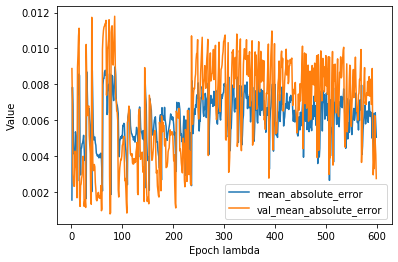

In [21]:
list_of_metrics_to_plot = ['mean_absolute_error',"val_mean_absolute_error"] 
plot_curve(epochs_lambda_best, hist_lambda_best, list_of_metrics_to_plot,"lambda")

In [22]:
best_model_lambda.save("saved_Models/lambda_100_best_model_main_max_err_0_03")

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
INFO:tensorflow:Assets written to: saved_Models/lambda_100_best_model_main_max_err_0_03\assets


In [198]:
MAX_TRIALS = 20

EXECUTIONS_PER_TRIAL = 3

tuner_delta = kt.RandomSearch(

    create_model_optimizer,

    objective='val_mean_absolute_error',

    max_trials=MAX_TRIALS,

    executions_per_trial=EXECUTIONS_PER_TRIAL,

    directory='delta_100_model_main_max',
    overwrite = True,
    project_name='second Try',

    seed=1

)
x_train_delta=delta_train["main_maximum"].to_numpy()
y_train_delta=delta_train["delta"].to_numpy()
x_test_delta=delta_test["main_maximum"].to_numpy()
y_test_delta=delta_test["delta"].to_numpy()
#lambda_train, lambda_test
#delta_train, delta_test
tuner_delta.search(x_train_delta, y_train_delta, epochs = 500, validation_data = (x_test_delta, y_test_delta))


Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4274 - mean_absolute_error: 0.427 - 0s 122ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.4179 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.4409 - mean_absolute_error: 0.440 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.4164 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mea

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.4243 - mean_absolute_error: 0.424 - 0s 13ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.4232 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.4196 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.4240 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.4260 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.4189 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 -

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.4176 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.4388 - mean_absolute_error: 0.438 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.4260 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.4122 - mean_absolute_error: 0.412 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.4321 - mean_absolute_error: 0.432 - 0s 14ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.4331 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.4187 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.4288 - mean_absolute_error: 0.428 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.4350 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.4290 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.4168 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.4279 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.4280 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.4382 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.4407 - mean_absolute_error: 0.440 - 0s 11ms/step - loss: 0.4

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.4351 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.4214 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.4251 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.4413 - mean_absolute_error: 0.441 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.4146 - mean_absolute_error: 0.414 - 0s 12ms/step - loss: 0.

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.4199 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.4274 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.4199 - mean_absolute_error: 0.419 - 0s 11ms/step - loss: 0

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.4291 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.4336 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.4200 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.4190 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.4330 - mean_absolute_error: 0.433 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.4146 - mean_absolute_error: 0.414 - 0s 10ms/step - loss: 0.

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.4200 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.4268 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.4209 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.4339 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.42

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.4126 - mean_absolute_error: 0.412 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.4273 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.42

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.4201 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.4185 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - 

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.4245 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.4279 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.4299 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 -

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.4182 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.4195 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.4268 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.4224 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.42

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.4194 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.4294 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.4076 - mean_absolute_error: 0.407 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.4223 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.4116 - mean_absolute_error: 0.411 - 0s 10ms/step - loss: 0.42

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.4306 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.4192 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.4187 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.4220 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.4255 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.4193 - mean_absolute_error: 0.419 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.4343 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.4316 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.4175 - mean_absolute_error: 0.417 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.4194 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.4318 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.4215 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.4338 - mean_absolute_error: 0.433 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.4287 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.4438 - mean_absolute_error: 0.443 - 0s 10ms/step - loss: 0.

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.4224 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.4153 - mean_absolute_error: 0.415 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.4307 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.4265 - mean_absolute_error: 0.426 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.4194 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.4151 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.4251 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.4379 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.4196 - mean_absolute_error: 0.419 - 0s 11ms/step - loss: 0.

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.4268 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.4253 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.4347 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.4312 - mean_absolute_error: 0.431 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.4258 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.4357 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.4335 - mean_absolute_error: 0.433 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.4284 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.4381 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - 

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.4202 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.4240 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.4396 - mean_absolute_error: 0.439 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.4391 - mean_absolute_error: 0.439 - 0s 9ms/step - loss: 0.4262 -

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.4388 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.4253 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.4429 - mean_absolute_error: 0.442 - 0s 12ms/step - loss: 0.4

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.4327 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.4232 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.4266 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 12ms/step - loss: 0.4

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.4391 - mean_absolute_error: 0.439 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.4437 - mean_absolute_error: 0.443 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.4270 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.4339 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.426

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.4253 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.4157 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.42

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.4123 - mean_absolute_error: 0.412 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.42

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.4205 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.4127 - mean_absolute_error: 0.412 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.4330 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.4320 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.4211 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.4161 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.4387 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.4188 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.42

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.4190 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.4185 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.4273 - mean_absolute_error: 0.427 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.4210 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.4218 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.4119 - mean_absolute_error: 0.411 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.4280 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.4504 - mean_absolute_error: 0.450 - 0s 10ms/step - loss: 0.4

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.4291 - mean_absolute_error: 0.429 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.4204 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.4372 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.4354 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.42

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4164 - mean_absolute_error: 0.416 - 0s 120ms/step - loss: 0.4254 - mean_absolute_error: 0.4254 - val_loss: 0.4079 - val_mean_absolute_error: 0.4079
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.4189 - mean_absolute_error: 0.418 - 0s 86ms/step - loss: 0.4226 - mean_absolute_error: 0.4226 - val_loss: 0.4050 - val_mean_absolute_error: 0.4050
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.4178 - mean_absolute_error: 0.417 - 0s 65ms/step - loss: 0.4197 - mean_absolute_error: 0.4197 - val_loss: 0.4021 - val_mean_absolute_error: 0.4021
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.4175 - mean_absolute_error: 0.417 - 0s 82ms/step - loss: 0.4167 - mean_absolute_error: 0.4167 - val_loss: 0.3992 - val_mean_absolute_error: 0.3992
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.4100 - mean_absolute_error: 0.410 - 0s 95ms/step - loss: 0.4138 - 

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.3186 - mean_absolute_error: 0.318 - 0s 98ms/step - loss: 0.3159 - mean_absolute_error: 0.3159 - val_loss: 0.2992 - val_mean_absolute_error: 0.2992
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.3089 - mean_absolute_error: 0.308 - 0s 94ms/step - loss: 0.3131 - mean_absolute_error: 0.3131 - val_loss: 0.2964 - val_mean_absolute_error: 0.2964
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.3087 - mean_absolute_error: 0.308 - 0s 93ms/step - loss: 0.3102 - mean_absolute_error: 0.3102 - val_loss: 0.2935 - val_mean_absolute_error: 0.2935
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.3088 - mean_absolute_error: 0.308 - 0s 82ms/step - loss: 0.3073 - mean_absolute_error: 0.3073 - val_loss: 0.2907 - val_mean_absolute_error: 0.2907
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.3089 - mean_absolute_error: 0.308 - 0s 77ms/step - loss: 0.304

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.1978 - mean_absolute_error: 0.197 - 0s 144ms/step - loss: 0.2052 - mean_absolute_error: 0.2052 - val_loss: 0.1895 - val_mean_absolute_error: 0.1895
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.2054 - mean_absolute_error: 0.205 - 0s 123ms/step - loss: 0.2023 - mean_absolute_error: 0.2023 - val_loss: 0.1866 - val_mean_absolute_error: 0.1866
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.1970 - mean_absolute_error: 0.197 - 0s 89ms/step - loss: 0.1994 - mean_absolute_error: 0.1994 - val_loss: 0.1837 - val_mean_absolute_error: 0.1837
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.1872 - mean_absolute_error: 0.187 - 0s 77ms/step - loss: 0.1964 - mean_absolute_error: 0.1964 - val_loss: 0.1808 - val_mean_absolute_error: 0.1808
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.1895 - mean_absolute_error: 0.189 - 0s 106ms/step - loss: 0.

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.1008 - mean_absolute_error: 0.100 - 0s 64ms/step - loss: 0.0941 - mean_absolute_error: 0.0941 - val_loss: 0.0815 - val_mean_absolute_error: 0.0815
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.0990 - mean_absolute_error: 0.099 - 0s 63ms/step - loss: 0.0919 - mean_absolute_error: 0.0919 - val_loss: 0.0799 - val_mean_absolute_error: 0.0799
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.0998 - mean_absolute_error: 0.099 - 0s 65ms/step - loss: 0.0896 - mean_absolute_error: 0.0896 - val_loss: 0.0785 - val_mean_absolute_error: 0.0785
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.0966 - mean_absolute_error: 0.096 - 0s 56ms/step - loss: 0.0875 - mean_absolute_error: 0.0875 - val_loss: 0.0770 - val_mean_absolute_error: 0.0770
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.0867 - mean_absolute_error: 0.086 - 0s 65ms/step - loss: 

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.0554 - mean_absolute_error: 0.055 - 0s 94ms/step - loss: 0.0527 - mean_absolute_error: 0.0527 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.0457 - mean_absolute_error: 0.045 - 0s 94ms/step - loss: 0.0525 - mean_absolute_error: 0.0525 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.0543 - mean_absolute_error: 0.054 - 0s 69ms/step - loss: 0.0523 - mean_absolute_error: 0.0523 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.0546 - mean_absolute_error: 0.054 - 0s 86ms/step - loss: 0.0521 - mean_absolute_error: 0.0521 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mean_absolute_error: 0.051 - 0s 86ms/step - loss: 

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.0552 - mean_absolute_error: 0.055 - 0s 11ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.0473 - mean_absolute_error: 0.047 - 0s 12ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.0471 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.0442 - mean_absolute_error: 0.044 - 0s 11ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.0493 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.0517 - mean_absolute_error: 0.051 - 0s 12ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.0519 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.0548 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.0441 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 12ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.0436 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.0546 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.0470 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.0532 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.0464 - mean_absolute_error: 0.046 - 0s 11ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.0539 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.0488 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 12ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.0492 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.0474 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.0556 - mean_absolute_error: 0.055 - 0s 12ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.0507 - mean_absolute_error: 0.050 - 0s 12ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 12ms/step - loss: 0

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.0440 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.0510 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.0443 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.0452 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.0490 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.0500 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.0408 - mean_absolute_error: 0.040 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.0554 - mean_absolute_error: 0.055 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.0501 - mean_absolute_error: 0.050 - 0s 11ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.0452 - mean_absolute_error: 0.045 - 0s 11ms/step - loss: 0.

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.0428 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.0532 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.0510 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.2514 - mean_absolute_error: 0.251 - 0s 9ms/step - loss: 0.2474 - mean_absolute_error: 0.2474 - val_loss: 0.2297 - val_mean_absolute_error: 0.2297
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.2379 - mean_absolute_error: 0.237 - 0s 10ms/step - loss: 0.2417 - mean_absolute_error: 0.2417 - val_loss: 0.2240 - val_mean_absolute_error: 0.2240
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.2300 - mean_absolute_error: 0.230 - 0s 11ms/step - loss: 0.2360 - mean_absolute_error: 0.2360 - val_loss: 0.2184 - val_mean_absolute_error: 0.2184
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.2391 - mean_absolute_error: 0.239 - 0s 9ms/step - loss: 0.2303 - mean_absolute_error: 0.2303 - val_loss: 0.2127 - val_mean_absolute_error: 0.2127
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.2274 - mean_absolute_error: 0.227 - 0s 9ms/step - loss: 0.2245 -

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0583 - mean_absolute_error: 0.0583 - val_loss: 0.0600 - val_mean_absolute_error: 0.0600
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.0697 - mean_absolute_error: 0.069 - 0s 10ms/step - loss: 0.0569 - mean_absolute_error: 0.0569 - val_loss: 0.0595 - val_mean_absolute_error: 0.0595
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.0469 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0559 - mean_absolute_error: 0.0559 - val_loss: 0.0590 - val_mean_absolute_error: 0.0590
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.0563 - mean_absolute_error: 0.056 - 0s 11ms/step - loss: 0.0549 - mean_absolute_error: 0.0549 - val_loss: 0.0584 - val_mean_absolute_error: 0.0584
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.0613 - mean_absolute_error: 0.061 - 0s 11ms/step - loss: 0.0540

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.0484 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.0438 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.0474 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.0542 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.0446 - mean_absolute_error: 0.044 - 0s 11ms/step - loss: 0.04

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.0532 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.0471 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.0522 - mean_absolute_error: 0.052 - 0s 11ms/step - loss: 

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.0448 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.0488 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.0443 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 13ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 11ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.0424 - mean_absolute_error: 0.042 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.0469 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.0454 - mean_absolute_error: 0.045 - 0s 13ms/step - loss: 

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.0464 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.0416 - mean_absolute_error: 0.041 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.0482 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.0430 - mean_absolute_error: 0.043 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.0537 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.0479 - mean_absolute_error: 0.047 - 0s 11ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.0425 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.04

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.0515 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.0478 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.0383 - mean_absolute_error: 0.038 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.0487 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.0556 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.0544 - mean_absolute_error: 0.054 - 0s 11ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.0370 - mean_absolute_error: 0.037 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.0473 - mean_absolute_error: 0.047 - 0s 11ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.0571 - mean_absolute_error: 0.057 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.0426 - mean_absolute_error: 0.042 - 0s 10ms/step - loss: 

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.0540 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.0421 - mean_absolute_error: 0.042 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.0556 - mean_absolute_error: 0.055 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.0465 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.0428 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.0445 - mean_absolute_error: 0.044 - 0s 12ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.0547 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.0526 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.0512 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.0620 - mean_absolute_error: 0.062 - 0s 11ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.0504 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.0485 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.0443 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.4217 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.4134 - mean_absolute_error: 0.413 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.4367 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.4177 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.4382 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - m

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.4214 - mean_absolute_error: 0.421 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.4411 - mean_absolute_error: 0.441 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.4268 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.4273 - mean_absolute_error: 0.427 - 0s 13ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.4217 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.42

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.4442 - mean_absolute_error: 0.444 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.4273 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.4181 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.4134 - mean_absolute_error: 0.413 - 0s 9ms/step - loss: 0.4

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.4187 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.4135 - mean_absolute_error: 0.413 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.42

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.4180 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.4306 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.4158 - mean_absolute_error: 0.415 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.4422 - mean_absolute_error: 0.442 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.4348 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.4158 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.4209 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.4284 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.42

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.4229 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.4211 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.4196 - mean_absolute_error: 0.419 - 0s 12ms/step - loss: 0.42

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.4197 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.4348 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.426

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.4439 - mean_absolute_error: 0.443 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.4394 - mean_absolute_error: 0.439 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.4280 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.4371 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.4236 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.4251 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.4327 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.4161 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.42

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.4335 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.4173 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.4273 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.4408 - mean_absolute_error: 0.440 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.4224 - mean_absolute_error: 0.422 - 0s 11ms/step - loss: 0.4

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4112 - mean_absolute_error: 0.411 - 0s 110ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.4377 - mean_absolute_error: 0.437 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.4223 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.4155 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - m

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.4107 - mean_absolute_error: 0.410 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.4387 - mean_absolute_error: 0.438 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.4218 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.4161 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.4131 - mean_absolute_error: 0.413 - 0s 9ms/step - loss: 0.4262 -

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.4178 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.4370 - mean_absolute_error: 0.437 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.4169 - mean_absolute_error: 0.416 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.4343 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.4295 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.4279 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.4364 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.4212 - mean_absolute_error: 0.421 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.4360 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.4173 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.4148 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.4216 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.4298 - mean_absolute_error: 0.429 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.4298 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.4403 - mean_absolute_error: 0.440 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.4393 - mean_absolute_error: 0.439 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.4204 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.4246 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.4217 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.4167 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.4340 - mean_absolute_error: 0.434 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.4207 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 12ms/step - loss: 0.

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.4306 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.4248 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.4266 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.4280 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.4290 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.4294 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.4187 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.4236 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.4223 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.4397 - mean_absolute_error: 0.439 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.4216 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.4364 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.4346 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.4230 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.4442 - mean_absolute_error: 0.444 - 0s 9ms/step - loss: 0.4262 -

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.4245 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.4232 - mean_absolute_error: 0.423 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.4307 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.4450 - mean_absolute_error: 0.445 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.4311 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.42

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.4321 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.4223 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.4190 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.4354 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.4334 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.4104 - mean_absolute_error: 0.410 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.4195 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.4326 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.42

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.4128 - mean_absolute_error: 0.412 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.4353 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.4374 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.4192 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.4179 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.4394 - mean_absolute_error: 0.439 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.4336 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.4214 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.4196 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.4214 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.4362 - mean_absolute_error: 0.436 - 0s 13ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.4277 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.4212 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.4370 - mean_absolute_error: 0.437 - 0s 10ms/step - loss: 0

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.4260 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.4327 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.4298 - mean_absolute_error: 0.429 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.4365 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.4130 - mean_absolute_error: 0.413 - 0s 9ms/step - loss: 0.4

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.4287 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.4194 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.4352 - mean_absolute_error: 0.435 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.4185 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.42

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.4296 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.4316 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.4298 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.4330 - mean_absolute_error: 0.433 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.4211 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.0522 - mean_absolute_error: 0.052 - 0s 81ms/step - loss: 0.0529 - mean_absolute_error: 0.0529 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.0525 - mean_absolute_error: 0.052 - 0s 86ms/step - loss: 0.0530 - mean_absolute_error: 0.0530 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.0465 - mean_absolute_error: 0.046 - 0s 69ms/step - loss: 0.0518 - mean_absolute_error: 0.0518 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.0504 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0516 - mean_absolute_error: 0.0516 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0515

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.0465 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0540 - val_mean_absolute_error: 0.0540
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.0537 - mean_absolute_error: 0.053 - 0s 11ms/step - loss: 0.0527 - mean_absolute_error: 0.0527 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.0433 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0515 - mean_absolute_error: 0.0515 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.0434 - mean_absolute_error: 0.043 - 0s 10ms/step - loss: 0.0492 -

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.0563 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0539 - val_mean_absolute_error: 0.0539
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.0606 - mean_absolute_error: 0.060 - 0s 10ms/step - loss: 0.

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.0538 - mean_absolute_error: 0.053 - 0s 12ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 11ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.0603 - mean_absolute_error: 0.060 - 0s 10ms/step - loss: 

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.0445 - mean_absolute_error: 0.044 - 0s 11ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.0482 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0535 - val_mean_absolute_error: 0.0535
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.0538 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0539 - val_mean_absolute_error: 0.0539
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.0539 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0542 - val_mean_absolute_error: 0.0542
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.0451 - mean_absolute_error: 0.045 - 0s 12ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.0482 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0540 - val_mean_absolute_error: 0.0540
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.0504 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0545 - val_mean_absolute_error: 0.0545
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.0449 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.0571 - mean_absolute_error: 0.057 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0539 - val_mean_absolute_error: 0.0539
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.0453 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.0431 - mean_absolute_error: 0.043 - 0s 13ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.0500 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0542 - val_mean_absolute_error: 0.0542
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.0471 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0539 - val_mean_absolute_error: 0.0539
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0539 - val_mean_absolute_error: 0.0539
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.0487 - mean_absolute_error: 0.048 - 0s 12ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0533 - val_mean_absolute_error: 0.0533
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.0545 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.0489 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0542 - val_mean_absolute_error: 0.0542
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.0520 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.0530 - mean_absolute_error: 0.053 - 0s 11ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.0539 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.0536 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0535 - val_mean_absolute_error: 0.0535
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.0543 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.0538 - mean_absolute_error: 0.053 - 0s 13ms/step - loss: 0

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0539 - val_mean_absolute_error: 0.0539
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.0349 - mean_absolute_error: 0.034 - 0s 10ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.0488 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.0522 - mean_absolute_error: 0.052 - 0s 14ms/step - loss: 0.

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.0537 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.0492 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.0452 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.0507 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.0520 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0539 - val_mean_absolute_error: 0.0539
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.0534 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.0515 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.0449 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4220 - mean_absolute_error: 0.422 - 0s 113ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.4164 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.4345 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mea

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.4196 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.4255 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.4159 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - 

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.4150 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.4145 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.4251 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 -

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.4339 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.4452 - mean_absolute_error: 0.445 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.4362 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.4332 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.4333 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.4246 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.4357 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.4212 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.4272 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.4136 - mean_absolute_error: 0.413 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.4193 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.4427 - mean_absolute_error: 0.442 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.4416 - mean_absolute_error: 0.441 - 0s 9ms/step - loss: 0.426

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.4381 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.4298 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.4424 - mean_absolute_error: 0.442 - 0s 10ms/step - loss: 0.4

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.4159 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.4356 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.4312 - mean_absolute_error: 0.431 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.4290 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.42

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.4334 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.4361 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.4181 - mean_absolute_error: 0.418 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.4144 - mean_absolute_error: 0.414 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.4417 - mean_absolute_error: 0.441 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.4316 - mean_absolute_error: 0.431 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.4232 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.4421 - mean_absolute_error: 0.442 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.4355 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.4270 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.4248 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.4196 - mean_absolute_error: 0.419 - 0s 13ms/step - loss: 0.4

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.4204 - mean_absolute_error: 0.420 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.4306 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.4354 - mean_absolute_error: 0.435 - 0s 12ms/step - loss: 

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.4280 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.4317 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.4119 - mean_absolute_error: 0.411 - 0s 9ms/step - loss: 0.4

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.4415 - mean_absolute_error: 0.441 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.4141 - mean_absolute_error: 0.414 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.4167 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 -

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.4350 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.4272 - mean_absolute_error: 0.427 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.4268 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.4251 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 12ms/step - loss: 0

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.4328 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.4205 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.4337 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.4190 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.4328 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.4231 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.4194 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.42

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.4202 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.4223 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.4119 - mean_absolute_error: 0.411 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.4360 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.4270 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.4316 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.4137 - mean_absolute_error: 0.413 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.4308 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.4224 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.4211 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.4287 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.4275 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.4197 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.4250 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.4161 - mean_absolute_error: 0.416 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.4277 - mean_absolute_error: 0.427 - 0s 11ms/step - loss: 

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.4142 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.4295 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.4220 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.42

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.4199 - mean_absolute_error: 0.419 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.4197 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.4180 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.4394 - mean_absolute_error: 0.439 - 0s 9ms/step - loss: 0.42

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.4253 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.4352 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.4333 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.4378 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.4284 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.4295 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.4232 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.4255 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - m

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.4358 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.4432 - mean_absolute_error: 0.443 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.4404 - mean_absolute_error: 0.440 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - 

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.4085 - mean_absolute_error: 0.408 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.4287 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.4313 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.4163 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.4312 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.4187 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.4363 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.4192 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.42

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.4325 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.4338 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.4352 - mean_absolute_error: 0.435 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.42

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.4166 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.4226 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.4418 - mean_absolute_error: 0.441 - 0s 9ms/step - loss: 0.42

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.4353 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.4231 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.4167 - mean_absolute_error: 0.416 - 0s 12ms/step - loss: 0.

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.4251 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.4129 - mean_absolute_error: 0.412 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.4386 - mean_absolute_error: 0.438 - 0s 11ms/step - loss: 0.4

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.4243 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.4196 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.4295 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.4333 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.4311 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.4240 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.4348 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.4384 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.426

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.4160 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.4131 - mean_absolute_error: 0.413 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.4190 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.42

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.4275 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.4320 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.2775 - mean_absolute_error: 0.277 - 0s 107ms/step - loss: 0.3110 - mean_absolute_error: 0.3110 - val_loss: 0.2401 - val_mean_absolute_error: 0.2401
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.2965 - mean_absolute_error: 0.296 - 0s 98ms/step - loss: 0.3087 - mean_absolute_error: 0.3087 - val_loss: 0.2384 - val_mean_absolute_error: 0.2384
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.3199 - mean_absolute_error: 0.319 - 0s 82ms/step - loss: 0.3064 - mean_absolute_error: 0.3064 - val_loss: 0.2367 - val_mean_absolute_error: 0.2367
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.3504 - mean_absolute_error: 0.350 - 0s 82ms/step - loss: 0.3041 - mean_absolute_error: 0.3041 - val_loss: 0.2350 - val_mean_absolute_error: 0.2350
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.3040 - mean_absolute_error: 0.304 - 0s 77ms/step - loss: 0.3017 - 

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.2446 - mean_absolute_error: 0.244 - 0s 136ms/step - loss: 0.2450 - mean_absolute_error: 0.2450 - val_loss: 0.1934 - val_mean_absolute_error: 0.1934
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.2433 - mean_absolute_error: 0.243 - 0s 86ms/step - loss: 0.2438 - mean_absolute_error: 0.2438 - val_loss: 0.1926 - val_mean_absolute_error: 0.1926
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.2469 - mean_absolute_error: 0.246 - 0s 108ms/step - loss: 0.2426 - mean_absolute_error: 0.2426 - val_loss: 0.1917 - val_mean_absolute_error: 0.1917
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.2656 - mean_absolute_error: 0.265 - 0s 59ms/step - loss: 0.2414 - mean_absolute_error: 0.2414 - val_loss: 0.1909 - val_mean_absolute_error: 0.1909
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.2327 - mean_absolute_error: 0.232 - 0s 56ms/step - loss: 0.2

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.2212 - mean_absolute_error: 0.221 - 0s 69ms/step - loss: 0.2162 - mean_absolute_error: 0.2162 - val_loss: 0.1687 - val_mean_absolute_error: 0.1687
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.1888 - mean_absolute_error: 0.188 - 0s 81ms/step - loss: 0.2156 - mean_absolute_error: 0.2156 - val_loss: 0.1683 - val_mean_absolute_error: 0.1683
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.2189 - mean_absolute_error: 0.218 - 0s 73ms/step - loss: 0.2150 - mean_absolute_error: 0.2150 - val_loss: 0.1679 - val_mean_absolute_error: 0.1679
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.2190 - mean_absolute_error: 0.219 - 0s 73ms/step - loss: 0.2144 - mean_absolute_error: 0.2144 - val_loss: 0.1675 - val_mean_absolute_error: 0.1675
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.2248 - mean_absolute_error: 0.224 - 0s 97ms/step - loss: 0.213

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.2079 - mean_absolute_error: 0.207 - 0s 107ms/step - loss: 0.2013 - mean_absolute_error: 0.2013 - val_loss: 0.1594 - val_mean_absolute_error: 0.1594
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.2028 - mean_absolute_error: 0.202 - 0s 90ms/step - loss: 0.2010 - mean_absolute_error: 0.2010 - val_loss: 0.1592 - val_mean_absolute_error: 0.1592
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.2070 - mean_absolute_error: 0.207 - 0s 85ms/step - loss: 0.2006 - mean_absolute_error: 0.2006 - val_loss: 0.1590 - val_mean_absolute_error: 0.1590
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.1791 - mean_absolute_error: 0.179 - 0s 78ms/step - loss: 0.2002 - mean_absolute_error: 0.2002 - val_loss: 0.1589 - val_mean_absolute_error: 0.1589
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.1952 - mean_absolute_error: 0.195 - 0s 88ms/step - loss:

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.2106 - mean_absolute_error: 0.210 - 0s 9ms/step - loss: 0.1887 - mean_absolute_error: 0.1887 - val_loss: 0.1579 - val_mean_absolute_error: 0.1579
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.2035 - mean_absolute_error: 0.203 - 0s 10ms/step - loss: 0.1884 - mean_absolute_error: 0.1884 - val_loss: 0.1580 - val_mean_absolute_error: 0.1580
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.1698 - mean_absolute_error: 0.169 - 0s 10ms/step - loss: 0.1881 - mean_absolute_error: 0.1881 - val_loss: 0.1580 - val_mean_absolute_error: 0.1580
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.1861 - mean_absolute_error: 0.186 - 0s 10ms/step - loss: 0.1878 - mean_absolute_error: 0.1878 - val_loss: 0.1581 - val_mean_absolute_error: 0.1581
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.1928 - mean_absolute_error: 0.192 - 0s 10ms/step - loss: 0

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.1952 - mean_absolute_error: 0.195 - 0s 9ms/step - loss: 0.1814 - mean_absolute_error: 0.1814 - val_loss: 0.1584 - val_mean_absolute_error: 0.1584
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.1862 - mean_absolute_error: 0.186 - 0s 10ms/step - loss: 0.1813 - mean_absolute_error: 0.1813 - val_loss: 0.1584 - val_mean_absolute_error: 0.1584
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.2023 - mean_absolute_error: 0.202 - 0s 10ms/step - loss: 0.1811 - mean_absolute_error: 0.1811 - val_loss: 0.1584 - val_mean_absolute_error: 0.1584
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.1825 - mean_absolute_error: 0.182 - 0s 9ms/step - loss: 0.1810 - mean_absolute_error: 0.1810 - val_loss: 0.1584 - val_mean_absolute_error: 0.1584
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.1587 - mean_absolute_error: 0.158 - 0s 10ms/step - loss: 0.

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.1954 - mean_absolute_error: 0.195 - 0s 11ms/step - loss: 0.1762 - mean_absolute_error: 0.1762 - val_loss: 0.1593 - val_mean_absolute_error: 0.1593
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.1865 - mean_absolute_error: 0.186 - 0s 9ms/step - loss: 0.1761 - mean_absolute_error: 0.1761 - val_loss: 0.1592 - val_mean_absolute_error: 0.1592
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.1998 - mean_absolute_error: 0.199 - 0s 12ms/step - loss: 0.1760 - mean_absolute_error: 0.1760 - val_loss: 0.1592 - val_mean_absolute_error: 0.1592
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.1671 - mean_absolute_error: 0.167 - 0s 12ms/step - loss: 0.1759 - mean_absolute_error: 0.1759 - val_loss: 0.1592 - val_mean_absolute_error: 0.1592
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.1815 - mean_absolute_error: 0.181 - 0s 12ms/step - loss: 0

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.1579 - mean_absolute_error: 0.157 - 0s 73ms/step - loss: 0.1727 - mean_absolute_error: 0.1727 - val_loss: 0.1571 - val_mean_absolute_error: 0.1571
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.1355 - mean_absolute_error: 0.135 - 0s 68ms/step - loss: 0.1726 - mean_absolute_error: 0.1726 - val_loss: 0.1570 - val_mean_absolute_error: 0.1570
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.1818 - mean_absolute_error: 0.181 - 0s 94ms/step - loss: 0.1726 - mean_absolute_error: 0.1726 - val_loss: 0.1569 - val_mean_absolute_error: 0.1569
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.1697 - mean_absolute_error: 0.169 - 0s 119ms/step - loss: 0.1725 - mean_absolute_error: 0.1725 - val_loss: 0.1569 - val_mean_absolute_error: 0.1569
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.1655 - mean_absolute_error: 0.165 - 0s 86ms/step - loss:

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.1650 - mean_absolute_error: 0.165 - 0s 90ms/step - loss: 0.1693 - mean_absolute_error: 0.1693 - val_loss: 0.1546 - val_mean_absolute_error: 0.1546
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.1909 - mean_absolute_error: 0.190 - 0s 90ms/step - loss: 0.1692 - mean_absolute_error: 0.1692 - val_loss: 0.1545 - val_mean_absolute_error: 0.1545
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.1546 - mean_absolute_error: 0.154 - 0s 98ms/step - loss: 0.1691 - mean_absolute_error: 0.1691 - val_loss: 0.1545 - val_mean_absolute_error: 0.1545
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.1554 - mean_absolute_error: 0.155 - 0s 82ms/step - loss: 0.1690 - mean_absolute_error: 0.1690 - val_loss: 0.1544 - val_mean_absolute_error: 0.1544
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.1807 - mean_absolute_error: 0.180 - 0s 82ms/step - loss: 

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.1499 - mean_absolute_error: 0.149 - 0s 81ms/step - loss: 0.1659 - mean_absolute_error: 0.1659 - val_loss: 0.1522 - val_mean_absolute_error: 0.1522
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.1283 - mean_absolute_error: 0.128 - 0s 81ms/step - loss: 0.1658 - mean_absolute_error: 0.1658 - val_loss: 0.1521 - val_mean_absolute_error: 0.1521
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.1631 - mean_absolute_error: 0.163 - 0s 123ms/step - loss: 0.1657 - mean_absolute_error: 0.1657 - val_loss: 0.1520 - val_mean_absolute_error: 0.1520
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.1442 - mean_absolute_error: 0.144 - 0s 90ms/step - loss: 0.1657 - mean_absolute_error: 0.1657 - val_loss: 0.1519 - val_mean_absolute_error: 0.1519
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.1832 - mean_absolute_error: 0.183 - 0s 85ms/step - loss:

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.1637 - mean_absolute_error: 0.163 - 0s 77ms/step - loss: 0.1626 - mean_absolute_error: 0.1626 - val_loss: 0.1497 - val_mean_absolute_error: 0.1497
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.1456 - mean_absolute_error: 0.145 - 0s 69ms/step - loss: 0.1625 - mean_absolute_error: 0.1625 - val_loss: 0.1496 - val_mean_absolute_error: 0.1496
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.1746 - mean_absolute_error: 0.174 - 0s 89ms/step - loss: 0.1624 - mean_absolute_error: 0.1624 - val_loss: 0.1495 - val_mean_absolute_error: 0.1495
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.1819 - mean_absolute_error: 0.181 - 0s 61ms/step - loss: 0.1623 - mean_absolute_error: 0.1623 - val_loss: 0.1495 - val_mean_absolute_error: 0.1495
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.1777 - mean_absolute_error: 0.177 - 0s 79ms/step - loss: 

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.1616 - mean_absolute_error: 0.161 - 0s 77ms/step - loss: 0.1592 - mean_absolute_error: 0.1592 - val_loss: 0.1472 - val_mean_absolute_error: 0.1472
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.1631 - mean_absolute_error: 0.163 - 0s 107ms/step - loss: 0.1591 - mean_absolute_error: 0.1591 - val_loss: 0.1472 - val_mean_absolute_error: 0.1472
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.1346 - mean_absolute_error: 0.134 - 0s 115ms/step - loss: 0.1590 - mean_absolute_error: 0.1590 - val_loss: 0.1471 - val_mean_absolute_error: 0.1471
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.1379 - mean_absolute_error: 0.137 - 0s 102ms/step - loss: 0.1589 - mean_absolute_error: 0.1589 - val_loss: 0.1470 - val_mean_absolute_error: 0.1470
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.1537 - mean_absolute_error: 0.153 - 0s 119ms/step - lo

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.1494 - mean_absolute_error: 0.149 - 0s 82ms/step - loss: 0.1559 - mean_absolute_error: 0.1559 - val_loss: 0.1449 - val_mean_absolute_error: 0.1449
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.1518 - mean_absolute_error: 0.151 - 0s 61ms/step - loss: 0.1558 - mean_absolute_error: 0.1558 - val_loss: 0.1448 - val_mean_absolute_error: 0.1448
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.1521 - mean_absolute_error: 0.152 - 0s 57ms/step - loss: 0.1557 - mean_absolute_error: 0.1557 - val_loss: 0.1447 - val_mean_absolute_error: 0.1447
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.1606 - mean_absolute_error: 0.160 - 0s 61ms/step - loss: 0.1557 - mean_absolute_error: 0.1557 - val_loss: 0.1447 - val_mean_absolute_error: 0.1447
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.1760 - mean_absolute_error: 0.176 - 0s 56ms/step - loss: 

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.1351 - mean_absolute_error: 0.135 - 0s 101ms/step - loss: 0.1525 - mean_absolute_error: 0.1525 - val_loss: 0.1425 - val_mean_absolute_error: 0.1425
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.1731 - mean_absolute_error: 0.173 - 0s 111ms/step - loss: 0.1525 - mean_absolute_error: 0.1525 - val_loss: 0.1424 - val_mean_absolute_error: 0.1424
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.1592 - mean_absolute_error: 0.159 - 0s 103ms/step - loss: 0.1524 - mean_absolute_error: 0.1524 - val_loss: 0.1423 - val_mean_absolute_error: 0.1423
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.1396 - mean_absolute_error: 0.139 - 0s 77ms/step - loss: 0.1523 - mean_absolute_error: 0.1523 - val_loss: 0.1422 - val_mean_absolute_error: 0.1422
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.1525 - mean_absolute_error: 0.152 - 0s 94ms/step - los

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.4251 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.4134 - mean_absolute_error: 0.413 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.4164 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.4251 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 11ms/step - loss: 0.4262 -

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.4175 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.4098 - mean_absolute_error: 0.409 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.4199 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.4313 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.4308 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.4294 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.4342 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.4230 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.42

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.4218 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.4192 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.42

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.4345 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.4287 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.4334 - mean_absolute_error: 0.433 - 0s 13ms/step - loss: 0.

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.4351 - mean_absolute_error: 0.435 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.4356 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.4345 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.4253 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.4298 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.42

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.4377 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.4230 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.4266 - mean_absolute_error: 0.426 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.4150 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.4361 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.4280 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.4127 - mean_absolute_error: 0.412 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.4430 - mean_absolute_error: 0.443 - 0s 10ms/step - loss: 0.

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.4348 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.4161 - mean_absolute_error: 0.416 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.4374 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.4258 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.4219 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.4190 - mean_absolute_error: 0.419 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.4299 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.4114 - mean_absolute_error: 0.411 - 0s 10ms/step - loss: 0.

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.4348 - mean_absolute_error: 0.434 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.4250 - mean_absolute_error: 0.425 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.4080 - mean_absolute_error: 0.408 - 0s 9ms/step - loss: 0.4

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.4353 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.4306 - mean_absolute_error: 0.430 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.4374 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.4167 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.4250 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.4179 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.4303 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.4368 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 -

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.4270 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.4171 - mean_absolute_error: 0.417 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.4387 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.42

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.4398 - mean_absolute_error: 0.439 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.4212 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.4156 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.4189 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.4135 - mean_absolute_error: 0.413 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.4160 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.4280 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.4128 - mean_absolute_error: 0.412 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.4171 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.4346 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 12ms/step - loss: 0.

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.4127 - mean_absolute_error: 0.412 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 12ms/step - loss: 0.42

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.4325 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.4163 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.4212 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.4215 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.4180 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.4261 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.4222 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.4344 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.4197 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.4289 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.4280 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.42

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.4436 - mean_absolute_error: 0.443 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.4294 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.42

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.4280 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.4123 - mean_absolute_error: 0.412 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.4194 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.4201 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.4157 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.4341 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.4326 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.426

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4303 - mean_absolute_error: 0.430 - 0s 108ms/step - loss: 0.4008 - mean_absolute_error: 0.4008 - val_loss: 0.2981 - val_mean_absolute_error: 0.2981
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.4216 - mean_absolute_error: 0.421 - 0s 61ms/step - loss: 0.3846 - mean_absolute_error: 0.3846 - val_loss: 0.2856 - val_mean_absolute_error: 0.2856
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.3860 - mean_absolute_error: 0.386 - 0s 93ms/step - loss: 0.3672 - mean_absolute_error: 0.3672 - val_loss: 0.2731 - val_mean_absolute_error: 0.2731
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.3156 - mean_absolute_error: 0.315 - 0s 73ms/step - loss: 0.3495 - mean_absolute_error: 0.3495 - val_loss: 0.2611 - val_mean_absolute_error: 0.2611
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.3139 - mean_absolute_error: 0.313 - 0s 82ms/step - loss: 0.3334 - 

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.2073 - mean_absolute_error: 0.207 - 0s 73ms/step - loss: 0.1958 - mean_absolute_error: 0.1958 - val_loss: 0.1582 - val_mean_absolute_error: 0.1582
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.1760 - mean_absolute_error: 0.176 - 0s 9ms/step - loss: 0.1944 - mean_absolute_error: 0.1944 - val_loss: 0.1582 - val_mean_absolute_error: 0.1582
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.2015 - mean_absolute_error: 0.201 - 0s 10ms/step - loss: 0.1932 - mean_absolute_error: 0.1932 - val_loss: 0.1587 - val_mean_absolute_error: 0.1587
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.1650 - mean_absolute_error: 0.165 - 0s 9ms/step - loss: 0.1917 - mean_absolute_error: 0.1917 - val_loss: 0.1591 - val_mean_absolute_error: 0.1591
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.1847 - mean_absolute_error: 0.184 - 0s 9ms/step - loss: 0.1904 -

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.1815 - mean_absolute_error: 0.181 - 0s 9ms/step - loss: 0.1793 - mean_absolute_error: 0.1793 - val_loss: 0.1653 - val_mean_absolute_error: 0.1653
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.1837 - mean_absolute_error: 0.183 - 0s 10ms/step - loss: 0.1790 - mean_absolute_error: 0.1790 - val_loss: 0.1655 - val_mean_absolute_error: 0.1655
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.2020 - mean_absolute_error: 0.202 - 0s 10ms/step - loss: 0.1789 - mean_absolute_error: 0.1789 - val_loss: 0.1654 - val_mean_absolute_error: 0.1654
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.1752 - mean_absolute_error: 0.175 - 0s 9ms/step - loss: 0.1789 - mean_absolute_error: 0.1789 - val_loss: 0.1653 - val_mean_absolute_error: 0.1653
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.1690 - mean_absolute_error: 0.169 - 0s 10ms/step - loss: 0.1788 

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.1762 - mean_absolute_error: 0.176 - 0s 9ms/step - loss: 0.1749 - mean_absolute_error: 0.1749 - val_loss: 0.1622 - val_mean_absolute_error: 0.1622
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.1925 - mean_absolute_error: 0.192 - 0s 10ms/step - loss: 0.1748 - mean_absolute_error: 0.1748 - val_loss: 0.1622 - val_mean_absolute_error: 0.1622
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.1747 - mean_absolute_error: 0.174 - 0s 10ms/step - loss: 0.1749 - mean_absolute_error: 0.1749 - val_loss: 0.1624 - val_mean_absolute_error: 0.1624
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.1573 - mean_absolute_error: 0.157 - 0s 10ms/step - loss: 0.1746 - mean_absolute_error: 0.1746 - val_loss: 0.1620 - val_mean_absolute_error: 0.1620
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.1725 - mean_absolute_error: 0.172 - 0s 9ms/step - loss: 0.

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.1505 - mean_absolute_error: 0.150 - 0s 10ms/step - loss: 0.1708 - mean_absolute_error: 0.1708 - val_loss: 0.1595 - val_mean_absolute_error: 0.1595
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.1817 - mean_absolute_error: 0.181 - 0s 9ms/step - loss: 0.1707 - mean_absolute_error: 0.1707 - val_loss: 0.1593 - val_mean_absolute_error: 0.1593
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.1676 - mean_absolute_error: 0.167 - 0s 10ms/step - loss: 0.1706 - mean_absolute_error: 0.1706 - val_loss: 0.1594 - val_mean_absolute_error: 0.1594
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.1747 - mean_absolute_error: 0.174 - 0s 9ms/step - loss: 0.1705 - mean_absolute_error: 0.1705 - val_loss: 0.1593 - val_mean_absolute_error: 0.1593
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.1867 - mean_absolute_error: 0.186 - 0s 9ms/step - loss: 0.1

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.1739 - mean_absolute_error: 0.173 - 0s 86ms/step - loss: 0.1667 - mean_absolute_error: 0.1667 - val_loss: 0.1563 - val_mean_absolute_error: 0.1563
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.1593 - mean_absolute_error: 0.159 - 0s 73ms/step - loss: 0.1666 - mean_absolute_error: 0.1666 - val_loss: 0.1561 - val_mean_absolute_error: 0.1561
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.2006 - mean_absolute_error: 0.200 - 0s 10ms/step - loss: 0.1664 - mean_absolute_error: 0.1664 - val_loss: 0.1563 - val_mean_absolute_error: 0.1563
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.1782 - mean_absolute_error: 0.178 - 0s 10ms/step - loss: 0.1664 - mean_absolute_error: 0.1664 - val_loss: 0.1563 - val_mean_absolute_error: 0.1563
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.1826 - mean_absolute_error: 0.182 - 0s 9ms/step - loss: 0

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.1560 - mean_absolute_error: 0.156 - 0s 10ms/step - loss: 0.1627 - mean_absolute_error: 0.1627 - val_loss: 0.1538 - val_mean_absolute_error: 0.1538
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.1743 - mean_absolute_error: 0.174 - 0s 86ms/step - loss: 0.1625 - mean_absolute_error: 0.1625 - val_loss: 0.1535 - val_mean_absolute_error: 0.1535
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.1745 - mean_absolute_error: 0.174 - 0s 119ms/step - loss: 0.1623 - mean_absolute_error: 0.1623 - val_loss: 0.1532 - val_mean_absolute_error: 0.1532
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.1618 - mean_absolute_error: 0.161 - 0s 9ms/step - loss: 0.1622 - mean_absolute_error: 0.1622 - val_loss: 0.1533 - val_mean_absolute_error: 0.1533
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.1681 - mean_absolute_error: 0.168 - 0s 10ms/step - loss: 

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.1498 - mean_absolute_error: 0.149 - 0s 92ms/step - loss: 0.1584 - mean_absolute_error: 0.1584 - val_loss: 0.1503 - val_mean_absolute_error: 0.1503
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.1436 - mean_absolute_error: 0.143 - 0s 10ms/step - loss: 0.1585 - mean_absolute_error: 0.1585 - val_loss: 0.1504 - val_mean_absolute_error: 0.1504
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.1548 - mean_absolute_error: 0.154 - 0s 74ms/step - loss: 0.1582 - mean_absolute_error: 0.1582 - val_loss: 0.1500 - val_mean_absolute_error: 0.1500
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.1583 - mean_absolute_error: 0.158 - 0s 10ms/step - loss: 0.1581 - mean_absolute_error: 0.1581 - val_loss: 0.1502 - val_mean_absolute_error: 0.1502
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.1336 - mean_absolute_error: 0.133 - 0s 9ms/step - loss: 0

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.1351 - mean_absolute_error: 0.135 - 0s 88ms/step - loss: 0.1543 - mean_absolute_error: 0.1543 - val_loss: 0.1481 - val_mean_absolute_error: 0.1481
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.1590 - mean_absolute_error: 0.159 - 0s 9ms/step - loss: 0.1543 - mean_absolute_error: 0.1543 - val_loss: 0.1481 - val_mean_absolute_error: 0.1481
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.1559 - mean_absolute_error: 0.155 - 0s 9ms/step - loss: 0.1541 - mean_absolute_error: 0.1541 - val_loss: 0.1485 - val_mean_absolute_error: 0.1485
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.1315 - mean_absolute_error: 0.131 - 0s 10ms/step - loss: 0.1539 - mean_absolute_error: 0.1539 - val_loss: 0.1485 - val_mean_absolute_error: 0.1485
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.1484 - mean_absolute_error: 0.148 - 0s 9ms/step - loss: 0.1

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.1479 - mean_absolute_error: 0.147 - 0s 65ms/step - loss: 0.1502 - mean_absolute_error: 0.1502 - val_loss: 0.1455 - val_mean_absolute_error: 0.1455
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.1408 - mean_absolute_error: 0.140 - 0s 69ms/step - loss: 0.1501 - mean_absolute_error: 0.1501 - val_loss: 0.1450 - val_mean_absolute_error: 0.1450
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.1211 - mean_absolute_error: 0.121 - 0s 9ms/step - loss: 0.1500 - mean_absolute_error: 0.1500 - val_loss: 0.1451 - val_mean_absolute_error: 0.1451
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.1552 - mean_absolute_error: 0.155 - 0s 9ms/step - loss: 0.1498 - mean_absolute_error: 0.1498 - val_loss: 0.1453 - val_mean_absolute_error: 0.1453
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.1550 - mean_absolute_error: 0.155 - 0s 73ms/step - loss: 0.

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.1578 - mean_absolute_error: 0.157 - 0s 85ms/step - loss: 0.1463 - mean_absolute_error: 0.1463 - val_loss: 0.1405 - val_mean_absolute_error: 0.1405
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.1424 - mean_absolute_error: 0.142 - 0s 9ms/step - loss: 0.1466 - mean_absolute_error: 0.1466 - val_loss: 0.1406 - val_mean_absolute_error: 0.1406
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.1191 - mean_absolute_error: 0.119 - 0s 113ms/step - loss: 0.1461 - mean_absolute_error: 0.1461 - val_loss: 0.1402 - val_mean_absolute_error: 0.1402
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.1347 - mean_absolute_error: 0.134 - 0s 9ms/step - loss: 0.1461 - mean_absolute_error: 0.1461 - val_loss: 0.1404 - val_mean_absolute_error: 0.1404
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.1387 - mean_absolute_error: 0.138 - 0s 9ms/step - loss: 0.

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.1584 - mean_absolute_error: 0.158 - 0s 65ms/step - loss: 0.1425 - mean_absolute_error: 0.1425 - val_loss: 0.1385 - val_mean_absolute_error: 0.1385
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.1305 - mean_absolute_error: 0.130 - 0s 65ms/step - loss: 0.1424 - mean_absolute_error: 0.1424 - val_loss: 0.1385 - val_mean_absolute_error: 0.1385
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.1193 - mean_absolute_error: 0.119 - 0s 65ms/step - loss: 0.1425 - mean_absolute_error: 0.1425 - val_loss: 0.1384 - val_mean_absolute_error: 0.1384
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.1528 - mean_absolute_error: 0.152 - 0s 72ms/step - loss: 0.1424 - mean_absolute_error: 0.1424 - val_loss: 0.1380 - val_mean_absolute_error: 0.1380
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.1542 - mean_absolute_error: 0.154 - 0s 9ms/step - loss: 0

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.1658 - mean_absolute_error: 0.165 - 0s 10ms/step - loss: 0.1369 - mean_absolute_error: 0.1369 - val_loss: 0.1332 - val_mean_absolute_error: 0.1332
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.1521 - mean_absolute_error: 0.152 - 0s 74ms/step - loss: 0.1370 - mean_absolute_error: 0.1370 - val_loss: 0.1326 - val_mean_absolute_error: 0.1326
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.1140 - mean_absolute_error: 0.114 - 0s 69ms/step - loss: 0.1367 - mean_absolute_error: 0.1367 - val_loss: 0.1326 - val_mean_absolute_error: 0.1326
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.1461 - mean_absolute_error: 0.146 - 0s 9ms/step - loss: 0.1365 - mean_absolute_error: 0.1365 - val_loss: 0.1327 - val_mean_absolute_error: 0.1327
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.1257 - mean_absolute_error: 0.125 - 0s 11ms/step - loss: 0

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.1336 - mean_absolute_error: 0.133 - 0s 9ms/step - loss: 0.1319 - mean_absolute_error: 0.1319 - val_loss: 0.1283 - val_mean_absolute_error: 0.1283
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.1415 - mean_absolute_error: 0.141 - 0s 9ms/step - loss: 0.1320 - mean_absolute_error: 0.1320 - val_loss: 0.1280 - val_mean_absolute_error: 0.1280
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.1115 - mean_absolute_error: 0.111 - 0s 10ms/step - loss: 0.1317 - mean_absolute_error: 0.1317 - val_loss: 0.1278 - val_mean_absolute_error: 0.1278
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.1325 - mean_absolute_error: 0.132 - 0s 64ms/step - loss: 0.1316 - mean_absolute_error: 0.1316 - val_loss: 0.1275 - val_mean_absolute_error: 0.1275
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.1191 - mean_absolute_error: 0.119 - 0s 107ms/step - loss: 0

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.4288 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.4115 - mean_absolute_error: 0.411 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.4303 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.4148 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.4377 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - m

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.4261 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.4179 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.4158 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.4382 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.4284 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.42

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.4217 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.4327 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.4274 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.4135 - mean_absolute_error: 0.413 - 0s 9ms/step - loss: 0

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.4296 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.4284 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.4384 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.4442 - mean_absolute_error: 0.444 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 13ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.4277 - mean_absolute_error: 0.427 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.4220 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.4279 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.4202 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.4277 - mean_absolute_error: 0.427 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.4274 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.4211 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.4320 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.4251 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.4185 - mean_absolute_error: 0.418 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.4332 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.4261 - mean_absolute_error: 0.426 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.4232 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.4160 - mean_absolute_error: 0.416 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.4288 - mean_absolute_error: 0.428 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.4245 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.4198 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.4298 - mean_absolute_error: 0.429 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.4199 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.4172 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.4124 - mean_absolute_error: 0.412 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.4158 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.4312 - mean_absolute_error: 0.431 - 0s 13ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.4179 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.4231 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.4167 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.4299 - mean_absolute_error: 0.429 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 12ms/step - loss: 0

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.4211 - mean_absolute_error: 0.421 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.4339 - mean_absolute_error: 0.433 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.4160 - mean_absolute_error: 0.416 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.4187 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.4368 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.4377 - mean_absolute_error: 0.437 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.4343 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.4224 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.4218 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.4196 - mean_absolute_error: 0.419 - 0s 13ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.4180 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.4258 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.4182 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.4255 - mean_absolute_error: 0.425 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.4212 - mean_absolute_error: 0.421 - 0s 11ms/step - loss: 0.

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.4406 - mean_absolute_error: 0.440 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.4255 - mean_absolute_error: 0.425 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.4395 - mean_absolute_error: 0.439 - 0s 12ms/step - loss: 

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.4336 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.4355 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.4133 - mean_absolute_error: 0.413 - 0s 10ms/step - loss: 0

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.4193 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.4185 - mean_absolute_error: 0.418 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.4280 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.4175 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.4245 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.4331 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.4295 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.4402 - mean_absolute_error: 0.440 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.4287 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.4326 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.4389 - mean_absolute_error: 0.438 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.4167 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.4072 - mean_absolute_error: 0.407 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.426

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.4261 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.4218 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.4223 - mean_absolute_error: 0.422 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.4152 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.4158 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.4180 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.4173 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.4164 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.4241 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.2517 - mean_absolute_error: 0.251 - 0s 119ms/step - loss: 0.2063 - mean_absolute_error: 0.2063 - val_loss: 0.1708 - val_mean_absolute_error: 0.1708
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.1969 - mean_absolute_error: 0.196 - 0s 82ms/step - loss: 0.2086 - mean_absolute_error: 0.2086 - val_loss: 0.1472 - val_mean_absolute_error: 0.1472
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.1709 - mean_absolute_error: 0.170 - 0s 10ms/step - loss: 0.1725 - mean_absolute_error: 0.1725 - val_loss: 0.1518 - val_mean_absolute_error: 0.1518
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.1461 - mean_absolute_error: 0.146 - 0s 82ms/step - loss: 0.1620 - mean_absolute_error: 0.1620 - val_loss: 0.1465 - val_mean_absolute_error: 0.1465
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.1404 - mean_absolute_error: 0.140 - 0s 94ms/step - loss: 0.1568 - 

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0567 - val_mean_absolute_error: 0.0567
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.0495 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0475 - mean_absolute_error: 0.0475 - val_loss: 0.0529 - val_mean_absolute_error: 0.0529
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.0544 - mean_absolute_error: 0.054 - 0s 12ms/step - loss: 0.0508 - mean_absolute_error: 0.0508 - val_loss: 0.0606 - val_mean_absolute_error: 0.0606
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.0515 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0515 - mean_absolute_error: 0.0515 - val_loss: 0.0530 - val_mean_absolute_error: 0.0530
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.0537 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0493 -

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.0484 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0578 - val_mean_absolute_error: 0.0578
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.0472 - mean_absolute_error: 0.047 - 0s 11ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0528 - val_mean_absolute_error: 0.0528
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.0546 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0542 - mean_absolute_error: 0.0542 - val_loss: 0.0517 - val_mean_absolute_error: 0.0517
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0528 - val_mean_absolute_error: 0.0528
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.0464 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0486 

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.0406 - mean_absolute_error: 0.040 - 0s 10ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0519 - val_mean_absolute_error: 0.0519
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.0533 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0526 - val_mean_absolute_error: 0.0526
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 12ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0528 - val_mean_absolute_error: 0.0528
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.0478 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0509 - mean_absolute_error: 0.0509 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.0550 - mean_absolute_error: 0.055 - 0s 12ms/step - loss: 0.0512 - mean_absolute_error: 0.0512 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0524 - val_mean_absolute_error: 0.0524
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.0493 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0522 - val_mean_absolute_error: 0.0522
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.0427 - mean_absolute_error: 0.042 - 0s 12ms/step - loss: 0.

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0519 - val_mean_absolute_error: 0.0519
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.0474 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0511 - mean_absolute_error: 0.0511 - val_loss: 0.0533 - val_mean_absolute_error: 0.0533
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0534 - val_mean_absolute_error: 0.0534
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.0419 - mean_absolute_error: 0.041 - 0s 10ms/step - loss: 0.0484 - mean_absolute_error: 0.0484 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.0521 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.04

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.0517 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0523 - val_mean_absolute_error: 0.0523
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.0571 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.0540 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0542 - val_mean_absolute_error: 0.0542
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0535 - val_mean_absolute_error: 0.0535
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.0452 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.0519 - mean_absolute_error: 0.051 - 0s 11ms/step - loss: 0.0514 - mean_absolute_error: 0.0514 - val_loss: 0.0526 - val_mean_absolute_error: 0.0526
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.0525 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0522 - val_mean_absolute_error: 0.0522
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.0444 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0529 - val_mean_absolute_error: 0.0529
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0530 - val_mean_absolute_error: 0.0530
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.0484 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.0512 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0530 - val_mean_absolute_error: 0.0530
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.0482 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0516 - mean_absolute_error: 0.0516 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.0510 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0532 - val_mean_absolute_error: 0.0532
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.0479 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0512 - mean_absolute_error: 0.0512 - val_loss: 0.0527 - val_mean_absolute_error: 0.0527
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.0545 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0509 - mean_absolute_error: 0.0509 - val_loss: 0.0523 - val_mean_absolute_error: 0.0523
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.0412 - mean_absolute_error: 0.041 - 0s 10ms/step - loss: 0.0504 - mean_absolute_error: 0.0504 - val_loss: 0.0526 - val_mean_absolute_error: 0.0526
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.0485 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0527 - val_mean_absolute_error: 0.0527
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0532 - val_mean_absolute_error: 0.0532
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.0537 - mean_absolute_error: 0.053 - 0s 11ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0523 - val_mean_absolute_error: 0.0523
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.0493 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0528 - val_mean_absolute_error: 0.0528
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0533 - val_mean_absolute_error: 0.0533
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.0540 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.0412 - mean_absolute_error: 0.041 - 0s 10ms/step - loss: 0.0

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0533 - val_mean_absolute_error: 0.0533
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.0450 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0484 - mean_absolute_error: 0.0484 - val_loss: 0.0535 - val_mean_absolute_error: 0.0535
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 11ms/step - loss: 0.

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.0500 - mean_absolute_error: 0.050 - 0s 12ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0529 - val_mean_absolute_error: 0.0529
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.0444 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0527 - val_mean_absolute_error: 0.0527
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.0518 - mean_absolute_error: 0.051 - 0s 12ms/step - loss: 0.0557 - mean_absolute_error: 0.0557 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0535 - val_mean_absolute_error: 0.0535
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.0533 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0515 - mean_absolute_error: 0.0515 - val_loss: 0.0528 - val_mean_absolute_error: 0.0528
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.0542 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0533 - val_mean_absolute_error: 0.0533
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.0456 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0516 - mean_absolute_error: 0.0516 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.0559 - mean_absolute_error: 0.055 - 0s 12ms/step - loss: 0.0509 - mean_absolute_error: 0.0509 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.0552 - mean_absolute_error: 0.055 - 0s 11ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.0531 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.049

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.0493 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.0450 - mean_absolute_error: 0.045 - 0s 13ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0569 - val_mean_absolute_error: 0.0569
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0489 -

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.0530 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.0445 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.0456 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0569 - val_mean_absolute_error: 0.0569
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.0448 - mean_absolute_error: 0.044 - 0s 11ms/step - loss: 0

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.0552 - mean_absolute_error: 0.055 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0569 - val_mean_absolute_error: 0.0569
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.0406 - mean_absolute_error: 0.040 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.0519 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.0469 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.0533 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.0443 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.0534 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.0538 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.0542 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.0423 - mean_absolute_error: 0.042 - 0s 10ms/step - loss: 0.0

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.0541 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.0425 - mean_absolute_error: 0.042 - 0s 10ms/step - loss: 0.0

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.0560 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.0483 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.0561 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.0463 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.048

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.0435 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0567 - val_mean_absolute_error: 0.0567
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.0392 - mean_absolute_error: 0.039 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.0525 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.04

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.0490 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0567 - val_mean_absolute_error: 0.0567
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.0465 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.0399 - mean_absolute_error: 0.039 - 0s 9ms/step - loss: 0.049

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.0524 - mean_absolute_error: 0.052 - 0s 11ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.0454 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.0469 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0569 - val_mean_absolute_error: 0.0569
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.0543 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.0428 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.0473 - mean_absolute_error: 0.047 - 0s 12ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.0410 - mean_absolute_error: 0.041 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.0448 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 12ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.04

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.0687 - mean_absolute_error: 0.068 - 0s 10ms/step - loss: 0.0706 - mean_absolute_error: 0.0706 - val_loss: 0.0686 - val_mean_absolute_error: 0.0686
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.0683 - mean_absolute_error: 0.068 - 0s 9ms/step - loss: 0.0674 - mean_absolute_error: 0.0674 - val_loss: 0.0667 - val_mean_absolute_error: 0.0667
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.0648 - mean_absolute_error: 0.064 - 0s 9ms/step - loss: 0.0659 - mean_absolute_error: 0.0659 - val_loss: 0.0674 - val_mean_absolute_error: 0.0674
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.0650 - mean_absolute_error: 0.065 - 0s 9ms/step - loss: 0.0650 - mean_absolute_error: 0.0650 - val_loss: 0.0634 - val_mean_absolute_error: 0.0634
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.0655 - mean_absolute_error: 0.065 - 0s 9ms/step - loss: 0.0613 - 

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.0550 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.0549 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0541 - val_mean_absolute_error: 0.0541
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.0510 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0534 - mean_absolute_error: 0.0534 - val_loss: 0.0520 - val_mean_absolute_error: 0.0520
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.0558 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.0546 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0495 - 

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.0511 - mean_absolute_error: 0.051 - 0s 11ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.0538 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0539 - val_mean_absolute_error: 0.0539
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.0510 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.0521 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.0444 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.04

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.0432 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 12ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0526 - val_mean_absolute_error: 0.0526
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.0446 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0527 - val_mean_absolute_error: 0.0527
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.0431 - mean_absolute_error: 0.043 - 0s 10ms/step - loss: 0.0

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0534 - val_mean_absolute_error: 0.0534
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.0423 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.0526 - mean_absolute_error: 0.052 - 0s 11ms/step - loss: 0.0484 - mean_absolute_error: 0.0484 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.0445 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0532 - val_mean_absolute_error: 0.0532
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.0464 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 8ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0534 - val_mean_absolute_error: 0.0534
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.0463 - mean_absolute_error: 0.046 - 0s 12ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0527 - val_mean_absolute_error: 0.0527
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0533 - val_mean_absolute_error: 0.0533
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.0451 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.0440 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.0519 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.0504 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0535 - val_mean_absolute_error: 0.0535
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.0445 - mean_absolute_error: 0.044 - 0s 12ms/step - loss: 0.0

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.0520 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0535 - val_mean_absolute_error: 0.0535
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.0471 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0483 - mean_absolute_error: 0.0483 - val_loss: 0.0534 - val_mean_absolute_error: 0.0534
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.048

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0533 - val_mean_absolute_error: 0.0533
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.0453 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0534 - val_mean_absolute_error: 0.0534
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.0482 - mean_absolute_error: 0.048 - 0s 8ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.04

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.0519 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0484 - mean_absolute_error: 0.0484 - val_loss: 0.0539 - val_mean_absolute_error: 0.0539
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0532 - val_mean_absolute_error: 0.0532
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.0538 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.0454 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0528 - val_mean_absolute_error: 0.0528
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.0529 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.0526 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0534 - val_mean_absolute_error: 0.0534
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0534 - val_mean_absolute_error: 0.0534
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0534 - val_mean_absolute_error: 0.0534
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.0544 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0533 - val_mean_absolute_error: 0.0533
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.0495 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.04

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.0436 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0534 - val_mean_absolute_error: 0.0534
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.0512 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.0474 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.0512 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.0557 - mean_absolute_error: 0.055 - 0s 11ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0532 - val_mean_absolute_error: 0.0532
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.0467 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0484 - mean_absolute_error: 0.0484 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.0448 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.0

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4187 - mean_absolute_error: 0.418 - 0s 110ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.4180 - mean_absolute_error: 0.418 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.4199 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.4178 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 8ms/step - loss: 0.4262 - mea

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.4231 - mean_absolute_error: 0.423 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.4178 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.4287 - mean_absolute_error: 0.428 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.4151 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.4241 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.4394 - mean_absolute_error: 0.439 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.4363 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.4204 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.4323 - mean_absolute_error: 0.432 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.4185 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.4387 - mean_absolute_error: 0.438 - 0s 11ms/step - loss: 0

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.4312 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.4230 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.4232 - mean_absolute_error: 0.423 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.4369 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.4201 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.4207 - mean_absolute_error: 0.420 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.4357 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.4160 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.4343 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.4197 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 11ms/step - loss: 0

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.4216 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.4201 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.4325 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 12ms/step - loss: 0.

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.4313 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.4142 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.4367 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.4168 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.4295 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.4222 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.4200 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.4231 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.4273 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.4348 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.4194 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.4320 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.4209 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.4135 - mean_absolute_error: 0.413 - 0s 8ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.4334 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.4279 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.4223 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.4334 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.4232 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.4313 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.4251 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 -

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.4079 - mean_absolute_error: 0.407 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.4192 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.4187 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - m

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.4149 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.4307 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.4171 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.4177 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.4191 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.4277 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.4240 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.4200 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.426

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.4333 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.4328 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.4284 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.4006 - mean_absolute_error: 0.400 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.4316 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.4189 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.4218 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.4332 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.42

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.4270 - mean_absolute_error: 0.427 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.4287 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.4290 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.4326 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.4201 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.42

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.4342 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.4215 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.4185 - mean_absolute_error: 0.418 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.4187 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.4151 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.4317 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.4433 - mean_absolute_error: 0.443 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.4182 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.4347 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.42

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.4124 - mean_absolute_error: 0.412 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.4193 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.4079 - mean_absolute_error: 0.407 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.4214 - mean_absolute_error: 0.421 - 0s 12ms/step - loss: 0.42

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.4190 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.4345 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.4187 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.4218 - mean_absolute_error: 0.421 - 0s 11ms/step - loss: 0.4

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.4146 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.4382 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - 

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.4315 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.4211 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.4184 - mean_absolute_error: 0.418 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - 

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.4370 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.4425 - mean_absolute_error: 0.442 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.4294 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.42

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.4326 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.4334 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.4321 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.4295 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.42

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.4147 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.4317 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.4429 - mean_absolute_error: 0.442 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.4067 - mean_absolute_error: 0.406 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.4189 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.42

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.4190 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.4236 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.4191 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.4418 - mean_absolute_error: 0.441 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.426

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.4174 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.4380 - mean_absolute_error: 0.438 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.4163 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.4357 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.4315 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.4245 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.4274 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.4298 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.4160 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.42

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.4440 - mean_absolute_error: 0.444 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.4321 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.4246 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.42

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.4307 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.4209 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.4240 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.42

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.4291 - mean_absolute_error: 0.429 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.4178 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.4274 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.4274 - mean_absolute_error: 0.427 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.4342 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.4086 - mean_absolute_error: 0.408 - 0s 9ms/step - loss: 0.4

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 115ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.4363 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.4360 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mea

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.4410 - mean_absolute_error: 0.441 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.4330 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.4187 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.4273 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.4317 - mean_absolute_error: 0.431 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.4214 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.4345 - mean_absolute_error: 0.434 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.4168 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.4308 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.4380 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.4280 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.4313 - mean_absolute_error: 0.431 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.4284 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.4220 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.4331 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.4168 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.4240 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.4182 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 12ms/step - loss: 0.

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.4120 - mean_absolute_error: 0.412 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.4372 - mean_absolute_error: 0.437 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.4330 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.4330 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.4184 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.4216 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.4204 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.4182 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.4201 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.4223 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.4290 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.4345 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.4354 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.4350 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.4200 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.4343 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.4282 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.1756 - mean_absolute_error: 0.175 - 0s 9ms/step - loss: 0.1528 - mean_absolute_error: 0.1528 - val_loss: 0.0918 - val_mean_absolute_error: 0.0918
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.0879 - mean_absolute_error: 0.087 - 0s 10ms/step - loss: 0.1081 - mean_absolute_error: 0.1081 - val_loss: 0.1216 - val_mean_absolute_error: 0.1216
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.1373 - mean_absolute_error: 0.137 - 0s 9ms/step - loss: 0.1162 - mean_absolute_error: 0.1162 - val_loss: 0.0922 - val_mean_absolute_error: 0.0922
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.0898 - mean_absolute_error: 0.089 - 0s 9ms/step - loss: 0.1073 - mean_absolute_error: 0.1073 - val_loss: 0.1073 - val_mean_absolute_error: 0.1073
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.1115 - mean_absolute_error: 0.111 - 0s 10ms/step - loss: 0.0984 -

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.0576 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0596 - mean_absolute_error: 0.0596 - val_loss: 0.0569 - val_mean_absolute_error: 0.0569
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.0484 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0602 - val_mean_absolute_error: 0.0602
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0634 - mean_absolute_error: 0.0634 - val_loss: 0.0945 - val_mean_absolute_error: 0.0945
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.1115 - mean_absolute_error: 0.111 - 0s 10ms/step - loss: 0.0850 - mean_absolute_error: 0.0850 - val_loss: 0.0587 - val_mean_absolute_error: 0.0587
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.0577 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0608 - 

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.0463 - mean_absolute_error: 0.046 - 0s 82ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.0607 - mean_absolute_error: 0.060 - 0s 9ms/step - loss: 0.0559 - mean_absolute_error: 0.0559 - val_loss: 0.0674 - val_mean_absolute_error: 0.0674
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.0686 - mean_absolute_error: 0.068 - 0s 9ms/step - loss: 0.0596 - mean_absolute_error: 0.0596 - val_loss: 0.0627 - val_mean_absolute_error: 0.0627
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.0596 - mean_absolute_error: 0.059 - 0s 10ms/step - loss: 0.0511 - mean_absolute_error: 0.0511 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.0559 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.0534 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.0536 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0595 - val_mean_absolute_error: 0.0595
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.0500 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0515 - mean_absolute_error: 0.0515 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.0486 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.049

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.0512 - mean_absolute_error: 0.051 - 0s 11ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0582 - val_mean_absolute_error: 0.0582
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.0557 - mean_absolute_error: 0.055 - 0s 11ms/step - loss: 0.0550 - mean_absolute_error: 0.0550 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.0547 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0600 - val_mean_absolute_error: 0.0600
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.0547 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0515 - mean_absolute_error: 0.0515 - val_loss: 0.0567 - val_mean_absolute_error: 0.0567
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.0526 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0536 - mean_absolute_error: 0.0536 - val_loss: 0.0638 - val_mean_absolute_error: 0.0638
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.0626 - mean_absolute_error: 0.062 - 0s 10ms/step - loss: 0.0553 - mean_absolute_error: 0.0553 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.0452 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0586 - val_mean_absolute_error: 0.0586
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.0524 - mean_absolute_error: 0.052 - 0s 61ms/step - loss: 0.0516 - mean_absolute_error: 0.0516 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.0479 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.0471 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0531 - mean_absolute_error: 0.0531 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.0463 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0511 - mean_absolute_error: 0.0511 - val_loss: 0.0614 - val_mean_absolute_error: 0.0614
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.0591 - mean_absolute_error: 0.059 - 0s 10ms/step - loss: 0.0560 - mean_absolute_error: 0.0560 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.0471 - mean_absolute_error: 0.047 - 0s 75ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.0551 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0601 - mean_absolute_error: 0.0601 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.0521 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0514 - mean_absolute_error: 0.0514 - val_loss: 0.0592 - val_mean_absolute_error: 0.0592
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.0521 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0527 - mean_absolute_error: 0.0527 - val_loss: 0.0581 - val_mean_absolute_error: 0.0581
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.0501 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0563 - mean_absolute_error: 0.0563 - val_loss: 0.0617 - val_mean_absolute_error: 0.0617
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.0594 - mean_absolute_error: 0.059 - 0s 86ms/step - loss: 0.05

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.0515 - mean_absolute_error: 0.051 - 0s 13ms/step - loss: 0.0526 - mean_absolute_error: 0.0526 - val_loss: 0.0572 - val_mean_absolute_error: 0.0572
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0514 - mean_absolute_error: 0.0514 - val_loss: 0.0578 - val_mean_absolute_error: 0.0578
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.0431 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0535 - mean_absolute_error: 0.0535 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0592 - val_mean_absolute_error: 0.0592
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.0520 - mean_absolute_error: 0.052 - 0s 12ms/step - loss: 0.0504 - mean_absolute_error: 0.0504 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.0456 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.0500 - mean_absolute_error: 0.050 - 0s 13ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.0527 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.0437 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0514 - mean_absolute_error: 0.0514 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.0465 - mean_absolute_error: 0.046 - 0s 12ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.0478 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.0438 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.0490 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0515 - mean_absolute_error: 0.0515 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.0482 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0577 - val_mean_absolute_error: 0.0577
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.0434 - mean_absolute_error: 0.043 - 0s 11ms/step - loss: 0.0520 - mean_absolute_error: 0.0520 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0583 - val_mean_absolute_error: 0.0583
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.05

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.0504 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0584 - val_mean_absolute_error: 0.0584
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0511 - mean_absolute_error: 0.0511 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.0467 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0584 - val_mean_absolute_error: 0.0584
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.0515 - mean_absolute_error: 0.051 - 0s 12ms/step - loss: 0.0539 - mean_absolute_error: 0.0539 - val_loss: 0.0582 - val_mean_absolute_error: 0.0582
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.0452 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.4223 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.4413 - mean_absolute_error: 0.441 - 0s 10ms/step - loss: 0.4262 

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.4274 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.4216 - mean_absolute_error: 0.421 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.4194 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.4151 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.4251 - mean_absolute_error: 0.425 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.4295 - mean_absolute_error: 0.429 - 0s 14ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.4112 - mean_absolute_error: 0.411 - 0s 9ms/step - loss: 0.

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.4299 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.4197 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.4340 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.4182 - mean_absolute_error: 0.418 - 0s 13ms/step - loss: 0.

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.4114 - mean_absolute_error: 0.411 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.4406 - mean_absolute_error: 0.440 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.4149 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.4298 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.4195 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.426

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.4112 - mean_absolute_error: 0.411 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.4378 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.4282 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.4321 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.4175 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.4334 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.4209 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.4288 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.4350 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.4202 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.4196 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.4357 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.4195 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.4204 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.4155 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.4185 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.4210 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.4336 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.4170 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.4320 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.426

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.4230 - mean_absolute_error: 0.423 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.4204 - mean_absolute_error: 0.420 - 0s 8ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.4325 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.4333 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.4354 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.4258 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.4298 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 98ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.4358 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.4353 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.4250 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.4186 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.4220 - mean_absolute_error: 0.422 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.4226 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.4336 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 -

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.4260 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.4185 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.4192 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.4274 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.4318 - mean_absolute_error: 0.431 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.4360 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.4321 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.4246 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.4127 - mean_absolute_error: 0.412 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 11ms/step - loss: 0

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.4336 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.4194 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.4323 - mean_absolute_error: 0.432 - 0s 13ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.4171 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.4246 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.4217 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.4326 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.4357 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.4331 - mean_absolute_error: 0.433 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.42

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.4202 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.4214 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.4273 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.4320 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 11ms/step - loss: 

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.4288 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.4173 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.4365 - mean_absolute_error: 0.436 - 0s 12ms/step - loss: 0.

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.4154 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.4251 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.4341 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.4295 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.4363 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.4357 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.4328 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.4312 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.4365 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.4172 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.4363 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.4188 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.4207 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.4204 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.4287 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.4396 - mean_absolute_error: 0.439 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.4216 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.42

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.1711 - mean_absolute_error: 0.171 - 0s 65ms/step - loss: 0.1762 - mean_absolute_error: 0.1762 - val_loss: 0.1682 - val_mean_absolute_error: 0.1682
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.1543 - mean_absolute_error: 0.154 - 0s 65ms/step - loss: 0.1761 - mean_absolute_error: 0.1761 - val_loss: 0.1676 - val_mean_absolute_error: 0.1676
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.1904 - mean_absolute_error: 0.190 - 0s 86ms/step - loss: 0.1759 - mean_absolute_error: 0.1759 - val_loss: 0.1670 - val_mean_absolute_error: 0.1670
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.1780 - mean_absolute_error: 0.178 - 0s 49ms/step - loss: 0.1758 - mean_absolute_error: 0.1758 - val_loss: 0.1664 - val_mean_absolute_error: 0.1664
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.1735 - mean_absolute_error: 0.173 - 0s 57ms/step - loss: 0.175

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.1553 - mean_absolute_error: 0.155 - 0s 73ms/step - loss: 0.1714 - mean_absolute_error: 0.1714 - val_loss: 0.1603 - val_mean_absolute_error: 0.1603
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.1590 - mean_absolute_error: 0.159 - 0s 10ms/step - loss: 0.1713 - mean_absolute_error: 0.1713 - val_loss: 0.1606 - val_mean_absolute_error: 0.1606
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.1777 - mean_absolute_error: 0.177 - 0s 9ms/step - loss: 0.1711 - mean_absolute_error: 0.1711 - val_loss: 0.1608 - val_mean_absolute_error: 0.1608
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.1808 - mean_absolute_error: 0.180 - 0s 11ms/step - loss: 0.1709 - mean_absolute_error: 0.1709 - val_loss: 0.1608 - val_mean_absolute_error: 0.1608
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.1849 - mean_absolute_error: 0.184 - 0s 118ms/step - loss: 0.170

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.1316 - mean_absolute_error: 0.131 - 0s 10ms/step - loss: 0.1670 - mean_absolute_error: 0.1670 - val_loss: 0.1572 - val_mean_absolute_error: 0.1572
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.1479 - mean_absolute_error: 0.147 - 0s 112ms/step - loss: 0.1669 - mean_absolute_error: 0.1669 - val_loss: 0.1571 - val_mean_absolute_error: 0.1571
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.1804 - mean_absolute_error: 0.180 - 0s 78ms/step - loss: 0.1665 - mean_absolute_error: 0.1665 - val_loss: 0.1566 - val_mean_absolute_error: 0.1566
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.1912 - mean_absolute_error: 0.191 - 0s 107ms/step - loss: 0.1663 - mean_absolute_error: 0.1663 - val_loss: 0.1565 - val_mean_absolute_error: 0.1565
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.1816 - mean_absolute_error: 0.181 - 0s 85ms/step - loss

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.1406 - mean_absolute_error: 0.140 - 0s 9ms/step - loss: 0.1623 - mean_absolute_error: 0.1623 - val_loss: 0.1532 - val_mean_absolute_error: 0.1532
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.1760 - mean_absolute_error: 0.176 - 0s 9ms/step - loss: 0.1621 - mean_absolute_error: 0.1621 - val_loss: 0.1533 - val_mean_absolute_error: 0.1533
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.1694 - mean_absolute_error: 0.169 - 0s 10ms/step - loss: 0.1619 - mean_absolute_error: 0.1619 - val_loss: 0.1534 - val_mean_absolute_error: 0.1534
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.1743 - mean_absolute_error: 0.174 - 0s 11ms/step - loss: 0.1617 - mean_absolute_error: 0.1617 - val_loss: 0.1534 - val_mean_absolute_error: 0.1534
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.1739 - mean_absolute_error: 0.173 - 0s 9ms/step - loss: 0.1

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.1457 - mean_absolute_error: 0.145 - 0s 95ms/step - loss: 0.1576 - mean_absolute_error: 0.1576 - val_loss: 0.1501 - val_mean_absolute_error: 0.1501
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.1594 - mean_absolute_error: 0.159 - 0s 65ms/step - loss: 0.1574 - mean_absolute_error: 0.1574 - val_loss: 0.1495 - val_mean_absolute_error: 0.1495
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.1672 - mean_absolute_error: 0.167 - 0s 9ms/step - loss: 0.1573 - mean_absolute_error: 0.1573 - val_loss: 0.1502 - val_mean_absolute_error: 0.1502
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.1474 - mean_absolute_error: 0.147 - 0s 9ms/step - loss: 0.1574 - mean_absolute_error: 0.1574 - val_loss: 0.1504 - val_mean_absolute_error: 0.1504
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.1570 - mean_absolute_error: 0.157 - 0s 11ms/step - loss: 0.

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.1633 - mean_absolute_error: 0.163 - 0s 9ms/step - loss: 0.1529 - mean_absolute_error: 0.1529 - val_loss: 0.1483 - val_mean_absolute_error: 0.1483
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.1286 - mean_absolute_error: 0.128 - 0s 54ms/step - loss: 0.1529 - mean_absolute_error: 0.1529 - val_loss: 0.1482 - val_mean_absolute_error: 0.1482
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.1438 - mean_absolute_error: 0.143 - 0s 85ms/step - loss: 0.1529 - mean_absolute_error: 0.1529 - val_loss: 0.1479 - val_mean_absolute_error: 0.1479
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.1413 - mean_absolute_error: 0.141 - 0s 74ms/step - loss: 0.1527 - mean_absolute_error: 0.1527 - val_loss: 0.1475 - val_mean_absolute_error: 0.1475
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.1500 - mean_absolute_error: 0.150 - 0s 10ms/step - loss: 0

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.1554 - mean_absolute_error: 0.155 - 0s 9ms/step - loss: 0.1485 - mean_absolute_error: 0.1485 - val_loss: 0.1438 - val_mean_absolute_error: 0.1438
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.1401 - mean_absolute_error: 0.140 - 0s 10ms/step - loss: 0.1484 - mean_absolute_error: 0.1484 - val_loss: 0.1435 - val_mean_absolute_error: 0.1435
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.1702 - mean_absolute_error: 0.170 - 0s 10ms/step - loss: 0.1485 - mean_absolute_error: 0.1485 - val_loss: 0.1433 - val_mean_absolute_error: 0.1433
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.1680 - mean_absolute_error: 0.168 - 0s 11ms/step - loss: 0.1482 - mean_absolute_error: 0.1482 - val_loss: 0.1431 - val_mean_absolute_error: 0.1431
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.1469 - mean_absolute_error: 0.146 - 0s 99ms/step - loss: 0

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.1590 - mean_absolute_error: 0.159 - 0s 60ms/step - loss: 0.1443 - mean_absolute_error: 0.1443 - val_loss: 0.1392 - val_mean_absolute_error: 0.1392
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.1287 - mean_absolute_error: 0.128 - 0s 9ms/step - loss: 0.1442 - mean_absolute_error: 0.1442 - val_loss: 0.1392 - val_mean_absolute_error: 0.1392
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.1572 - mean_absolute_error: 0.157 - 0s 9ms/step - loss: 0.1444 - mean_absolute_error: 0.1444 - val_loss: 0.1394 - val_mean_absolute_error: 0.1394
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.1438 - mean_absolute_error: 0.143 - 0s 89ms/step - loss: 0.1440 - mean_absolute_error: 0.1440 - val_loss: 0.1391 - val_mean_absolute_error: 0.1391
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.1459 - mean_absolute_error: 0.145 - 0s 77ms/step - loss: 0.

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.1490 - mean_absolute_error: 0.149 - 0s 90ms/step - loss: 0.1404 - mean_absolute_error: 0.1404 - val_loss: 0.1361 - val_mean_absolute_error: 0.1361
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.1325 - mean_absolute_error: 0.132 - 0s 10ms/step - loss: 0.1402 - mean_absolute_error: 0.1402 - val_loss: 0.1364 - val_mean_absolute_error: 0.1364
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.1469 - mean_absolute_error: 0.146 - 0s 9ms/step - loss: 0.1400 - mean_absolute_error: 0.1400 - val_loss: 0.1363 - val_mean_absolute_error: 0.1363
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.1389 - mean_absolute_error: 0.138 - 0s 11ms/step - loss: 0.1399 - mean_absolute_error: 0.1399 - val_loss: 0.1363 - val_mean_absolute_error: 0.1363
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.1521 - mean_absolute_error: 0.152 - 0s 84ms/step - loss: 0

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.1248 - mean_absolute_error: 0.124 - 0s 9ms/step - loss: 0.1371 - mean_absolute_error: 0.1371 - val_loss: 0.1332 - val_mean_absolute_error: 0.1332
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.1437 - mean_absolute_error: 0.143 - 0s 9ms/step - loss: 0.1365 - mean_absolute_error: 0.1365 - val_loss: 0.1331 - val_mean_absolute_error: 0.1331
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.1346 - mean_absolute_error: 0.134 - 0s 11ms/step - loss: 0.1364 - mean_absolute_error: 0.1364 - val_loss: 0.1327 - val_mean_absolute_error: 0.1327
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.1429 - mean_absolute_error: 0.142 - 0s 9ms/step - loss: 0.1360 - mean_absolute_error: 0.1360 - val_loss: 0.1328 - val_mean_absolute_error: 0.1328
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.1441 - mean_absolute_error: 0.144 - 0s 61ms/step - loss: 0.1

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.1324 - mean_absolute_error: 0.132 - 0s 59ms/step - loss: 0.1327 - mean_absolute_error: 0.1327 - val_loss: 0.1294 - val_mean_absolute_error: 0.1294
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.1203 - mean_absolute_error: 0.120 - 0s 73ms/step - loss: 0.1326 - mean_absolute_error: 0.1326 - val_loss: 0.1290 - val_mean_absolute_error: 0.1290
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.1619 - mean_absolute_error: 0.161 - 0s 9ms/step - loss: 0.1328 - mean_absolute_error: 0.1328 - val_loss: 0.1293 - val_mean_absolute_error: 0.1293
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.1297 - mean_absolute_error: 0.129 - 0s 12ms/step - loss: 0.1326 - mean_absolute_error: 0.1326 - val_loss: 0.1294 - val_mean_absolute_error: 0.1294
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.1402 - mean_absolute_error: 0.140 - 0s 9ms/step - loss: 0.

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.1267 - mean_absolute_error: 0.126 - 0s 75ms/step - loss: 0.1292 - mean_absolute_error: 0.1292 - val_loss: 0.1251 - val_mean_absolute_error: 0.1251
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.1352 - mean_absolute_error: 0.135 - 0s 10ms/step - loss: 0.1291 - mean_absolute_error: 0.1291 - val_loss: 0.1255 - val_mean_absolute_error: 0.1255
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.1049 - mean_absolute_error: 0.104 - 0s 11ms/step - loss: 0.1293 - mean_absolute_error: 0.1293 - val_loss: 0.1254 - val_mean_absolute_error: 0.1254
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.1062 - mean_absolute_error: 0.106 - 0s 75ms/step - loss: 0.1289 - mean_absolute_error: 0.1289 - val_loss: 0.1248 - val_mean_absolute_error: 0.1248
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.1377 - mean_absolute_error: 0.137 - 0s 73ms/step - loss: 

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.1219 - mean_absolute_error: 0.121 - 0s 10ms/step - loss: 0.1257 - mean_absolute_error: 0.1257 - val_loss: 0.1218 - val_mean_absolute_error: 0.1218
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.1283 - mean_absolute_error: 0.128 - 0s 10ms/step - loss: 0.1257 - mean_absolute_error: 0.1257 - val_loss: 0.1216 - val_mean_absolute_error: 0.1216
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.1079 - mean_absolute_error: 0.107 - 0s 72ms/step - loss: 0.1255 - mean_absolute_error: 0.1255 - val_loss: 0.1212 - val_mean_absolute_error: 0.1212
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.0909 - mean_absolute_error: 0.090 - 0s 53ms/step - loss: 0.1254 - mean_absolute_error: 0.1254 - val_loss: 0.1209 - val_mean_absolute_error: 0.1209
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.1239 - mean_absolute_error: 0.123 - 0s 9ms/step - loss: 0

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.1870 - mean_absolute_error: 0.187 - 0s 11ms/step - loss: 0.1894 - mean_absolute_error: 0.1894 - val_loss: 0.1598 - val_mean_absolute_error: 0.1598
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.1897 - mean_absolute_error: 0.189 - 0s 9ms/step - loss: 0.1873 - mean_absolute_error: 0.1873 - val_loss: 0.1605 - val_mean_absolute_error: 0.1605
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.1936 - mean_absolute_error: 0.193 - 0s 12ms/step - loss: 0.1861 - mean_absolute_error: 0.1861 - val_loss: 0.1609 - val_mean_absolute_error: 0.1609
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.2015 - mean_absolute_error: 0.201 - 0s 9ms/step - loss: 0.1852 - mean_absolute_error: 0.1852 - val_loss: 0.1614 - val_mean_absolute_error: 0.1614
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.1861 - mean_absolute_error: 0.186 - 0s 9ms/step - loss: 0.1844 -

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.1644 - mean_absolute_error: 0.164 - 0s 9ms/step - loss: 0.1771 - mean_absolute_error: 0.1771 - val_loss: 0.1639 - val_mean_absolute_error: 0.1639
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.1669 - mean_absolute_error: 0.166 - 0s 10ms/step - loss: 0.1767 - mean_absolute_error: 0.1767 - val_loss: 0.1634 - val_mean_absolute_error: 0.1634
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.2125 - mean_absolute_error: 0.212 - 0s 10ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1635 - val_mean_absolute_error: 0.1635
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.2098 - mean_absolute_error: 0.209 - 0s 12ms/step - loss: 0.1765 - mean_absolute_error: 0.1765 - val_loss: 0.1634 - val_mean_absolute_error: 0.1634
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.1722 - mean_absolute_error: 0.172 - 0s 11ms/step - loss: 0.1764

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.1943 - mean_absolute_error: 0.194 - 0s 9ms/step - loss: 0.1714 - mean_absolute_error: 0.1714 - val_loss: 0.1601 - val_mean_absolute_error: 0.1601
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.1787 - mean_absolute_error: 0.178 - 0s 10ms/step - loss: 0.1712 - mean_absolute_error: 0.1712 - val_loss: 0.1600 - val_mean_absolute_error: 0.1600
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.1858 - mean_absolute_error: 0.185 - 0s 9ms/step - loss: 0.1713 - mean_absolute_error: 0.1713 - val_loss: 0.1595 - val_mean_absolute_error: 0.1595
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.1435 - mean_absolute_error: 0.143 - 0s 12ms/step - loss: 0.1710 - mean_absolute_error: 0.1710 - val_loss: 0.1590 - val_mean_absolute_error: 0.1590
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.1597 - mean_absolute_error: 0.159 - 0s 9ms/step - loss: 0.1

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.1712 - mean_absolute_error: 0.171 - 0s 9ms/step - loss: 0.1663 - mean_absolute_error: 0.1663 - val_loss: 0.1555 - val_mean_absolute_error: 0.1555
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.1779 - mean_absolute_error: 0.177 - 0s 10ms/step - loss: 0.1658 - mean_absolute_error: 0.1658 - val_loss: 0.1560 - val_mean_absolute_error: 0.1560
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.1620 - mean_absolute_error: 0.162 - 0s 9ms/step - loss: 0.1656 - mean_absolute_error: 0.1656 - val_loss: 0.1558 - val_mean_absolute_error: 0.1558
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.1802 - mean_absolute_error: 0.180 - 0s 10ms/step - loss: 0.1655 - mean_absolute_error: 0.1655 - val_loss: 0.1556 - val_mean_absolute_error: 0.1556
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.1697 - mean_absolute_error: 0.169 - 0s 12ms/step - loss: 0.

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.1712 - mean_absolute_error: 0.171 - 0s 10ms/step - loss: 0.1604 - mean_absolute_error: 0.1604 - val_loss: 0.1522 - val_mean_absolute_error: 0.1522
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.1747 - mean_absolute_error: 0.174 - 0s 10ms/step - loss: 0.1603 - mean_absolute_error: 0.1603 - val_loss: 0.1524 - val_mean_absolute_error: 0.1524
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.1607 - mean_absolute_error: 0.160 - 0s 9ms/step - loss: 0.1601 - mean_absolute_error: 0.1601 - val_loss: 0.1524 - val_mean_absolute_error: 0.1524
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.1673 - mean_absolute_error: 0.167 - 0s 9ms/step - loss: 0.1600 - mean_absolute_error: 0.1600 - val_loss: 0.1523 - val_mean_absolute_error: 0.1523
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.1704 - mean_absolute_error: 0.170 - 0s 9ms/step - loss: 0.1

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.1850 - mean_absolute_error: 0.185 - 0s 10ms/step - loss: 0.1554 - mean_absolute_error: 0.1554 - val_loss: 0.1481 - val_mean_absolute_error: 0.1481
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.1512 - mean_absolute_error: 0.151 - 0s 9ms/step - loss: 0.1548 - mean_absolute_error: 0.1548 - val_loss: 0.1484 - val_mean_absolute_error: 0.1484
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.1463 - mean_absolute_error: 0.146 - 0s 9ms/step - loss: 0.1546 - mean_absolute_error: 0.1546 - val_loss: 0.1486 - val_mean_absolute_error: 0.1486
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.1576 - mean_absolute_error: 0.157 - 0s 9ms/step - loss: 0.1544 - mean_absolute_error: 0.1544 - val_loss: 0.1484 - val_mean_absolute_error: 0.1484
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.1649 - mean_absolute_error: 0.164 - 0s 10ms/step - loss: 0.1

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.1546 - mean_absolute_error: 0.154 - 0s 9ms/step - loss: 0.1496 - mean_absolute_error: 0.1496 - val_loss: 0.1446 - val_mean_absolute_error: 0.1446
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.1475 - mean_absolute_error: 0.147 - 0s 9ms/step - loss: 0.1493 - mean_absolute_error: 0.1493 - val_loss: 0.1452 - val_mean_absolute_error: 0.1452
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.1380 - mean_absolute_error: 0.138 - 0s 9ms/step - loss: 0.1493 - mean_absolute_error: 0.1493 - val_loss: 0.1449 - val_mean_absolute_error: 0.1449
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.1643 - mean_absolute_error: 0.164 - 0s 9ms/step - loss: 0.1490 - mean_absolute_error: 0.1490 - val_loss: 0.1440 - val_mean_absolute_error: 0.1440
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.1562 - mean_absolute_error: 0.156 - 0s 10ms/step - loss: 0.14

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.1459 - mean_absolute_error: 0.145 - 0s 9ms/step - loss: 0.1444 - mean_absolute_error: 0.1444 - val_loss: 0.1394 - val_mean_absolute_error: 0.1394
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.1425 - mean_absolute_error: 0.142 - 0s 10ms/step - loss: 0.1442 - mean_absolute_error: 0.1442 - val_loss: 0.1394 - val_mean_absolute_error: 0.1394
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.1333 - mean_absolute_error: 0.133 - 0s 10ms/step - loss: 0.1441 - mean_absolute_error: 0.1441 - val_loss: 0.1394 - val_mean_absolute_error: 0.1394
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.1628 - mean_absolute_error: 0.162 - 0s 10ms/step - loss: 0.1441 - mean_absolute_error: 0.1441 - val_loss: 0.1395 - val_mean_absolute_error: 0.1395
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.1572 - mean_absolute_error: 0.157 - 0s 11ms/step - loss: 0

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.1315 - mean_absolute_error: 0.131 - 0s 10ms/step - loss: 0.1398 - mean_absolute_error: 0.1398 - val_loss: 0.1356 - val_mean_absolute_error: 0.1356
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.1462 - mean_absolute_error: 0.146 - 0s 9ms/step - loss: 0.1394 - mean_absolute_error: 0.1394 - val_loss: 0.1352 - val_mean_absolute_error: 0.1352
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.1291 - mean_absolute_error: 0.129 - 0s 10ms/step - loss: 0.1396 - mean_absolute_error: 0.1396 - val_loss: 0.1347 - val_mean_absolute_error: 0.1347
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.1324 - mean_absolute_error: 0.132 - 0s 9ms/step - loss: 0.1392 - mean_absolute_error: 0.1392 - val_loss: 0.1344 - val_mean_absolute_error: 0.1344
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.1167 - mean_absolute_error: 0.116 - 0s 9ms/step - loss: 0.1

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.1356 - mean_absolute_error: 0.135 - 0s 10ms/step - loss: 0.1349 - mean_absolute_error: 0.1349 - val_loss: 0.1311 - val_mean_absolute_error: 0.1311
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.1228 - mean_absolute_error: 0.122 - 0s 10ms/step - loss: 0.1349 - mean_absolute_error: 0.1349 - val_loss: 0.1314 - val_mean_absolute_error: 0.1314
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.1412 - mean_absolute_error: 0.141 - 0s 9ms/step - loss: 0.1346 - mean_absolute_error: 0.1346 - val_loss: 0.1314 - val_mean_absolute_error: 0.1314
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.1233 - mean_absolute_error: 0.123 - 0s 9ms/step - loss: 0.1349 - mean_absolute_error: 0.1349 - val_loss: 0.1311 - val_mean_absolute_error: 0.1311
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.1305 - mean_absolute_error: 0.130 - 0s 10ms/step - loss: 0.

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.1250 - mean_absolute_error: 0.125 - 0s 9ms/step - loss: 0.1303 - mean_absolute_error: 0.1303 - val_loss: 0.1262 - val_mean_absolute_error: 0.1262
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.1122 - mean_absolute_error: 0.112 - 0s 9ms/step - loss: 0.1301 - mean_absolute_error: 0.1301 - val_loss: 0.1258 - val_mean_absolute_error: 0.1258
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.1307 - mean_absolute_error: 0.130 - 0s 9ms/step - loss: 0.1300 - mean_absolute_error: 0.1300 - val_loss: 0.1259 - val_mean_absolute_error: 0.1259
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.1344 - mean_absolute_error: 0.134 - 0s 10ms/step - loss: 0.1301 - mean_absolute_error: 0.1301 - val_loss: 0.1256 - val_mean_absolute_error: 0.1256
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.1233 - mean_absolute_error: 0.123 - 0s 9ms/step - loss: 0.12

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.1332 - mean_absolute_error: 0.133 - 0s 11ms/step - loss: 0.1261 - mean_absolute_error: 0.1261 - val_loss: 0.1209 - val_mean_absolute_error: 0.1209
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.1351 - mean_absolute_error: 0.135 - 0s 10ms/step - loss: 0.1257 - mean_absolute_error: 0.1257 - val_loss: 0.1214 - val_mean_absolute_error: 0.1214
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.0993 - mean_absolute_error: 0.099 - 0s 9ms/step - loss: 0.1255 - mean_absolute_error: 0.1255 - val_loss: 0.1213 - val_mean_absolute_error: 0.1213
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.1249 - mean_absolute_error: 0.124 - 0s 9ms/step - loss: 0.1254 - mean_absolute_error: 0.1254 - val_loss: 0.1210 - val_mean_absolute_error: 0.1210
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.1268 - mean_absolute_error: 0.126 - 0s 96ms/step - loss: 0.

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.1419 - mean_absolute_error: 0.141 - 0s 11ms/step - loss: 0.1220 - mean_absolute_error: 0.1220 - val_loss: 0.1160 - val_mean_absolute_error: 0.1160
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.1218 - mean_absolute_error: 0.121 - 0s 9ms/step - loss: 0.1213 - mean_absolute_error: 0.1213 - val_loss: 0.1161 - val_mean_absolute_error: 0.1161
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.1157 - mean_absolute_error: 0.115 - 0s 66ms/step - loss: 0.1212 - mean_absolute_error: 0.1212 - val_loss: 0.1157 - val_mean_absolute_error: 0.1157
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.1229 - mean_absolute_error: 0.122 - 0s 103ms/step - loss: 0.1211 - mean_absolute_error: 0.1211 - val_loss: 0.1155 - val_mean_absolute_error: 0.1155
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.1065 - mean_absolute_error: 0.106 - 0s 64ms/step - loss: 

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4176 - mean_absolute_error: 0.417 - 0s 120ms/step - loss: 0.4048 - mean_absolute_error: 0.4048 - val_loss: 0.3933 - val_mean_absolute_error: 0.3933
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.4123 - mean_absolute_error: 0.412 - 0s 85ms/step - loss: 0.4040 - mean_absolute_error: 0.4040 - val_loss: 0.3925 - val_mean_absolute_error: 0.3925
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.4023 - mean_absolute_error: 0.402 - 0s 115ms/step - loss: 0.4031 - mean_absolute_error: 0.4031 - val_loss: 0.3917 - val_mean_absolute_error: 0.3917
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.4030 - mean_absolute_error: 0.403 - 0s 65ms/step - loss: 0.4023 - mean_absolute_error: 0.4023 - val_loss: 0.3909 - val_mean_absolute_error: 0.3909
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.4074 - mean_absolute_error: 0.407 - 0s 110ms/step - loss: 0.4014 

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.3779 - mean_absolute_error: 0.377 - 0s 98ms/step - loss: 0.3719 - mean_absolute_error: 0.3719 - val_loss: 0.3619 - val_mean_absolute_error: 0.3619
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.3655 - mean_absolute_error: 0.365 - 0s 82ms/step - loss: 0.3710 - mean_absolute_error: 0.3710 - val_loss: 0.3610 - val_mean_absolute_error: 0.3610
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.3573 - mean_absolute_error: 0.357 - 0s 69ms/step - loss: 0.3701 - mean_absolute_error: 0.3701 - val_loss: 0.3602 - val_mean_absolute_error: 0.3602
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.3669 - mean_absolute_error: 0.366 - 0s 73ms/step - loss: 0.3693 - mean_absolute_error: 0.3693 - val_loss: 0.3594 - val_mean_absolute_error: 0.3594
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.3643 - mean_absolute_error: 0.364 - 0s 69ms/step - loss: 0.368

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.3372 - mean_absolute_error: 0.337 - 0s 102ms/step - loss: 0.3386 - mean_absolute_error: 0.3386 - val_loss: 0.3303 - val_mean_absolute_error: 0.3303
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.3371 - mean_absolute_error: 0.337 - 0s 82ms/step - loss: 0.3377 - mean_absolute_error: 0.3377 - val_loss: 0.3294 - val_mean_absolute_error: 0.3294
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.3437 - mean_absolute_error: 0.343 - 0s 81ms/step - loss: 0.3368 - mean_absolute_error: 0.3368 - val_loss: 0.3286 - val_mean_absolute_error: 0.3286
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.3255 - mean_absolute_error: 0.325 - 0s 102ms/step - loss: 0.3359 - mean_absolute_error: 0.3359 - val_loss: 0.3278 - val_mean_absolute_error: 0.3278
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.3250 - mean_absolute_error: 0.325 - 0s 65ms/step - loss: 0.3

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.3060 - mean_absolute_error: 0.306 - 0s 86ms/step - loss: 0.3058 - mean_absolute_error: 0.3058 - val_loss: 0.2991 - val_mean_absolute_error: 0.2991
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.3127 - mean_absolute_error: 0.312 - 0s 94ms/step - loss: 0.3049 - mean_absolute_error: 0.3049 - val_loss: 0.2983 - val_mean_absolute_error: 0.2983
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.3229 - mean_absolute_error: 0.322 - 0s 107ms/step - loss: 0.3041 - mean_absolute_error: 0.3041 - val_loss: 0.2975 - val_mean_absolute_error: 0.2975
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.2948 - mean_absolute_error: 0.294 - 0s 82ms/step - loss: 0.3032 - mean_absolute_error: 0.3032 - val_loss: 0.2967 - val_mean_absolute_error: 0.2967
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.3046 - mean_absolute_error: 0.304 - 0s 86ms/step - loss:

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.2796 - mean_absolute_error: 0.279 - 0s 79ms/step - loss: 0.2741 - mean_absolute_error: 0.2741 - val_loss: 0.2689 - val_mean_absolute_error: 0.2689
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.2882 - mean_absolute_error: 0.288 - 0s 77ms/step - loss: 0.2732 - mean_absolute_error: 0.2732 - val_loss: 0.2681 - val_mean_absolute_error: 0.2681
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.2756 - mean_absolute_error: 0.275 - 0s 73ms/step - loss: 0.2724 - mean_absolute_error: 0.2724 - val_loss: 0.2673 - val_mean_absolute_error: 0.2673
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.2667 - mean_absolute_error: 0.266 - 0s 81ms/step - loss: 0.2715 - mean_absolute_error: 0.2715 - val_loss: 0.2665 - val_mean_absolute_error: 0.2665
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.2637 - mean_absolute_error: 0.263 - 0s 77ms/step - loss: 

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.2416 - mean_absolute_error: 0.241 - 0s 98ms/step - loss: 0.2400 - mean_absolute_error: 0.2400 - val_loss: 0.2366 - val_mean_absolute_error: 0.2366
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.2421 - mean_absolute_error: 0.242 - 0s 116ms/step - loss: 0.2391 - mean_absolute_error: 0.2391 - val_loss: 0.2357 - val_mean_absolute_error: 0.2357
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.2379 - mean_absolute_error: 0.237 - 0s 92ms/step - loss: 0.2381 - mean_absolute_error: 0.2381 - val_loss: 0.2348 - val_mean_absolute_error: 0.2348
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.2464 - mean_absolute_error: 0.246 - 0s 90ms/step - loss: 0.2371 - mean_absolute_error: 0.2371 - val_loss: 0.2339 - val_mean_absolute_error: 0.2339
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.2514 - mean_absolute_error: 0.251 - 0s 73ms/step - loss:

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.1918 - mean_absolute_error: 0.191 - 0s 77ms/step - loss: 0.2033 - mean_absolute_error: 0.2033 - val_loss: 0.2024 - val_mean_absolute_error: 0.2024
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.2016 - mean_absolute_error: 0.201 - 0s 129ms/step - loss: 0.2024 - mean_absolute_error: 0.2024 - val_loss: 0.2015 - val_mean_absolute_error: 0.2015
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.2033 - mean_absolute_error: 0.203 - 0s 59ms/step - loss: 0.2014 - mean_absolute_error: 0.2014 - val_loss: 0.2006 - val_mean_absolute_error: 0.2006
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.2052 - mean_absolute_error: 0.205 - 0s 85ms/step - loss: 0.2004 - mean_absolute_error: 0.2004 - val_loss: 0.1997 - val_mean_absolute_error: 0.1997
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.1986 - mean_absolute_error: 0.198 - 0s 90ms/step - loss:

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.1687 - mean_absolute_error: 0.168 - 0s 86ms/step - loss: 0.1655 - mean_absolute_error: 0.1655 - val_loss: 0.1671 - val_mean_absolute_error: 0.1671
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.1587 - mean_absolute_error: 0.158 - 0s 136ms/step - loss: 0.1644 - mean_absolute_error: 0.1644 - val_loss: 0.1661 - val_mean_absolute_error: 0.1661
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.1665 - mean_absolute_error: 0.166 - 0s 77ms/step - loss: 0.1634 - mean_absolute_error: 0.1634 - val_loss: 0.1652 - val_mean_absolute_error: 0.1652
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.1697 - mean_absolute_error: 0.169 - 0s 82ms/step - loss: 0.1624 - mean_absolute_error: 0.1624 - val_loss: 0.1642 - val_mean_absolute_error: 0.1642
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.1557 - mean_absolute_error: 0.155 - 0s 98ms/step - loss:

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.1236 - mean_absolute_error: 0.123 - 0s 85ms/step - loss: 0.1266 - mean_absolute_error: 0.1266 - val_loss: 0.1307 - val_mean_absolute_error: 0.1307
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.1436 - mean_absolute_error: 0.143 - 0s 90ms/step - loss: 0.1256 - mean_absolute_error: 0.1256 - val_loss: 0.1297 - val_mean_absolute_error: 0.1297
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.1247 - mean_absolute_error: 0.124 - 0s 86ms/step - loss: 0.1247 - mean_absolute_error: 0.1247 - val_loss: 0.1288 - val_mean_absolute_error: 0.1288
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.1371 - mean_absolute_error: 0.137 - 0s 69ms/step - loss: 0.1237 - mean_absolute_error: 0.1237 - val_loss: 0.1279 - val_mean_absolute_error: 0.1279
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.1161 - mean_absolute_error: 0.116 - 0s 61ms/step - loss: 

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.0998 - mean_absolute_error: 0.099 - 0s 115ms/step - loss: 0.0999 - mean_absolute_error: 0.0999 - val_loss: 0.1028 - val_mean_absolute_error: 0.1028
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.1033 - mean_absolute_error: 0.103 - 0s 111ms/step - loss: 0.0994 - mean_absolute_error: 0.0994 - val_loss: 0.1024 - val_mean_absolute_error: 0.1024
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.0985 - mean_absolute_error: 0.098 - 0s 82ms/step - loss: 0.0990 - mean_absolute_error: 0.0990 - val_loss: 0.1019 - val_mean_absolute_error: 0.1019
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.0865 - mean_absolute_error: 0.086 - 0s 94ms/step - loss: 0.0985 - mean_absolute_error: 0.0985 - val_loss: 0.1014 - val_mean_absolute_error: 0.1014
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.1010 - mean_absolute_error: 0.101 - 0s 86ms/step - loss

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.0849 - mean_absolute_error: 0.084 - 0s 111ms/step - loss: 0.0864 - mean_absolute_error: 0.0864 - val_loss: 0.0892 - val_mean_absolute_error: 0.0892
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.0925 - mean_absolute_error: 0.092 - 0s 119ms/step - loss: 0.0861 - mean_absolute_error: 0.0861 - val_loss: 0.0889 - val_mean_absolute_error: 0.0889
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.0784 - mean_absolute_error: 0.078 - 0s 94ms/step - loss: 0.0859 - mean_absolute_error: 0.0859 - val_loss: 0.0886 - val_mean_absolute_error: 0.0886
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.0772 - mean_absolute_error: 0.077 - 0s 107ms/step - loss: 0.0856 - mean_absolute_error: 0.0856 - val_loss: 0.0883 - val_mean_absolute_error: 0.0883
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.0786 - mean_absolute_error: 0.078 - 0s 77ms/step - los

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.0683 - mean_absolute_error: 0.068 - 0s 126ms/step - loss: 0.0783 - mean_absolute_error: 0.0783 - val_loss: 0.0795 - val_mean_absolute_error: 0.0795
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.0997 - mean_absolute_error: 0.099 - 0s 104ms/step - loss: 0.0781 - mean_absolute_error: 0.0781 - val_loss: 0.0793 - val_mean_absolute_error: 0.0793
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.0796 - mean_absolute_error: 0.079 - 0s 69ms/step - loss: 0.0779 - mean_absolute_error: 0.0779 - val_loss: 0.0790 - val_mean_absolute_error: 0.0790
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.0820 - mean_absolute_error: 0.082 - 0s 115ms/step - loss: 0.0778 - mean_absolute_error: 0.0778 - val_loss: 0.0788 - val_mean_absolute_error: 0.0788
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.0803 - mean_absolute_error: 0.080 - 0s 127ms/step - lo

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.0688 - mean_absolute_error: 0.068 - 0s 90ms/step - loss: 0.0743 - mean_absolute_error: 0.0743 - val_loss: 0.0737 - val_mean_absolute_error: 0.0737
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.0698 - mean_absolute_error: 0.069 - 0s 98ms/step - loss: 0.0742 - mean_absolute_error: 0.0742 - val_loss: 0.0736 - val_mean_absolute_error: 0.0736
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.0728 - mean_absolute_error: 0.072 - 0s 81ms/step - loss: 0.0741 - mean_absolute_error: 0.0741 - val_loss: 0.0735 - val_mean_absolute_error: 0.0735
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.0772 - mean_absolute_error: 0.077 - 0s 106ms/step - loss: 0.0741 - mean_absolute_error: 0.0741 - val_loss: 0.0734 - val_mean_absolute_error: 0.0734
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.0747 - mean_absolute_error: 0.074 - 0s 86ms/step - loss:

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.0753 - mean_absolute_error: 0.075 - 0s 94ms/step - loss: 0.0718 - mean_absolute_error: 0.0718 - val_loss: 0.0709 - val_mean_absolute_error: 0.0709
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.0785 - mean_absolute_error: 0.078 - 0s 81ms/step - loss: 0.0718 - mean_absolute_error: 0.0718 - val_loss: 0.0709 - val_mean_absolute_error: 0.0709
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.0798 - mean_absolute_error: 0.079 - 0s 73ms/step - loss: 0.0717 - mean_absolute_error: 0.0717 - val_loss: 0.0709 - val_mean_absolute_error: 0.0709
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.0766 - mean_absolute_error: 0.076 - 0s 82ms/step - loss: 0.0717 - mean_absolute_error: 0.0717 - val_loss: 0.0708 - val_mean_absolute_error: 0.0708
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.0716 - mean_absolute_error: 0.071 - 0s 111ms/step - loss:

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.4393 - mean_absolute_error: 0.439 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.4268 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.4246 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.4328 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.4167 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.4261 - mean_absolute_error: 0.426 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.4200 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.4348 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.4078 - mean_absolute_error: 0.407 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.4320 - mean_absolute_error: 0.432 - 0s 12ms/step - loss: 0.42

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.4334 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.4141 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.4394 - mean_absolute_error: 0.439 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.4260 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.4288 - mean_absolute_error: 0.428 - 0s 12ms/step - loss: 0.

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.4205 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.4316 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.4466 - mean_absolute_error: 0.446 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.4343 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.4250 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.4266 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.4229 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.4306 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.4274 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.4367 - mean_absolute_error: 0.436 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.4168 - mean_absolute_error: 0.416 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.4179 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.4102 - mean_absolute_error: 0.410 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.4148 - mean_absolute_error: 0.414 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.4398 - mean_absolute_error: 0.439 - 0s 11ms/step - loss: 

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.4268 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.4171 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.4245 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.4387 - mean_absolute_error: 0.438 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.4148 - mean_absolute_error: 0.414 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.4120 - mean_absolute_error: 0.412 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.4386 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.4139 - mean_absolute_error: 0.413 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.4167 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.4333 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.4325 - mean_absolute_error: 0.432 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.4410 - mean_absolute_error: 0.441 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.4353 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.4347 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.4184 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.4217 - mean_absolute_error: 0.421 - 0s 8ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.4327 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.4196 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.4275 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.42

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.4186 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.4355 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.4327 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.4320 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.4268 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.4255 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.4336 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.4220 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.4406 - mean_absolute_error: 0.440 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.4215 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 -

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.4338 - mean_absolute_error: 0.433 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.4266 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.4403 - mean_absolute_error: 0.440 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.4192 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.42

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.4084 - mean_absolute_error: 0.408 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.4290 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.4129 - mean_absolute_error: 0.412 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.4343 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.4339 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.4284 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.4261 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.4265 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.4209 - mean_absolute_error: 0.420 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.4245 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.4007 - mean_absolute_error: 0.400 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.4325 - mean_absolute_error: 0.432 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.4223 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.4222 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.42

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.4108 - mean_absolute_error: 0.410 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.4326 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.4352 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 11ms/step - loss: 0.42

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.4290 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.4311 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.4345 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 12ms/step - loss: 0.42

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.4238 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.4182 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 8ms/step - loss: 0.426

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.4341 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.4124 - mean_absolute_error: 0.412 - 0s 10ms/step - loss: 0

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.4241 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.4301 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 103ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.4246 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.4241 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.4136 - mean_absolute_error: 0.413 - 0s 9ms/step - loss: 0.4262 - mea

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.4132 - mean_absolute_error: 0.413 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.4194 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.4152 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - 

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.4391 - mean_absolute_error: 0.439 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.4246 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.4178 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.4274 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.4200 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.4289 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.4425 - mean_absolute_error: 0.442 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.4312 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.4154 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.4153 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.4171 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.4173 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0.4

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.4355 - mean_absolute_error: 0.435 - 0s 13ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.4275 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.4245 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.4182 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.4078 - mean_absolute_error: 0.407 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.4320 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.4170 - mean_absolute_error: 0.417 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.4083 - mean_absolute_error: 0.408 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.4331 - mean_absolute_error: 0.433 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 13ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.4280 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.4494 - mean_absolute_error: 0.449 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.4245 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.4169 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.4266 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.4290 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.4306 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.4230 - mean_absolute_error: 0.423 - 0s 12ms/step - loss: 

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.4312 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.4386 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.4358 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.42

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.4103 - mean_absolute_error: 0.410 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.4438 - mean_absolute_error: 0.443 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.4332 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 -

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.4251 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.4144 - mean_absolute_error: 0.414 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.4185 - mean_absolute_error: 0.418 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.4184 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.4177 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.4374 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.4214 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 12ms/step - loss: 0.42

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.4268 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.4211 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.4336 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.4343 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.4177 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.4180 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.4200 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.4199 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.4214 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.4232 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.4308 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.4187 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.4318 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.4214 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.4406 - mean_absolute_error: 0.440 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.4218 - mean_absolute_error: 0.421 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.4250 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.4155 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.4412 - mean_absolute_error: 0.441 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.4299 - mean_absolute_error: 0.429 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.4338 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.4223 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.4350 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.4427 - mean_absolute_error: 0.442 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.4335 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.4240 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.426

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.4273 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.4372 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.4268 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.42

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.4177 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.4340 - mean_absolute_error: 0.434 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.4164 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.4101 - mean_absolute_error: 0.410 - 0s 9ms/step - loss: 0.42

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.4427 - mean_absolute_error: 0.442 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.4180 - mean_absolute_error: 0.418 - 0s 13ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.4181 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.4333 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 -

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.4338 - mean_absolute_error: 0.433 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.4326 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.4189 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.4153 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 -

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.4375 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.4204 - mean_absolute_error: 0.420 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.4320 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.4165 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.4169 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.4273 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.4268 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.4114 - mean_absolute_error: 0.411 - 0s 10ms/step - loss: 0.

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.4356 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.4177 - mean_absolute_error: 0.417 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.4191 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.4198 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.4184 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.4115 - mean_absolute_error: 0.411 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.4117 - mean_absolute_error: 0.411 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.4308 - mean_absolute_error: 0.430 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.4115 - mean_absolute_error: 0.411 - 0s 9ms/step - loss: 0.42

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.4199 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.4379 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 12ms/step - loss: 0.4

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.4266 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.4327 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.4255 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.4231 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.4326 - mean_absolute_error: 0.432 - 0s 11ms/step - loss: 0.42

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.4224 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.4303 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.4415 - mean_absolute_error: 0.441 - 0s 9ms/step - loss: 0.42

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.4275 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.4185 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.4362 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.4409 - mean_absolute_error: 0.440 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.4265 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.4199 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.4330 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.42

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.4339 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.4295 - mean_absolute_error: 0.429 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.4326 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.4210 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.4250 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.4403 - mean_absolute_error: 0.440 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.4165 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.4367 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.3758 - mean_absolute_error: 0.375 - 0s 97ms/step - loss: 0.3538 - mean_absolute_error: 0.3538 - val_loss: 0.3376 - val_mean_absolute_error: 0.3376
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.3397 - mean_absolute_error: 0.339 - 0s 69ms/step - loss: 0.3255 - mean_absolute_error: 0.3255 - val_loss: 0.3139 - val_mean_absolute_error: 0.3139
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.2987 - mean_absolute_error: 0.298 - 0s 65ms/step - loss: 0.2953 - mean_absolute_error: 0.2953 - val_loss: 0.2899 - val_mean_absolute_error: 0.2899
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.2599 - mean_absolute_error: 0.259 - 0s 128ms/step - loss: 0.2650 - mean_absolute_error: 0.2650 - val_loss: 0.2660 - val_mean_absolute_error: 0.2660
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.2426 - mean_absolute_error: 0.242 - 0s 78ms/step - loss: 0.2344 - 

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.1606 - mean_absolute_error: 0.160 - 0s 9ms/step - loss: 0.1762 - mean_absolute_error: 0.1762 - val_loss: 0.1638 - val_mean_absolute_error: 0.1638
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.2011 - mean_absolute_error: 0.201 - 0s 9ms/step - loss: 0.1760 - mean_absolute_error: 0.1760 - val_loss: 0.1636 - val_mean_absolute_error: 0.1636
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.1827 - mean_absolute_error: 0.182 - 0s 9ms/step - loss: 0.1763 - mean_absolute_error: 0.1763 - val_loss: 0.1640 - val_mean_absolute_error: 0.1640
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.1802 - mean_absolute_error: 0.180 - 0s 10ms/step - loss: 0.1758 - mean_absolute_error: 0.1758 - val_loss: 0.1638 - val_mean_absolute_error: 0.1638
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.1550 - mean_absolute_error: 0.155 - 0s 9ms/step - loss: 0.1757 - 

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.1481 - mean_absolute_error: 0.148 - 0s 9ms/step - loss: 0.1721 - mean_absolute_error: 0.1721 - val_loss: 0.1607 - val_mean_absolute_error: 0.1607
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.1692 - mean_absolute_error: 0.169 - 0s 10ms/step - loss: 0.1724 - mean_absolute_error: 0.1724 - val_loss: 0.1605 - val_mean_absolute_error: 0.1605
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.1544 - mean_absolute_error: 0.154 - 0s 55ms/step - loss: 0.1719 - mean_absolute_error: 0.1719 - val_loss: 0.1600 - val_mean_absolute_error: 0.1600
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.1817 - mean_absolute_error: 0.181 - 0s 78ms/step - loss: 0.1723 - mean_absolute_error: 0.1723 - val_loss: 0.1596 - val_mean_absolute_error: 0.1596
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.1665 - mean_absolute_error: 0.166 - 0s 52ms/step - loss: 0.1717

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.1705 - mean_absolute_error: 0.170 - 0s 11ms/step - loss: 0.1682 - mean_absolute_error: 0.1682 - val_loss: 0.1575 - val_mean_absolute_error: 0.1575
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.1701 - mean_absolute_error: 0.170 - 0s 10ms/step - loss: 0.1677 - mean_absolute_error: 0.1677 - val_loss: 0.1571 - val_mean_absolute_error: 0.1571
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.1864 - mean_absolute_error: 0.186 - 0s 9ms/step - loss: 0.1677 - mean_absolute_error: 0.1677 - val_loss: 0.1575 - val_mean_absolute_error: 0.1575
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.1808 - mean_absolute_error: 0.180 - 0s 9ms/step - loss: 0.1675 - mean_absolute_error: 0.1675 - val_loss: 0.1573 - val_mean_absolute_error: 0.1573
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.1712 - mean_absolute_error: 0.171 - 0s 10ms/step - loss: 0.

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.1723 - mean_absolute_error: 0.172 - 0s 82ms/step - loss: 0.1637 - mean_absolute_error: 0.1637 - val_loss: 0.1537 - val_mean_absolute_error: 0.1537
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.1582 - mean_absolute_error: 0.158 - 0s 12ms/step - loss: 0.1637 - mean_absolute_error: 0.1637 - val_loss: 0.1539 - val_mean_absolute_error: 0.1539
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.1835 - mean_absolute_error: 0.183 - 0s 10ms/step - loss: 0.1635 - mean_absolute_error: 0.1635 - val_loss: 0.1541 - val_mean_absolute_error: 0.1541
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.1695 - mean_absolute_error: 0.169 - 0s 10ms/step - loss: 0.1634 - mean_absolute_error: 0.1634 - val_loss: 0.1540 - val_mean_absolute_error: 0.1540
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.1755 - mean_absolute_error: 0.175 - 0s 95ms/step - loss: 

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.1523 - mean_absolute_error: 0.152 - 0s 9ms/step - loss: 0.1601 - mean_absolute_error: 0.1601 - val_loss: 0.1526 - val_mean_absolute_error: 0.1526
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.1724 - mean_absolute_error: 0.172 - 0s 71ms/step - loss: 0.1595 - mean_absolute_error: 0.1595 - val_loss: 0.1518 - val_mean_absolute_error: 0.1518
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.1639 - mean_absolute_error: 0.163 - 0s 61ms/step - loss: 0.1594 - mean_absolute_error: 0.1594 - val_loss: 0.1516 - val_mean_absolute_error: 0.1516
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.1706 - mean_absolute_error: 0.170 - 0s 65ms/step - loss: 0.1595 - mean_absolute_error: 0.1595 - val_loss: 0.1510 - val_mean_absolute_error: 0.1510
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.1591 - mean_absolute_error: 0.159 - 0s 73ms/step - loss: 0

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.1543 - mean_absolute_error: 0.154 - 0s 10ms/step - loss: 0.1555 - mean_absolute_error: 0.1555 - val_loss: 0.1508 - val_mean_absolute_error: 0.1508
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.1759 - mean_absolute_error: 0.175 - 0s 12ms/step - loss: 0.1553 - mean_absolute_error: 0.1553 - val_loss: 0.1504 - val_mean_absolute_error: 0.1504
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.1329 - mean_absolute_error: 0.132 - 0s 9ms/step - loss: 0.1552 - mean_absolute_error: 0.1552 - val_loss: 0.1495 - val_mean_absolute_error: 0.1495
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.1599 - mean_absolute_error: 0.159 - 0s 103ms/step - loss: 0.1551 - mean_absolute_error: 0.1551 - val_loss: 0.1491 - val_mean_absolute_error: 0.1491
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.1590 - mean_absolute_error: 0.159 - 0s 68ms/step - loss: 

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.1352 - mean_absolute_error: 0.135 - 0s 99ms/step - loss: 0.1514 - mean_absolute_error: 0.1514 - val_loss: 0.1453 - val_mean_absolute_error: 0.1453
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.1357 - mean_absolute_error: 0.135 - 0s 12ms/step - loss: 0.1513 - mean_absolute_error: 0.1513 - val_loss: 0.1453 - val_mean_absolute_error: 0.1453
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.1310 - mean_absolute_error: 0.131 - 0s 9ms/step - loss: 0.1511 - mean_absolute_error: 0.1511 - val_loss: 0.1460 - val_mean_absolute_error: 0.1460
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.1501 - mean_absolute_error: 0.150 - 0s 90ms/step - loss: 0.1510 - mean_absolute_error: 0.1510 - val_loss: 0.1448 - val_mean_absolute_error: 0.1448
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.1526 - mean_absolute_error: 0.152 - 0s 11ms/step - loss: 0

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.1334 - mean_absolute_error: 0.133 - 0s 75ms/step - loss: 0.1474 - mean_absolute_error: 0.1474 - val_loss: 0.1419 - val_mean_absolute_error: 0.1419
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.1534 - mean_absolute_error: 0.153 - 0s 9ms/step - loss: 0.1474 - mean_absolute_error: 0.1474 - val_loss: 0.1423 - val_mean_absolute_error: 0.1423
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.1641 - mean_absolute_error: 0.164 - 0s 13ms/step - loss: 0.1472 - mean_absolute_error: 0.1472 - val_loss: 0.1421 - val_mean_absolute_error: 0.1421
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.1529 - mean_absolute_error: 0.152 - 0s 9ms/step - loss: 0.1473 - mean_absolute_error: 0.1473 - val_loss: 0.1424 - val_mean_absolute_error: 0.1424
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.1725 - mean_absolute_error: 0.172 - 0s 9ms/step - loss: 0.1

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.1302 - mean_absolute_error: 0.130 - 0s 101ms/step - loss: 0.1437 - mean_absolute_error: 0.1437 - val_loss: 0.1394 - val_mean_absolute_error: 0.1394
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.1381 - mean_absolute_error: 0.138 - 0s 70ms/step - loss: 0.1437 - mean_absolute_error: 0.1437 - val_loss: 0.1393 - val_mean_absolute_error: 0.1393
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.1434 - mean_absolute_error: 0.143 - 0s 10ms/step - loss: 0.1435 - mean_absolute_error: 0.1435 - val_loss: 0.1396 - val_mean_absolute_error: 0.1396
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.1272 - mean_absolute_error: 0.127 - 0s 74ms/step - loss: 0.1437 - mean_absolute_error: 0.1437 - val_loss: 0.1393 - val_mean_absolute_error: 0.1393
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.1779 - mean_absolute_error: 0.177 - 0s 69ms/step - loss:

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.1627 - mean_absolute_error: 0.162 - 0s 63ms/step - loss: 0.1402 - mean_absolute_error: 0.1402 - val_loss: 0.1360 - val_mean_absolute_error: 0.1360
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.1307 - mean_absolute_error: 0.130 - 0s 81ms/step - loss: 0.1400 - mean_absolute_error: 0.1400 - val_loss: 0.1356 - val_mean_absolute_error: 0.1356
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.1415 - mean_absolute_error: 0.141 - 0s 9ms/step - loss: 0.1398 - mean_absolute_error: 0.1398 - val_loss: 0.1357 - val_mean_absolute_error: 0.1357
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.1298 - mean_absolute_error: 0.129 - 0s 11ms/step - loss: 0.1398 - mean_absolute_error: 0.1398 - val_loss: 0.1358 - val_mean_absolute_error: 0.1358
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.1574 - mean_absolute_error: 0.157 - 0s 9ms/step - loss: 0.

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.1456 - mean_absolute_error: 0.145 - 0s 9ms/step - loss: 0.1374 - mean_absolute_error: 0.1374 - val_loss: 0.1322 - val_mean_absolute_error: 0.1322
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.1099 - mean_absolute_error: 0.109 - 0s 90ms/step - loss: 0.1365 - mean_absolute_error: 0.1365 - val_loss: 0.1321 - val_mean_absolute_error: 0.1321
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.1557 - mean_absolute_error: 0.155 - 0s 10ms/step - loss: 0.1363 - mean_absolute_error: 0.1363 - val_loss: 0.1325 - val_mean_absolute_error: 0.1325
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.1561 - mean_absolute_error: 0.156 - 0s 11ms/step - loss: 0.1362 - mean_absolute_error: 0.1362 - val_loss: 0.1329 - val_mean_absolute_error: 0.1329
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.1180 - mean_absolute_error: 0.118 - 0s 10ms/step - loss: 0

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.1276 - mean_absolute_error: 0.127 - 0s 10ms/step - loss: 0.1338 - mean_absolute_error: 0.1338 - val_loss: 0.1294 - val_mean_absolute_error: 0.1294
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.1255 - mean_absolute_error: 0.125 - 0s 10ms/step - loss: 0.1330 - mean_absolute_error: 0.1330 - val_loss: 0.1294 - val_mean_absolute_error: 0.1294
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.1349 - mean_absolute_error: 0.134 - 0s 9ms/step - loss: 0.1329 - mean_absolute_error: 0.1329 - val_loss: 0.1291 - val_mean_absolute_error: 0.1291
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.1232 - mean_absolute_error: 0.123 - 0s 10ms/step - loss: 0.1329 - mean_absolute_error: 0.1329 - val_loss: 0.1289 - val_mean_absolute_error: 0.1289
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.1164 - mean_absolute_error: 0.116 - 0s 12ms/step - loss: 0

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.1505 - mean_absolute_error: 0.150 - 0s 10ms/step - loss: 0.1298 - mean_absolute_error: 0.1298 - val_loss: 0.1254 - val_mean_absolute_error: 0.1254
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.1429 - mean_absolute_error: 0.142 - 0s 9ms/step - loss: 0.1299 - mean_absolute_error: 0.1299 - val_loss: 0.1254 - val_mean_absolute_error: 0.1254
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.1298 - mean_absolute_error: 0.129 - 0s 10ms/step - loss: 0.1295 - mean_absolute_error: 0.1295 - val_loss: 0.1248 - val_mean_absolute_error: 0.1248
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.1094 - mean_absolute_error: 0.109 - 0s 9ms/step - loss: 0.1294 - mean_absolute_error: 0.1294 - val_loss: 0.1251 - val_mean_absolute_error: 0.1251
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.1380 - mean_absolute_error: 0.138 - 0s 11ms/step - loss: 0.

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 2.1820 - mean_absolute_error: 2.182 - 0s 9ms/step - loss: 1.9303 - mean_absolute_error: 1.9303 - val_loss: 1.4238 - val_mean_absolute_error: 1.4238
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 2.0583 - mean_absolute_error: 2.058 - 0s 9ms/step - loss: 1.8784 - mean_absolute_error: 1.8784 - val_loss: 1.3862 - val_mean_absolute_error: 1.3862
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 1.8417 - mean_absolute_error: 1.841 - 0s 9ms/step - loss: 1.8273 - mean_absolute_error: 1.8273 - val_loss: 1.3490 - val_mean_absolute_error: 1.3490
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 1.7380 - mean_absolute_error: 1.738 - 0s 10ms/step - loss: 1.7769 - mean_absolute_error: 1.7769 - val_loss: 1.3118 - val_mean_absolute_error: 1.3118
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 1.3334 - mean_absolute_error: 1.333 - 0s 10ms/step - loss: 1.7266 -

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.3509 - mean_absolute_error: 0.350 - 0s 10ms/step - loss: 0.3434 - mean_absolute_error: 0.3434 - val_loss: 0.2541 - val_mean_absolute_error: 0.2541
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.3043 - mean_absolute_error: 0.304 - 0s 10ms/step - loss: 0.3233 - mean_absolute_error: 0.3233 - val_loss: 0.2404 - val_mean_absolute_error: 0.2404
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.3256 - mean_absolute_error: 0.325 - 0s 9ms/step - loss: 0.3054 - mean_absolute_error: 0.3054 - val_loss: 0.2288 - val_mean_absolute_error: 0.2288
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.3099 - mean_absolute_error: 0.309 - 0s 10ms/step - loss: 0.2918 - mean_absolute_error: 0.2918 - val_loss: 0.2194 - val_mean_absolute_error: 0.2194
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.2661 - mean_absolute_error: 0.266 - 0s 11ms/step - loss: 0.2774

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.1870 - mean_absolute_error: 0.187 - 0s 10ms/step - loss: 0.1937 - mean_absolute_error: 0.1937 - val_loss: 0.1769 - val_mean_absolute_error: 0.1769
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.2110 - mean_absolute_error: 0.211 - 0s 10ms/step - loss: 0.1943 - mean_absolute_error: 0.1943 - val_loss: 0.1762 - val_mean_absolute_error: 0.1762
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.1968 - mean_absolute_error: 0.196 - 0s 9ms/step - loss: 0.1941 - mean_absolute_error: 0.1941 - val_loss: 0.1757 - val_mean_absolute_error: 0.1757
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.1678 - mean_absolute_error: 0.167 - 0s 11ms/step - loss: 0.1934 - mean_absolute_error: 0.1934 - val_loss: 0.1758 - val_mean_absolute_error: 0.1758
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.1796 - mean_absolute_error: 0.179 - 0s 9ms/step - loss: 0.

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.1700 - mean_absolute_error: 0.170 - 0s 10ms/step - loss: 0.1894 - mean_absolute_error: 0.1894 - val_loss: 0.1730 - val_mean_absolute_error: 0.1730
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.1909 - mean_absolute_error: 0.190 - 0s 10ms/step - loss: 0.1893 - mean_absolute_error: 0.1893 - val_loss: 0.1729 - val_mean_absolute_error: 0.1729
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.1893 - mean_absolute_error: 0.189 - 0s 11ms/step - loss: 0.1893 - mean_absolute_error: 0.1893 - val_loss: 0.1724 - val_mean_absolute_error: 0.1724
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.1865 - mean_absolute_error: 0.186 - 0s 11ms/step - loss: 0.1893 - mean_absolute_error: 0.1893 - val_loss: 0.1724 - val_mean_absolute_error: 0.1724
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.2020 - mean_absolute_error: 0.202 - 0s 11ms/step - loss: 

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.1914 - mean_absolute_error: 0.191 - 0s 16ms/step - loss: 0.1851 - mean_absolute_error: 0.1851 - val_loss: 0.1707 - val_mean_absolute_error: 0.1707
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.1913 - mean_absolute_error: 0.191 - 0s 10ms/step - loss: 0.1854 - mean_absolute_error: 0.1854 - val_loss: 0.1703 - val_mean_absolute_error: 0.1703
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.1672 - mean_absolute_error: 0.167 - 0s 11ms/step - loss: 0.1850 - mean_absolute_error: 0.1850 - val_loss: 0.1698 - val_mean_absolute_error: 0.1698
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.2064 - mean_absolute_error: 0.206 - 0s 12ms/step - loss: 0.1849 - mean_absolute_error: 0.1849 - val_loss: 0.1695 - val_mean_absolute_error: 0.1695
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.1901 - mean_absolute_error: 0.190 - 0s 14ms/step - loss: 

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.1656 - mean_absolute_error: 0.165 - 0s 10ms/step - loss: 0.1811 - mean_absolute_error: 0.1811 - val_loss: 0.1670 - val_mean_absolute_error: 0.1670
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.1856 - mean_absolute_error: 0.185 - 0s 14ms/step - loss: 0.1813 - mean_absolute_error: 0.1813 - val_loss: 0.1670 - val_mean_absolute_error: 0.1670
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.1977 - mean_absolute_error: 0.197 - 0s 10ms/step - loss: 0.1811 - mean_absolute_error: 0.1811 - val_loss: 0.1679 - val_mean_absolute_error: 0.1679
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.2087 - mean_absolute_error: 0.208 - 0s 11ms/step - loss: 0.1806 - mean_absolute_error: 0.1806 - val_loss: 0.1678 - val_mean_absolute_error: 0.1678
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.1644 - mean_absolute_error: 0.164 - 0s 12ms/step - loss: 

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.1991 - mean_absolute_error: 0.199 - 0s 10ms/step - loss: 0.1767 - mean_absolute_error: 0.1767 - val_loss: 0.1639 - val_mean_absolute_error: 0.1639
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.2046 - mean_absolute_error: 0.204 - 0s 10ms/step - loss: 0.1767 - mean_absolute_error: 0.1767 - val_loss: 0.1636 - val_mean_absolute_error: 0.1636
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.1853 - mean_absolute_error: 0.185 - 0s 12ms/step - loss: 0.1765 - mean_absolute_error: 0.1765 - val_loss: 0.1637 - val_mean_absolute_error: 0.1637
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.1758 - mean_absolute_error: 0.175 - 0s 10ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1641 - val_mean_absolute_error: 0.1641
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.1892 - mean_absolute_error: 0.189 - 0s 9ms/step - loss: 0

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.1778 - mean_absolute_error: 0.177 - 0s 9ms/step - loss: 0.1725 - mean_absolute_error: 0.1725 - val_loss: 0.1605 - val_mean_absolute_error: 0.1605
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.1702 - mean_absolute_error: 0.170 - 0s 11ms/step - loss: 0.1729 - mean_absolute_error: 0.1729 - val_loss: 0.1608 - val_mean_absolute_error: 0.1608
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.1653 - mean_absolute_error: 0.165 - 0s 12ms/step - loss: 0.1726 - mean_absolute_error: 0.1726 - val_loss: 0.1614 - val_mean_absolute_error: 0.1614
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.1732 - mean_absolute_error: 0.173 - 0s 10ms/step - loss: 0.1721 - mean_absolute_error: 0.1721 - val_loss: 0.1609 - val_mean_absolute_error: 0.1609
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.1652 - mean_absolute_error: 0.165 - 0s 9ms/step - loss: 0.

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.1912 - mean_absolute_error: 0.191 - 0s 11ms/step - loss: 0.1685 - mean_absolute_error: 0.1685 - val_loss: 0.1580 - val_mean_absolute_error: 0.1580
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.1724 - mean_absolute_error: 0.172 - 0s 10ms/step - loss: 0.1681 - mean_absolute_error: 0.1681 - val_loss: 0.1587 - val_mean_absolute_error: 0.1587
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.1405 - mean_absolute_error: 0.140 - 0s 10ms/step - loss: 0.1680 - mean_absolute_error: 0.1680 - val_loss: 0.1583 - val_mean_absolute_error: 0.1583
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.1602 - mean_absolute_error: 0.160 - 0s 11ms/step - loss: 0.1680 - mean_absolute_error: 0.1680 - val_loss: 0.1580 - val_mean_absolute_error: 0.1580
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.1718 - mean_absolute_error: 0.171 - 0s 9ms/step - loss: 0

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.1346 - mean_absolute_error: 0.134 - 0s 9ms/step - loss: 0.1640 - mean_absolute_error: 0.1640 - val_loss: 0.1544 - val_mean_absolute_error: 0.1544
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.1751 - mean_absolute_error: 0.175 - 0s 9ms/step - loss: 0.1640 - mean_absolute_error: 0.1640 - val_loss: 0.1545 - val_mean_absolute_error: 0.1545
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.1579 - mean_absolute_error: 0.157 - 0s 9ms/step - loss: 0.1641 - mean_absolute_error: 0.1641 - val_loss: 0.1543 - val_mean_absolute_error: 0.1543
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.1538 - mean_absolute_error: 0.153 - 0s 9ms/step - loss: 0.1637 - mean_absolute_error: 0.1637 - val_loss: 0.1538 - val_mean_absolute_error: 0.1538
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.1619 - mean_absolute_error: 0.161 - 0s 12ms/step - loss: 0.16

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.1467 - mean_absolute_error: 0.146 - 0s 10ms/step - loss: 0.1599 - mean_absolute_error: 0.1599 - val_loss: 0.1513 - val_mean_absolute_error: 0.1513
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.1534 - mean_absolute_error: 0.153 - 0s 10ms/step - loss: 0.1596 - mean_absolute_error: 0.1596 - val_loss: 0.1522 - val_mean_absolute_error: 0.1522
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.1380 - mean_absolute_error: 0.138 - 0s 10ms/step - loss: 0.1595 - mean_absolute_error: 0.1595 - val_loss: 0.1521 - val_mean_absolute_error: 0.1521
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.1775 - mean_absolute_error: 0.177 - 0s 9ms/step - loss: 0.1595 - mean_absolute_error: 0.1595 - val_loss: 0.1520 - val_mean_absolute_error: 0.1520
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.1523 - mean_absolute_error: 0.152 - 0s 15ms/step - loss: 0

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.1354 - mean_absolute_error: 0.135 - 0s 10ms/step - loss: 0.1555 - mean_absolute_error: 0.1555 - val_loss: 0.1504 - val_mean_absolute_error: 0.1504
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.1584 - mean_absolute_error: 0.158 - 0s 10ms/step - loss: 0.1554 - mean_absolute_error: 0.1554 - val_loss: 0.1503 - val_mean_absolute_error: 0.1503
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.1767 - mean_absolute_error: 0.176 - 0s 10ms/step - loss: 0.1553 - mean_absolute_error: 0.1553 - val_loss: 0.1502 - val_mean_absolute_error: 0.1502
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.1546 - mean_absolute_error: 0.154 - 0s 10ms/step - loss: 0.1553 - mean_absolute_error: 0.1553 - val_loss: 0.1503 - val_mean_absolute_error: 0.1503
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.1327 - mean_absolute_error: 0.132 - 0s 10ms/step - loss: 

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.1586 - mean_absolute_error: 0.158 - 0s 10ms/step - loss: 0.1513 - mean_absolute_error: 0.1513 - val_loss: 0.1457 - val_mean_absolute_error: 0.1457
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.1562 - mean_absolute_error: 0.156 - 0s 10ms/step - loss: 0.1512 - mean_absolute_error: 0.1512 - val_loss: 0.1460 - val_mean_absolute_error: 0.1460
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.1608 - mean_absolute_error: 0.160 - 0s 10ms/step - loss: 0.1511 - mean_absolute_error: 0.1511 - val_loss: 0.1469 - val_mean_absolute_error: 0.1469
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.1349 - mean_absolute_error: 0.134 - 0s 9ms/step - loss: 0.1510 - mean_absolute_error: 0.1510 - val_loss: 0.1456 - val_mean_absolute_error: 0.1456
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.1478 - mean_absolute_error: 0.147 - 0s 9ms/step - loss: 0.

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.1862 - mean_absolute_error: 0.186 - 0s 10ms/step - loss: 0.1810 - mean_absolute_error: 0.1810 - val_loss: 0.1669 - val_mean_absolute_error: 0.1669
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.1825 - mean_absolute_error: 0.182 - 0s 10ms/step - loss: 0.1803 - mean_absolute_error: 0.1803 - val_loss: 0.1662 - val_mean_absolute_error: 0.1662
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.1810 - mean_absolute_error: 0.181 - 0s 9ms/step - loss: 0.1802 - mean_absolute_error: 0.1802 - val_loss: 0.1668 - val_mean_absolute_error: 0.1668
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.2213 - mean_absolute_error: 0.221 - 0s 11ms/step - loss: 0.1801 - mean_absolute_error: 0.1801 - val_loss: 0.1675 - val_mean_absolute_error: 0.1675
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.1667 - mean_absolute_error: 0.166 - 0s 11ms/step - loss: 0.1799

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.1886 - mean_absolute_error: 0.188 - 0s 9ms/step - loss: 0.1754 - mean_absolute_error: 0.1754 - val_loss: 0.1632 - val_mean_absolute_error: 0.1632
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.1876 - mean_absolute_error: 0.187 - 0s 9ms/step - loss: 0.1766 - mean_absolute_error: 0.1766 - val_loss: 0.1629 - val_mean_absolute_error: 0.1629
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.1748 - mean_absolute_error: 0.174 - 0s 9ms/step - loss: 0.1753 - mean_absolute_error: 0.1753 - val_loss: 0.1630 - val_mean_absolute_error: 0.1630
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.1681 - mean_absolute_error: 0.168 - 0s 10ms/step - loss: 0.1757 - mean_absolute_error: 0.1757 - val_loss: 0.1619 - val_mean_absolute_error: 0.1619
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.1773 - mean_absolute_error: 0.177 - 0s 12ms/step - loss: 0.1748 -

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.1774 - mean_absolute_error: 0.177 - 0s 10ms/step - loss: 0.1702 - mean_absolute_error: 0.1702 - val_loss: 0.1594 - val_mean_absolute_error: 0.1594
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.1513 - mean_absolute_error: 0.151 - 0s 9ms/step - loss: 0.1703 - mean_absolute_error: 0.1703 - val_loss: 0.1594 - val_mean_absolute_error: 0.1594
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.1924 - mean_absolute_error: 0.192 - 0s 11ms/step - loss: 0.1702 - mean_absolute_error: 0.1702 - val_loss: 0.1596 - val_mean_absolute_error: 0.1596
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.1903 - mean_absolute_error: 0.190 - 0s 9ms/step - loss: 0.1709 - mean_absolute_error: 0.1709 - val_loss: 0.1606 - val_mean_absolute_error: 0.1606
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.1544 - mean_absolute_error: 0.154 - 0s 12ms/step - loss: 0.

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.1673 - mean_absolute_error: 0.167 - 0s 11ms/step - loss: 0.1652 - mean_absolute_error: 0.1652 - val_loss: 0.1550 - val_mean_absolute_error: 0.1550
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.1586 - mean_absolute_error: 0.158 - 0s 9ms/step - loss: 0.1651 - mean_absolute_error: 0.1651 - val_loss: 0.1553 - val_mean_absolute_error: 0.1553
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.1632 - mean_absolute_error: 0.163 - 0s 10ms/step - loss: 0.1648 - mean_absolute_error: 0.1648 - val_loss: 0.1555 - val_mean_absolute_error: 0.1555
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.1667 - mean_absolute_error: 0.166 - 0s 12ms/step - loss: 0.1652 - mean_absolute_error: 0.1652 - val_loss: 0.1547 - val_mean_absolute_error: 0.1547
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.1726 - mean_absolute_error: 0.172 - 0s 10ms/step - loss: 0

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.1884 - mean_absolute_error: 0.188 - 0s 11ms/step - loss: 0.1605 - mean_absolute_error: 0.1605 - val_loss: 0.1530 - val_mean_absolute_error: 0.1530
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.1626 - mean_absolute_error: 0.162 - 0s 16ms/step - loss: 0.1602 - mean_absolute_error: 0.1602 - val_loss: 0.1536 - val_mean_absolute_error: 0.1536
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.1576 - mean_absolute_error: 0.157 - 0s 13ms/step - loss: 0.1602 - mean_absolute_error: 0.1602 - val_loss: 0.1541 - val_mean_absolute_error: 0.1541
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.1565 - mean_absolute_error: 0.156 - 0s 11ms/step - loss: 0.1598 - mean_absolute_error: 0.1598 - val_loss: 0.1539 - val_mean_absolute_error: 0.1539
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.1433 - mean_absolute_error: 0.143 - 0s 13ms/step - loss: 

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.1474 - mean_absolute_error: 0.147 - 0s 11ms/step - loss: 0.1549 - mean_absolute_error: 0.1549 - val_loss: 0.1505 - val_mean_absolute_error: 0.1505
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.1558 - mean_absolute_error: 0.155 - 0s 10ms/step - loss: 0.1548 - mean_absolute_error: 0.1548 - val_loss: 0.1506 - val_mean_absolute_error: 0.1506
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.1323 - mean_absolute_error: 0.132 - 0s 10ms/step - loss: 0.1546 - mean_absolute_error: 0.1546 - val_loss: 0.1497 - val_mean_absolute_error: 0.1497
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.1781 - mean_absolute_error: 0.178 - 0s 10ms/step - loss: 0.1547 - mean_absolute_error: 0.1547 - val_loss: 0.1504 - val_mean_absolute_error: 0.1504
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.1422 - mean_absolute_error: 0.142 - 0s 10ms/step - loss: 

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.1638 - mean_absolute_error: 0.163 - 0s 9ms/step - loss: 0.1519 - mean_absolute_error: 0.1519 - val_loss: 0.1475 - val_mean_absolute_error: 0.1475
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.1207 - mean_absolute_error: 0.120 - 0s 11ms/step - loss: 0.1499 - mean_absolute_error: 0.1499 - val_loss: 0.1464 - val_mean_absolute_error: 0.1464
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.1567 - mean_absolute_error: 0.156 - 0s 10ms/step - loss: 0.1499 - mean_absolute_error: 0.1499 - val_loss: 0.1462 - val_mean_absolute_error: 0.1462
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.1630 - mean_absolute_error: 0.163 - 0s 10ms/step - loss: 0.1496 - mean_absolute_error: 0.1496 - val_loss: 0.1477 - val_mean_absolute_error: 0.1477
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.1343 - mean_absolute_error: 0.134 - 0s 10ms/step - loss: 0

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.1346 - mean_absolute_error: 0.134 - 0s 10ms/step - loss: 0.1458 - mean_absolute_error: 0.1458 - val_loss: 0.1400 - val_mean_absolute_error: 0.1400
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.1438 - mean_absolute_error: 0.143 - 0s 10ms/step - loss: 0.1452 - mean_absolute_error: 0.1452 - val_loss: 0.1409 - val_mean_absolute_error: 0.1409
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.1517 - mean_absolute_error: 0.151 - 0s 11ms/step - loss: 0.1454 - mean_absolute_error: 0.1454 - val_loss: 0.1401 - val_mean_absolute_error: 0.1401
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.1394 - mean_absolute_error: 0.139 - 0s 10ms/step - loss: 0.1448 - mean_absolute_error: 0.1448 - val_loss: 0.1395 - val_mean_absolute_error: 0.1395
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.1631 - mean_absolute_error: 0.163 - 0s 9ms/step - loss: 0

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.1522 - mean_absolute_error: 0.152 - 0s 10ms/step - loss: 0.1407 - mean_absolute_error: 0.1407 - val_loss: 0.1373 - val_mean_absolute_error: 0.1373
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.1560 - mean_absolute_error: 0.156 - 0s 9ms/step - loss: 0.1405 - mean_absolute_error: 0.1405 - val_loss: 0.1378 - val_mean_absolute_error: 0.1378
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.1415 - mean_absolute_error: 0.141 - 0s 9ms/step - loss: 0.1404 - mean_absolute_error: 0.1404 - val_loss: 0.1380 - val_mean_absolute_error: 0.1380
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.1310 - mean_absolute_error: 0.131 - 0s 11ms/step - loss: 0.1408 - mean_absolute_error: 0.1408 - val_loss: 0.1360 - val_mean_absolute_error: 0.1360
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.1328 - mean_absolute_error: 0.132 - 0s 9ms/step - loss: 0.1

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.1339 - mean_absolute_error: 0.133 - 0s 11ms/step - loss: 0.1364 - mean_absolute_error: 0.1364 - val_loss: 0.1335 - val_mean_absolute_error: 0.1335
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.1369 - mean_absolute_error: 0.136 - 0s 10ms/step - loss: 0.1361 - mean_absolute_error: 0.1361 - val_loss: 0.1325 - val_mean_absolute_error: 0.1325
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.1385 - mean_absolute_error: 0.138 - 0s 10ms/step - loss: 0.1361 - mean_absolute_error: 0.1361 - val_loss: 0.1320 - val_mean_absolute_error: 0.1320
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.1519 - mean_absolute_error: 0.151 - 0s 10ms/step - loss: 0.1359 - mean_absolute_error: 0.1359 - val_loss: 0.1324 - val_mean_absolute_error: 0.1324
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.1415 - mean_absolute_error: 0.141 - 0s 9ms/step - loss: 0

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.1081 - mean_absolute_error: 0.108 - 0s 9ms/step - loss: 0.1321 - mean_absolute_error: 0.1321 - val_loss: 0.1302 - val_mean_absolute_error: 0.1302
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.1328 - mean_absolute_error: 0.132 - 0s 12ms/step - loss: 0.1320 - mean_absolute_error: 0.1320 - val_loss: 0.1297 - val_mean_absolute_error: 0.1297
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.1295 - mean_absolute_error: 0.129 - 0s 9ms/step - loss: 0.1319 - mean_absolute_error: 0.1319 - val_loss: 0.1290 - val_mean_absolute_error: 0.1290
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.1211 - mean_absolute_error: 0.121 - 0s 9ms/step - loss: 0.1318 - mean_absolute_error: 0.1318 - val_loss: 0.1287 - val_mean_absolute_error: 0.1287
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.1466 - mean_absolute_error: 0.146 - 0s 10ms/step - loss: 0.1

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.1287 - mean_absolute_error: 0.128 - 0s 76ms/step - loss: 0.1279 - mean_absolute_error: 0.1279 - val_loss: 0.1240 - val_mean_absolute_error: 0.1240
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.1197 - mean_absolute_error: 0.119 - 0s 49ms/step - loss: 0.1278 - mean_absolute_error: 0.1278 - val_loss: 0.1235 - val_mean_absolute_error: 0.1235
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.1006 - mean_absolute_error: 0.100 - 0s 60ms/step - loss: 0.1278 - mean_absolute_error: 0.1278 - val_loss: 0.1231 - val_mean_absolute_error: 0.1231
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.1332 - mean_absolute_error: 0.133 - 0s 94ms/step - loss: 0.1283 - mean_absolute_error: 0.1283 - val_loss: 0.1227 - val_mean_absolute_error: 0.1227
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.1299 - mean_absolute_error: 0.129 - 0s 9ms/step - loss: 0

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.1227 - mean_absolute_error: 0.122 - 0s 9ms/step - loss: 0.1240 - mean_absolute_error: 0.1240 - val_loss: 0.1195 - val_mean_absolute_error: 0.1195
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.1239 - mean_absolute_error: 0.123 - 0s 9ms/step - loss: 0.1241 - mean_absolute_error: 0.1241 - val_loss: 0.1199 - val_mean_absolute_error: 0.1199
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.1248 - mean_absolute_error: 0.124 - 0s 12ms/step - loss: 0.1236 - mean_absolute_error: 0.1236 - val_loss: 0.1201 - val_mean_absolute_error: 0.1201
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.1165 - mean_absolute_error: 0.116 - 0s 10ms/step - loss: 0.1235 - mean_absolute_error: 0.1235 - val_loss: 0.1195 - val_mean_absolute_error: 0.1195
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.1338 - mean_absolute_error: 0.133 - 0s 9ms/step - loss: 0.1

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4194 - mean_absolute_error: 0.419 - 0s 83ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.4317 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.4277 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.4250 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mea

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.4139 - mean_absolute_error: 0.413 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.4316 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.4190 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.4170 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.4289 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.4316 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.4312 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 -

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.4331 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.4275 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.4246 - mean_absolute_error: 0.424 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.4343 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.4200 - mean_absolute_error: 0.420 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.4433 - mean_absolute_error: 0.443 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.4188 - mean_absolute_error: 0.418 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.4387 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.4151 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.4385 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.4196 - mean_absolute_error: 0.419 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.4144 - mean_absolute_error: 0.414 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.4219 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.4288 - mean_absolute_error: 0.428 - 0s 12ms/step - loss: 0

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.4131 - mean_absolute_error: 0.413 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.4229 - mean_absolute_error: 0.422 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.4186 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 12ms/step - loss: 0

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.4248 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.4258 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.4258 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.4273 - mean_absolute_error: 0.427 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.4195 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.4238 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.4218 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.42

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.4411 - mean_absolute_error: 0.441 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.4312 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.4186 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.4376 - mean_absolute_error: 0.437 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.4220 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.4209 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.4238 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.4277 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.4298 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.4311 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.4354 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.4265 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.1848 - mean_absolute_error: 0.184 - 0s 69ms/step - loss: 0.1779 - mean_absolute_error: 0.1779 - val_loss: 0.1673 - val_mean_absolute_error: 0.1673
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.1794 - mean_absolute_error: 0.179 - 0s 86ms/step - loss: 0.1777 - mean_absolute_error: 0.1777 - val_loss: 0.1664 - val_mean_absolute_error: 0.1664
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.1766 - mean_absolute_error: 0.176 - 0s 56ms/step - loss: 0.1774 - mean_absolute_error: 0.1774 - val_loss: 0.1659 - val_mean_absolute_error: 0.1659
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.1634 - mean_absolute_error: 0.163 - 0s 107ms/step - loss: 0.1774 - mean_absolute_error: 0.1774 - val_loss: 0.1652 - val_mean_absolute_error: 0.1652
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.1848 - mean_absolute_error: 0.184 - 0s 70ms/step - loss: 0.17

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.1660 - mean_absolute_error: 0.166 - 0s 9ms/step - loss: 0.1737 - mean_absolute_error: 0.1737 - val_loss: 0.1622 - val_mean_absolute_error: 0.1622
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.1638 - mean_absolute_error: 0.163 - 0s 10ms/step - loss: 0.1736 - mean_absolute_error: 0.1736 - val_loss: 0.1623 - val_mean_absolute_error: 0.1623
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.1770 - mean_absolute_error: 0.177 - 0s 9ms/step - loss: 0.1736 - mean_absolute_error: 0.1736 - val_loss: 0.1622 - val_mean_absolute_error: 0.1622
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.1864 - mean_absolute_error: 0.186 - 0s 10ms/step - loss: 0.1735 - mean_absolute_error: 0.1735 - val_loss: 0.1620 - val_mean_absolute_error: 0.1620
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.1836 - mean_absolute_error: 0.183 - 0s 10ms/step - loss: 0.1733 

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.1904 - mean_absolute_error: 0.190 - 0s 9ms/step - loss: 0.1699 - mean_absolute_error: 0.1699 - val_loss: 0.1591 - val_mean_absolute_error: 0.1591
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.1677 - mean_absolute_error: 0.167 - 0s 10ms/step - loss: 0.1698 - mean_absolute_error: 0.1698 - val_loss: 0.1592 - val_mean_absolute_error: 0.1592
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.1685 - mean_absolute_error: 0.168 - 0s 10ms/step - loss: 0.1697 - mean_absolute_error: 0.1697 - val_loss: 0.1591 - val_mean_absolute_error: 0.1591
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.1652 - mean_absolute_error: 0.165 - 0s 10ms/step - loss: 0.1696 - mean_absolute_error: 0.1696 - val_loss: 0.1589 - val_mean_absolute_error: 0.1589
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.1657 - mean_absolute_error: 0.165 - 0s 9ms/step - loss: 0.

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.1378 - mean_absolute_error: 0.137 - 0s 10ms/step - loss: 0.1661 - mean_absolute_error: 0.1661 - val_loss: 0.1563 - val_mean_absolute_error: 0.1563
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.1783 - mean_absolute_error: 0.178 - 0s 10ms/step - loss: 0.1660 - mean_absolute_error: 0.1660 - val_loss: 0.1563 - val_mean_absolute_error: 0.1563
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.1710 - mean_absolute_error: 0.171 - 0s 12ms/step - loss: 0.1661 - mean_absolute_error: 0.1661 - val_loss: 0.1565 - val_mean_absolute_error: 0.1565
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.1736 - mean_absolute_error: 0.173 - 0s 12ms/step - loss: 0.1659 - mean_absolute_error: 0.1659 - val_loss: 0.1561 - val_mean_absolute_error: 0.1561
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.1439 - mean_absolute_error: 0.143 - 0s 10ms/step - loss: 

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.1764 - mean_absolute_error: 0.176 - 0s 78ms/step - loss: 0.1624 - mean_absolute_error: 0.1624 - val_loss: 0.1533 - val_mean_absolute_error: 0.1533
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.1686 - mean_absolute_error: 0.168 - 0s 9ms/step - loss: 0.1621 - mean_absolute_error: 0.1621 - val_loss: 0.1535 - val_mean_absolute_error: 0.1535
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.1643 - mean_absolute_error: 0.164 - 0s 10ms/step - loss: 0.1621 - mean_absolute_error: 0.1621 - val_loss: 0.1538 - val_mean_absolute_error: 0.1538
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.1654 - mean_absolute_error: 0.165 - 0s 10ms/step - loss: 0.1619 - mean_absolute_error: 0.1619 - val_loss: 0.1535 - val_mean_absolute_error: 0.1535
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.1506 - mean_absolute_error: 0.150 - 0s 57ms/step - loss: 0

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.1444 - mean_absolute_error: 0.144 - 0s 10ms/step - loss: 0.1584 - mean_absolute_error: 0.1584 - val_loss: 0.1514 - val_mean_absolute_error: 0.1514
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.1761 - mean_absolute_error: 0.176 - 0s 10ms/step - loss: 0.1583 - mean_absolute_error: 0.1583 - val_loss: 0.1513 - val_mean_absolute_error: 0.1513
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.1369 - mean_absolute_error: 0.136 - 0s 11ms/step - loss: 0.1584 - mean_absolute_error: 0.1584 - val_loss: 0.1516 - val_mean_absolute_error: 0.1516
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.1468 - mean_absolute_error: 0.146 - 0s 10ms/step - loss: 0.1584 - mean_absolute_error: 0.1584 - val_loss: 0.1521 - val_mean_absolute_error: 0.1521
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.1421 - mean_absolute_error: 0.142 - 0s 9ms/step - loss: 0

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.1525 - mean_absolute_error: 0.152 - 0s 103ms/step - loss: 0.1546 - mean_absolute_error: 0.1546 - val_loss: 0.1486 - val_mean_absolute_error: 0.1486
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.1716 - mean_absolute_error: 0.171 - 0s 118ms/step - loss: 0.1544 - mean_absolute_error: 0.1544 - val_loss: 0.1482 - val_mean_absolute_error: 0.1482
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.1565 - mean_absolute_error: 0.156 - 0s 9ms/step - loss: 0.1544 - mean_absolute_error: 0.1544 - val_loss: 0.1485 - val_mean_absolute_error: 0.1485
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.1671 - mean_absolute_error: 0.167 - 0s 9ms/step - loss: 0.1542 - mean_absolute_error: 0.1542 - val_loss: 0.1487 - val_mean_absolute_error: 0.1487
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.1563 - mean_absolute_error: 0.156 - 0s 9ms/step - loss: 0

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.1490 - mean_absolute_error: 0.149 - 0s 69ms/step - loss: 0.1510 - mean_absolute_error: 0.1510 - val_loss: 0.1451 - val_mean_absolute_error: 0.1451
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.1505 - mean_absolute_error: 0.150 - 0s 9ms/step - loss: 0.1507 - mean_absolute_error: 0.1507 - val_loss: 0.1460 - val_mean_absolute_error: 0.1460
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.1396 - mean_absolute_error: 0.139 - 0s 10ms/step - loss: 0.1505 - mean_absolute_error: 0.1505 - val_loss: 0.1466 - val_mean_absolute_error: 0.1466
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.1388 - mean_absolute_error: 0.138 - 0s 10ms/step - loss: 0.1505 - mean_absolute_error: 0.1505 - val_loss: 0.1455 - val_mean_absolute_error: 0.1455
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.1331 - mean_absolute_error: 0.133 - 0s 9ms/step - loss: 0.

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.1439 - mean_absolute_error: 0.143 - 0s 82ms/step - loss: 0.1472 - mean_absolute_error: 0.1472 - val_loss: 0.1415 - val_mean_absolute_error: 0.1415
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.1298 - mean_absolute_error: 0.129 - 0s 9ms/step - loss: 0.1472 - mean_absolute_error: 0.1472 - val_loss: 0.1423 - val_mean_absolute_error: 0.1423
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.1695 - mean_absolute_error: 0.169 - 0s 9ms/step - loss: 0.1469 - mean_absolute_error: 0.1469 - val_loss: 0.1416 - val_mean_absolute_error: 0.1416
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.1545 - mean_absolute_error: 0.154 - 0s 9ms/step - loss: 0.1468 - mean_absolute_error: 0.1468 - val_loss: 0.1425 - val_mean_absolute_error: 0.1425
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.1539 - mean_absolute_error: 0.153 - 0s 9ms/step - loss: 0.14

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.1301 - mean_absolute_error: 0.130 - 0s 80ms/step - loss: 0.1437 - mean_absolute_error: 0.1437 - val_loss: 0.1394 - val_mean_absolute_error: 0.1394
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.1542 - mean_absolute_error: 0.154 - 0s 86ms/step - loss: 0.1436 - mean_absolute_error: 0.1436 - val_loss: 0.1388 - val_mean_absolute_error: 0.1388
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.1550 - mean_absolute_error: 0.155 - 0s 72ms/step - loss: 0.1435 - mean_absolute_error: 0.1435 - val_loss: 0.1386 - val_mean_absolute_error: 0.1386
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.1436 - mean_absolute_error: 0.143 - 0s 94ms/step - loss: 0.1437 - mean_absolute_error: 0.1437 - val_loss: 0.1386 - val_mean_absolute_error: 0.1386
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.1606 - mean_absolute_error: 0.160 - 0s 82ms/step - loss: 

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.1430 - mean_absolute_error: 0.143 - 0s 10ms/step - loss: 0.1403 - mean_absolute_error: 0.1403 - val_loss: 0.1362 - val_mean_absolute_error: 0.1362
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.1313 - mean_absolute_error: 0.131 - 0s 10ms/step - loss: 0.1403 - mean_absolute_error: 0.1403 - val_loss: 0.1364 - val_mean_absolute_error: 0.1364
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.1282 - mean_absolute_error: 0.128 - 0s 10ms/step - loss: 0.1401 - mean_absolute_error: 0.1401 - val_loss: 0.1362 - val_mean_absolute_error: 0.1362
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.1520 - mean_absolute_error: 0.152 - 0s 70ms/step - loss: 0.1400 - mean_absolute_error: 0.1400 - val_loss: 0.1361 - val_mean_absolute_error: 0.1361
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.1502 - mean_absolute_error: 0.150 - 0s 9ms/step - loss: 0

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.1344 - mean_absolute_error: 0.134 - 0s 9ms/step - loss: 0.1370 - mean_absolute_error: 0.1370 - val_loss: 0.1335 - val_mean_absolute_error: 0.1335
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.1416 - mean_absolute_error: 0.141 - 0s 10ms/step - loss: 0.1370 - mean_absolute_error: 0.1370 - val_loss: 0.1339 - val_mean_absolute_error: 0.1339
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.1189 - mean_absolute_error: 0.118 - 0s 10ms/step - loss: 0.1369 - mean_absolute_error: 0.1369 - val_loss: 0.1335 - val_mean_absolute_error: 0.1335
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.1338 - mean_absolute_error: 0.133 - 0s 87ms/step - loss: 0.1368 - mean_absolute_error: 0.1368 - val_loss: 0.1332 - val_mean_absolute_error: 0.1332
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.1381 - mean_absolute_error: 0.138 - 0s 9ms/step - loss: 0.

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.1234 - mean_absolute_error: 0.123 - 0s 80ms/step - loss: 0.1338 - mean_absolute_error: 0.1338 - val_loss: 0.1301 - val_mean_absolute_error: 0.1301
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.1467 - mean_absolute_error: 0.146 - 0s 69ms/step - loss: 0.1337 - mean_absolute_error: 0.1337 - val_loss: 0.1296 - val_mean_absolute_error: 0.1296
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.1115 - mean_absolute_error: 0.111 - 0s 11ms/step - loss: 0.1338 - mean_absolute_error: 0.1338 - val_loss: 0.1302 - val_mean_absolute_error: 0.1302
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.1225 - mean_absolute_error: 0.122 - 0s 9ms/step - loss: 0.1335 - mean_absolute_error: 0.1335 - val_loss: 0.1297 - val_mean_absolute_error: 0.1297
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.1171 - mean_absolute_error: 0.117 - 0s 84ms/step - loss: 0

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.2378 - mean_absolute_error: 0.237 - 0s 9ms/step - loss: 0.2185 - mean_absolute_error: 0.2185 - val_loss: 0.1673 - val_mean_absolute_error: 0.1673
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.2499 - mean_absolute_error: 0.249 - 0s 9ms/step - loss: 0.2131 - mean_absolute_error: 0.2131 - val_loss: 0.1639 - val_mean_absolute_error: 0.1639
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.2031 - mean_absolute_error: 0.203 - 0s 11ms/step - loss: 0.2087 - mean_absolute_error: 0.2087 - val_loss: 0.1623 - val_mean_absolute_error: 0.1623
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.2076 - mean_absolute_error: 0.207 - 0s 12ms/step - loss: 0.2050 - mean_absolute_error: 0.2050 - val_loss: 0.1605 - val_mean_absolute_error: 0.1605
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.2207 - mean_absolute_error: 0.220 - 0s 9ms/step - loss: 0.2008 -

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.1783 - mean_absolute_error: 0.178 - 0s 10ms/step - loss: 0.1811 - mean_absolute_error: 0.1811 - val_loss: 0.1687 - val_mean_absolute_error: 0.1687
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.1927 - mean_absolute_error: 0.192 - 0s 12ms/step - loss: 0.1810 - mean_absolute_error: 0.1810 - val_loss: 0.1682 - val_mean_absolute_error: 0.1682
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.1754 - mean_absolute_error: 0.175 - 0s 11ms/step - loss: 0.1809 - mean_absolute_error: 0.1809 - val_loss: 0.1677 - val_mean_absolute_error: 0.1677
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.1801 - mean_absolute_error: 0.180 - 0s 10ms/step - loss: 0.1806 - mean_absolute_error: 0.1806 - val_loss: 0.1671 - val_mean_absolute_error: 0.1671
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.1662 - mean_absolute_error: 0.166 - 0s 11ms/step - loss: 0.180

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.1747 - mean_absolute_error: 0.174 - 0s 10ms/step - loss: 0.1761 - mean_absolute_error: 0.1761 - val_loss: 0.1638 - val_mean_absolute_error: 0.1638
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.1836 - mean_absolute_error: 0.183 - 0s 10ms/step - loss: 0.1760 - mean_absolute_error: 0.1760 - val_loss: 0.1636 - val_mean_absolute_error: 0.1636
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.1945 - mean_absolute_error: 0.194 - 0s 10ms/step - loss: 0.1759 - mean_absolute_error: 0.1759 - val_loss: 0.1635 - val_mean_absolute_error: 0.1635
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.1754 - mean_absolute_error: 0.175 - 0s 10ms/step - loss: 0.1757 - mean_absolute_error: 0.1757 - val_loss: 0.1633 - val_mean_absolute_error: 0.1633
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.1673 - mean_absolute_error: 0.167 - 0s 11ms/step - loss: 

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.1987 - mean_absolute_error: 0.198 - 0s 10ms/step - loss: 0.1712 - mean_absolute_error: 0.1712 - val_loss: 0.1597 - val_mean_absolute_error: 0.1597
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.1783 - mean_absolute_error: 0.178 - 0s 9ms/step - loss: 0.1715 - mean_absolute_error: 0.1715 - val_loss: 0.1593 - val_mean_absolute_error: 0.1593
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.1843 - mean_absolute_error: 0.184 - 0s 11ms/step - loss: 0.1712 - mean_absolute_error: 0.1712 - val_loss: 0.1590 - val_mean_absolute_error: 0.1590
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.1553 - mean_absolute_error: 0.155 - 0s 9ms/step - loss: 0.1708 - mean_absolute_error: 0.1708 - val_loss: 0.1591 - val_mean_absolute_error: 0.1591
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.1618 - mean_absolute_error: 0.161 - 0s 10ms/step - loss: 0.

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.1855 - mean_absolute_error: 0.185 - 0s 10ms/step - loss: 0.1663 - mean_absolute_error: 0.1663 - val_loss: 0.1558 - val_mean_absolute_error: 0.1558
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.1611 - mean_absolute_error: 0.161 - 0s 9ms/step - loss: 0.1663 - mean_absolute_error: 0.1663 - val_loss: 0.1564 - val_mean_absolute_error: 0.1564
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.1660 - mean_absolute_error: 0.166 - 0s 10ms/step - loss: 0.1661 - mean_absolute_error: 0.1661 - val_loss: 0.1567 - val_mean_absolute_error: 0.1567
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.1527 - mean_absolute_error: 0.152 - 0s 10ms/step - loss: 0.1661 - mean_absolute_error: 0.1661 - val_loss: 0.1558 - val_mean_absolute_error: 0.1558
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.1603 - mean_absolute_error: 0.160 - 0s 9ms/step - loss: 0.

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.1484 - mean_absolute_error: 0.148 - 0s 10ms/step - loss: 0.1615 - mean_absolute_error: 0.1615 - val_loss: 0.1533 - val_mean_absolute_error: 0.1533
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.1805 - mean_absolute_error: 0.180 - 0s 10ms/step - loss: 0.1613 - mean_absolute_error: 0.1613 - val_loss: 0.1529 - val_mean_absolute_error: 0.1529
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.1465 - mean_absolute_error: 0.146 - 0s 10ms/step - loss: 0.1611 - mean_absolute_error: 0.1611 - val_loss: 0.1526 - val_mean_absolute_error: 0.1526
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.1905 - mean_absolute_error: 0.190 - 0s 10ms/step - loss: 0.1610 - mean_absolute_error: 0.1610 - val_loss: 0.1529 - val_mean_absolute_error: 0.1529
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.1587 - mean_absolute_error: 0.158 - 0s 11ms/step - loss: 

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.1449 - mean_absolute_error: 0.144 - 0s 10ms/step - loss: 0.1565 - mean_absolute_error: 0.1565 - val_loss: 0.1490 - val_mean_absolute_error: 0.1490
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.1287 - mean_absolute_error: 0.128 - 0s 10ms/step - loss: 0.1563 - mean_absolute_error: 0.1563 - val_loss: 0.1485 - val_mean_absolute_error: 0.1485
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.1556 - mean_absolute_error: 0.155 - 0s 10ms/step - loss: 0.1562 - mean_absolute_error: 0.1562 - val_loss: 0.1490 - val_mean_absolute_error: 0.1490
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.1490 - mean_absolute_error: 0.149 - 0s 11ms/step - loss: 0.1560 - mean_absolute_error: 0.1560 - val_loss: 0.1500 - val_mean_absolute_error: 0.1500
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.1679 - mean_absolute_error: 0.167 - 0s 9ms/step - loss: 0

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.1779 - mean_absolute_error: 0.177 - 0s 10ms/step - loss: 0.1520 - mean_absolute_error: 0.1520 - val_loss: 0.1477 - val_mean_absolute_error: 0.1477
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.1729 - mean_absolute_error: 0.172 - 0s 10ms/step - loss: 0.1515 - mean_absolute_error: 0.1515 - val_loss: 0.1491 - val_mean_absolute_error: 0.1491
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.1543 - mean_absolute_error: 0.154 - 0s 11ms/step - loss: 0.1514 - mean_absolute_error: 0.1514 - val_loss: 0.1469 - val_mean_absolute_error: 0.1469
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.1559 - mean_absolute_error: 0.155 - 0s 10ms/step - loss: 0.1513 - mean_absolute_error: 0.1513 - val_loss: 0.1475 - val_mean_absolute_error: 0.1475
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.1591 - mean_absolute_error: 0.159 - 0s 9ms/step - loss: 0

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.1433 - mean_absolute_error: 0.143 - 0s 10ms/step - loss: 0.1468 - mean_absolute_error: 0.1468 - val_loss: 0.1422 - val_mean_absolute_error: 0.1422
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.1533 - mean_absolute_error: 0.153 - 0s 10ms/step - loss: 0.1471 - mean_absolute_error: 0.1471 - val_loss: 0.1418 - val_mean_absolute_error: 0.1418
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.1472 - mean_absolute_error: 0.147 - 0s 10ms/step - loss: 0.1471 - mean_absolute_error: 0.1471 - val_loss: 0.1407 - val_mean_absolute_error: 0.1407
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.1516 - mean_absolute_error: 0.151 - 0s 9ms/step - loss: 0.1465 - mean_absolute_error: 0.1465 - val_loss: 0.1414 - val_mean_absolute_error: 0.1414
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.1377 - mean_absolute_error: 0.137 - 0s 10ms/step - loss: 0

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.1441 - mean_absolute_error: 0.144 - 0s 13ms/step - loss: 0.1424 - mean_absolute_error: 0.1424 - val_loss: 0.1383 - val_mean_absolute_error: 0.1383
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.1387 - mean_absolute_error: 0.138 - 0s 11ms/step - loss: 0.1423 - mean_absolute_error: 0.1423 - val_loss: 0.1384 - val_mean_absolute_error: 0.1384
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.1409 - mean_absolute_error: 0.140 - 0s 9ms/step - loss: 0.1421 - mean_absolute_error: 0.1421 - val_loss: 0.1386 - val_mean_absolute_error: 0.1386
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.1535 - mean_absolute_error: 0.153 - 0s 9ms/step - loss: 0.1424 - mean_absolute_error: 0.1424 - val_loss: 0.1375 - val_mean_absolute_error: 0.1375
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.1477 - mean_absolute_error: 0.147 - 0s 10ms/step - loss: 0.

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.1572 - mean_absolute_error: 0.157 - 0s 12ms/step - loss: 0.1382 - mean_absolute_error: 0.1382 - val_loss: 0.1349 - val_mean_absolute_error: 0.1349
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.1547 - mean_absolute_error: 0.154 - 0s 9ms/step - loss: 0.1379 - mean_absolute_error: 0.1379 - val_loss: 0.1343 - val_mean_absolute_error: 0.1343
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.1278 - mean_absolute_error: 0.127 - 0s 10ms/step - loss: 0.1378 - mean_absolute_error: 0.1378 - val_loss: 0.1331 - val_mean_absolute_error: 0.1331
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.1270 - mean_absolute_error: 0.127 - 0s 10ms/step - loss: 0.1378 - mean_absolute_error: 0.1378 - val_loss: 0.1328 - val_mean_absolute_error: 0.1328
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.1519 - mean_absolute_error: 0.151 - 0s 9ms/step - loss: 0.

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.1439 - mean_absolute_error: 0.143 - 0s 9ms/step - loss: 0.1336 - mean_absolute_error: 0.1336 - val_loss: 0.1302 - val_mean_absolute_error: 0.1302
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.1371 - mean_absolute_error: 0.137 - 0s 11ms/step - loss: 0.1340 - mean_absolute_error: 0.1340 - val_loss: 0.1299 - val_mean_absolute_error: 0.1299
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.1207 - mean_absolute_error: 0.120 - 0s 9ms/step - loss: 0.1341 - mean_absolute_error: 0.1341 - val_loss: 0.1299 - val_mean_absolute_error: 0.1299
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.1072 - mean_absolute_error: 0.107 - 0s 72ms/step - loss: 0.1333 - mean_absolute_error: 0.1333 - val_loss: 0.1290 - val_mean_absolute_error: 0.1290
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.1325 - mean_absolute_error: 0.132 - 0s 9ms/step - loss: 0.1

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.1265 - mean_absolute_error: 0.126 - 0s 9ms/step - loss: 0.1300 - mean_absolute_error: 0.1300 - val_loss: 0.1261 - val_mean_absolute_error: 0.1261
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.1255 - mean_absolute_error: 0.125 - 0s 84ms/step - loss: 0.1296 - mean_absolute_error: 0.1296 - val_loss: 0.1251 - val_mean_absolute_error: 0.1251
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.1306 - mean_absolute_error: 0.130 - 0s 69ms/step - loss: 0.1295 - mean_absolute_error: 0.1295 - val_loss: 0.1248 - val_mean_absolute_error: 0.1248
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.1354 - mean_absolute_error: 0.135 - 0s 10ms/step - loss: 0.1293 - mean_absolute_error: 0.1293 - val_loss: 0.1257 - val_mean_absolute_error: 0.1257
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.1476 - mean_absolute_error: 0.147 - 0s 11ms/step - loss: 0

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4070 - mean_absolute_error: 0.407 - 0s 101ms/step - loss: 0.3730 - mean_absolute_error: 0.3730 - val_loss: 0.2837 - val_mean_absolute_error: 0.2837
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.2757 - mean_absolute_error: 0.275 - 0s 106ms/step - loss: 0.2467 - mean_absolute_error: 0.2467 - val_loss: 0.1626 - val_mean_absolute_error: 0.1626
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.1272 - mean_absolute_error: 0.127 - 0s 52ms/step - loss: 0.1298 - mean_absolute_error: 0.1298 - val_loss: 0.1061 - val_mean_absolute_error: 0.1061
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.1060 - mean_absolute_error: 0.106 - 0s 103ms/step - loss: 0.1123 - mean_absolute_error: 0.1123 - val_loss: 0.1044 - val_mean_absolute_error: 0.1044
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.0921 - mean_absolute_error: 0.092 - 0s 69ms/step - loss: 0.1080 

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.0557 - mean_absolute_error: 0.055 - 0s 10ms/step - loss: 0.0519 - mean_absolute_error: 0.0519 - val_loss: 0.0587 - val_mean_absolute_error: 0.0587
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.0600 - mean_absolute_error: 0.060 - 0s 68ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0514 - mean_absolute_error: 0.0514 - val_loss: 0.0588 - val_mean_absolute_error: 0.0588
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.0492 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0586 - val_mean_absolute_error: 0.0586
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0510 

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.0500 - mean_absolute_error: 0.050 - 0s 69ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.0449 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.0518 - mean_absolute_error: 0.0518 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.0598 - mean_absolute_error: 0.059 - 0s 10ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.0549 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0511

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.0488 - mean_absolute_error: 0.048 - 0s 12ms/step - loss: 0.0523 - mean_absolute_error: 0.0523 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 83ms/step - loss: 0.0515 - mean_absolute_error: 0.0515 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.0534 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 71ms/step - loss: 0.

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.0410 - mean_absolute_error: 0.041 - 0s 12ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.0467 - mean_absolute_error: 0.046 - 0s 11ms/step - loss: 0.0519 - mean_absolute_error: 0.0519 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.0500 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.0450 - mean_absolute_error: 0.045 - 0s 11ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.0504 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0515 - mean_absolute_error: 0.0515 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0531 - mean_absolute_error: 0.0531 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.0469 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0569 - val_mean_absolute_error: 0.0569
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.0492 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 12ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0528 - mean_absolute_error: 0.0528 - val_loss: 0.0573 - val_mean_absolute_error: 0.0573
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.0479 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 12ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.0543 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.0493 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0515 - mean_absolute_error: 0.0515 - val_loss: 0.0572 - val_mean_absolute_error: 0.0572
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.0541 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0583 - val_mean_absolute_error: 0.0583
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.0515 - mean_absolute_error: 0.051 - 0s 11ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.0433 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0508 - mean_absolute_error: 0.0508 - val_loss: 0.0583 - val_mean_absolute_error: 0.0583
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.0535 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.0472 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.0559 - mean_absolute_error: 0.055 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.0580 - mean_absolute_error: 0.058 - 0s 10ms/step - loss: 0.0530 - mean_absolute_error: 0.0530 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 11ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.0449 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.0474 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.0542 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.0501 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.0464 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 11ms/step - loss: 0

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0519 - mean_absolute_error: 0.0519 - val_loss: 0.0580 - val_mean_absolute_error: 0.0580
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.0467 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 11ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.0485 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 12ms/step - loss: 0.0

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.0452 - mean_absolute_error: 0.045 - 0s 11ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.0524 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.0529 - mean_absolute_error: 0.052 - 0s 11ms/step - loss: 0.0513 - mean_absolute_error: 0.0513 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.0548 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.0474 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0516 - mean_absolute_error: 0.0516 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.0427 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.0451 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.0511 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0535 - mean_absolute_error: 0.0535 - val_loss: 0.0586 - val_mean_absolute_error: 0.0586
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0529 - mean_absolute_error: 0.0529 - val_loss: 0.0585 - val_mean_absolute_error: 0.0585
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.0501 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0534 - mean_absolute_error: 0.0534 - val_loss: 0.0582 - val_mean_absolute_error: 0.0582
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 12ms/step - loss: 0.0525 - mean_absolute_error: 0.0525 - val_loss: 0.0580 - val_mean_absolute_error: 0.0580
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.0525 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0524 

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.0529 - mean_absolute_error: 0.052 - 0s 66ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.0404 - mean_absolute_error: 0.040 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.0486 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 11ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.0465 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0487 -

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.0536 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0545 - val_mean_absolute_error: 0.0545
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.0520 - mean_absolute_error: 0.052 - 0s 11ms/step - loss: 0.0

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.0456 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.0568 - mean_absolute_error: 0.056 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.0518 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.0479 - mean_absolute_error: 0.047 - 0s 11ms/step - loss: 0.

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.0552 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.0539 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0540 - val_mean_absolute_error: 0.0540
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.0470 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.0486 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.0515 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.0414 - mean_absolute_error: 0.041 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0540 - val_mean_absolute_error: 0.0540
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0541 - val_mean_absolute_error: 0.0541
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.0485 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.0550 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0541 - val_mean_absolute_error: 0.0541
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.0486 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0540 - val_mean_absolute_error: 0.0540
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.04

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.0527 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0540 - val_mean_absolute_error: 0.0540
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0539 - val_mean_absolute_error: 0.0539
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.04

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.0472 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.0500 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0545 - val_mean_absolute_error: 0.0545
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.0510 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.0490 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.0425 - mean_absolute_error: 0.042 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0539 - val_mean_absolute_error: 0.0539
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.0454 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.0486 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.0518 - mean_absolute_error: 0.051 - 0s 69ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0533 - val_mean_absolute_error: 0.0533
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.0522 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.0472 - mean_absolute_error: 0.047 - 0s 12ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.0540 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.0549 - mean_absolute_error: 0.054 - 0s 11ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0542 - val_mean_absolute_error: 0.0542
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.0525 - mean_absolute_error: 0.052 - 0s 12ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.0541 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0542 - val_mean_absolute_error: 0.0542
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.0526 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.0518 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.0411 - mean_absolute_error: 0.041 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0539 - val_mean_absolute_error: 0.0539
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.0437 - mean_absolute_error: 0.043 - 0s 10ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 12ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0542 - val_mean_absolute_error: 0.0542
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.0501 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.4154 - mean_absolute_error: 0.415 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.4180 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.4323 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.4312 - mean_absolute_error: 0.431 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.4250 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.4327 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.4294 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.4186 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 -

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.4238 - mean_absolute_error: 0.423 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.4198 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.4238 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.4388 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.4376 - mean_absolute_error: 0.437 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.4328 - mean_absolute_error: 0.432 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.4207 - mean_absolute_error: 0.420 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.4245 - mean_absolute_error: 0.424 - 0s 12ms/step - loss: 0

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.4250 - mean_absolute_error: 0.425 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.4374 - mean_absolute_error: 0.437 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.4339 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.4211 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.4253 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.4312 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.4520 - mean_absolute_error: 0.452 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.4376 - mean_absolute_error: 0.437 - 0s 11ms/step - loss: 0.42

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.4183 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.4317 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.4241 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.4318 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 12ms/step - loss: 0.

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.4232 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.4172 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.4294 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.4210 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.4277 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.4096 - mean_absolute_error: 0.409 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.4340 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.4318 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.4210 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.4308 - mean_absolute_error: 0.430 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.4245 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.4102 - mean_absolute_error: 0.410 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.4220 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.4240 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 102ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.4289 - mean_absolute_error: 0.428 - 0s 11ms/step - loss: 0.4262 - m

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.4296 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.4393 - mean_absolute_error: 0.439 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.4162 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.4273 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.4338 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.4290 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.4331 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.4215 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.4265 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.4421 - mean_absolute_error: 0.442 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.4123 - mean_absolute_error: 0.412 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.4291 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.4251 - mean_absolute_error: 0.425 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.4167 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.4272 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.4204 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.4232 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.4169 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.4192 - mean_absolute_error: 0.419 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.4338 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.4303 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.4317 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.4355 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.4382 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.4350 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.4397 - mean_absolute_error: 0.439 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.4138 - mean_absolute_error: 0.413 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.4197 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.4411 - mean_absolute_error: 0.441 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.4156 - mean_absolute_error: 0.415 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.4451 - mean_absolute_error: 0.445 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.4153 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.4381 - mean_absolute_error: 0.438 - 0s 12ms/step - loss: 

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.4170 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.4316 - mean_absolute_error: 0.431 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.42

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.4402 - mean_absolute_error: 0.440 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.4193 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.4261 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.4367 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.4308 - mean_absolute_error: 0.430 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.4161 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.4075 - mean_absolute_error: 0.407 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.4282 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.4282 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.4246 - mean_absolute_error: 0.424 - 0s 12ms/step - loss: 0.4262

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.4279 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.4174 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.4197 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 -

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.4397 - mean_absolute_error: 0.439 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.4236 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.4184 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.4382 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.4347 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.4369 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.426

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.4182 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.4343 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.4413 - mean_absolute_error: 0.441 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.4347 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.42

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.4172 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.4381 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.4230 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.4211 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.4201 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.426

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.4194 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.4167 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.4204 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.4240 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.426

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.4299 - mean_absolute_error: 0.429 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.4255 - mean_absolute_error: 0.425 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.4178 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.4359 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.4317 - mean_absolute_error: 0.431 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.4134 - mean_absolute_error: 0.413 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.4270 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.4331 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.42

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.4179 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.4175 - mean_absolute_error: 0.417 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.4288 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.4204 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.4214 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.4200 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.4240 - mean_absolute_error: 0.424 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.4323 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.42

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.4336 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.4116 - mean_absolute_error: 0.411 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.42

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.0747 - mean_absolute_error: 0.074 - 0s 56ms/step - loss: 0.0627 - mean_absolute_error: 0.0627 - val_loss: 0.0638 - val_mean_absolute_error: 0.0638
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.0655 - mean_absolute_error: 0.065 - 0s 77ms/step - loss: 0.0607 - mean_absolute_error: 0.0607 - val_loss: 0.0630 - val_mean_absolute_error: 0.0630
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.0573 - mean_absolute_error: 0.057 - 0s 65ms/step - loss: 0.0597 - mean_absolute_error: 0.0597 - val_loss: 0.0620 - val_mean_absolute_error: 0.0620
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.0582 - mean_absolute_error: 0.058 - 0s 61ms/step - loss: 0.0584 - mean_absolute_error: 0.0584 - val_loss: 0.0615 - val_mean_absolute_error: 0.0615
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.0653 - mean_absolute_error: 0.065 - 0s 9ms/step - loss: 0.0575

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.0472 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.0453 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.0484 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.0427 - mean_absolute_error: 0.042 - 0s 78ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 86ms/step - loss: 0.0522 -

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.0489 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.0427 - mean_absolute_error: 0.042 - 0s 10ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.0488 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.0441 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0548 - mean_absolute_error: 0.0548 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.0448 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.0474 - mean_absolute_error: 0.047 - 0s 163ms/step - loss: 0.

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.0427 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.0500 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.0445 - mean_absolute_error: 0.044 - 0s 11ms/step - loss: 0.0514 - mean_absolute_error: 0.0514 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.0555 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.0423 - mean_absolute_error: 0.042 - 0s 11ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 12ms/step - loss: 0.0

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.0425 - mean_absolute_error: 0.042 - 0s 10ms/step - loss: 0.0514 - mean_absolute_error: 0.0514 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 11ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.0450 - mean_absolute_error: 0.045 - 0s 11ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.0436 - mean_absolute_error: 0.043 - 0s 10ms/step - loss: 

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.0447 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.0486 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.0483 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.0445 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.0469 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0504 - mean_absolute_error: 0.0504 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.0540 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.0495 - mean_absolute_error: 0.049 - 0s 78ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.0532 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.0423 - mean_absolute_error: 0.042 - 0s 10ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.0569 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.0526 - mean_absolute_error: 0.052 - 0s 11ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.0448 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.0485 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.0527 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.0447 - mean_absolute_error: 0.044 - 0s 11ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.0470 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.0478 - mean_absolute_error: 0.047 - 0s 12ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.0520 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 13ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 11ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.0588 - mean_absolute_error: 0.058 - 0s 9ms/step - loss: 0

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.0408 - mean_absolute_error: 0.040 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.0464 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.0465 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.2811 - mean_absolute_error: 0.281 - 0s 108ms/step - loss: 0.2514 - mean_absolute_error: 0.2514 - val_loss: 0.1549 - val_mean_absolute_error: 0.1549
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.1590 - mean_absolute_error: 0.159 - 0s 78ms/step - loss: 0.1542 - mean_absolute_error: 0.1542 - val_loss: 0.1305 - val_mean_absolute_error: 0.1305
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.1427 - mean_absolute_error: 0.142 - 0s 93ms/step - loss: 0.1436 - mean_absolute_error: 0.1436 - val_loss: 0.1209 - val_mean_absolute_error: 0.1209
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.1398 - mean_absolute_error: 0.139 - 0s 90ms/step - loss: 0.1342 - mean_absolute_error: 0.1342 - val_loss: 0.1148 - val_mean_absolute_error: 0.1148
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.1467 - mean_absolute_error: 0.146 - 0s 65ms/step - loss: 0.1251 - 

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.0630 - mean_absolute_error: 0.063 - 0s 10ms/step - loss: 0.0577 - mean_absolute_error: 0.0577 - val_loss: 0.0602 - val_mean_absolute_error: 0.0602
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0512 - mean_absolute_error: 0.0512 - val_loss: 0.0597 - val_mean_absolute_error: 0.0597
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.0457 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.0562 - mean_absolute_error: 0.056 - 0s 10ms/step - loss: 0.0534 - mean_absolute_error: 0.0534 - val_loss: 0.0591 - val_mean_absolute_error: 0.0591
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0547 

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0598 - val_mean_absolute_error: 0.0598
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0512 - mean_absolute_error: 0.0512 - val_loss: 0.0569 - val_mean_absolute_error: 0.0569
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.0537 - mean_absolute_error: 0.053 - 0s 63ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.0463 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0573 - val_mean_absolute_error: 0.0573
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0493 -

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0514 - mean_absolute_error: 0.0514 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.0532 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0532 - mean_absolute_error: 0.0532 - val_loss: 0.0572 - val_mean_absolute_error: 0.0572
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.0522 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0581 - val_mean_absolute_error: 0.0581
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 81ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.0555 - mean_absolute_error: 0.055 - 0s 10ms/step - loss: 

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0567 - val_mean_absolute_error: 0.0567
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.0416 - mean_absolute_error: 0.041 - 0s 10ms/step - loss: 0.

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.0536 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0508 - mean_absolute_error: 0.0508 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.0599 - mean_absolute_error: 0.059 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.0478 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.0571 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.05

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 13ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.0487 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0580 - mean_absolute_error: 0.0580 - val_loss: 0.0573 - val_mean_absolute_error: 0.0573
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.0544 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.0452 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0582 - val_mean_absolute_error: 0.0582
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.0525 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.0436 - mean_absolute_error: 0.043 - 0s 10ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0569 - val_mean_absolute_error: 0.0569
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.0501 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.0487 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.0530 - mean_absolute_error: 0.053 - 0s 12ms/step - loss: 0.0504 - mean_absolute_error: 0.0504 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.0478 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0543 - mean_absolute_error: 0.0543 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.0495 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 13ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0569 - val_mean_absolute_error: 0.0569
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.0517 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.0434 - mean_absolute_error: 0.043 - 0s 10ms/step - loss: 0.

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0572 - val_mean_absolute_error: 0.0572
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.0434 - mean_absolute_error: 0.043 - 0s 92ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.0474 - mean_absolute_error: 0.047 - 0s 77ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.0547 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.0571 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.0570 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.0428 - mean_absolute_error: 0.042 - 0s 11ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.0428 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.04

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.0512 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0530 - mean_absolute_error: 0.0530 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.0451 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0569 - val_mean_absolute_error: 0.0569
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.0569 - mean_absolute_error: 0.056 - 0s 11ms/step - loss: 0.0

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.0458 - mean_absolute_error: 0.045 - 0s 11ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.0518 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.0522 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.0525 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.0555 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0521 - mean_absolute_error: 0.0521 - val_loss: 0.0618 - val_mean_absolute_error: 0.0618
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.0605 - mean_absolute_error: 0.060 - 0s 11ms/step - loss: 0.0656 - mean_absolute_error: 0.0656 - val_loss: 0.0705 - val_mean_absolute_error: 0.0705
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.0680 - mean_absolute_error: 0.068 - 0s 9ms/step - loss: 0.0832 - mean_absolute_error: 0.0832 - val_loss: 0.0625 - val_mean_absolute_error: 0.0625
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.0613 - mean_absolute_error: 0.061 - 0s 9ms/step - loss: 0.0673 - mean_absolute_error: 0.0673 - val_loss: 0.0665 - val_mean_absolute_error: 0.0665
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.0656 - mean_absolute_error: 0.065 - 0s 9ms/step - loss: 0.0560 - 

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.0519 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.0402 - mean_absolute_error: 0.040 - 0s 9ms/step - loss: 0.0555 - mean_absolute_error: 0.0555 - val_loss: 0.0653 - val_mean_absolute_error: 0.0653
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.0648 - mean_absolute_error: 0.064 - 0s 9ms/step - loss: 0.0675 - mean_absolute_error: 0.0675 - val_loss: 0.0598 - val_mean_absolute_error: 0.0598
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0570 - 

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.0424 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.0512 - mean_absolute_error: 0.0512 - val_loss: 0.0598 - val_mean_absolute_error: 0.0598
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.0649 - mean_absolute_error: 0.064 - 0s 9ms/step - loss: 0.0602 - mean_absolute_error: 0.0602 - val_loss: 0.0567 - val_mean_absolute_error: 0.0567
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.0474 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.0538 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0613 - val_mean_absolute_error: 0.0613
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.0515 - mean_absolute_error: 0.051 - 0s 11ms/step - loss: 0.05

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.0457 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0529 - mean_absolute_error: 0.0529 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0587 - val_mean_absolute_error: 0.0587
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.0452 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.0573 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0562 - mean_absolute_error: 0.0562 - val_loss: 0.0578 - val_mean_absolute_error: 0.0578
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.0549 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.0529 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0572 - val_mean_absolute_error: 0.0572
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.0537 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.0510 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0585 - val_mean_absolute_error: 0.0585
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.0411 - mean_absolute_error: 0.041 - 0s 11ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.0454 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.0440 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0573 - val_mean_absolute_error: 0.0573
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.0550 - mean_absolute_error: 0.055 - 0s 10ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.0501 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.0507 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.0538 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.0452 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.0431 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.05

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.0522 - mean_absolute_error: 0.052 - 0s 13ms/step - loss: 0.0534 - mean_absolute_error: 0.0534 - val_loss: 0.0578 - val_mean_absolute_error: 0.0578
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.0538 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0528 - mean_absolute_error: 0.0528 - val_loss: 0.0577 - val_mean_absolute_error: 0.0577
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.0510 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.0530 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0522 - mean_absolute_error: 0.0522 - val_loss: 0.0588 - val_mean_absolute_error: 0.0588
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 12ms/step - loss: 0.0519 - mean_absolute_error: 0.0519 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.0479 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.0598 - mean_absolute_error: 0.059 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 11ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 11ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.0489 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.0425 - mean_absolute_error: 0.042 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.0447 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.0526 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0511 - mean_absolute_error: 0.0511 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 11ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.0451 - mean_absolute_error: 0.045 - 0s 11ms/step - loss: 0

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.0511 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.0534 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.0470 - mean_absolute_error: 0.047 - 0s 11ms/step - loss: 0.0508 - mean_absolute_error: 0.0508 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.0540 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.0500 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.0495 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.0504 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.0507 - mean_absolute_error: 0.050 - 0s 12ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.0549 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.4308 - mean_absolute_error: 0.430 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.4365 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.4191 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.4212 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.4126 - mean_absolute_error: 0.412 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.4055 - mean_absolute_error: 0.405 - 0s 10ms/step - loss: 0.4262 

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.4158 - mean_absolute_error: 0.415 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.4008 - mean_absolute_error: 0.400 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.4127 - mean_absolute_error: 0.412 - 0s 9ms/step - loss: 0.

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.4343 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.4220 - mean_absolute_error: 0.422 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.4214 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.4376 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.4370 - mean_absolute_error: 0.437 - 0s 12ms/step - loss: 0.4

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.4165 - mean_absolute_error: 0.416 - 0s 13ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.4383 - mean_absolute_error: 0.438 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.4223 - mean_absolute_error: 0.422 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.4268 - mean_absolute_error: 0.426 - 0s 11ms/step - loss: 0

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.4218 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.4384 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.4352 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.4219 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.42

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.4245 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.4352 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.4153 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.4168 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.4350 - mean_absolute_error: 0.435 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.4334 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.4187 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.4386 - mean_absolute_error: 0.438 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.4365 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 11ms/step - loss: 0

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.2922 - mean_absolute_error: 0.292 - 0s 102ms/step - loss: 0.3248 - mean_absolute_error: 0.3248 - val_loss: 0.2062 - val_mean_absolute_error: 0.2062
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.2521 - mean_absolute_error: 0.252 - 0s 69ms/step - loss: 0.2247 - mean_absolute_error: 0.2247 - val_loss: 0.1806 - val_mean_absolute_error: 0.1806
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.1722 - mean_absolute_error: 0.172 - 0s 111ms/step - loss: 0.1815 - mean_absolute_error: 0.1815 - val_loss: 0.1484 - val_mean_absolute_error: 0.1484
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.1723 - mean_absolute_error: 0.172 - 0s 61ms/step - loss: 0.1591 - mean_absolute_error: 0.1591 - val_loss: 0.1464 - val_mean_absolute_error: 0.1464
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.1252 - mean_absolute_error: 0.125 - 0s 10ms/step - loss: 0.1632 -

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.0838 - mean_absolute_error: 0.083 - 0s 11ms/step - loss: 0.0907 - mean_absolute_error: 0.0907 - val_loss: 0.0714 - val_mean_absolute_error: 0.0714
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.0854 - mean_absolute_error: 0.085 - 0s 10ms/step - loss: 0.0922 - mean_absolute_error: 0.0922 - val_loss: 0.0955 - val_mean_absolute_error: 0.0955
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.1069 - mean_absolute_error: 0.106 - 0s 9ms/step - loss: 0.0891 - mean_absolute_error: 0.0891 - val_loss: 0.0762 - val_mean_absolute_error: 0.0762
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.0835 - mean_absolute_error: 0.083 - 0s 9ms/step - loss: 0.0811 - mean_absolute_error: 0.0811 - val_loss: 0.0777 - val_mean_absolute_error: 0.0777
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.0812 - mean_absolute_error: 0.081 - 0s 9ms/step - loss: 0.0734 -

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.0643 - mean_absolute_error: 0.064 - 0s 10ms/step - loss: 0.0571 - mean_absolute_error: 0.0571 - val_loss: 0.0602 - val_mean_absolute_error: 0.0602
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.0570 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0518 - mean_absolute_error: 0.0518 - val_loss: 0.0611 - val_mean_absolute_error: 0.0611
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.0622 - mean_absolute_error: 0.062 - 0s 10ms/step - loss: 0.0529 - mean_absolute_error: 0.0529 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.0510 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0503 -

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.0517 - mean_absolute_error: 0.051 - 0s 11ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.0536 - mean_absolute_error: 0.053 - 0s 11ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0545 - val_mean_absolute_error: 0.0545
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.0510 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0567 - val_mean_absolute_error: 0.0567
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.0597 - mean_absolute_error: 0.059 - 0s 9ms/step - loss: 0.0631 - mean_absolute_error: 0.0631 - val_loss: 0.0589 - val_mean_absolute_error: 0.0589
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.0584 - mean_absolute_error: 0.058 - 0s 9ms/step - loss: 0.0

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.0530 - mean_absolute_error: 0.053 - 0s 11ms/step - loss: 0.0511 - mean_absolute_error: 0.0511 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.0463 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.0454 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0519 - mean_absolute_error: 0.0519 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.0517 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0508 - mean_absolute_error: 0.0508 - val_loss: 0.0597 - val_mean_absolute_error: 0.0597
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.0596 - mean_absolute_error: 0.059 - 0s 9ms/step - loss: 0.

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.0544 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0564 - mean_absolute_error: 0.0564 - val_loss: 0.0645 - val_mean_absolute_error: 0.0645
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.0675 - mean_absolute_error: 0.067 - 0s 12ms/step - loss: 0.0575 - mean_absolute_error: 0.0575 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.0522 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0562 - mean_absolute_error: 0.0562 - val_loss: 0.0592 - val_mean_absolute_error: 0.0592
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0543 - mean_absolute_error: 0.0543 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.0535 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0539 - mean_absolute_error: 0.0539 - val_loss: 0.0573 - val_mean_absolute_error: 0.0573
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 11ms/step - loss: 0.0521 - mean_absolute_error: 0.0521 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0527 - mean_absolute_error: 0.0527 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.0483 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.0556 - mean_absolute_error: 0.055 - 0s 10ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.0573 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 13ms/step - loss: 0.0518 - mean_absolute_error: 0.0518 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.0565 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0530 - mean_absolute_error: 0.0530 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.0524 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0539 - mean_absolute_error: 0.0539 - val_loss: 0.0629 - val_mean_absolute_error: 0.0629
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.0641 - mean_absolute_error: 0.064 - 0s 12ms/step - loss: 0.0555 - mean_absolute_error: 0.0555 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.0424 - mean_absolute_error: 0.042 - 0s 10ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.0529 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0573 - val_mean_absolute_error: 0.0573
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.0589 - mean_absolute_error: 0.058 - 0s 10ms/step - loss: 0.0516 - mean_absolute_error: 0.0516 - val_loss: 0.0592 - val_mean_absolute_error: 0.0592
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.0522 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0514 - mean_absolute_error: 0.0514 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.0543 - mean_absolute_error: 0.054 - 0s 12ms/step - loss: 0.

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.0547 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0539 - mean_absolute_error: 0.0539 - val_loss: 0.0576 - val_mean_absolute_error: 0.0576
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.0559 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0581 - val_mean_absolute_error: 0.0581
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0521 - mean_absolute_error: 0.0521 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.0474 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.0529 - mean_absolute_error: 0.052 - 0s 11ms/step - loss: 0.

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.0573 - mean_absolute_error: 0.057 - 0s 11ms/step - loss: 0.0508 - mean_absolute_error: 0.0508 - val_loss: 0.0586 - val_mean_absolute_error: 0.0586
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.0504 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0526 - mean_absolute_error: 0.0526 - val_loss: 0.0589 - val_mean_absolute_error: 0.0589
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.0542 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0523 - mean_absolute_error: 0.0523 - val_loss: 0.0584 - val_mean_absolute_error: 0.0584
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.0435 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 11ms/step - loss: 0.0539 - mean_absolute_error: 0.0539 - val_loss: 0.0576 - val_mean_absolute_error: 0.0576
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.0572 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0584 - val_mean_absolute_error: 0.0584
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.0527 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.0504 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.05

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.0511 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0508 - mean_absolute_error: 0.0508 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.0518 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.0559 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0511 - mean_absolute_error: 0.0511 - val_loss: 0.0567 - val_mean_absolute_error: 0.0567
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.0467 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0585 - val_mean_absolute_error: 0.0585
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.0588 - mean_absolute_error: 0.058 - 0s 9ms/step - loss: 0.05

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.4186 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.4351 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.4165 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 -

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.4333 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.4362 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.4295 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.4398 - mean_absolute_error: 0.439 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - m

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.4243 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.4232 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.4243 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.4159 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.4215 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.4274 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.42

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.4288 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.4108 - mean_absolute_error: 0.410 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.4161 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.4294 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.4295 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.42

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.4187 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.4220 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.4266 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.4246 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.4149 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.4215 - mean_absolute_error: 0.421 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.4200 - mean_absolute_error: 0.420 - 0s 8ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.4353 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.4215 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.4178 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.4274 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.42

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.4287 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.4294 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.4200 - mean_absolute_error: 0.420 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.4291 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.42

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.42

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.4268 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.4126 - mean_absolute_error: 0.412 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.4255 - mean_absolute_error: 0.425 - 0s 11ms/step - loss: 0.

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.0836 - mean_absolute_error: 0.083 - 0s 9ms/step - loss: 0.0782 - mean_absolute_error: 0.0782 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.0489 - mean_absolute_error: 0.048 - 0s 11ms/step - loss: 0.0532 - mean_absolute_error: 0.0532 - val_loss: 0.0584 - val_mean_absolute_error: 0.0584
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.0546 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0552 - mean_absolute_error: 0.0552 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0511 -

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0516 - mean_absolute_error: 0.0516 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0518 - mean_absolute_error: 0.0518 - val_loss: 0.0587 - val_mean_absolute_error: 0.0587
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 11ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0582 - val_mean_absolute_error: 0.0582
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.0537 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0528 - mean_absolute_error: 0.0528 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.0495 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0495 - 

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0511 - mean_absolute_error: 0.0511 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.0493 - mean_absolute_error: 0.049 - 0s 12ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.0556 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0511 - mean_absolute_error: 0.0511 - val_loss: 0.0539 - val_mean_absolute_error: 0.0539
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.0488 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.0656 - mean_absolute_error: 0.065 - 0s 9ms/step - loss: 0.0603 - mean_absolute_error: 0.0603 - val_loss: 0.0534 - val_mean_absolute_error: 0.0534
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0545 - mean_absolute_error: 0.0545 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.0441 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0504 - mean_absolute_error: 0.0504 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.0487 - mean_absolute_error: 0.048 - 0s 11ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.0437 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.04

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.0463 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0517 - mean_absolute_error: 0.0517 - val_loss: 0.0542 - val_mean_absolute_error: 0.0542
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0542 - val_mean_absolute_error: 0.0542
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.0435 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0531 - val_mean_absolute_error: 0.0531
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.0444 - mean_absolute_error: 0.044 - 0s 11ms/step - loss: 0.0516 - mean_absolute_error: 0.0516 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.0464 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0531 - mean_absolute_error: 0.0531 - val_loss: 0.0532 - val_mean_absolute_error: 0.0532
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.0539 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0545 - mean_absolute_error: 0.0545 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.0469 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0535 - val_mean_absolute_error: 0.0535
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.0442 - mean_absolute_error: 0.044 - 0s 11ms/step - loss: 0

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.0417 - mean_absolute_error: 0.041 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0540 - val_mean_absolute_error: 0.0540
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.0469 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0534 - val_mean_absolute_error: 0.0534
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0539 - val_mean_absolute_error: 0.0539
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.0471 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.049

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.0488 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0522 - mean_absolute_error: 0.0522 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.0501 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0567 - val_mean_absolute_error: 0.0567
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.0520 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0532 - val_mean_absolute_error: 0.0532
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.0488 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0535 - val_mean_absolute_error: 0.0535
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.0457 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0540 - val_mean_absolute_error: 0.0540
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.0432 - mean_absolute_error: 0.043 - 0s 10ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.0512 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0542 - val_mean_absolute_error: 0.0542
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.0570 - mean_absolute_error: 0.057 - 0s 10ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.0531 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0534 - val_mean_absolute_error: 0.0534
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.0458 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0534 - val_mean_absolute_error: 0.0534
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.05

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.0545 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.0500 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.0487 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0535 - val_mean_absolute_error: 0.0535
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.0501 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.0534 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.05

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 11ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.0512 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0541 - val_mean_absolute_error: 0.0541
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.0473 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0545 - val_mean_absolute_error: 0.0545
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.0485 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0535 - val_mean_absolute_error: 0.0535
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.0413 - mean_absolute_error: 0.041 - 0s 11ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.0490 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0483 - mean_absolute_error: 0.0483 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.0554 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.0489 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.3378 - mean_absolute_error: 0.337 - 0s 103ms/step - loss: 0.2934 - mean_absolute_error: 0.2934 - val_loss: 0.2420 - val_mean_absolute_error: 0.2420
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.2116 - mean_absolute_error: 0.211 - 0s 65ms/step - loss: 0.2009 - mean_absolute_error: 0.2009 - val_loss: 0.1815 - val_mean_absolute_error: 0.1815
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.1410 - mean_absolute_error: 0.141 - 0s 61ms/step - loss: 0.1751 - mean_absolute_error: 0.1751 - val_loss: 0.1646 - val_mean_absolute_error: 0.1646
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.1688 - mean_absolute_error: 0.168 - 0s 60ms/step - loss: 0.1749 - mean_absolute_error: 0.1749 - val_loss: 0.1587 - val_mean_absolute_error: 0.1587
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.1798 - mean_absolute_error: 0.179 - 0s 90ms/step - loss: 0.1714 - 

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.1216 - mean_absolute_error: 0.121 - 0s 9ms/step - loss: 0.1251 - mean_absolute_error: 0.1251 - val_loss: 0.1207 - val_mean_absolute_error: 0.1207
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.1273 - mean_absolute_error: 0.127 - 0s 72ms/step - loss: 0.1261 - mean_absolute_error: 0.1261 - val_loss: 0.1187 - val_mean_absolute_error: 0.1187
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.1349 - mean_absolute_error: 0.134 - 0s 69ms/step - loss: 0.1251 - mean_absolute_error: 0.1251 - val_loss: 0.1161 - val_mean_absolute_error: 0.1161
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.1285 - mean_absolute_error: 0.128 - 0s 61ms/step - loss: 0.1239 - mean_absolute_error: 0.1239 - val_loss: 0.1155 - val_mean_absolute_error: 0.1155
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.1347 - mean_absolute_error: 0.134 - 0s 65ms/step - loss: 0.1210

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.0750 - mean_absolute_error: 0.075 - 0s 106ms/step - loss: 0.0841 - mean_absolute_error: 0.0841 - val_loss: 0.0825 - val_mean_absolute_error: 0.0825
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.0851 - mean_absolute_error: 0.085 - 0s 9ms/step - loss: 0.0827 - mean_absolute_error: 0.0827 - val_loss: 0.0841 - val_mean_absolute_error: 0.0841
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.0869 - mean_absolute_error: 0.086 - 0s 9ms/step - loss: 0.0834 - mean_absolute_error: 0.0834 - val_loss: 0.0857 - val_mean_absolute_error: 0.0857
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.0834 - mean_absolute_error: 0.083 - 0s 10ms/step - loss: 0.0835 - mean_absolute_error: 0.0835 - val_loss: 0.0829 - val_mean_absolute_error: 0.0829
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.0884 - mean_absolute_error: 0.088 - 0s 9ms/step - loss: 0.0811 

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.0601 - mean_absolute_error: 0.060 - 0s 76ms/step - loss: 0.0619 - mean_absolute_error: 0.0619 - val_loss: 0.0658 - val_mean_absolute_error: 0.0658
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.0679 - mean_absolute_error: 0.067 - 0s 89ms/step - loss: 0.0642 - mean_absolute_error: 0.0642 - val_loss: 0.0656 - val_mean_absolute_error: 0.0656
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.0613 - mean_absolute_error: 0.061 - 0s 82ms/step - loss: 0.0608 - mean_absolute_error: 0.0608 - val_loss: 0.0653 - val_mean_absolute_error: 0.0653
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.0604 - mean_absolute_error: 0.060 - 0s 90ms/step - loss: 0.0618 - mean_absolute_error: 0.0618 - val_loss: 0.0650 - val_mean_absolute_error: 0.0650
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.0581 - mean_absolute_error: 0.058 - 0s 94ms/step - loss: 

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.0458 - mean_absolute_error: 0.045 - 0s 91ms/step - loss: 0.0530 - mean_absolute_error: 0.0530 - val_loss: 0.0607 - val_mean_absolute_error: 0.0607
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.0579 - mean_absolute_error: 0.057 - 0s 10ms/step - loss: 0.0523 - mean_absolute_error: 0.0523 - val_loss: 0.0619 - val_mean_absolute_error: 0.0619
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.0436 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0524 - mean_absolute_error: 0.0524 - val_loss: 0.0612 - val_mean_absolute_error: 0.0612
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.0561 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0545 - mean_absolute_error: 0.0545 - val_loss: 0.0609 - val_mean_absolute_error: 0.0609
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.0579 - mean_absolute_error: 0.057 - 0s 66ms/step - loss: 0.

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.0486 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0598 - val_mean_absolute_error: 0.0598
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.0485 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0509 - mean_absolute_error: 0.0509 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.0567 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0504 - mean_absolute_error: 0.0504 - val_loss: 0.0608 - val_mean_absolute_error: 0.0608
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.0490 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0528 - mean_absolute_error: 0.0528 - val_loss: 0.0598 - val_mean_absolute_error: 0.0598
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.0456 - mean_absolute_error: 0.045 - 0s 86ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0581 - val_mean_absolute_error: 0.0581
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.0504 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0596 - val_mean_absolute_error: 0.0596
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.0428 - mean_absolute_error: 0.042 - 0s 11ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0605 - val_mean_absolute_error: 0.0605
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.0484 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0581 - val_mean_absolute_error: 0.0581
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.0571 - mean_absolute_error: 0.057 - 0s 12ms/step - loss: 0

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0590 - val_mean_absolute_error: 0.0590
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.0437 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0595 - val_mean_absolute_error: 0.0595
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.0493 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0604 - val_mean_absolute_error: 0.0604
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.0568 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0524 - mean_absolute_error: 0.0524 - val_loss: 0.0598 - val_mean_absolute_error: 0.0598
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.0516 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.049

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.0568 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0599 - val_mean_absolute_error: 0.0599
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.0535 - mean_absolute_error: 0.053 - 0s 82ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.0539 - mean_absolute_error: 0.053 - 0s 11ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0585 - val_mean_absolute_error: 0.0585
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0576 - val_mean_absolute_error: 0.0576
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.0599 - mean_absolute_error: 0.059 - 0s 10ms/step - loss: 0.0516 - mean_absolute_error: 0.0516 - val_loss: 0.0587 - val_mean_absolute_error: 0.0587
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.0519 - mean_absolute_error: 0.051 - 0s 70ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0573 - val_mean_absolute_error: 0.0573
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.0567 - mean_absolute_error: 0.056 - 0s 10ms/step - loss: 0.0512 - mean_absolute_error: 0.0512 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.0444 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0588 - val_mean_absolute_error: 0.0588
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0518 - mean_absolute_error: 0.0518 - val_loss: 0.0606 - val_mean_absolute_error: 0.0606
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.0478 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0515 - mean_absolute_error: 0.0515 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0586 - val_mean_absolute_error: 0.0586
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0604 - val_mean_absolute_error: 0.0604
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.05

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.0522 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0576 - val_mean_absolute_error: 0.0576
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.0492 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0586 - val_mean_absolute_error: 0.0586
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.0479 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0580 - val_mean_absolute_error: 0.0580
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 84ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.0511 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0581 - val_mean_absolute_error: 0.0581
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.0543 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.0492 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0525 - mean_absolute_error: 0.0525 - val_loss: 0.0567 - val_mean_absolute_error: 0.0567
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0586 - val_mean_absolute_error: 0.0586
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.0447 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.0545 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0533 - mean_absolute_error: 0.0533 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.0566 - mean_absolute_error: 0.056 - 0s 10ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0573 - val_mean_absolute_error: 0.0573
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.0478 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0588 - val_mean_absolute_error: 0.0588
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0509 - mean_absolute_error: 0.0509 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.0557 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.1697 - mean_absolute_error: 0.169 - 0s 10ms/step - loss: 0.1704 - mean_absolute_error: 0.1704 - val_loss: 0.1565 - val_mean_absolute_error: 0.1565
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.1614 - mean_absolute_error: 0.161 - 0s 9ms/step - loss: 0.1693 - mean_absolute_error: 0.1693 - val_loss: 0.1557 - val_mean_absolute_error: 0.1557
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.1693 - mean_absolute_error: 0.169 - 0s 10ms/step - loss: 0.1687 - mean_absolute_error: 0.1687 - val_loss: 0.1561 - val_mean_absolute_error: 0.1561
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.1403 - mean_absolute_error: 0.140 - 0s 9ms/step - loss: 0.1681 - mean_absolute_error: 0.1681 - val_loss: 0.1559 - val_mean_absolute_error: 0.1559
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.1732 - mean_absolute_error: 0.173 - 0s 9ms/step - loss: 0.1675 -

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.1561 - mean_absolute_error: 0.156 - 0s 9ms/step - loss: 0.1461 - mean_absolute_error: 0.1461 - val_loss: 0.1412 - val_mean_absolute_error: 0.1412
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.1632 - mean_absolute_error: 0.163 - 0s 9ms/step - loss: 0.1457 - mean_absolute_error: 0.1457 - val_loss: 0.1397 - val_mean_absolute_error: 0.1397
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.1282 - mean_absolute_error: 0.128 - 0s 10ms/step - loss: 0.1452 - mean_absolute_error: 0.1452 - val_loss: 0.1378 - val_mean_absolute_error: 0.1378
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.1656 - mean_absolute_error: 0.165 - 0s 10ms/step - loss: 0.1446 - mean_absolute_error: 0.1446 - val_loss: 0.1379 - val_mean_absolute_error: 0.1379
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.1496 - mean_absolute_error: 0.149 - 0s 9ms/step - loss: 0.1443 -

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.1094 - mean_absolute_error: 0.109 - 0s 9ms/step - loss: 0.1265 - mean_absolute_error: 0.1265 - val_loss: 0.1201 - val_mean_absolute_error: 0.1201
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.1292 - mean_absolute_error: 0.129 - 0s 9ms/step - loss: 0.1251 - mean_absolute_error: 0.1251 - val_loss: 0.1182 - val_mean_absolute_error: 0.1182
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.1234 - mean_absolute_error: 0.123 - 0s 9ms/step - loss: 0.1244 - mean_absolute_error: 0.1244 - val_loss: 0.1177 - val_mean_absolute_error: 0.1177
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.1144 - mean_absolute_error: 0.114 - 0s 9ms/step - loss: 0.1239 - mean_absolute_error: 0.1239 - val_loss: 0.1166 - val_mean_absolute_error: 0.1166
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.1209 - mean_absolute_error: 0.120 - 0s 9ms/step - loss: 0.123

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.1177 - mean_absolute_error: 0.117 - 0s 10ms/step - loss: 0.1052 - mean_absolute_error: 0.1052 - val_loss: 0.0990 - val_mean_absolute_error: 0.0990
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.1170 - mean_absolute_error: 0.117 - 0s 9ms/step - loss: 0.1052 - mean_absolute_error: 0.1052 - val_loss: 0.0996 - val_mean_absolute_error: 0.0996
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.1117 - mean_absolute_error: 0.111 - 0s 10ms/step - loss: 0.1044 - mean_absolute_error: 0.1044 - val_loss: 0.0992 - val_mean_absolute_error: 0.0992
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.1232 - mean_absolute_error: 0.123 - 0s 9ms/step - loss: 0.1040 - mean_absolute_error: 0.1040 - val_loss: 0.0979 - val_mean_absolute_error: 0.0979
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.1118 - mean_absolute_error: 0.111 - 0s 10ms/step - loss: 0.

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.0701 - mean_absolute_error: 0.070 - 0s 9ms/step - loss: 0.0868 - mean_absolute_error: 0.0868 - val_loss: 0.0843 - val_mean_absolute_error: 0.0843
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.0958 - mean_absolute_error: 0.095 - 0s 10ms/step - loss: 0.0874 - mean_absolute_error: 0.0874 - val_loss: 0.0837 - val_mean_absolute_error: 0.0837
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.0929 - mean_absolute_error: 0.092 - 0s 10ms/step - loss: 0.0862 - mean_absolute_error: 0.0862 - val_loss: 0.0825 - val_mean_absolute_error: 0.0825
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.0782 - mean_absolute_error: 0.078 - 0s 10ms/step - loss: 0.0854 - mean_absolute_error: 0.0854 - val_loss: 0.0828 - val_mean_absolute_error: 0.0828
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.0831 - mean_absolute_error: 0.083 - 0s 9ms/step - loss: 0.

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.0803 - mean_absolute_error: 0.080 - 0s 9ms/step - loss: 0.0723 - mean_absolute_error: 0.0723 - val_loss: 0.0701 - val_mean_absolute_error: 0.0701
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.0633 - mean_absolute_error: 0.063 - 0s 9ms/step - loss: 0.0723 - mean_absolute_error: 0.0723 - val_loss: 0.0699 - val_mean_absolute_error: 0.0699
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.0733 - mean_absolute_error: 0.073 - 0s 10ms/step - loss: 0.0716 - mean_absolute_error: 0.0716 - val_loss: 0.0698 - val_mean_absolute_error: 0.0698
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.0759 - mean_absolute_error: 0.075 - 0s 9ms/step - loss: 0.0714 - mean_absolute_error: 0.0714 - val_loss: 0.0696 - val_mean_absolute_error: 0.0696
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.0700 - mean_absolute_error: 0.070 - 0s 9ms/step - loss: 0.07

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.0619 - mean_absolute_error: 0.061 - 0s 11ms/step - loss: 0.0621 - mean_absolute_error: 0.0621 - val_loss: 0.0634 - val_mean_absolute_error: 0.0634
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.0546 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0619 - mean_absolute_error: 0.0619 - val_loss: 0.0632 - val_mean_absolute_error: 0.0632
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.0680 - mean_absolute_error: 0.068 - 0s 9ms/step - loss: 0.0618 - mean_absolute_error: 0.0618 - val_loss: 0.0630 - val_mean_absolute_error: 0.0630
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.0674 - mean_absolute_error: 0.067 - 0s 10ms/step - loss: 0.0615 - mean_absolute_error: 0.0615 - val_loss: 0.0628 - val_mean_absolute_error: 0.0628
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.0570 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.0516 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0562 - mean_absolute_error: 0.0562 - val_loss: 0.0595 - val_mean_absolute_error: 0.0595
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.0559 - mean_absolute_error: 0.055 - 0s 12ms/step - loss: 0.0563 - mean_absolute_error: 0.0563 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.0602 - mean_absolute_error: 0.060 - 0s 9ms/step - loss: 0.0564 - mean_absolute_error: 0.0564 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.0576 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0560 - mean_absolute_error: 0.0560 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.0607 - mean_absolute_error: 0.060 - 0s 9ms/step - loss: 0.05

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.0582 - mean_absolute_error: 0.058 - 0s 10ms/step - loss: 0.0528 - mean_absolute_error: 0.0528 - val_loss: 0.0578 - val_mean_absolute_error: 0.0578
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.0493 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0524 - mean_absolute_error: 0.0524 - val_loss: 0.0577 - val_mean_absolute_error: 0.0577
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.0540 - mean_absolute_error: 0.054 - 0s 13ms/step - loss: 0.0529 - mean_absolute_error: 0.0529 - val_loss: 0.0577 - val_mean_absolute_error: 0.0577
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.0595 - mean_absolute_error: 0.059 - 0s 9ms/step - loss: 0.0530 - mean_absolute_error: 0.0530 - val_loss: 0.0576 - val_mean_absolute_error: 0.0576
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.0484 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.0532 - mean_absolute_error: 0.053 - 0s 79ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.0432 - mean_absolute_error: 0.043 - 0s 73ms/step - loss: 0.0514 - mean_absolute_error: 0.0514 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.0464 - mean_absolute_error: 0.046 - 0s 65ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.0522 - mean_absolute_error: 0.052 - 0s 61ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 65ms/step - loss: 

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.0517 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.0493 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.0429 - mean_absolute_error: 0.042 - 0s 12ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 84ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.0489 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.0434 - mean_absolute_error: 0.043 - 0s 8ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.0414 - mean_absolute_error: 0.041 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.0532 - mean_absolute_error: 0.053 - 0s 11ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.0527 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.0521 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.0454 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.0515 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.0469 - mean_absolute_error: 0.046 - 0s 11ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.0488 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.4384 - mean_absolute_error: 0.438 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.4210 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.4218 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.4341 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.4199 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - 

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.4307 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.4184 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.4177 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.4410 - mean_absolute_error: 0.441 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.4307 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.4226 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 12ms/step - loss: 0.4

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.4201 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.4366 - mean_absolute_error: 0.436 - 0s 8ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.4312 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 11ms/step - loss: 0.

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.4456 - mean_absolute_error: 0.445 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.4245 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.4291 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.4307 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.4202 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.4229 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.4390 - mean_absolute_error: 0.439 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.4255 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.4265 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.4296 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.4343 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.4261 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.42

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.4360 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 8ms/step - loss: 0.42

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.4343 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.4290 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.4290 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.4162 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.4261 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.4355 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.4251 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.4192 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.4430 - mean_absolute_error: 0.443 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.4325 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.4340 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.4369 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.4365 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.4255 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.42

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 104ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.4418 - mean_absolute_error: 0.441 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.4250 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.4290 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.4245 - mean_absolute_error: 0.424 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.4197 - mean_absolute_error: 0.419 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.4236 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.4191 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.4190 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.4355 - mean_absolute_error: 0.435 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.4220 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.4231 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.4215 - mean_absolute_error: 0.421 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.4340 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.4140 - mean_absolute_error: 0.414 - 0s 8ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.4216 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.42

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.4223 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.4156 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.4335 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.4238 - mean_absolute_error: 0.423 - 0s 8ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.4223 - mean_absolute_error: 0.422 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.4413 - mean_absolute_error: 0.441 - 0s 9ms/step - loss: 0.42

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.4295 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.4369 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.4433 - mean_absolute_error: 0.443 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.4196 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.4220 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 13ms/step - loss: 0.42

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.4288 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.4385 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.4245 - mean_absolute_error: 0.424 - 0s 12ms/step - loss: 0.4

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.4284 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.4307 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.4316 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.4277 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.4261 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.4151 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.4212 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.4157 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.4163 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.4170 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.4287 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.4275 - mean_absolute_error: 0.427 - 0s 11ms/step - loss: 0.

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.4142 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.4315 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.4146 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.4167 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.1915 - mean_absolute_error: 0.191 - 0s 56ms/step - loss: 0.1946 - mean_absolute_error: 0.1946 - val_loss: 0.2188 - val_mean_absolute_error: 0.2188
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.1716 - mean_absolute_error: 0.171 - 0s 74ms/step - loss: 0.1934 - mean_absolute_error: 0.1934 - val_loss: 0.2172 - val_mean_absolute_error: 0.2172
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.1862 - mean_absolute_error: 0.186 - 0s 65ms/step - loss: 0.1922 - mean_absolute_error: 0.1922 - val_loss: 0.2155 - val_mean_absolute_error: 0.2155
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.1774 - mean_absolute_error: 0.177 - 0s 57ms/step - loss: 0.1910 - mean_absolute_error: 0.1910 - val_loss: 0.2139 - val_mean_absolute_error: 0.2139
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.1919 - mean_absolute_error: 0.191 - 0s 69ms/step - loss: 0.189

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.1846 - mean_absolute_error: 0.184 - 0s 64ms/step - loss: 0.1680 - mean_absolute_error: 0.1680 - val_loss: 0.1728 - val_mean_absolute_error: 0.1728
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.1986 - mean_absolute_error: 0.198 - 0s 94ms/step - loss: 0.1677 - mean_absolute_error: 0.1677 - val_loss: 0.1722 - val_mean_absolute_error: 0.1722
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.1722 - mean_absolute_error: 0.172 - 0s 69ms/step - loss: 0.1675 - mean_absolute_error: 0.1675 - val_loss: 0.1717 - val_mean_absolute_error: 0.1717
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.1501 - mean_absolute_error: 0.150 - 0s 101ms/step - loss: 0.1673 - mean_absolute_error: 0.1673 - val_loss: 0.1713 - val_mean_absolute_error: 0.1713
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.1885 - mean_absolute_error: 0.188 - 0s 79ms/step - loss: 0.16

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.1460 - mean_absolute_error: 0.146 - 0s 98ms/step - loss: 0.1621 - mean_absolute_error: 0.1621 - val_loss: 0.1581 - val_mean_absolute_error: 0.1581
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.1752 - mean_absolute_error: 0.175 - 0s 77ms/step - loss: 0.1620 - mean_absolute_error: 0.1620 - val_loss: 0.1578 - val_mean_absolute_error: 0.1578
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.1632 - mean_absolute_error: 0.163 - 0s 77ms/step - loss: 0.1619 - mean_absolute_error: 0.1619 - val_loss: 0.1575 - val_mean_absolute_error: 0.1575
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.1703 - mean_absolute_error: 0.170 - 0s 64ms/step - loss: 0.1618 - mean_absolute_error: 0.1618 - val_loss: 0.1572 - val_mean_absolute_error: 0.1572
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.1629 - mean_absolute_error: 0.162 - 0s 70ms/step - loss: 

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.1453 - mean_absolute_error: 0.145 - 0s 107ms/step - loss: 0.1577 - mean_absolute_error: 0.1577 - val_loss: 0.1498 - val_mean_absolute_error: 0.1498
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.1744 - mean_absolute_error: 0.174 - 0s 98ms/step - loss: 0.1576 - mean_absolute_error: 0.1576 - val_loss: 0.1498 - val_mean_absolute_error: 0.1498
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.1492 - mean_absolute_error: 0.149 - 0s 97ms/step - loss: 0.1575 - mean_absolute_error: 0.1575 - val_loss: 0.1497 - val_mean_absolute_error: 0.1497
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.1417 - mean_absolute_error: 0.141 - 0s 90ms/step - loss: 0.1574 - mean_absolute_error: 0.1574 - val_loss: 0.1496 - val_mean_absolute_error: 0.1496
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.1497 - mean_absolute_error: 0.149 - 0s 90ms/step - loss:

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.1436 - mean_absolute_error: 0.143 - 0s 81ms/step - loss: 0.1537 - mean_absolute_error: 0.1537 - val_loss: 0.1458 - val_mean_absolute_error: 0.1458
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.1507 - mean_absolute_error: 0.150 - 0s 90ms/step - loss: 0.1537 - mean_absolute_error: 0.1537 - val_loss: 0.1457 - val_mean_absolute_error: 0.1457
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.1469 - mean_absolute_error: 0.146 - 0s 85ms/step - loss: 0.1535 - mean_absolute_error: 0.1535 - val_loss: 0.1456 - val_mean_absolute_error: 0.1456
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.1551 - mean_absolute_error: 0.155 - 0s 86ms/step - loss: 0.1535 - mean_absolute_error: 0.1535 - val_loss: 0.1454 - val_mean_absolute_error: 0.1454
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.1612 - mean_absolute_error: 0.161 - 0s 94ms/step - loss: 

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.1654 - mean_absolute_error: 0.165 - 0s 78ms/step - loss: 0.1499 - mean_absolute_error: 0.1499 - val_loss: 0.1434 - val_mean_absolute_error: 0.1434
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.1574 - mean_absolute_error: 0.157 - 0s 77ms/step - loss: 0.1498 - mean_absolute_error: 0.1498 - val_loss: 0.1434 - val_mean_absolute_error: 0.1434
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.1338 - mean_absolute_error: 0.133 - 0s 86ms/step - loss: 0.1497 - mean_absolute_error: 0.1497 - val_loss: 0.1432 - val_mean_absolute_error: 0.1432
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.1437 - mean_absolute_error: 0.143 - 0s 65ms/step - loss: 0.1496 - mean_absolute_error: 0.1496 - val_loss: 0.1431 - val_mean_absolute_error: 0.1431
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.1452 - mean_absolute_error: 0.145 - 0s 60ms/step - loss: 

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.1466 - mean_absolute_error: 0.146 - 0s 88ms/step - loss: 0.1462 - mean_absolute_error: 0.1462 - val_loss: 0.1407 - val_mean_absolute_error: 0.1407
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.1486 - mean_absolute_error: 0.148 - 0s 108ms/step - loss: 0.1461 - mean_absolute_error: 0.1461 - val_loss: 0.1406 - val_mean_absolute_error: 0.1406
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.1482 - mean_absolute_error: 0.148 - 0s 82ms/step - loss: 0.1460 - mean_absolute_error: 0.1460 - val_loss: 0.1405 - val_mean_absolute_error: 0.1405
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.1796 - mean_absolute_error: 0.179 - 0s 99ms/step - loss: 0.1459 - mean_absolute_error: 0.1459 - val_loss: 0.1405 - val_mean_absolute_error: 0.1405
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.1652 - mean_absolute_error: 0.165 - 0s 86ms/step - loss:

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.1628 - mean_absolute_error: 0.162 - 0s 57ms/step - loss: 0.1426 - mean_absolute_error: 0.1426 - val_loss: 0.1371 - val_mean_absolute_error: 0.1371
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.1326 - mean_absolute_error: 0.132 - 0s 98ms/step - loss: 0.1425 - mean_absolute_error: 0.1425 - val_loss: 0.1370 - val_mean_absolute_error: 0.1370
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.1479 - mean_absolute_error: 0.147 - 0s 65ms/step - loss: 0.1424 - mean_absolute_error: 0.1424 - val_loss: 0.1369 - val_mean_absolute_error: 0.1369
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.1287 - mean_absolute_error: 0.128 - 0s 69ms/step - loss: 0.1423 - mean_absolute_error: 0.1423 - val_loss: 0.1369 - val_mean_absolute_error: 0.1369
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.1504 - mean_absolute_error: 0.150 - 0s 77ms/step - loss: 

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.1398 - mean_absolute_error: 0.139 - 0s 94ms/step - loss: 0.1393 - mean_absolute_error: 0.1393 - val_loss: 0.1343 - val_mean_absolute_error: 0.1343
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.1289 - mean_absolute_error: 0.128 - 0s 111ms/step - loss: 0.1392 - mean_absolute_error: 0.1392 - val_loss: 0.1341 - val_mean_absolute_error: 0.1341
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.1554 - mean_absolute_error: 0.155 - 0s 111ms/step - loss: 0.1391 - mean_absolute_error: 0.1391 - val_loss: 0.1340 - val_mean_absolute_error: 0.1340
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.1358 - mean_absolute_error: 0.135 - 0s 115ms/step - loss: 0.1390 - mean_absolute_error: 0.1390 - val_loss: 0.1340 - val_mean_absolute_error: 0.1340
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.1326 - mean_absolute_error: 0.132 - 0s 65ms/step - los

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.1324 - mean_absolute_error: 0.132 - 0s 77ms/step - loss: 0.1359 - mean_absolute_error: 0.1359 - val_loss: 0.1312 - val_mean_absolute_error: 0.1312
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.1145 - mean_absolute_error: 0.114 - 0s 118ms/step - loss: 0.1358 - mean_absolute_error: 0.1358 - val_loss: 0.1312 - val_mean_absolute_error: 0.1312
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.1360 - mean_absolute_error: 0.136 - 0s 85ms/step - loss: 0.1357 - mean_absolute_error: 0.1357 - val_loss: 0.1311 - val_mean_absolute_error: 0.1311
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.1487 - mean_absolute_error: 0.148 - 0s 61ms/step - loss: 0.1357 - mean_absolute_error: 0.1357 - val_loss: 0.1310 - val_mean_absolute_error: 0.1310
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.1560 - mean_absolute_error: 0.156 - 0s 69ms/step - loss:

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.1299 - mean_absolute_error: 0.129 - 0s 77ms/step - loss: 0.1326 - mean_absolute_error: 0.1326 - val_loss: 0.1284 - val_mean_absolute_error: 0.1284
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.1379 - mean_absolute_error: 0.137 - 0s 61ms/step - loss: 0.1325 - mean_absolute_error: 0.1325 - val_loss: 0.1283 - val_mean_absolute_error: 0.1283
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.1255 - mean_absolute_error: 0.125 - 0s 102ms/step - loss: 0.1324 - mean_absolute_error: 0.1324 - val_loss: 0.1282 - val_mean_absolute_error: 0.1282
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.1531 - mean_absolute_error: 0.153 - 0s 82ms/step - loss: 0.1323 - mean_absolute_error: 0.1323 - val_loss: 0.1282 - val_mean_absolute_error: 0.1282
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.1204 - mean_absolute_error: 0.120 - 0s 81ms/step - loss:

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.1193 - mean_absolute_error: 0.119 - 0s 103ms/step - loss: 0.1292 - mean_absolute_error: 0.1292 - val_loss: 0.1253 - val_mean_absolute_error: 0.1253
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.1074 - mean_absolute_error: 0.107 - 0s 86ms/step - loss: 0.1291 - mean_absolute_error: 0.1291 - val_loss: 0.1251 - val_mean_absolute_error: 0.1251
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.1283 - mean_absolute_error: 0.128 - 0s 82ms/step - loss: 0.1290 - mean_absolute_error: 0.1290 - val_loss: 0.1250 - val_mean_absolute_error: 0.1250
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.1417 - mean_absolute_error: 0.141 - 0s 90ms/step - loss: 0.1289 - mean_absolute_error: 0.1289 - val_loss: 0.1249 - val_mean_absolute_error: 0.1249
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.1216 - mean_absolute_error: 0.121 - 0s 94ms/step - loss:

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.1072 - mean_absolute_error: 0.107 - 0s 102ms/step - loss: 0.1259 - mean_absolute_error: 0.1259 - val_loss: 0.1214 - val_mean_absolute_error: 0.1214
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.1332 - mean_absolute_error: 0.133 - 0s 86ms/step - loss: 0.1258 - mean_absolute_error: 0.1258 - val_loss: 0.1213 - val_mean_absolute_error: 0.1213
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.1070 - mean_absolute_error: 0.107 - 0s 110ms/step - loss: 0.1257 - mean_absolute_error: 0.1257 - val_loss: 0.1212 - val_mean_absolute_error: 0.1212
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.1239 - mean_absolute_error: 0.123 - 0s 101ms/step - loss: 0.1256 - mean_absolute_error: 0.1256 - val_loss: 0.1211 - val_mean_absolute_error: 0.1211
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.1233 - mean_absolute_error: 0.123 - 0s 88ms/step - los

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.3538 - mean_absolute_error: 0.353 - 0s 12ms/step - loss: 0.3415 - mean_absolute_error: 0.3415 - val_loss: 0.3404 - val_mean_absolute_error: 0.3404
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.3425 - mean_absolute_error: 0.342 - 0s 9ms/step - loss: 0.3401 - mean_absolute_error: 0.3401 - val_loss: 0.3392 - val_mean_absolute_error: 0.3392
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.3255 - mean_absolute_error: 0.325 - 0s 9ms/step - loss: 0.3388 - mean_absolute_error: 0.3388 - val_loss: 0.3381 - val_mean_absolute_error: 0.3381
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.3394 - mean_absolute_error: 0.339 - 0s 9ms/step - loss: 0.3375 - mean_absolute_error: 0.3375 - val_loss: 0.3369 - val_mean_absolute_error: 0.3369
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.3462 - mean_absolute_error: 0.346 - 0s 9ms/step - loss: 0.3362 - 

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.2892 - mean_absolute_error: 0.289 - 0s 9ms/step - loss: 0.2898 - mean_absolute_error: 0.2898 - val_loss: 0.2950 - val_mean_absolute_error: 0.2950
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.2953 - mean_absolute_error: 0.295 - 0s 11ms/step - loss: 0.2880 - mean_absolute_error: 0.2880 - val_loss: 0.2936 - val_mean_absolute_error: 0.2936
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.3045 - mean_absolute_error: 0.304 - 0s 9ms/step - loss: 0.2863 - mean_absolute_error: 0.2863 - val_loss: 0.2921 - val_mean_absolute_error: 0.2921
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.2824 - mean_absolute_error: 0.282 - 0s 10ms/step - loss: 0.2846 - mean_absolute_error: 0.2846 - val_loss: 0.2907 - val_mean_absolute_error: 0.2907
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.2828 - mean_absolute_error: 0.282 - 0s 10ms/step - loss: 0.2829 

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.2044 - mean_absolute_error: 0.204 - 0s 10ms/step - loss: 0.2060 - mean_absolute_error: 0.2060 - val_loss: 0.2249 - val_mean_absolute_error: 0.2249
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.2219 - mean_absolute_error: 0.221 - 0s 9ms/step - loss: 0.2035 - mean_absolute_error: 0.2035 - val_loss: 0.2229 - val_mean_absolute_error: 0.2229
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.1914 - mean_absolute_error: 0.191 - 0s 11ms/step - loss: 0.2012 - mean_absolute_error: 0.2012 - val_loss: 0.2210 - val_mean_absolute_error: 0.2210
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.1961 - mean_absolute_error: 0.196 - 0s 9ms/step - loss: 0.1991 - mean_absolute_error: 0.1991 - val_loss: 0.2191 - val_mean_absolute_error: 0.2191
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.1881 - mean_absolute_error: 0.188 - 0s 9ms/step - loss: 0.1

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.1755 - mean_absolute_error: 0.175 - 0s 9ms/step - loss: 0.1594 - mean_absolute_error: 0.1594 - val_loss: 0.1741 - val_mean_absolute_error: 0.1741
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.1540 - mean_absolute_error: 0.154 - 0s 9ms/step - loss: 0.1589 - mean_absolute_error: 0.1589 - val_loss: 0.1732 - val_mean_absolute_error: 0.1732
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.1459 - mean_absolute_error: 0.145 - 0s 9ms/step - loss: 0.1583 - mean_absolute_error: 0.1583 - val_loss: 0.1723 - val_mean_absolute_error: 0.1723
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.1621 - mean_absolute_error: 0.162 - 0s 12ms/step - loss: 0.1578 - mean_absolute_error: 0.1578 - val_loss: 0.1714 - val_mean_absolute_error: 0.1714
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.1320 - mean_absolute_error: 0.132 - 0s 9ms/step - loss: 0.15

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.1346 - mean_absolute_error: 0.134 - 0s 9ms/step - loss: 0.1447 - mean_absolute_error: 0.1447 - val_loss: 0.1474 - val_mean_absolute_error: 0.1474
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.1323 - mean_absolute_error: 0.132 - 0s 10ms/step - loss: 0.1444 - mean_absolute_error: 0.1444 - val_loss: 0.1468 - val_mean_absolute_error: 0.1468
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.1395 - mean_absolute_error: 0.139 - 0s 9ms/step - loss: 0.1442 - mean_absolute_error: 0.1442 - val_loss: 0.1463 - val_mean_absolute_error: 0.1463
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.1401 - mean_absolute_error: 0.140 - 0s 9ms/step - loss: 0.1440 - mean_absolute_error: 0.1440 - val_loss: 0.1458 - val_mean_absolute_error: 0.1458
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.1486 - mean_absolute_error: 0.148 - 0s 11ms/step - loss: 0.1

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.1742 - mean_absolute_error: 0.174 - 0s 9ms/step - loss: 0.1394 - mean_absolute_error: 0.1394 - val_loss: 0.1371 - val_mean_absolute_error: 0.1371
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.1566 - mean_absolute_error: 0.156 - 0s 10ms/step - loss: 0.1393 - mean_absolute_error: 0.1393 - val_loss: 0.1371 - val_mean_absolute_error: 0.1371
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.1324 - mean_absolute_error: 0.132 - 0s 9ms/step - loss: 0.1392 - mean_absolute_error: 0.1392 - val_loss: 0.1369 - val_mean_absolute_error: 0.1369
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.1104 - mean_absolute_error: 0.110 - 0s 9ms/step - loss: 0.1391 - mean_absolute_error: 0.1391 - val_loss: 0.1369 - val_mean_absolute_error: 0.1369
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.1333 - mean_absolute_error: 0.133 - 0s 11ms/step - loss: 0.1

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.1130 - mean_absolute_error: 0.113 - 0s 9ms/step - loss: 0.1360 - mean_absolute_error: 0.1360 - val_loss: 0.1333 - val_mean_absolute_error: 0.1333
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.1311 - mean_absolute_error: 0.131 - 0s 9ms/step - loss: 0.1359 - mean_absolute_error: 0.1359 - val_loss: 0.1331 - val_mean_absolute_error: 0.1331
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.1266 - mean_absolute_error: 0.126 - 0s 9ms/step - loss: 0.1358 - mean_absolute_error: 0.1358 - val_loss: 0.1330 - val_mean_absolute_error: 0.1330
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.1363 - mean_absolute_error: 0.136 - 0s 10ms/step - loss: 0.1357 - mean_absolute_error: 0.1357 - val_loss: 0.1329 - val_mean_absolute_error: 0.1329
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.1408 - mean_absolute_error: 0.140 - 0s 9ms/step - loss: 0.13

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.1274 - mean_absolute_error: 0.127 - 0s 9ms/step - loss: 0.1328 - mean_absolute_error: 0.1328 - val_loss: 0.1297 - val_mean_absolute_error: 0.1297
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.1280 - mean_absolute_error: 0.128 - 0s 10ms/step - loss: 0.1326 - mean_absolute_error: 0.1326 - val_loss: 0.1296 - val_mean_absolute_error: 0.1296
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.1031 - mean_absolute_error: 0.103 - 0s 9ms/step - loss: 0.1325 - mean_absolute_error: 0.1325 - val_loss: 0.1295 - val_mean_absolute_error: 0.1295
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.1465 - mean_absolute_error: 0.146 - 0s 10ms/step - loss: 0.1325 - mean_absolute_error: 0.1325 - val_loss: 0.1294 - val_mean_absolute_error: 0.1294
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.1383 - mean_absolute_error: 0.138 - 0s 9ms/step - loss: 0.1

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.1445 - mean_absolute_error: 0.144 - 0s 9ms/step - loss: 0.1295 - mean_absolute_error: 0.1295 - val_loss: 0.1260 - val_mean_absolute_error: 0.1260
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.1176 - mean_absolute_error: 0.117 - 0s 9ms/step - loss: 0.1294 - mean_absolute_error: 0.1294 - val_loss: 0.1259 - val_mean_absolute_error: 0.1259
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.1431 - mean_absolute_error: 0.143 - 0s 10ms/step - loss: 0.1293 - mean_absolute_error: 0.1293 - val_loss: 0.1258 - val_mean_absolute_error: 0.1258
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.1383 - mean_absolute_error: 0.138 - 0s 9ms/step - loss: 0.1292 - mean_absolute_error: 0.1292 - val_loss: 0.1257 - val_mean_absolute_error: 0.1257
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.1317 - mean_absolute_error: 0.131 - 0s 9ms/step - loss: 0.12

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.1169 - mean_absolute_error: 0.116 - 0s 9ms/step - loss: 0.1263 - mean_absolute_error: 0.1263 - val_loss: 0.1225 - val_mean_absolute_error: 0.1225
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.1352 - mean_absolute_error: 0.135 - 0s 9ms/step - loss: 0.1262 - mean_absolute_error: 0.1262 - val_loss: 0.1224 - val_mean_absolute_error: 0.1224
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.1085 - mean_absolute_error: 0.108 - 0s 9ms/step - loss: 0.1261 - mean_absolute_error: 0.1261 - val_loss: 0.1223 - val_mean_absolute_error: 0.1223
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.1276 - mean_absolute_error: 0.127 - 0s 10ms/step - loss: 0.1260 - mean_absolute_error: 0.1260 - val_loss: 0.1222 - val_mean_absolute_error: 0.1222
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.1159 - mean_absolute_error: 0.115 - 0s 10ms/step - loss: 0.1

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.0959 - mean_absolute_error: 0.095 - 0s 86ms/step - loss: 0.1231 - mean_absolute_error: 0.1231 - val_loss: 0.1189 - val_mean_absolute_error: 0.1189
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.1066 - mean_absolute_error: 0.106 - 0s 60ms/step - loss: 0.1230 - mean_absolute_error: 0.1230 - val_loss: 0.1188 - val_mean_absolute_error: 0.1188
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.1254 - mean_absolute_error: 0.125 - 0s 90ms/step - loss: 0.1229 - mean_absolute_error: 0.1229 - val_loss: 0.1187 - val_mean_absolute_error: 0.1187
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.1217 - mean_absolute_error: 0.121 - 0s 69ms/step - loss: 0.1228 - mean_absolute_error: 0.1228 - val_loss: 0.1186 - val_mean_absolute_error: 0.1186
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.1232 - mean_absolute_error: 0.123 - 0s 86ms/step - loss: 

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.1221 - mean_absolute_error: 0.122 - 0s 94ms/step - loss: 0.1199 - mean_absolute_error: 0.1199 - val_loss: 0.1153 - val_mean_absolute_error: 0.1153
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.1247 - mean_absolute_error: 0.124 - 0s 102ms/step - loss: 0.1198 - mean_absolute_error: 0.1198 - val_loss: 0.1152 - val_mean_absolute_error: 0.1152
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.1259 - mean_absolute_error: 0.125 - 0s 65ms/step - loss: 0.1197 - mean_absolute_error: 0.1197 - val_loss: 0.1150 - val_mean_absolute_error: 0.1150
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.1234 - mean_absolute_error: 0.123 - 0s 73ms/step - loss: 0.1196 - mean_absolute_error: 0.1196 - val_loss: 0.1150 - val_mean_absolute_error: 0.1150
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.1173 - mean_absolute_error: 0.117 - 0s 74ms/step - loss:

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.1234 - mean_absolute_error: 0.123 - 0s 69ms/step - loss: 0.1167 - mean_absolute_error: 0.1167 - val_loss: 0.1119 - val_mean_absolute_error: 0.1119
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.0999 - mean_absolute_error: 0.099 - 0s 73ms/step - loss: 0.1166 - mean_absolute_error: 0.1166 - val_loss: 0.1118 - val_mean_absolute_error: 0.1118
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.0987 - mean_absolute_error: 0.098 - 0s 86ms/step - loss: 0.1165 - mean_absolute_error: 0.1165 - val_loss: 0.1117 - val_mean_absolute_error: 0.1117
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.1253 - mean_absolute_error: 0.125 - 0s 94ms/step - loss: 0.1165 - mean_absolute_error: 0.1165 - val_loss: 0.1117 - val_mean_absolute_error: 0.1117
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.1168 - mean_absolute_error: 0.116 - 0s 74ms/step - loss: 

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.6710 - mean_absolute_error: 0.671 - 0s 98ms/step - loss: 0.6755 - mean_absolute_error: 0.6755 - val_loss: 0.4097 - val_mean_absolute_error: 0.4097
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.5999 - mean_absolute_error: 0.599 - 0s 82ms/step - loss: 0.4891 - mean_absolute_error: 0.4891 - val_loss: 0.2679 - val_mean_absolute_error: 0.2679
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.3359 - mean_absolute_error: 0.335 - 0s 98ms/step - loss: 0.3218 - mean_absolute_error: 0.3218 - val_loss: 0.1984 - val_mean_absolute_error: 0.1984
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.2721 - mean_absolute_error: 0.272 - 0s 86ms/step - loss: 0.2413 - mean_absolute_error: 0.2413 - val_loss: 0.1635 - val_mean_absolute_error: 0.1635
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.2091 - mean_absolute_error: 0.209 - 0s 98ms/step - loss: 0.2054 - m

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.1591 - mean_absolute_error: 0.159 - 0s 10ms/step - loss: 0.1592 - mean_absolute_error: 0.1592 - val_loss: 0.1521 - val_mean_absolute_error: 0.1521
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.1613 - mean_absolute_error: 0.161 - 0s 10ms/step - loss: 0.1582 - mean_absolute_error: 0.1582 - val_loss: 0.1611 - val_mean_absolute_error: 0.1611
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.1397 - mean_absolute_error: 0.139 - 0s 62ms/step - loss: 0.1566 - mean_absolute_error: 0.1566 - val_loss: 0.1480 - val_mean_absolute_error: 0.1480
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.1376 - mean_absolute_error: 0.137 - 0s 82ms/step - loss: 0.1580 - mean_absolute_error: 0.1580 - val_loss: 0.1471 - val_mean_absolute_error: 0.1471
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.1712 - mean_absolute_error: 0.171 - 0s 10ms/step - loss: 0.153

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.1413 - mean_absolute_error: 0.141 - 0s 99ms/step - loss: 0.1332 - mean_absolute_error: 0.1332 - val_loss: 0.1155 - val_mean_absolute_error: 0.1155
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.1279 - mean_absolute_error: 0.127 - 0s 10ms/step - loss: 0.1310 - mean_absolute_error: 0.1310 - val_loss: 0.1201 - val_mean_absolute_error: 0.1201
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.1321 - mean_absolute_error: 0.132 - 0s 10ms/step - loss: 0.1283 - mean_absolute_error: 0.1283 - val_loss: 0.1189 - val_mean_absolute_error: 0.1189
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.1482 - mean_absolute_error: 0.148 - 0s 9ms/step - loss: 0.1268 - mean_absolute_error: 0.1268 - val_loss: 0.1194 - val_mean_absolute_error: 0.1194
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.1387 - mean_absolute_error: 0.138 - 0s 9ms/step - loss: 0.1261 

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.0973 - mean_absolute_error: 0.097 - 0s 94ms/step - loss: 0.1027 - mean_absolute_error: 0.1027 - val_loss: 0.0965 - val_mean_absolute_error: 0.0965
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.1010 - mean_absolute_error: 0.101 - 0s 66ms/step - loss: 0.1013 - mean_absolute_error: 0.1013 - val_loss: 0.0943 - val_mean_absolute_error: 0.0943
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.0848 - mean_absolute_error: 0.084 - 0s 9ms/step - loss: 0.1015 - mean_absolute_error: 0.1015 - val_loss: 0.0954 - val_mean_absolute_error: 0.0954
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.0957 - mean_absolute_error: 0.095 - 0s 9ms/step - loss: 0.1008 - mean_absolute_error: 0.1008 - val_loss: 0.0984 - val_mean_absolute_error: 0.0984
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.1069 - mean_absolute_error: 0.106 - 0s 89ms/step - loss: 0.

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.0769 - mean_absolute_error: 0.076 - 0s 109ms/step - loss: 0.0755 - mean_absolute_error: 0.0755 - val_loss: 0.0716 - val_mean_absolute_error: 0.0716
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.0822 - mean_absolute_error: 0.082 - 0s 99ms/step - loss: 0.0775 - mean_absolute_error: 0.0775 - val_loss: 0.0710 - val_mean_absolute_error: 0.0710
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.0734 - mean_absolute_error: 0.073 - 0s 93ms/step - loss: 0.0766 - mean_absolute_error: 0.0766 - val_loss: 0.0707 - val_mean_absolute_error: 0.0707
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.0599 - mean_absolute_error: 0.059 - 0s 10ms/step - loss: 0.0760 - mean_absolute_error: 0.0760 - val_loss: 0.0786 - val_mean_absolute_error: 0.0786
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.0802 - mean_absolute_error: 0.080 - 0s 11ms/step - loss:

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.0644 - mean_absolute_error: 0.064 - 0s 10ms/step - loss: 0.0633 - mean_absolute_error: 0.0633 - val_loss: 0.0684 - val_mean_absolute_error: 0.0684
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.0671 - mean_absolute_error: 0.067 - 0s 85ms/step - loss: 0.0617 - mean_absolute_error: 0.0617 - val_loss: 0.0610 - val_mean_absolute_error: 0.0610
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.0576 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0602 - mean_absolute_error: 0.0602 - val_loss: 0.0610 - val_mean_absolute_error: 0.0610
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.0609 - mean_absolute_error: 0.060 - 0s 9ms/step - loss: 0.0585 - mean_absolute_error: 0.0585 - val_loss: 0.0617 - val_mean_absolute_error: 0.0617
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.0516 - mean_absolute_error: 0.051 - 0s 72ms/step - loss: 0.

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.0537 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0549 - mean_absolute_error: 0.0549 - val_loss: 0.0608 - val_mean_absolute_error: 0.0608
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.0591 - mean_absolute_error: 0.059 - 0s 95ms/step - loss: 0.0554 - mean_absolute_error: 0.0554 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.0592 - mean_absolute_error: 0.059 - 0s 9ms/step - loss: 0.0541 - mean_absolute_error: 0.0541 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.0515 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0531 - mean_absolute_error: 0.0531 - val_loss: 0.0581 - val_mean_absolute_error: 0.0581
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.0573 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.05

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0517 - mean_absolute_error: 0.0517 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0518 - mean_absolute_error: 0.0518 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.0577 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.0537 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.0592 - mean_absolute_error: 0.059 - 0s 10ms/step - loss: 0.0

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.0504 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0566 - mean_absolute_error: 0.0566 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.0562 - mean_absolute_error: 0.056 - 0s 10ms/step - loss: 0.0579 - mean_absolute_error: 0.0579 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0526 - mean_absolute_error: 0.0526 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.0520 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.0564 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.05

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.0442 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.0546 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0515 - mean_absolute_error: 0.0515 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.0541 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0552 - mean_absolute_error: 0.0552 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.0456 - mean_absolute_error: 0.045 - 0s 94ms/step - loss: 0.05

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.0473 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0545 - val_mean_absolute_error: 0.0545
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.0452 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.0598 - mean_absolute_error: 0.059 - 0s 11ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0557 - mean_absolute_error: 0.0557 - val_loss: 0.0542 - val_mean_absolute_error: 0.0542
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 11ms/step - loss: 

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.0457 - mean_absolute_error: 0.045 - 0s 12ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0537 - val_mean_absolute_error: 0.0537
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0540 - val_mean_absolute_error: 0.0540
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0541 - val_mean_absolute_error: 0.0541
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.0511 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0534 - val_mean_absolute_error: 0.0534
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.0527 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.0515 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0532 - val_mean_absolute_error: 0.0532
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 11ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0535 - val_mean_absolute_error: 0.0535
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.0540 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0535 - val_mean_absolute_error: 0.0535
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.0511 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.0478 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0540 - val_mean_absolute_error: 0.0540
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.0524 - mean_absolute_error: 0.052 - 0s 11ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0540 - val_mean_absolute_error: 0.0540
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.0483 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0540 - val_mean_absolute_error: 0.0540
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.0535 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.0458 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.4391 - mean_absolute_error: 0.439 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.4214 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.4185 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 -

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.4154 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.4209 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.4365 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 -

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.4199 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.4212 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.4144 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.4187 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.42

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.4277 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.4321 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.4317 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.4288 - mean_absolute_error: 0.428 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.4209 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.4298 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.4328 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.42

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.4149 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.4282 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.4266 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.42

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.4072 - mean_absolute_error: 0.407 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.4287 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.4363 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.42

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.4064 - mean_absolute_error: 0.406 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.4258 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.4198 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.4296 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.4152 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.4383 - mean_absolute_error: 0.438 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.4084 - mean_absolute_error: 0.408 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.4218 - mean_absolute_error: 0.421 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.4265 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.4200 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.4351 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.4246 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.4354 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.4246 - mean_absolute_error: 0.424 - 0s 11ms/step - loss: 0.4

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.1727 - mean_absolute_error: 0.172 - 0s 10ms/step - loss: 0.1536 - mean_absolute_error: 0.1536 - val_loss: 0.1335 - val_mean_absolute_error: 0.1335
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.1260 - mean_absolute_error: 0.126 - 0s 10ms/step - loss: 0.1540 - mean_absolute_error: 0.1540 - val_loss: 0.1275 - val_mean_absolute_error: 0.1275
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.1754 - mean_absolute_error: 0.175 - 0s 8ms/step - loss: 0.1507 - mean_absolute_error: 0.1507 - val_loss: 0.1473 - val_mean_absolute_error: 0.1473
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.1424 - mean_absolute_error: 0.142 - 0s 9ms/step - loss: 0.1416 - mean_absolute_error: 0.1416 - val_loss: 0.1294 - val_mean_absolute_error: 0.1294
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.1410 - mean_absolute_error: 0.141 - 0s 9ms/step - loss: 0.1542 -

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.0925 - mean_absolute_error: 0.092 - 0s 9ms/step - loss: 0.0958 - mean_absolute_error: 0.0958 - val_loss: 0.0865 - val_mean_absolute_error: 0.0865
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.1114 - mean_absolute_error: 0.111 - 0s 9ms/step - loss: 0.0955 - mean_absolute_error: 0.0955 - val_loss: 0.0908 - val_mean_absolute_error: 0.0908
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.1048 - mean_absolute_error: 0.104 - 0s 11ms/step - loss: 0.1014 - mean_absolute_error: 0.1014 - val_loss: 0.0855 - val_mean_absolute_error: 0.0855
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.0964 - mean_absolute_error: 0.096 - 0s 9ms/step - loss: 0.0928 - mean_absolute_error: 0.0928 - val_loss: 0.1006 - val_mean_absolute_error: 0.1006
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.0898 - mean_absolute_error: 0.089 - 0s 10ms/step - loss: 0.0931 -

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.0953 - mean_absolute_error: 0.095 - 0s 9ms/step - loss: 0.0960 - mean_absolute_error: 0.0960 - val_loss: 0.0978 - val_mean_absolute_error: 0.0978
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.1116 - mean_absolute_error: 0.111 - 0s 9ms/step - loss: 0.0874 - mean_absolute_error: 0.0874 - val_loss: 0.0718 - val_mean_absolute_error: 0.0718
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.0775 - mean_absolute_error: 0.077 - 0s 9ms/step - loss: 0.0755 - mean_absolute_error: 0.0755 - val_loss: 0.0696 - val_mean_absolute_error: 0.0696
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.0696 - mean_absolute_error: 0.069 - 0s 11ms/step - loss: 0.0911 - mean_absolute_error: 0.0911 - val_loss: 0.0732 - val_mean_absolute_error: 0.0732
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.0845 - mean_absolute_error: 0.084 - 0s 9ms/step - loss: 0.08

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.0552 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0524 - mean_absolute_error: 0.0524 - val_loss: 0.0583 - val_mean_absolute_error: 0.0583
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.0622 - mean_absolute_error: 0.062 - 0s 9ms/step - loss: 0.0823 - mean_absolute_error: 0.0823 - val_loss: 0.0747 - val_mean_absolute_error: 0.0747
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.0999 - mean_absolute_error: 0.099 - 0s 9ms/step - loss: 0.0895 - mean_absolute_error: 0.0895 - val_loss: 0.0621 - val_mean_absolute_error: 0.0621
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.0650 - mean_absolute_error: 0.065 - 0s 9ms/step - loss: 0.0747 - mean_absolute_error: 0.0747 - val_loss: 0.0771 - val_mean_absolute_error: 0.0771
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.1036 - mean_absolute_error: 0.103 - 0s 12ms/step - loss: 0.09

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.0879 - mean_absolute_error: 0.087 - 0s 9ms/step - loss: 0.0730 - mean_absolute_error: 0.0730 - val_loss: 0.0699 - val_mean_absolute_error: 0.0699
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.0888 - mean_absolute_error: 0.088 - 0s 10ms/step - loss: 0.0702 - mean_absolute_error: 0.0702 - val_loss: 0.0692 - val_mean_absolute_error: 0.0692
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.0788 - mean_absolute_error: 0.078 - 0s 10ms/step - loss: 0.0708 - mean_absolute_error: 0.0708 - val_loss: 0.0672 - val_mean_absolute_error: 0.0672
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.0759 - mean_absolute_error: 0.075 - 0s 9ms/step - loss: 0.0683 - mean_absolute_error: 0.0683 - val_loss: 0.0726 - val_mean_absolute_error: 0.0726
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.1106 - mean_absolute_error: 0.110 - 0s 11ms/step - loss: 0.

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.0711 - mean_absolute_error: 0.071 - 0s 9ms/step - loss: 0.0746 - mean_absolute_error: 0.0746 - val_loss: 0.0966 - val_mean_absolute_error: 0.0966
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.1109 - mean_absolute_error: 0.110 - 0s 9ms/step - loss: 0.0904 - mean_absolute_error: 0.0904 - val_loss: 0.0640 - val_mean_absolute_error: 0.0640
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.0655 - mean_absolute_error: 0.065 - 0s 9ms/step - loss: 0.0776 - mean_absolute_error: 0.0776 - val_loss: 0.0678 - val_mean_absolute_error: 0.0678
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.0695 - mean_absolute_error: 0.069 - 0s 10ms/step - loss: 0.0740 - mean_absolute_error: 0.0740 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.0547 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.07

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.0487 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0551 - mean_absolute_error: 0.0551 - val_loss: 0.0686 - val_mean_absolute_error: 0.0686
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.0760 - mean_absolute_error: 0.076 - 0s 9ms/step - loss: 0.0642 - mean_absolute_error: 0.0642 - val_loss: 0.0643 - val_mean_absolute_error: 0.0643
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.0769 - mean_absolute_error: 0.076 - 0s 9ms/step - loss: 0.0789 - mean_absolute_error: 0.0789 - val_loss: 0.0585 - val_mean_absolute_error: 0.0585
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.0571 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0627 - mean_absolute_error: 0.0627 - val_loss: 0.0715 - val_mean_absolute_error: 0.0715
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.0924 - mean_absolute_error: 0.092 - 0s 9ms/step - loss: 0.08

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.0761 - mean_absolute_error: 0.076 - 0s 9ms/step - loss: 0.0691 - mean_absolute_error: 0.0691 - val_loss: 0.0573 - val_mean_absolute_error: 0.0573
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.0612 - mean_absolute_error: 0.061 - 0s 9ms/step - loss: 0.0614 - mean_absolute_error: 0.0614 - val_loss: 0.0724 - val_mean_absolute_error: 0.0724
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.0950 - mean_absolute_error: 0.095 - 0s 9ms/step - loss: 0.0731 - mean_absolute_error: 0.0731 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.0435 - mean_absolute_error: 0.043 - 0s 10ms/step - loss: 0.0621 - mean_absolute_error: 0.0621 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.0488 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.04

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.0898 - mean_absolute_error: 0.089 - 0s 10ms/step - loss: 0.0680 - mean_absolute_error: 0.0680 - val_loss: 0.0582 - val_mean_absolute_error: 0.0582
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.0556 - mean_absolute_error: 0.055 - 0s 10ms/step - loss: 0.0650 - mean_absolute_error: 0.0650 - val_loss: 0.1034 - val_mean_absolute_error: 0.1034
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.1072 - mean_absolute_error: 0.107 - 0s 9ms/step - loss: 0.0816 - mean_absolute_error: 0.0816 - val_loss: 0.0632 - val_mean_absolute_error: 0.0632
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.0622 - mean_absolute_error: 0.062 - 0s 10ms/step - loss: 0.0539 - mean_absolute_error: 0.0539 - val_loss: 0.0589 - val_mean_absolute_error: 0.0589
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.0493 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.1034 - mean_absolute_error: 0.103 - 0s 9ms/step - loss: 0.0778 - mean_absolute_error: 0.0778 - val_loss: 0.0680 - val_mean_absolute_error: 0.0680
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.0866 - mean_absolute_error: 0.086 - 0s 9ms/step - loss: 0.0811 - mean_absolute_error: 0.0811 - val_loss: 0.0590 - val_mean_absolute_error: 0.0590
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.0596 - mean_absolute_error: 0.059 - 0s 9ms/step - loss: 0.0584 - mean_absolute_error: 0.0584 - val_loss: 0.0616 - val_mean_absolute_error: 0.0616
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.0780 - mean_absolute_error: 0.078 - 0s 9ms/step - loss: 0.0884 - mean_absolute_error: 0.0884 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.0486 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.05

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.0515 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0563 - mean_absolute_error: 0.0563 - val_loss: 0.0762 - val_mean_absolute_error: 0.0762
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.0751 - mean_absolute_error: 0.075 - 0s 9ms/step - loss: 0.0742 - mean_absolute_error: 0.0742 - val_loss: 0.0637 - val_mean_absolute_error: 0.0637
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.0658 - mean_absolute_error: 0.065 - 0s 10ms/step - loss: 0.0638 - mean_absolute_error: 0.0638 - val_loss: 0.0753 - val_mean_absolute_error: 0.0753
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.0768 - mean_absolute_error: 0.076 - 0s 10ms/step - loss: 0.0699 - mean_absolute_error: 0.0699 - val_loss: 0.0822 - val_mean_absolute_error: 0.0822
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.0856 - mean_absolute_error: 0.085 - 0s 10ms/step - loss: 0.

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.0948 - mean_absolute_error: 0.094 - 0s 12ms/step - loss: 0.0763 - mean_absolute_error: 0.0763 - val_loss: 0.0857 - val_mean_absolute_error: 0.0857
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.1161 - mean_absolute_error: 0.116 - 0s 9ms/step - loss: 0.0857 - mean_absolute_error: 0.0857 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0588 - mean_absolute_error: 0.0588 - val_loss: 0.0591 - val_mean_absolute_error: 0.0591
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.0643 - mean_absolute_error: 0.064 - 0s 10ms/step - loss: 0.0605 - mean_absolute_error: 0.0605 - val_loss: 0.0668 - val_mean_absolute_error: 0.0668
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.0831 - mean_absolute_error: 0.083 - 0s 10ms/step - loss: 0.

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.0562 - mean_absolute_error: 0.056 - 0s 10ms/step - loss: 0.0545 - mean_absolute_error: 0.0545 - val_loss: 0.0591 - val_mean_absolute_error: 0.0591
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.0694 - mean_absolute_error: 0.069 - 0s 12ms/step - loss: 0.0843 - mean_absolute_error: 0.0843 - val_loss: 0.0596 - val_mean_absolute_error: 0.0596
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.0590 - mean_absolute_error: 0.059 - 0s 9ms/step - loss: 0.0632 - mean_absolute_error: 0.0632 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0627 - mean_absolute_error: 0.0627 - val_loss: 0.1003 - val_mean_absolute_error: 0.1003
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.1064 - mean_absolute_error: 0.106 - 0s 11ms/step - loss: 0

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4081 - mean_absolute_error: 0.408 - 0s 112ms/step - loss: 0.3785 - mean_absolute_error: 0.3785 - val_loss: 0.3033 - val_mean_absolute_error: 0.3033
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.2880 - mean_absolute_error: 0.288 - 0s 89ms/step - loss: 0.2699 - mean_absolute_error: 0.2699 - val_loss: 0.2335 - val_mean_absolute_error: 0.2335
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.2118 - mean_absolute_error: 0.211 - 0s 98ms/step - loss: 0.1968 - mean_absolute_error: 0.1968 - val_loss: 0.1909 - val_mean_absolute_error: 0.1909
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.1933 - mean_absolute_error: 0.193 - 0s 61ms/step - loss: 0.1781 - mean_absolute_error: 0.1781 - val_loss: 0.1724 - val_mean_absolute_error: 0.1724
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.1711 - mean_absolute_error: 0.171 - 0s 94ms/step - loss: 0.1751 - 

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.1379 - mean_absolute_error: 0.137 - 0s 9ms/step - loss: 0.1448 - mean_absolute_error: 0.1448 - val_loss: 0.1396 - val_mean_absolute_error: 0.1396
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.1319 - mean_absolute_error: 0.131 - 0s 70ms/step - loss: 0.1445 - mean_absolute_error: 0.1445 - val_loss: 0.1378 - val_mean_absolute_error: 0.1378
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.1496 - mean_absolute_error: 0.149 - 0s 69ms/step - loss: 0.1434 - mean_absolute_error: 0.1434 - val_loss: 0.1360 - val_mean_absolute_error: 0.1360
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.1299 - mean_absolute_error: 0.129 - 0s 57ms/step - loss: 0.1429 - mean_absolute_error: 0.1429 - val_loss: 0.1358 - val_mean_absolute_error: 0.1358
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.1331 - mean_absolute_error: 0.133 - 0s 10ms/step - loss: 0.1419

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.1162 - mean_absolute_error: 0.116 - 0s 90ms/step - loss: 0.1171 - mean_absolute_error: 0.1171 - val_loss: 0.1096 - val_mean_absolute_error: 0.1096
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.1196 - mean_absolute_error: 0.119 - 0s 81ms/step - loss: 0.1164 - mean_absolute_error: 0.1164 - val_loss: 0.1090 - val_mean_absolute_error: 0.1090
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.1090 - mean_absolute_error: 0.109 - 0s 10ms/step - loss: 0.1171 - mean_absolute_error: 0.1171 - val_loss: 0.1091 - val_mean_absolute_error: 0.1091
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.1166 - mean_absolute_error: 0.116 - 0s 70ms/step - loss: 0.1142 - mean_absolute_error: 0.1142 - val_loss: 0.1066 - val_mean_absolute_error: 0.1066
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.1164 - mean_absolute_error: 0.116 - 0s 10ms/step - loss: 0.114

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.0971 - mean_absolute_error: 0.097 - 0s 94ms/step - loss: 0.0904 - mean_absolute_error: 0.0904 - val_loss: 0.0862 - val_mean_absolute_error: 0.0862
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.0787 - mean_absolute_error: 0.078 - 0s 9ms/step - loss: 0.0895 - mean_absolute_error: 0.0895 - val_loss: 0.0876 - val_mean_absolute_error: 0.0876
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.0802 - mean_absolute_error: 0.080 - 0s 9ms/step - loss: 0.0889 - mean_absolute_error: 0.0889 - val_loss: 0.0882 - val_mean_absolute_error: 0.0882
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.0973 - mean_absolute_error: 0.097 - 0s 73ms/step - loss: 0.0881 - mean_absolute_error: 0.0881 - val_loss: 0.0856 - val_mean_absolute_error: 0.0856
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.0742 - mean_absolute_error: 0.074 - 0s 107ms/step - loss: 0

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.0633 - mean_absolute_error: 0.063 - 0s 111ms/step - loss: 0.0684 - mean_absolute_error: 0.0684 - val_loss: 0.0692 - val_mean_absolute_error: 0.0692
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.0794 - mean_absolute_error: 0.079 - 0s 9ms/step - loss: 0.0674 - mean_absolute_error: 0.0674 - val_loss: 0.0699 - val_mean_absolute_error: 0.0699
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.0617 - mean_absolute_error: 0.061 - 0s 85ms/step - loss: 0.0677 - mean_absolute_error: 0.0677 - val_loss: 0.0687 - val_mean_absolute_error: 0.0687
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.0694 - mean_absolute_error: 0.069 - 0s 9ms/step - loss: 0.0685 - mean_absolute_error: 0.0685 - val_loss: 0.0723 - val_mean_absolute_error: 0.0723
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.0648 - mean_absolute_error: 0.064 - 0s 115ms/step - loss: 

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.0609 - mean_absolute_error: 0.060 - 0s 78ms/step - loss: 0.0580 - mean_absolute_error: 0.0580 - val_loss: 0.0620 - val_mean_absolute_error: 0.0620
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.0561 - mean_absolute_error: 0.056 - 0s 82ms/step - loss: 0.0570 - mean_absolute_error: 0.0570 - val_loss: 0.0619 - val_mean_absolute_error: 0.0619
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.0551 - mean_absolute_error: 0.055 - 0s 57ms/step - loss: 0.0579 - mean_absolute_error: 0.0579 - val_loss: 0.0618 - val_mean_absolute_error: 0.0618
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.0573 - mean_absolute_error: 0.057 - 0s 86ms/step - loss: 0.0566 - mean_absolute_error: 0.0566 - val_loss: 0.0618 - val_mean_absolute_error: 0.0618
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.0556 - mean_absolute_error: 0.055 - 0s 77ms/step - loss: 

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.0541 - mean_absolute_error: 0.054 - 0s 86ms/step - loss: 0.0529 - mean_absolute_error: 0.0529 - val_loss: 0.0596 - val_mean_absolute_error: 0.0596
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.0512 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0517 - mean_absolute_error: 0.0517 - val_loss: 0.0596 - val_mean_absolute_error: 0.0596
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 91ms/step - loss: 0.0522 - mean_absolute_error: 0.0522 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.0535 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0539 - mean_absolute_error: 0.0539 - val_loss: 0.0615 - val_mean_absolute_error: 0.0615
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.0549 - mean_absolute_error: 0.054 - 0s 11ms/step - loss: 0

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.0589 - mean_absolute_error: 0.058 - 0s 75ms/step - loss: 0.0537 - mean_absolute_error: 0.0537 - val_loss: 0.0583 - val_mean_absolute_error: 0.0583
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.0522 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0597 - val_mean_absolute_error: 0.0597
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.0416 - mean_absolute_error: 0.041 - 0s 10ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0597 - val_mean_absolute_error: 0.0597
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.0525 - mean_absolute_error: 0.052 - 0s 117ms/step - loss: 0.0524 - mean_absolute_error: 0.0524 - val_loss: 0.0582 - val_mean_absolute_error: 0.0582
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.0555 - mean_absolute_error: 0.055 - 0s 13ms/step - loss:

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0592 - val_mean_absolute_error: 0.0592
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.0485 - mean_absolute_error: 0.048 - 0s 84ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.0412 - mean_absolute_error: 0.041 - 0s 10ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0590 - val_mean_absolute_error: 0.0590
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.0542 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.0441 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.0448 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0613 - val_mean_absolute_error: 0.0613
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.0570 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0536 - mean_absolute_error: 0.0536 - val_loss: 0.0582 - val_mean_absolute_error: 0.0582
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.0495 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0572 - val_mean_absolute_error: 0.0572
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.0487 - mean_absolute_error: 0.048 - 0s 12ms/step - loss: 0.05

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.0512 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0591 - val_mean_absolute_error: 0.0591
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.0524 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0515 - mean_absolute_error: 0.0515 - val_loss: 0.0572 - val_mean_absolute_error: 0.0572
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.0489 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.0535 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0569 - val_mean_absolute_error: 0.0569
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.049

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0584 - val_mean_absolute_error: 0.0584
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0512 - mean_absolute_error: 0.0512 - val_loss: 0.0577 - val_mean_absolute_error: 0.0577
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.0522 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.0561 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0515 - mean_absolute_error: 0.0515 - val_loss: 0.0610 - val_mean_absolute_error: 0.0610
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.0510 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.05

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.0438 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.0517 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0583 - val_mean_absolute_error: 0.0583
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.0518 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0573 - val_mean_absolute_error: 0.0573
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0596 - val_mean_absolute_error: 0.0596
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.0516 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.050

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.0456 - mean_absolute_error: 0.045 - 0s 8ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0573 - val_mean_absolute_error: 0.0573
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0576 - val_mean_absolute_error: 0.0576
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.0542 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0576 - val_mean_absolute_error: 0.0576
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.0456 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0508 - mean_absolute_error: 0.0508 - val_loss: 0.0572 - val_mean_absolute_error: 0.0572
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.0415 - mean_absolute_error: 0.041 - 0s 9ms/step - loss: 0.049

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.1479 - mean_absolute_error: 0.147 - 0s 9ms/step - loss: 0.1454 - mean_absolute_error: 0.1454 - val_loss: 0.1278 - val_mean_absolute_error: 0.1278
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.1282 - mean_absolute_error: 0.128 - 0s 10ms/step - loss: 0.1428 - mean_absolute_error: 0.1428 - val_loss: 0.1295 - val_mean_absolute_error: 0.1295
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.1691 - mean_absolute_error: 0.169 - 0s 9ms/step - loss: 0.1405 - mean_absolute_error: 0.1405 - val_loss: 0.1350 - val_mean_absolute_error: 0.1350
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.1437 - mean_absolute_error: 0.143 - 0s 9ms/step - loss: 0.1405 - mean_absolute_error: 0.1405 - val_loss: 0.1396 - val_mean_absolute_error: 0.1396
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.1268 - mean_absolute_error: 0.126 - 0s 9ms/step - loss: 0.1378 - 

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.0992 - mean_absolute_error: 0.099 - 0s 9ms/step - loss: 0.1032 - mean_absolute_error: 0.1032 - val_loss: 0.0983 - val_mean_absolute_error: 0.0983
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.1151 - mean_absolute_error: 0.115 - 0s 9ms/step - loss: 0.1062 - mean_absolute_error: 0.1062 - val_loss: 0.0983 - val_mean_absolute_error: 0.0983
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.0940 - mean_absolute_error: 0.094 - 0s 9ms/step - loss: 0.1012 - mean_absolute_error: 0.1012 - val_loss: 0.0945 - val_mean_absolute_error: 0.0945
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.1117 - mean_absolute_error: 0.111 - 0s 9ms/step - loss: 0.1014 - mean_absolute_error: 0.1014 - val_loss: 0.1064 - val_mean_absolute_error: 0.1064
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.0916 - mean_absolute_error: 0.091 - 0s 9ms/step - loss: 0.1013 - m

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.0696 - mean_absolute_error: 0.069 - 0s 9ms/step - loss: 0.0741 - mean_absolute_error: 0.0741 - val_loss: 0.0725 - val_mean_absolute_error: 0.0725
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.0758 - mean_absolute_error: 0.075 - 0s 9ms/step - loss: 0.0730 - mean_absolute_error: 0.0730 - val_loss: 0.0721 - val_mean_absolute_error: 0.0721
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.0848 - mean_absolute_error: 0.084 - 0s 10ms/step - loss: 0.0751 - mean_absolute_error: 0.0751 - val_loss: 0.0818 - val_mean_absolute_error: 0.0818
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.0981 - mean_absolute_error: 0.098 - 0s 9ms/step - loss: 0.0801 - mean_absolute_error: 0.0801 - val_loss: 0.0758 - val_mean_absolute_error: 0.0758
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.0881 - mean_absolute_error: 0.088 - 0s 9ms/step - loss: 0.07

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.0573 - mean_absolute_error: 0.057 - 0s 10ms/step - loss: 0.0578 - mean_absolute_error: 0.0578 - val_loss: 0.0631 - val_mean_absolute_error: 0.0631
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.0572 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0578 - mean_absolute_error: 0.0578 - val_loss: 0.0628 - val_mean_absolute_error: 0.0628
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.0527 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0597 - mean_absolute_error: 0.0597 - val_loss: 0.0627 - val_mean_absolute_error: 0.0627
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.0600 - mean_absolute_error: 0.060 - 0s 9ms/step - loss: 0.0584 - mean_absolute_error: 0.0584 - val_loss: 0.0627 - val_mean_absolute_error: 0.0627
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.0390 - mean_absolute_error: 0.039 - 0s 10ms/step - loss: 0.0515 - mean_absolute_error: 0.0515 - val_loss: 0.0605 - val_mean_absolute_error: 0.0605
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.0555 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0516 - mean_absolute_error: 0.0516 - val_loss: 0.0602 - val_mean_absolute_error: 0.0602
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.0464 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0514 - mean_absolute_error: 0.0514 - val_loss: 0.0604 - val_mean_absolute_error: 0.0604
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0513 - mean_absolute_error: 0.0513 - val_loss: 0.0621 - val_mean_absolute_error: 0.0621
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.0560 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.0517 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0586 - val_mean_absolute_error: 0.0586
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0580 - val_mean_absolute_error: 0.0580
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0591 - val_mean_absolute_error: 0.0591
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.0516 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0522 - mean_absolute_error: 0.0522 - val_loss: 0.0596 - val_mean_absolute_error: 0.0596
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.0486 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.0518 - mean_absolute_error: 0.051 - 0s 12ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.0541 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.04

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.0495 - mean_absolute_error: 0.049 - 0s 12ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 68ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.0450 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.0489 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.0414 - mean_absolute_error: 0.041 - 0s 9ms/step - loss: 0.0

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.0449 - mean_absolute_error: 0.044 - 0s 11ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.0493 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0540 - mean_absolute_error: 0.0540 - val_loss: 0.0577 - val_mean_absolute_error: 0.0577
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.0572 - mean_absolute_error: 0.057 - 0s 10ms/step - loss: 0.0

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.0526 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0523 - mean_absolute_error: 0.0523 - val_loss: 0.0582 - val_mean_absolute_error: 0.0582
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.0479 - mean_absolute_error: 0.047 - 0s 11ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.0518 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.0574 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.04

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.0492 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.0440 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.0493 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.0464 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.0530 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0530 - mean_absolute_error: 0.0530 - val_loss: 0.0596 - val_mean_absolute_error: 0.0596
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.0479 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0518 - mean_absolute_error: 0.0518 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.0566 - mean_absolute_error: 0.056 - 0s 12ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.0500 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0521 - mean_absolute_error: 0.0521 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.0471 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.0454 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.0552 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 11ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.1387 - mean_absolute_error: 0.138 - 0s 9ms/step - loss: 0.1509 - mean_absolute_error: 0.1509 - val_loss: 0.1436 - val_mean_absolute_error: 0.1436
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.1358 - mean_absolute_error: 0.135 - 0s 11ms/step - loss: 0.1499 - mean_absolute_error: 0.1499 - val_loss: 0.1406 - val_mean_absolute_error: 0.1406
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.1496 - mean_absolute_error: 0.149 - 0s 9ms/step - loss: 0.1488 - mean_absolute_error: 0.1488 - val_loss: 0.1414 - val_mean_absolute_error: 0.1414
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.1420 - mean_absolute_error: 0.142 - 0s 9ms/step - loss: 0.1475 - mean_absolute_error: 0.1475 - val_loss: 0.1438 - val_mean_absolute_error: 0.1438
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.1570 - mean_absolute_error: 0.157 - 0s 9ms/step - loss: 0.1467 - 

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.1275 - mean_absolute_error: 0.127 - 0s 9ms/step - loss: 0.1146 - mean_absolute_error: 0.1146 - val_loss: 0.1090 - val_mean_absolute_error: 0.1090
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.1169 - mean_absolute_error: 0.116 - 0s 9ms/step - loss: 0.1141 - mean_absolute_error: 0.1141 - val_loss: 0.1058 - val_mean_absolute_error: 0.1058
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.1036 - mean_absolute_error: 0.103 - 0s 11ms/step - loss: 0.1128 - mean_absolute_error: 0.1128 - val_loss: 0.1051 - val_mean_absolute_error: 0.1051
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.1047 - mean_absolute_error: 0.104 - 0s 9ms/step - loss: 0.1118 - mean_absolute_error: 0.1118 - val_loss: 0.1034 - val_mean_absolute_error: 0.1034
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.1077 - mean_absolute_error: 0.107 - 0s 9ms/step - loss: 0.1118 - 

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.0798 - mean_absolute_error: 0.079 - 0s 10ms/step - loss: 0.0830 - mean_absolute_error: 0.0830 - val_loss: 0.0827 - val_mean_absolute_error: 0.0827
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.1016 - mean_absolute_error: 0.101 - 0s 9ms/step - loss: 0.0826 - mean_absolute_error: 0.0826 - val_loss: 0.0852 - val_mean_absolute_error: 0.0852
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.0830 - mean_absolute_error: 0.083 - 0s 8ms/step - loss: 0.0827 - mean_absolute_error: 0.0827 - val_loss: 0.0782 - val_mean_absolute_error: 0.0782
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.0909 - mean_absolute_error: 0.090 - 0s 11ms/step - loss: 0.0813 - mean_absolute_error: 0.0813 - val_loss: 0.0788 - val_mean_absolute_error: 0.0788
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.0635 - mean_absolute_error: 0.063 - 0s 9ms/step - loss: 0.0

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.0650 - mean_absolute_error: 0.065 - 0s 9ms/step - loss: 0.0647 - mean_absolute_error: 0.0647 - val_loss: 0.0650 - val_mean_absolute_error: 0.0650
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.0668 - mean_absolute_error: 0.066 - 0s 10ms/step - loss: 0.0640 - mean_absolute_error: 0.0640 - val_loss: 0.0647 - val_mean_absolute_error: 0.0647
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.0674 - mean_absolute_error: 0.067 - 0s 9ms/step - loss: 0.0630 - mean_absolute_error: 0.0630 - val_loss: 0.0645 - val_mean_absolute_error: 0.0645
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.0643 - mean_absolute_error: 0.064 - 0s 9ms/step - loss: 0.0627 - mean_absolute_error: 0.0627 - val_loss: 0.0645 - val_mean_absolute_error: 0.0645
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.0620 - mean_absolute_error: 0.062 - 0s 12ms/step - loss: 0.0

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.0598 - mean_absolute_error: 0.059 - 0s 9ms/step - loss: 0.0535 - mean_absolute_error: 0.0535 - val_loss: 0.0603 - val_mean_absolute_error: 0.0603
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0536 - mean_absolute_error: 0.0536 - val_loss: 0.0603 - val_mean_absolute_error: 0.0603
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.0545 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0531 - mean_absolute_error: 0.0531 - val_loss: 0.0602 - val_mean_absolute_error: 0.0602
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.0445 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0533 - mean_absolute_error: 0.0533 - val_loss: 0.0601 - val_mean_absolute_error: 0.0601
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.0478 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.05

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.0540 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0504 - mean_absolute_error: 0.0504 - val_loss: 0.0585 - val_mean_absolute_error: 0.0585
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0522 - mean_absolute_error: 0.0522 - val_loss: 0.0599 - val_mean_absolute_error: 0.0599
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0511 - mean_absolute_error: 0.0511 - val_loss: 0.0597 - val_mean_absolute_error: 0.0597
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.0555 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0508 - mean_absolute_error: 0.0508 - val_loss: 0.0588 - val_mean_absolute_error: 0.0588
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.0448 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.05

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0580 - val_mean_absolute_error: 0.0580
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.0572 - mean_absolute_error: 0.057 - 0s 10ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0589 - val_mean_absolute_error: 0.0589
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.0492 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0581 - val_mean_absolute_error: 0.0581
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.0530 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0573 - val_mean_absolute_error: 0.0573
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.0562 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.0564 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0509 - mean_absolute_error: 0.0509 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.0564 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0569 - val_mean_absolute_error: 0.0569
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.0472 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.0423 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.050

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.0544 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.0483 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.0397 - mean_absolute_error: 0.039 - 0s 9ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.0443 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.051

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0567 - val_mean_absolute_error: 0.0567
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.0470 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.0424 - mean_absolute_error: 0.042 - 0s 10ms/step - loss: 0

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.0519 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.0550 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.0490 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0504 - mean_absolute_error: 0.0504 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.0551 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.04

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.0483 - mean_absolute_error: 0.048 - 0s 12ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.0473 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.0517 - mean_absolute_error: 0.051 - 0s 11ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.0485 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0504 - mean_absolute_error: 0.0504 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.0431 - mean_absolute_error: 0.043 - 0s 11ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.0465 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.2084 - mean_absolute_error: 0.208 - 0s 115ms/step - loss: 0.1934 - mean_absolute_error: 0.1934 - val_loss: 0.1593 - val_mean_absolute_error: 0.1593
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.2101 - mean_absolute_error: 0.210 - 0s 9ms/step - loss: 0.1862 - mean_absolute_error: 0.1862 - val_loss: 0.1611 - val_mean_absolute_error: 0.1611
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.1889 - mean_absolute_error: 0.188 - 0s 10ms/step - loss: 0.1815 - mean_absolute_error: 0.1815 - val_loss: 0.1654 - val_mean_absolute_error: 0.1654
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.1843 - mean_absolute_error: 0.184 - 0s 9ms/step - loss: 0.1805 - mean_absolute_error: 0.1805 - val_loss: 0.1660 - val_mean_absolute_error: 0.1660
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.1903 - mean_absolute_error: 0.190 - 0s 9ms/step - loss: 0.1793 - mea

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.1279 - mean_absolute_error: 0.127 - 0s 98ms/step - loss: 0.1387 - mean_absolute_error: 0.1387 - val_loss: 0.1309 - val_mean_absolute_error: 0.1309
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.1163 - mean_absolute_error: 0.116 - 0s 9ms/step - loss: 0.1374 - mean_absolute_error: 0.1374 - val_loss: 0.1326 - val_mean_absolute_error: 0.1326
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.1220 - mean_absolute_error: 0.122 - 0s 9ms/step - loss: 0.1363 - mean_absolute_error: 0.1363 - val_loss: 0.1331 - val_mean_absolute_error: 0.1331
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.1378 - mean_absolute_error: 0.137 - 0s 9ms/step - loss: 0.1354 - mean_absolute_error: 0.1354 - val_loss: 0.1315 - val_mean_absolute_error: 0.1315
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.1342 - mean_absolute_error: 0.134 - 0s 8ms/step - loss: 0.1343 - 

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.1019 - mean_absolute_error: 0.101 - 0s 86ms/step - loss: 0.1023 - mean_absolute_error: 0.1023 - val_loss: 0.0977 - val_mean_absolute_error: 0.0977
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.1050 - mean_absolute_error: 0.105 - 0s 127ms/step - loss: 0.1012 - mean_absolute_error: 0.1012 - val_loss: 0.0970 - val_mean_absolute_error: 0.0970
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.1004 - mean_absolute_error: 0.100 - 0s 136ms/step - loss: 0.1001 - mean_absolute_error: 0.1001 - val_loss: 0.0963 - val_mean_absolute_error: 0.0963
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.1092 - mean_absolute_error: 0.109 - 0s 10ms/step - loss: 0.0994 - mean_absolute_error: 0.0994 - val_loss: 0.0967 - val_mean_absolute_error: 0.0967
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.0968 - mean_absolute_error: 0.096 - 0s 10ms/step - loss: 0.0

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.0867 - mean_absolute_error: 0.086 - 0s 10ms/step - loss: 0.0742 - mean_absolute_error: 0.0742 - val_loss: 0.0780 - val_mean_absolute_error: 0.0780
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.0692 - mean_absolute_error: 0.069 - 0s 72ms/step - loss: 0.0738 - mean_absolute_error: 0.0738 - val_loss: 0.0750 - val_mean_absolute_error: 0.0750
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.0754 - mean_absolute_error: 0.075 - 0s 73ms/step - loss: 0.0742 - mean_absolute_error: 0.0742 - val_loss: 0.0747 - val_mean_absolute_error: 0.0747
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.0679 - mean_absolute_error: 0.067 - 0s 69ms/step - loss: 0.0729 - mean_absolute_error: 0.0729 - val_loss: 0.0744 - val_mean_absolute_error: 0.0744
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.0732 - mean_absolute_error: 0.073 - 0s 90ms/step - loss: 

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.0564 - mean_absolute_error: 0.056 - 0s 94ms/step - loss: 0.0610 - mean_absolute_error: 0.0610 - val_loss: 0.0655 - val_mean_absolute_error: 0.0655
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.0650 - mean_absolute_error: 0.065 - 0s 92ms/step - loss: 0.0604 - mean_absolute_error: 0.0604 - val_loss: 0.0654 - val_mean_absolute_error: 0.0654
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.0593 - mean_absolute_error: 0.059 - 0s 101ms/step - loss: 0.0603 - mean_absolute_error: 0.0603 - val_loss: 0.0653 - val_mean_absolute_error: 0.0653
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.0555 - mean_absolute_error: 0.055 - 0s 73ms/step - loss: 0.0597 - mean_absolute_error: 0.0597 - val_loss: 0.0653 - val_mean_absolute_error: 0.0653
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.0561 - mean_absolute_error: 0.056 - 0s 86ms/step - loss:

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 57ms/step - loss: 0.0531 - mean_absolute_error: 0.0531 - val_loss: 0.0626 - val_mean_absolute_error: 0.0626
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.0512 - mean_absolute_error: 0.051 - 0s 81ms/step - loss: 0.0525 - mean_absolute_error: 0.0525 - val_loss: 0.0625 - val_mean_absolute_error: 0.0625
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.0573 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0524 - mean_absolute_error: 0.0524 - val_loss: 0.0631 - val_mean_absolute_error: 0.0631
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.0542 - mean_absolute_error: 0.054 - 0s 83ms/step - loss: 0.0525 - mean_absolute_error: 0.0525 - val_loss: 0.0625 - val_mean_absolute_error: 0.0625
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.0541 - mean_absolute_error: 0.054 - 0s 79ms/step - loss: 0

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.0425 - mean_absolute_error: 0.042 - 0s 10ms/step - loss: 0.0528 - mean_absolute_error: 0.0528 - val_loss: 0.0611 - val_mean_absolute_error: 0.0611
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.0520 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0509 - mean_absolute_error: 0.0509 - val_loss: 0.0607 - val_mean_absolute_error: 0.0607
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.0537 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0509 - mean_absolute_error: 0.0509 - val_loss: 0.0608 - val_mean_absolute_error: 0.0608
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.0579 - mean_absolute_error: 0.057 - 0s 57ms/step - loss: 0.0504 - mean_absolute_error: 0.0504 - val_loss: 0.0606 - val_mean_absolute_error: 0.0606
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.0554 - mean_absolute_error: 0.055 - 0s 86ms/step - loss: 0.

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.0529 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.0532 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0603 - val_mean_absolute_error: 0.0603
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.0511 - mean_absolute_error: 0.051 - 0s 75ms/step - loss: 0.0512 - mean_absolute_error: 0.0512 - val_loss: 0.0593 - val_mean_absolute_error: 0.0593
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.0488 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0504 - mean_absolute_error: 0.0504 - val_loss: 0.0599 - val_mean_absolute_error: 0.0599
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.0566 - mean_absolute_error: 0.056 - 0s 10ms/step - loss: 0.0

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0595 - val_mean_absolute_error: 0.0595
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.0431 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0590 - val_mean_absolute_error: 0.0590
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.0488 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0593 - val_mean_absolute_error: 0.0593
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0606 - val_mean_absolute_error: 0.0606
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 82ms/step - loss: 0.05

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.0524 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0600 - val_mean_absolute_error: 0.0600
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.0529 - mean_absolute_error: 0.052 - 0s 12ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0582 - val_mean_absolute_error: 0.0582
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.0557 - mean_absolute_error: 0.055 - 0s 10ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0590 - val_mean_absolute_error: 0.0590
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.0484 - mean_absolute_error: 0.048 - 0s 11ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0585 - val_mean_absolute_error: 0.0585
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.0545 - mean_absolute_error: 0.054 - 0s 8ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0584 - val_mean_absolute_error: 0.0584
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.0500 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.0529 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0590 - val_mean_absolute_error: 0.0590
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.0479 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0581 - val_mean_absolute_error: 0.0581
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.0482 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.049

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.0527 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.0511 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0591 - val_mean_absolute_error: 0.0591
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0527 - mean_absolute_error: 0.0527 - val_loss: 0.0581 - val_mean_absolute_error: 0.0581
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0596 - val_mean_absolute_error: 0.0596
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.0592 - mean_absolute_error: 0.059 - 0s 112ms/step - loss: 0.0

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.0563 - mean_absolute_error: 0.056 - 0s 10ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0580 - val_mean_absolute_error: 0.0580
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.0516 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0590 - val_mean_absolute_error: 0.0590
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.0487 - mean_absolute_error: 0.048 - 0s 86ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.0472 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.0485 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.0549 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0511 - mean_absolute_error: 0.0511 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.0507 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0573 - val_mean_absolute_error: 0.0573
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.0436 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0576 - val_mean_absolute_error: 0.0576
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.0535 - mean_absolute_error: 0.053 - 0s 74ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.4174 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.4171 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.4316 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.4359 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.4353 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - m

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.4365 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.4204 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.4379 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - m

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.4377 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.4205 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.4197 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.4215 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.42

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.4360 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.4190 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.4173 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.4232 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.426

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.4154 - mean_absolute_error: 0.415 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.4166 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.4230 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.4173 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.4212 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.4197 - mean_absolute_error: 0.419 - 0s 8ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.4298 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.4161 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.4369 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.4266 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.4367 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.4291 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.426

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.4214 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.4255 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.4192 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.4241 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.4288 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.42

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.4416 - mean_absolute_error: 0.441 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 14ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.4351 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.4274 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.4275 - mean_absolute_error: 0.427 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.4371 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.4199 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.4381 - mean_absolute_error: 0.438 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.4205 - mean_absolute_error: 0.420 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.4358 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.4385 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.4411 - mean_absolute_error: 0.441 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.4331 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 12ms/step - loss: 0.

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.1206 - mean_absolute_error: 0.120 - 0s 9ms/step - loss: 0.1435 - mean_absolute_error: 0.1435 - val_loss: 0.1382 - val_mean_absolute_error: 0.1382
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.1506 - mean_absolute_error: 0.150 - 0s 11ms/step - loss: 0.1438 - mean_absolute_error: 0.1438 - val_loss: 0.1317 - val_mean_absolute_error: 0.1317
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.1297 - mean_absolute_error: 0.129 - 0s 9ms/step - loss: 0.1424 - mean_absolute_error: 0.1424 - val_loss: 0.1362 - val_mean_absolute_error: 0.1362
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.1348 - mean_absolute_error: 0.134 - 0s 9ms/step - loss: 0.1397 - mean_absolute_error: 0.1397 - val_loss: 0.1344 - val_mean_absolute_error: 0.1344
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.1305 - mean_absolute_error: 0.130 - 0s 9ms/step - loss: 0.1406 - 

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.0864 - mean_absolute_error: 0.086 - 0s 8ms/step - loss: 0.0990 - mean_absolute_error: 0.0990 - val_loss: 0.0947 - val_mean_absolute_error: 0.0947
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.0918 - mean_absolute_error: 0.091 - 0s 10ms/step - loss: 0.0982 - mean_absolute_error: 0.0982 - val_loss: 0.0919 - val_mean_absolute_error: 0.0919
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.0943 - mean_absolute_error: 0.094 - 0s 10ms/step - loss: 0.0966 - mean_absolute_error: 0.0966 - val_loss: 0.0952 - val_mean_absolute_error: 0.0952
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.0997 - mean_absolute_error: 0.099 - 0s 9ms/step - loss: 0.0963 - mean_absolute_error: 0.0963 - val_loss: 0.0940 - val_mean_absolute_error: 0.0940
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.0934 - mean_absolute_error: 0.093 - 0s 9ms/step - loss: 0.0944 -

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.0711 - mean_absolute_error: 0.071 - 0s 9ms/step - loss: 0.0716 - mean_absolute_error: 0.0716 - val_loss: 0.0677 - val_mean_absolute_error: 0.0677
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.0611 - mean_absolute_error: 0.061 - 0s 9ms/step - loss: 0.0660 - mean_absolute_error: 0.0660 - val_loss: 0.0672 - val_mean_absolute_error: 0.0672
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.0759 - mean_absolute_error: 0.075 - 0s 11ms/step - loss: 0.0663 - mean_absolute_error: 0.0663 - val_loss: 0.0676 - val_mean_absolute_error: 0.0676
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.0657 - mean_absolute_error: 0.065 - 0s 9ms/step - loss: 0.0655 - mean_absolute_error: 0.0655 - val_loss: 0.0669 - val_mean_absolute_error: 0.0669
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.0583 - mean_absolute_error: 0.058 - 0s 9ms/step - loss: 0.06

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.0552 - mean_absolute_error: 0.055 - 0s 10ms/step - loss: 0.0545 - mean_absolute_error: 0.0545 - val_loss: 0.0603 - val_mean_absolute_error: 0.0603
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.0532 - mean_absolute_error: 0.053 - 0s 11ms/step - loss: 0.0539 - mean_absolute_error: 0.0539 - val_loss: 0.0601 - val_mean_absolute_error: 0.0601
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.0536 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0533 - mean_absolute_error: 0.0533 - val_loss: 0.0601 - val_mean_absolute_error: 0.0601
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.0605 - mean_absolute_error: 0.060 - 0s 11ms/step - loss: 0.0541 - mean_absolute_error: 0.0541 - val_loss: 0.0610 - val_mean_absolute_error: 0.0610
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.0530 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0529 - mean_absolute_error: 0.0529 - val_loss: 0.0610 - val_mean_absolute_error: 0.0610
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.0485 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0518 - mean_absolute_error: 0.0518 - val_loss: 0.0589 - val_mean_absolute_error: 0.0589
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.0516 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0607 - val_mean_absolute_error: 0.0607
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0508 - mean_absolute_error: 0.0508 - val_loss: 0.0583 - val_mean_absolute_error: 0.0583
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.0510 - mean_absolute_error: 0.051 - 0s 11ms/step - loss: 0.

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0599 - val_mean_absolute_error: 0.0599
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.0519 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0521 - mean_absolute_error: 0.0521 - val_loss: 0.0599 - val_mean_absolute_error: 0.0599
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0597 - val_mean_absolute_error: 0.0597
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.0549 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0511 - mean_absolute_error: 0.0511 - val_loss: 0.0604 - val_mean_absolute_error: 0.0604
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.05

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0514 - mean_absolute_error: 0.0514 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.0543 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0521 - mean_absolute_error: 0.0521 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0584 - val_mean_absolute_error: 0.0584
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.0527 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0592 - val_mean_absolute_error: 0.0592
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.0550 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.049

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.0518 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0526 - mean_absolute_error: 0.0526 - val_loss: 0.0589 - val_mean_absolute_error: 0.0589
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.0452 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0517 - mean_absolute_error: 0.0517 - val_loss: 0.0583 - val_mean_absolute_error: 0.0583
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.0544 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.0545 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0517 - mean_absolute_error: 0.0517 - val_loss: 0.0631 - val_mean_absolute_error: 0.0631
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.0586 - mean_absolute_error: 0.058 - 0s 9ms/step - loss: 0.0

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.0541 - mean_absolute_error: 0.054 - 0s 94ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.0450 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0586 - val_mean_absolute_error: 0.0586
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0572 - val_mean_absolute_error: 0.0572
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0525 - mean_absolute_error: 0.0525 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.0511 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.0544 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0589 - val_mean_absolute_error: 0.0589
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.0558 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0583 - val_mean_absolute_error: 0.0583
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.0485 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0581 - val_mean_absolute_error: 0.0581
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0520 - mean_absolute_error: 0.0520 - val_loss: 0.0595 - val_mean_absolute_error: 0.0595
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 14ms/step - loss: 0.

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.0709 - mean_absolute_error: 0.070 - 0s 12ms/step - loss: 0.0639 - mean_absolute_error: 0.0639 - val_loss: 0.0577 - val_mean_absolute_error: 0.0577
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0569 - val_mean_absolute_error: 0.0569
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.0576 - mean_absolute_error: 0.057 - 0s 11ms/step - loss: 0.0525 - mean_absolute_error: 0.0525 - val_loss: 0.0638 - val_mean_absolute_error: 0.0638
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.0634 - mean_absolute_error: 0.063 - 0s 10ms/step - loss: 0.0539 - mean_absolute_error: 0.0539 - val_loss: 0.0567 - val_mean_absolute_error: 0.0567
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.0548 - mean_absolute_error: 0.054 - 0s 11ms/step - loss: 

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.0465 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0508 - mean_absolute_error: 0.0508 - val_loss: 0.0607 - val_mean_absolute_error: 0.0607
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0582 - val_mean_absolute_error: 0.0582
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.0565 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0518 - mean_absolute_error: 0.0518 - val_loss: 0.0614 - val_mean_absolute_error: 0.0614
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.0489 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0589 - val_mean_absolute_error: 0.0589
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.0547 - mean_absolute_error: 0.054 - 0s 11ms/step - loss: 0.0

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.0544 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0535 - mean_absolute_error: 0.0535 - val_loss: 0.0572 - val_mean_absolute_error: 0.0572
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0593 - val_mean_absolute_error: 0.0593
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.0540 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0518 - mean_absolute_error: 0.0518 - val_loss: 0.0592 - val_mean_absolute_error: 0.0592
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.0526 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.8260 - mean_absolute_error: 0.826 - 0s 98ms/step - loss: 0.6659 - mean_absolute_error: 0.6659 - val_loss: 0.4499 - val_mean_absolute_error: 0.4499
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.6714 - mean_absolute_error: 0.671 - 0s 89ms/step - loss: 0.5590 - mean_absolute_error: 0.5590 - val_loss: 0.3637 - val_mean_absolute_error: 0.3637
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.4621 - mean_absolute_error: 0.462 - 0s 60ms/step - loss: 0.4504 - mean_absolute_error: 0.4504 - val_loss: 0.2917 - val_mean_absolute_error: 0.2917
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.3622 - mean_absolute_error: 0.362 - 0s 70ms/step - loss: 0.3595 - mean_absolute_error: 0.3595 - val_loss: 0.2324 - val_mean_absolute_error: 0.2324
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.2774 - mean_absolute_error: 0.277 - 0s 82ms/step - loss: 0.2852 - m

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.1691 - mean_absolute_error: 0.169 - 0s 84ms/step - loss: 0.1625 - mean_absolute_error: 0.1625 - val_loss: 0.1513 - val_mean_absolute_error: 0.1513
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.1690 - mean_absolute_error: 0.169 - 0s 73ms/step - loss: 0.1622 - mean_absolute_error: 0.1622 - val_loss: 0.1506 - val_mean_absolute_error: 0.1506
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.1406 - mean_absolute_error: 0.140 - 0s 8ms/step - loss: 0.1607 - mean_absolute_error: 0.1607 - val_loss: 0.1507 - val_mean_absolute_error: 0.1507
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.1421 - mean_absolute_error: 0.142 - 0s 10ms/step - loss: 0.1599 - mean_absolute_error: 0.1599 - val_loss: 0.1536 - val_mean_absolute_error: 0.1536
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.1466 - mean_absolute_error: 0.146 - 0s 9ms/step - loss: 0.1605 

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.1262 - mean_absolute_error: 0.126 - 0s 12ms/step - loss: 0.1356 - mean_absolute_error: 0.1356 - val_loss: 0.1304 - val_mean_absolute_error: 0.1304
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.1318 - mean_absolute_error: 0.131 - 0s 9ms/step - loss: 0.1336 - mean_absolute_error: 0.1336 - val_loss: 0.1282 - val_mean_absolute_error: 0.1282
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.1252 - mean_absolute_error: 0.125 - 0s 9ms/step - loss: 0.1330 - mean_absolute_error: 0.1330 - val_loss: 0.1289 - val_mean_absolute_error: 0.1289
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.1357 - mean_absolute_error: 0.135 - 0s 11ms/step - loss: 0.1327 - mean_absolute_error: 0.1327 - val_loss: 0.1270 - val_mean_absolute_error: 0.1270
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.1223 - mean_absolute_error: 0.122 - 0s 9ms/step - loss: 0.1317 -

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.1232 - mean_absolute_error: 0.123 - 0s 111ms/step - loss: 0.1096 - mean_absolute_error: 0.1096 - val_loss: 0.1024 - val_mean_absolute_error: 0.1024
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.1183 - mean_absolute_error: 0.118 - 0s 11ms/step - loss: 0.1090 - mean_absolute_error: 0.1090 - val_loss: 0.1045 - val_mean_absolute_error: 0.1045
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.1084 - mean_absolute_error: 0.108 - 0s 10ms/step - loss: 0.1088 - mean_absolute_error: 0.1088 - val_loss: 0.1039 - val_mean_absolute_error: 0.1039
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.1168 - mean_absolute_error: 0.116 - 0s 83ms/step - loss: 0.1076 - mean_absolute_error: 0.1076 - val_loss: 0.1017 - val_mean_absolute_error: 0.1017
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.1073 - mean_absolute_error: 0.107 - 0s 9ms/step - loss: 

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.0899 - mean_absolute_error: 0.089 - 0s 9ms/step - loss: 0.0888 - mean_absolute_error: 0.0888 - val_loss: 0.0868 - val_mean_absolute_error: 0.0868
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.0737 - mean_absolute_error: 0.073 - 0s 82ms/step - loss: 0.0861 - mean_absolute_error: 0.0861 - val_loss: 0.0830 - val_mean_absolute_error: 0.0830
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.0885 - mean_absolute_error: 0.088 - 0s 9ms/step - loss: 0.0853 - mean_absolute_error: 0.0853 - val_loss: 0.0831 - val_mean_absolute_error: 0.0831
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.0899 - mean_absolute_error: 0.089 - 0s 9ms/step - loss: 0.0847 - mean_absolute_error: 0.0847 - val_loss: 0.0836 - val_mean_absolute_error: 0.0836
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.0879 - mean_absolute_error: 0.087 - 0s 72ms/step - loss: 0.0

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.0722 - mean_absolute_error: 0.072 - 0s 10ms/step - loss: 0.0707 - mean_absolute_error: 0.0707 - val_loss: 0.0696 - val_mean_absolute_error: 0.0696
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.0820 - mean_absolute_error: 0.082 - 0s 87ms/step - loss: 0.0697 - mean_absolute_error: 0.0697 - val_loss: 0.0683 - val_mean_absolute_error: 0.0683
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.0729 - mean_absolute_error: 0.072 - 0s 9ms/step - loss: 0.0685 - mean_absolute_error: 0.0685 - val_loss: 0.0687 - val_mean_absolute_error: 0.0687
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.0772 - mean_absolute_error: 0.077 - 0s 10ms/step - loss: 0.0687 - mean_absolute_error: 0.0687 - val_loss: 0.0699 - val_mean_absolute_error: 0.0699
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.0774 - mean_absolute_error: 0.077 - 0s 72ms/step - loss: 0

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.0527 - mean_absolute_error: 0.052 - 0s 94ms/step - loss: 0.0595 - mean_absolute_error: 0.0595 - val_loss: 0.0612 - val_mean_absolute_error: 0.0612
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.0592 - mean_absolute_error: 0.059 - 0s 10ms/step - loss: 0.0597 - mean_absolute_error: 0.0597 - val_loss: 0.0612 - val_mean_absolute_error: 0.0612
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.0617 - mean_absolute_error: 0.061 - 0s 62ms/step - loss: 0.0594 - mean_absolute_error: 0.0594 - val_loss: 0.0611 - val_mean_absolute_error: 0.0611
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.0550 - mean_absolute_error: 0.055 - 0s 90ms/step - loss: 0.0590 - mean_absolute_error: 0.0590 - val_loss: 0.0609 - val_mean_absolute_error: 0.0609
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.0620 - mean_absolute_error: 0.062 - 0s 65ms/step - loss: 

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.0510 - mean_absolute_error: 0.051 - 0s 76ms/step - loss: 0.0539 - mean_absolute_error: 0.0539 - val_loss: 0.0587 - val_mean_absolute_error: 0.0587
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.0553 - mean_absolute_error: 0.055 - 0s 11ms/step - loss: 0.0543 - mean_absolute_error: 0.0543 - val_loss: 0.0588 - val_mean_absolute_error: 0.0588
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.0533 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0536 - mean_absolute_error: 0.0536 - val_loss: 0.0588 - val_mean_absolute_error: 0.0588
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.0518 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0535 - mean_absolute_error: 0.0535 - val_loss: 0.0587 - val_mean_absolute_error: 0.0587
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.0595 - mean_absolute_error: 0.059 - 0s 109ms/step - loss: 

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.0560 - mean_absolute_error: 0.056 - 0s 14ms/step - loss: 0.0513 - mean_absolute_error: 0.0513 - val_loss: 0.0578 - val_mean_absolute_error: 0.0578
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.0465 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0511 - mean_absolute_error: 0.0511 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.0519 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0551 - mean_absolute_error: 0.0551 - val_loss: 0.0587 - val_mean_absolute_error: 0.0587
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.0536 - mean_absolute_error: 0.053 - 0s 70ms/step - loss: 0.0548 - mean_absolute_error: 0.0548 - val_loss: 0.0573 - val_mean_absolute_error: 0.0573
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.0531 - mean_absolute_error: 0.053 - 0s 90ms/step - loss: 0.

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 80ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.0515 - mean_absolute_error: 0.051 - 0s 80ms/step - loss: 0

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0572 - val_mean_absolute_error: 0.0572
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.0379 - mean_absolute_error: 0.037 - 0s 11ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.04

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.0456 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0573 - val_mean_absolute_error: 0.0573
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.0483 - mean_absolute_error: 0.048 - 0s 63ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0508 - mean_absolute_error: 0.0508 - val_loss: 0.0583 - val_mean_absolute_error: 0.0583
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 12ms/step - loss: 0.0504 - mean_absolute_error: 0.0504 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.0556 - mean_absolute_error: 0.055 - 0s 69ms/step - loss: 0.

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.0467 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0519 - mean_absolute_error: 0.0519 - val_loss: 0.0571 - val_mean_absolute_error: 0.0571
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.0512 - mean_absolute_error: 0.051 - 0s 11ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.0543 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.0536 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.0532 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.0543 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.0433 - mean_absolute_error: 0.043 - 0s 13ms/step - loss: 0.

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.4168 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.4294 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.4280 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.4416 - mean_absolute_error: 0.441 - 0s 9ms/step - loss: 0.4262 - m

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.4217 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.4370 - mean_absolute_error: 0.437 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.4340 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.4355 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.4332 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.4130 - mean_absolute_error: 0.413 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.4284 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.4348 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.4151 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.4185 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.4224 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.4275 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.4194 - mean_absolute_error: 0.419 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.4387 - mean_absolute_error: 0.438 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.4219 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.4148 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.4331 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.4365 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.4363 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.4219 - mean_absolute_error: 0.421 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.4395 - mean_absolute_error: 0.439 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.4366 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.42

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.4287 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.4136 - mean_absolute_error: 0.413 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.4160 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.4236 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.4376 - mean_absolute_error: 0.437 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.4420 - mean_absolute_error: 0.442 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.4231 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.4405 - mean_absolute_error: 0.440 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.4318 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.4136 - mean_absolute_error: 0.413 - 0s 10ms/step - loss: 0.

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.4362 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.4197 - mean_absolute_error: 0.419 - 0s 11ms/step - loss: 0.

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.4261 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.4425 - mean_absolute_error: 0.442 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.4148 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.4194 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.4197 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.426

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.1758 - mean_absolute_error: 0.175 - 0s 9ms/step - loss: 0.1836 - mean_absolute_error: 0.1836 - val_loss: 0.1814 - val_mean_absolute_error: 0.1814
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.1642 - mean_absolute_error: 0.164 - 0s 9ms/step - loss: 0.1785 - mean_absolute_error: 0.1785 - val_loss: 0.1647 - val_mean_absolute_error: 0.1647
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.1526 - mean_absolute_error: 0.152 - 0s 10ms/step - loss: 0.1640 - mean_absolute_error: 0.1640 - val_loss: 0.1652 - val_mean_absolute_error: 0.1652
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.1881 - mean_absolute_error: 0.188 - 0s 11ms/step - loss: 0.1666 - mean_absolute_error: 0.1666 - val_loss: 0.1438 - val_mean_absolute_error: 0.1438
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.2091 - mean_absolute_error: 0.209 - 0s 10ms/step - loss: 0.1720 

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.1626 - mean_absolute_error: 0.162 - 0s 10ms/step - loss: 0.1585 - mean_absolute_error: 0.1585 - val_loss: 0.1542 - val_mean_absolute_error: 0.1542
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.1256 - mean_absolute_error: 0.125 - 0s 9ms/step - loss: 0.1362 - mean_absolute_error: 0.1362 - val_loss: 0.1163 - val_mean_absolute_error: 0.1163
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.1252 - mean_absolute_error: 0.125 - 0s 9ms/step - loss: 0.1435 - mean_absolute_error: 0.1435 - val_loss: 0.1216 - val_mean_absolute_error: 0.1216
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.1489 - mean_absolute_error: 0.148 - 0s 11ms/step - loss: 0.1392 - mean_absolute_error: 0.1392 - val_loss: 0.1429 - val_mean_absolute_error: 0.1429
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.1248 - mean_absolute_error: 0.124 - 0s 9ms/step - loss: 0.1493 -

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.1267 - mean_absolute_error: 0.126 - 0s 9ms/step - loss: 0.1330 - mean_absolute_error: 0.1330 - val_loss: 0.1114 - val_mean_absolute_error: 0.1114
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.1265 - mean_absolute_error: 0.126 - 0s 9ms/step - loss: 0.1175 - mean_absolute_error: 0.1175 - val_loss: 0.0907 - val_mean_absolute_error: 0.0907
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.0994 - mean_absolute_error: 0.099 - 0s 9ms/step - loss: 0.0987 - mean_absolute_error: 0.0987 - val_loss: 0.0889 - val_mean_absolute_error: 0.0889
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.0972 - mean_absolute_error: 0.097 - 0s 9ms/step - loss: 0.0947 - mean_absolute_error: 0.0947 - val_loss: 0.1161 - val_mean_absolute_error: 0.1161
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.1228 - mean_absolute_error: 0.122 - 0s 11ms/step - loss: 0.16

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.0735 - mean_absolute_error: 0.073 - 0s 9ms/step - loss: 0.1010 - mean_absolute_error: 0.1010 - val_loss: 0.1142 - val_mean_absolute_error: 0.1142
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.1363 - mean_absolute_error: 0.136 - 0s 9ms/step - loss: 0.1115 - mean_absolute_error: 0.1115 - val_loss: 0.0833 - val_mean_absolute_error: 0.0833
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.0924 - mean_absolute_error: 0.092 - 0s 9ms/step - loss: 0.0796 - mean_absolute_error: 0.0796 - val_loss: 0.0713 - val_mean_absolute_error: 0.0713
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.0831 - mean_absolute_error: 0.083 - 0s 9ms/step - loss: 0.0905 - mean_absolute_error: 0.0905 - val_loss: 0.1397 - val_mean_absolute_error: 0.1397
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.1948 - mean_absolute_error: 0.194 - 0s 10ms/step - loss: 0.14

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.0954 - mean_absolute_error: 0.095 - 0s 10ms/step - loss: 0.0950 - mean_absolute_error: 0.0950 - val_loss: 0.0757 - val_mean_absolute_error: 0.0757
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.0800 - mean_absolute_error: 0.080 - 0s 9ms/step - loss: 0.0933 - mean_absolute_error: 0.0933 - val_loss: 0.0898 - val_mean_absolute_error: 0.0898
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.1021 - mean_absolute_error: 0.102 - 0s 10ms/step - loss: 0.1150 - mean_absolute_error: 0.1150 - val_loss: 0.0604 - val_mean_absolute_error: 0.0604
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.0519 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0714 - mean_absolute_error: 0.0714 - val_loss: 0.1021 - val_mean_absolute_error: 0.1021
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.1045 - mean_absolute_error: 0.104 - 0s 10ms/step - loss: 0.

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.0548 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0692 - mean_absolute_error: 0.0692 - val_loss: 0.0591 - val_mean_absolute_error: 0.0591
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.0478 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0541 - mean_absolute_error: 0.0541 - val_loss: 0.0640 - val_mean_absolute_error: 0.0640
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.0673 - mean_absolute_error: 0.067 - 0s 9ms/step - loss: 0.0827 - mean_absolute_error: 0.0827 - val_loss: 0.1083 - val_mean_absolute_error: 0.1083
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.1170 - mean_absolute_error: 0.117 - 0s 9ms/step - loss: 0.0905 - mean_absolute_error: 0.0905 - val_loss: 0.0606 - val_mean_absolute_error: 0.0606
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.0579 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.06

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.0785 - mean_absolute_error: 0.078 - 0s 9ms/step - loss: 0.0770 - mean_absolute_error: 0.0770 - val_loss: 0.0721 - val_mean_absolute_error: 0.0721
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.0810 - mean_absolute_error: 0.081 - 0s 9ms/step - loss: 0.0857 - mean_absolute_error: 0.0857 - val_loss: 0.0675 - val_mean_absolute_error: 0.0675
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.0752 - mean_absolute_error: 0.075 - 0s 9ms/step - loss: 0.0876 - mean_absolute_error: 0.0876 - val_loss: 0.0670 - val_mean_absolute_error: 0.0670
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.0628 - mean_absolute_error: 0.062 - 0s 9ms/step - loss: 0.0865 - mean_absolute_error: 0.0865 - val_loss: 0.0676 - val_mean_absolute_error: 0.0676
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.0784 - mean_absolute_error: 0.078 - 0s 10ms/step - loss: 0.12

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mean_absolute_error: 0.045 - 0s 11ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.0519 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.0526 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0758 - mean_absolute_error: 0.0758 - val_loss: 0.0664 - val_mean_absolute_error: 0.0664
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.0839 - mean_absolute_error: 0.083 - 0s 10ms/step - loss: 0.0923 - mean_absolute_error: 0.0923 - val_loss: 0.0635 - val_mean_absolute_error: 0.0635
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.0585 - mean_absolute_error: 0.058 - 0s 9ms/step - loss: 0.

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.1299 - mean_absolute_error: 0.129 - 0s 9ms/step - loss: 0.0952 - mean_absolute_error: 0.0952 - val_loss: 0.0665 - val_mean_absolute_error: 0.0665
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.0728 - mean_absolute_error: 0.072 - 0s 9ms/step - loss: 0.0767 - mean_absolute_error: 0.0767 - val_loss: 0.0960 - val_mean_absolute_error: 0.0960
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.1171 - mean_absolute_error: 0.117 - 0s 10ms/step - loss: 0.1034 - mean_absolute_error: 0.1034 - val_loss: 0.0610 - val_mean_absolute_error: 0.0610
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.0547 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0670 - mean_absolute_error: 0.0670 - val_loss: 0.0729 - val_mean_absolute_error: 0.0729
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.0741 - mean_absolute_error: 0.074 - 0s 9ms/step - loss: 0.0

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.0851 - mean_absolute_error: 0.085 - 0s 10ms/step - loss: 0.0937 - mean_absolute_error: 0.0937 - val_loss: 0.0713 - val_mean_absolute_error: 0.0713
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.0719 - mean_absolute_error: 0.071 - 0s 9ms/step - loss: 0.0609 - mean_absolute_error: 0.0609 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.0629 - mean_absolute_error: 0.062 - 0s 9ms/step - loss: 0.0648 - mean_absolute_error: 0.0648 - val_loss: 0.1256 - val_mean_absolute_error: 0.1256
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.1460 - mean_absolute_error: 0.146 - 0s 9ms/step - loss: 0.1009 - mean_absolute_error: 0.1009 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.0452 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.05

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.0534 - mean_absolute_error: 0.053 - 0s 14ms/step - loss: 0.0668 - mean_absolute_error: 0.0668 - val_loss: 0.0715 - val_mean_absolute_error: 0.0715
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.0918 - mean_absolute_error: 0.091 - 0s 10ms/step - loss: 0.0797 - mean_absolute_error: 0.0797 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.0518 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0515 - mean_absolute_error: 0.0515 - val_loss: 0.0851 - val_mean_absolute_error: 0.0851
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.1004 - mean_absolute_error: 0.100 - 0s 9ms/step - loss: 0.0991 - mean_absolute_error: 0.0991 - val_loss: 0.0831 - val_mean_absolute_error: 0.0831
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.0739 - mean_absolute_error: 0.073 - 0s 14ms/step - loss: 0

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.0566 - mean_absolute_error: 0.056 - 0s 11ms/step - loss: 0.0667 - mean_absolute_error: 0.0667 - val_loss: 0.0538 - val_mean_absolute_error: 0.0538
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.0473 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0518 - mean_absolute_error: 0.0518 - val_loss: 0.0843 - val_mean_absolute_error: 0.0843
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.0873 - mean_absolute_error: 0.087 - 0s 9ms/step - loss: 0.0824 - mean_absolute_error: 0.0824 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0615 - mean_absolute_error: 0.0615 - val_loss: 0.0918 - val_mean_absolute_error: 0.0918
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.1043 - mean_absolute_error: 0.104 - 0s 10ms/step - loss: 0

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.0678 - mean_absolute_error: 0.067 - 0s 9ms/step - loss: 0.0707 - mean_absolute_error: 0.0707 - val_loss: 0.0781 - val_mean_absolute_error: 0.0781
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.1128 - mean_absolute_error: 0.112 - 0s 12ms/step - loss: 0.1000 - mean_absolute_error: 0.1000 - val_loss: 0.0622 - val_mean_absolute_error: 0.0622
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.0679 - mean_absolute_error: 0.067 - 0s 9ms/step - loss: 0.0688 - mean_absolute_error: 0.0688 - val_loss: 0.0709 - val_mean_absolute_error: 0.0709
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.0976 - mean_absolute_error: 0.097 - 0s 10ms/step - loss: 0.0854 - mean_absolute_error: 0.0854 - val_loss: 0.0786 - val_mean_absolute_error: 0.0786
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.0986 - mean_absolute_error: 0.098 - 0s 9ms/step - loss: 0.0

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 101ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.4218 - mean_absolute_error: 0.421 - 0s 8ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.4411 - mean_absolute_error: 0.441 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - me

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.4246 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.4202 - mean_absolute_error: 0.420 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.4402 - mean_absolute_error: 0.440 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.4181 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.4277 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.4339 - mean_absolute_error: 0.433 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.4378 - mean_absolute_error: 0.437 - 0s 10ms/step - loss: 0.4262 -

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.4248 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 8ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.4191 - mean_absolute_error: 0.419 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.4270 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.4408 - mean_absolute_error: 0.440 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.4232 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.4230 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.4265 - mean_absolute_error: 0.426 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.4253 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.42

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.4353 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.4210 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.4136 - mean_absolute_error: 0.413 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.4350 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.4298 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.4240 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.4280 - mean_absolute_error: 0.428 - 0s 11ms/step - loss: 0.4

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.4444 - mean_absolute_error: 0.444 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.4226 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.4364 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.4273 - mean_absolute_error: 0.427 - 0s 11ms/step - loss: 0.4

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.4346 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.4273 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.426

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.4355 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.4210 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.4283 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.4211 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.42

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.4255 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.4195 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.4156 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.4209 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.42

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.4323 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.4199 - mean_absolute_error: 0.419 - 0s 11ms/step - loss: 0.

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.4196 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.4391 - mean_absolute_error: 0.439 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.4229 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.4156 - mean_absolute_error: 0.415 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.4328 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - 

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.4388 - mean_absolute_error: 0.438 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.4334 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.4139 - mean_absolute_error: 0.413 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.4331 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.4341 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.4392 - mean_absolute_error: 0.439 - 0s 10ms/step - loss: 0.42

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.4088 - mean_absolute_error: 0.408 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.4173 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.42

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.4182 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.4423 - mean_absolute_error: 0.442 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.4204 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.4284 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.42

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.4211 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.4270 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.4352 - mean_absolute_error: 0.435 - 0s 9ms/step - loss: 0.4

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.4218 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.4354 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.4329 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.42

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.4347 - mean_absolute_error: 0.434 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.4340 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.4428 - mean_absolute_error: 0.442 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.4260 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.4268 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.42

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.4214 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.4284 - mean_absolute_error: 0.428 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.4201 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.4197 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.4334 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.4261 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.4168 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.4317 - mean_absolute_error: 0.431 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.4152 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.4272 - mean_absolute_error: 0.427 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.4217 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.4360 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.4261 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.4313 - mean_absolute_error: 0.431 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.4390 - mean_absolute_error: 0.439 - 0s 9ms/step - loss: 0.4

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.0712 - mean_absolute_error: 0.071 - 0s 9ms/step - loss: 0.0613 - mean_absolute_error: 0.0613 - val_loss: 0.0577 - val_mean_absolute_error: 0.0577
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.0533 - mean_absolute_error: 0.053 - 0s 11ms/step - loss: 0.0518 - mean_absolute_error: 0.0518 - val_loss: 0.0657 - val_mean_absolute_error: 0.0657
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.0775 - mean_absolute_error: 0.077 - 0s 9ms/step - loss: 0.0741 - mean_absolute_error: 0.0741 - val_loss: 0.0578 - val_mean_absolute_error: 0.0578
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.0575 - mean_absolute_error: 0.057 - 0s 76ms/step - loss: 0.0537 - mean_absolute_error: 0.0537 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.0529 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0568 -

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.0536 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.0555 - mean_absolute_error: 0.055 - 0s 11ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0584 - val_mean_absolute_error: 0.0584
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.0545 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0576 - val_mean_absolute_error: 0.0576
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.0621 - mean_absolute_error: 0.062 - 0s 9ms/step - loss: 0.0608 - mean_absolute_error: 0.0608 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0494 

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.0556 - mean_absolute_error: 0.055 - 0s 11ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.0516 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.0517 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0523 - mean_absolute_error: 0.0523 - val_loss: 0.0584 - val_mean_absolute_error: 0.0584
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.0554 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.0473 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0526 - mean_absolute_error: 0.0526 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.0437 - mean_absolute_error: 0.043 - 0s 10ms/step - loss: 0.0533 - mean_absolute_error: 0.0533 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.0525 - mean_absolute_error: 0.052 - 0s 11ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.0470 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.0548 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0529 - mean_absolute_error: 0.0529 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.0434 - mean_absolute_error: 0.043 - 0s 10ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.0489 - mean_absolute_error: 0.048 - 0s 11ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.0530 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0508 - mean_absolute_error: 0.0508 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.0543 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0576 - val_mean_absolute_error: 0.0576
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.0546 - mean_absolute_error: 0.054 - 0s 12ms/step - loss: 0.

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.0415 - mean_absolute_error: 0.041 - 0s 10ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.0445 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.0544 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.0520 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0572 - val_mean_absolute_error: 0.0572
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.0473 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.0533 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.049

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.0429 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.0496 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 11ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.0463 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.0529 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 11ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.0518 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.0482 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.0473 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.0566 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.05

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.0438 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0540 - mean_absolute_error: 0.0540 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.0495 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0514 - mean_absolute_error: 0.0514 - val_loss: 0.0567 - val_mean_absolute_error: 0.0567
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.0531 - mean_absolute_error: 0.053 - 0s 11ms/step - loss: 0.0512 - mean_absolute_error: 0.0512 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.0428 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.0525 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0509 - mean_absolute_error: 0.0509 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.0548 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.0456 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.3269 - mean_absolute_error: 0.326 - 0s 101ms/step - loss: 0.3092 - mean_absolute_error: 0.3092 - val_loss: 0.3004 - val_mean_absolute_error: 0.3004
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.2719 - mean_absolute_error: 0.271 - 0s 77ms/step - loss: 0.2794 - mean_absolute_error: 0.2794 - val_loss: 0.2743 - val_mean_absolute_error: 0.2743
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.2678 - mean_absolute_error: 0.267 - 0s 77ms/step - loss: 0.2474 - mean_absolute_error: 0.2474 - val_loss: 0.2483 - val_mean_absolute_error: 0.2483
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.2467 - mean_absolute_error: 0.246 - 0s 90ms/step - loss: 0.2173 - mean_absolute_error: 0.2173 - val_loss: 0.2254 - val_mean_absolute_error: 0.2254
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.2030 - mean_absolute_error: 0.203 - 0s 98ms/step - loss: 0.1958 - 

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.1364 - mean_absolute_error: 0.136 - 0s 128ms/step - loss: 0.1333 - mean_absolute_error: 0.1333 - val_loss: 0.1293 - val_mean_absolute_error: 0.1293
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.1596 - mean_absolute_error: 0.159 - 0s 78ms/step - loss: 0.1326 - mean_absolute_error: 0.1326 - val_loss: 0.1277 - val_mean_absolute_error: 0.1277
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.1371 - mean_absolute_error: 0.137 - 0s 107ms/step - loss: 0.1317 - mean_absolute_error: 0.1317 - val_loss: 0.1265 - val_mean_absolute_error: 0.1265
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.1156 - mean_absolute_error: 0.115 - 0s 85ms/step - loss: 0.1314 - mean_absolute_error: 0.1314 - val_loss: 0.1251 - val_mean_absolute_error: 0.1251
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.1418 - mean_absolute_error: 0.141 - 0s 78ms/step - loss: 0.1

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.0974 - mean_absolute_error: 0.097 - 0s 102ms/step - loss: 0.1005 - mean_absolute_error: 0.1005 - val_loss: 0.0954 - val_mean_absolute_error: 0.0954
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.1198 - mean_absolute_error: 0.119 - 0s 11ms/step - loss: 0.0990 - mean_absolute_error: 0.0990 - val_loss: 0.0960 - val_mean_absolute_error: 0.0960
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.1019 - mean_absolute_error: 0.101 - 0s 12ms/step - loss: 0.0991 - mean_absolute_error: 0.0991 - val_loss: 0.0957 - val_mean_absolute_error: 0.0957
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.0871 - mean_absolute_error: 0.087 - 0s 10ms/step - loss: 0.0974 - mean_absolute_error: 0.0974 - val_loss: 0.0955 - val_mean_absolute_error: 0.0955
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.1106 - mean_absolute_error: 0.110 - 0s 85ms/step - loss: 0.09

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.0735 - mean_absolute_error: 0.073 - 0s 69ms/step - loss: 0.0734 - mean_absolute_error: 0.0734 - val_loss: 0.0747 - val_mean_absolute_error: 0.0747
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.0650 - mean_absolute_error: 0.065 - 0s 90ms/step - loss: 0.0730 - mean_absolute_error: 0.0730 - val_loss: 0.0744 - val_mean_absolute_error: 0.0744
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.0742 - mean_absolute_error: 0.074 - 0s 90ms/step - loss: 0.0731 - mean_absolute_error: 0.0731 - val_loss: 0.0741 - val_mean_absolute_error: 0.0741
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.0695 - mean_absolute_error: 0.069 - 0s 106ms/step - loss: 0.0734 - mean_absolute_error: 0.0734 - val_loss: 0.0739 - val_mean_absolute_error: 0.0739
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.0697 - mean_absolute_error: 0.069 - 0s 69ms/step - loss:

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.0606 - mean_absolute_error: 0.060 - 0s 73ms/step - loss: 0.0606 - mean_absolute_error: 0.0606 - val_loss: 0.0656 - val_mean_absolute_error: 0.0656
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.0651 - mean_absolute_error: 0.065 - 0s 82ms/step - loss: 0.0605 - mean_absolute_error: 0.0605 - val_loss: 0.0653 - val_mean_absolute_error: 0.0653
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.0571 - mean_absolute_error: 0.057 - 0s 90ms/step - loss: 0.0602 - mean_absolute_error: 0.0602 - val_loss: 0.0652 - val_mean_absolute_error: 0.0652
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.0617 - mean_absolute_error: 0.061 - 0s 85ms/step - loss: 0.0604 - mean_absolute_error: 0.0604 - val_loss: 0.0649 - val_mean_absolute_error: 0.0649
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.0627 - mean_absolute_error: 0.062 - 0s 79ms/step - loss: 

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.0547 - mean_absolute_error: 0.054 - 0s 86ms/step - loss: 0.0539 - mean_absolute_error: 0.0539 - val_loss: 0.0623 - val_mean_absolute_error: 0.0623
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.0448 - mean_absolute_error: 0.044 - 0s 115ms/step - loss: 0.0533 - mean_absolute_error: 0.0533 - val_loss: 0.0622 - val_mean_absolute_error: 0.0622
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 90ms/step - loss: 0.0537 - mean_absolute_error: 0.0537 - val_loss: 0.0622 - val_mean_absolute_error: 0.0622
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.0516 - mean_absolute_error: 0.051 - 0s 102ms/step - loss: 0.0529 - mean_absolute_error: 0.0529 - val_loss: 0.0621 - val_mean_absolute_error: 0.0621
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.0524 - mean_absolute_error: 0.052 - 0s 66ms/step - loss

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.0525 - mean_absolute_error: 0.052 - 0s 69ms/step - loss: 0.0514 - mean_absolute_error: 0.0514 - val_loss: 0.0607 - val_mean_absolute_error: 0.0607
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.0520 - mean_absolute_error: 0.052 - 0s 11ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0611 - val_mean_absolute_error: 0.0611
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.0473 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0513 - mean_absolute_error: 0.0513 - val_loss: 0.0608 - val_mean_absolute_error: 0.0608
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0609 - val_mean_absolute_error: 0.0609
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.0483 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.0599 - mean_absolute_error: 0.059 - 0s 69ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0606 - val_mean_absolute_error: 0.0606
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.0515 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0612 - val_mean_absolute_error: 0.0612
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.0484 - mean_absolute_error: 0.048 - 0s 79ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0603 - val_mean_absolute_error: 0.0603
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.0520 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0607 - val_mean_absolute_error: 0.0607
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 116ms/step - loss: 

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.0449 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0597 - val_mean_absolute_error: 0.0597
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.0405 - mean_absolute_error: 0.040 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0604 - val_mean_absolute_error: 0.0604
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0596 - val_mean_absolute_error: 0.0596
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.0504 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0504 - mean_absolute_error: 0.0504 - val_loss: 0.0600 - val_mean_absolute_error: 0.0600
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.0422 - mean_absolute_error: 0.042 - 0s 10ms/step - loss: 0.0

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.0431 - mean_absolute_error: 0.043 - 0s 11ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.0512 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.0546 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0589 - val_mean_absolute_error: 0.0589
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.0485 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.0566 - mean_absolute_error: 0.056 - 0s 66ms/step - loss: 0.0

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.0524 - mean_absolute_error: 0.052 - 0s 11ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0591 - val_mean_absolute_error: 0.0591
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.0453 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0592 - val_mean_absolute_error: 0.0592
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.0536 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0589 - val_mean_absolute_error: 0.0589
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.0527 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0590 - val_mean_absolute_error: 0.0590
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.0445 - mean_absolute_error: 0.044 - 0s 12ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0578 - val_mean_absolute_error: 0.0578
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.0430 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0583 - val_mean_absolute_error: 0.0583
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.0492 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0589 - val_mean_absolute_error: 0.0589
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.0522 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0590 - val_mean_absolute_error: 0.0590
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 12ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0582 - val_mean_absolute_error: 0.0582
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0587 - val_mean_absolute_error: 0.0587
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.0458 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0587 - val_mean_absolute_error: 0.0587
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 12ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0581 - val_mean_absolute_error: 0.0581
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0582 - val_mean_absolute_error: 0.0582
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0580 - val_mean_absolute_error: 0.0580
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.0452 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.4200 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.4216 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.4121 - mean_absolute_error: 0.412 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 -

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.4137 - mean_absolute_error: 0.413 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.4159 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.4272 - mean_absolute_error: 0.427 - 0s 11ms/step - loss: 0.4262 

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.4219 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.4296 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.4115 - mean_absolute_error: 0.411 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.4314 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.4237 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.4191 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.4288 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.42

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.4295 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.4340 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.4261 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.4294 - mean_absolute_error: 0.429 - 0s 11ms/step - loss: 0

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.4189 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.4239 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.4261 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.4200 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.4218 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.4287 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.4173 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.4215 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.4355 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.4457 - mean_absolute_error: 0.445 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.4326 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.4258 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.4312 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.4250 - mean_absolute_error: 0.425 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.4214 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.4092 - mean_absolute_error: 0.409 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.4348 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.4281 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.4260 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.4183 - mean_absolute_error: 0.418 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.4369 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.4328 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.4140 - mean_absolute_error: 0.414 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.4203 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.4155 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.4337 - mean_absolute_error: 0.433 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.4342 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.4170 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 -

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.4143 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.4343 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.4251 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - 

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.4320 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.4354 - mean_absolute_error: 0.435 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.4255 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.4163 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.4273 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.4101 - mean_absolute_error: 0.410 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.4273 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.4346 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.4075 - mean_absolute_error: 0.407 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.4103 - mean_absolute_error: 0.410 - 0s 13ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.4209 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.42

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.4376 - mean_absolute_error: 0.437 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.4410 - mean_absolute_error: 0.441 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.4368 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.4303 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.4425 - mean_absolute_error: 0.442 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.4266 - mean_absolute_error: 0.426 - 0s 12ms/step - loss: 0

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.4201 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.4147 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.4272 - mean_absolute_error: 0.427 - 0s 11ms/step - loss: 0.4

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.4394 - mean_absolute_error: 0.439 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.4145 - mean_absolute_error: 0.414 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.4189 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.4255 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.4226 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.4340 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.4384 - mean_absolute_error: 0.438 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.4204 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.4258 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.4266 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.4290 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.4007 - mean_absolute_error: 0.400 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.4256 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.4276 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.4122 - mean_absolute_error: 0.412 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.4206 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.42

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.4168 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.4233 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.4142 - mean_absolute_error: 0.414 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.4208 - mean_absolute_error: 0.420 - 0s 9ms/step - loss: 0.4

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4107 - mean_absolute_error: 0.410 - 0s 116ms/step - loss: 0.4024 - mean_absolute_error: 0.4024 - val_loss: 0.3605 - val_mean_absolute_error: 0.3605
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.3744 - mean_absolute_error: 0.374 - 0s 90ms/step - loss: 0.3619 - mean_absolute_error: 0.3619 - val_loss: 0.3174 - val_mean_absolute_error: 0.3174
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.3397 - mean_absolute_error: 0.339 - 0s 98ms/step - loss: 0.3180 - mean_absolute_error: 0.3180 - val_loss: 0.2739 - val_mean_absolute_error: 0.2739
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.2890 - mean_absolute_error: 0.289 - 0s 81ms/step - loss: 0.2735 - mean_absolute_error: 0.2735 - val_loss: 0.2295 - val_mean_absolute_error: 0.2295
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.2343 - mean_absolute_error: 0.234 - 0s 90ms/step - loss: 0.2280 - 

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 85ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.0526 - mean_absolute_error: 0.052 - 0s 77ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.0535 - mean_absolute_error: 0.053 - 0s 82ms/step - loss: 0.0504 - mean_absolute_error: 0.0504 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.0464 - mean_absolute_error: 0.046 - 0s 69ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 107ms/step - loss: 0.04

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.0488 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.0489 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.0553 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.0545 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.0453 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0492 - 

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.0542 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.0484 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.0558 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.0453 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.0428 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.048

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0541 - val_mean_absolute_error: 0.0541
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.0586 - mean_absolute_error: 0.058 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.0524 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.0470 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.048

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.0472 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.0485 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.0458 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.0525 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.0540 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.0495 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.0562 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.04

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.0444 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.0438 - mean_absolute_error: 0.043 - 0s 10ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.0511 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.0437 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.0473 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.0470 - mean_absolute_error: 0.047 - 0s 12ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.0451 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.0510 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.0507 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.0377 - mean_absolute_error: 0.037 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 11ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.0485 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0545 - val_mean_absolute_error: 0.0545
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.0501 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.0424 - mean_absolute_error: 0.042 - 0s 11ms/step - loss: 0.0

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.0522 - mean_absolute_error: 0.052 - 0s 12ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.0445 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.0489 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.0454 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.0518 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.0405 - mean_absolute_error: 0.040 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.0572 - mean_absolute_error: 0.057 - 0s 13ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.0488 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.0454 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0511 - mean_absolute_error: 0.0511 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0573 - val_mean_absolute_error: 0.0573
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.0453 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0567 - val_mean_absolute_error: 0.0567
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 12ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.0500 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0499 -

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.0522 - mean_absolute_error: 0.052 - 0s 12ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.0493 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0499

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.0517 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.0452 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.0440 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.0500 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 12ms/step - loss: 0.

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.0552 - mean_absolute_error: 0.055 - 0s 10ms/step - loss: 0.0522 - mean_absolute_error: 0.0522 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.0424 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.0446 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.0399 - mean_absolute_error: 0.039 - 0s 9ms/step - loss: 0.0

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.0516 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.0495 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.0486 - mean_absolute_error: 0.048 - 0s 11ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.0511 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0567 - val_mean_absolute_error: 0.0567
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.0478 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.0581 - mean_absolute_error: 0.058 - 0s 10ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.0553 - mean_absolute_error: 0.055 - 0s 11ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.0501 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.0521 - mean_absolute_error: 0.052 - 0s 11ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.0423 - mean_absolute_error: 0.042 - 0s 10ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.0549 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.0487 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.0446 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0562 - val_mean_absolute_error: 0.0562
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.0487 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.0453 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.04

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0569 - val_mean_absolute_error: 0.0569
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.0470 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.0486 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.0490 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.04

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0504 - mean_absolute_error: 0.0504 - val_loss: 0.0566 - val_mean_absolute_error: 0.0566
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.0517 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.0586 - mean_absolute_error: 0.058 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.0473 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.0580 - mean_absolute_error: 0.058 - 0s 9ms/step - loss: 0.049

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.0530 - mean_absolute_error: 0.053 - 0s 11ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.0489 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.0445 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.0435 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.0558 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.0464 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 12ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.0487 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.0440 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.0483 - mean_absolute_error: 0.048 - 0s 12ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.0457 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.0484 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.0399 - mean_absolute_error: 0.039 - 0s 10ms/step - loss: 0.

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0524 - mean_absolute_error: 0.0524 - val_loss: 0.0583 - val_mean_absolute_error: 0.0583
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.0594 - mean_absolute_error: 0.059 - 0s 9ms/step - loss: 0.0518 - mean_absolute_error: 0.0518 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.0487 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0519 - mean_absolute_error: 0.0519 - val_loss: 0.0577 - val_mean_absolute_error: 0.0577
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.0436 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0529 - mean_absolute_error: 0.0529 - val_loss: 0.0576 - val_mean_absolute_error: 0.0576
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.0486 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0507 - 

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.0487 - mean_absolute_error: 0.048 - 0s 11ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.0457 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.0501 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.0512 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0488 -

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.0599 - mean_absolute_error: 0.059 - 0s 11ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.0526 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.0407 - mean_absolute_error: 0.040 - 0s 10ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.0467 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.0434 - mean_absolute_error: 0.043 - 0s 12ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.0491 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0541 - val_mean_absolute_error: 0.0541
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.0430 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.0501 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.0437 - mean_absolute_error: 0.043 - 0s 11ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.0482 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.0433 - mean_absolute_error: 0.043 - 0s 10ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0542 - val_mean_absolute_error: 0.0542
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.0555 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.0498 - mean_absolute_error: 0.049 - 0s 11ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.0520 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0541 - val_mean_absolute_error: 0.0541
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.0550 - mean_absolute_error: 0.055 - 0s 11ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0540 - val_mean_absolute_error: 0.0540
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.0450 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.0526 - mean_absolute_error: 0.052 - 0s 12ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.0517 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.0521 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.0472 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.0441 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.0569 - mean_absolute_error: 0.056 - 0s 12ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0540 - val_mean_absolute_error: 0.0540
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.0490 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.0470 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0540 - val_mean_absolute_error: 0.0540
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.0484 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.0531 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0539 - val_mean_absolute_error: 0.0539
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.0534 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0542 - val_mean_absolute_error: 0.0542
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.0497 - mean_absolute_error: 0.049 - 0s 12ms/step - loss: 0

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.0504 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0485 - mean_absolute_error: 0.0485 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.0531 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.0433 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0545 - val_mean_absolute_error: 0.0545
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.0484 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.0430 - mean_absolute_error: 0.043 - 0s 11ms/step - loss: 0.0

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.0418 - mean_absolute_error: 0.041 - 0s 10ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.0420 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0541 - val_mean_absolute_error: 0.0541
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.0609 - mean_absolute_error: 0.060 - 0s 10ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0545 - val_mean_absolute_error: 0.0545
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.0436 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0545 - val_mean_absolute_error: 0.0545
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.0541 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.0528 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0542 - val_mean_absolute_error: 0.0542
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.0494 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0487 - mean_absolute_error: 0.0487 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.0573 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.0546 - mean_absolute_error: 0.054 - 0s 10ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0543 - val_mean_absolute_error: 0.0543
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.0474 - mean_absolute_error: 0.047 - 0s 11ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0544 - val_mean_absolute_error: 0.0544
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.0410 - mean_absolute_error: 0.041 - 0s 11ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 0.0505 - mean_absolute_error: 0.0505 - val_loss: 0.0545 - val_mean_absolute_error: 0.0545
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.0490 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.3324 - mean_absolute_error: 0.332 - 0s 111ms/step - loss: 0.3291 - mean_absolute_error: 0.3291 - val_loss: 0.3336 - val_mean_absolute_error: 0.3336
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.3435 - mean_absolute_error: 0.343 - 0s 81ms/step - loss: 0.3272 - mean_absolute_error: 0.3272 - val_loss: 0.3318 - val_mean_absolute_error: 0.3318
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.3221 - mean_absolute_error: 0.322 - 0s 77ms/step - loss: 0.3250 - mean_absolute_error: 0.3250 - val_loss: 0.3300 - val_mean_absolute_error: 0.3300
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.3117 - mean_absolute_error: 0.311 - 0s 82ms/step - loss: 0.3229 - mean_absolute_error: 0.3229 - val_loss: 0.3282 - val_mean_absolute_error: 0.3282
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.3012 - mean_absolute_error: 0.301 - 0s 86ms/step - loss: 0.3208 - 

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.2830 - mean_absolute_error: 0.283 - 0s 89ms/step - loss: 0.2620 - mean_absolute_error: 0.2620 - val_loss: 0.2757 - val_mean_absolute_error: 0.2757
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.2630 - mean_absolute_error: 0.263 - 0s 102ms/step - loss: 0.2602 - mean_absolute_error: 0.2602 - val_loss: 0.2742 - val_mean_absolute_error: 0.2742
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.2821 - mean_absolute_error: 0.282 - 0s 86ms/step - loss: 0.2584 - mean_absolute_error: 0.2584 - val_loss: 0.2726 - val_mean_absolute_error: 0.2726
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.2590 - mean_absolute_error: 0.259 - 0s 73ms/step - loss: 0.2566 - mean_absolute_error: 0.2566 - val_loss: 0.2711 - val_mean_absolute_error: 0.2711
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.2493 - mean_absolute_error: 0.249 - 0s 77ms/step - loss: 0.25

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.2408 - mean_absolute_error: 0.240 - 0s 83ms/step - loss: 0.1974 - mean_absolute_error: 0.1974 - val_loss: 0.2191 - val_mean_absolute_error: 0.2191
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.2103 - mean_absolute_error: 0.210 - 0s 63ms/step - loss: 0.1960 - mean_absolute_error: 0.1960 - val_loss: 0.2177 - val_mean_absolute_error: 0.2177
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.1904 - mean_absolute_error: 0.190 - 0s 138ms/step - loss: 0.1945 - mean_absolute_error: 0.1945 - val_loss: 0.2163 - val_mean_absolute_error: 0.2163
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.1997 - mean_absolute_error: 0.199 - 0s 78ms/step - loss: 0.1931 - mean_absolute_error: 0.1931 - val_loss: 0.2150 - val_mean_absolute_error: 0.2150
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.1950 - mean_absolute_error: 0.195 - 0s 69ms/step - loss: 0.19

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.1572 - mean_absolute_error: 0.157 - 0s 116ms/step - loss: 0.1614 - mean_absolute_error: 0.1614 - val_loss: 0.1765 - val_mean_absolute_error: 0.1765
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.1683 - mean_absolute_error: 0.168 - 0s 85ms/step - loss: 0.1608 - mean_absolute_error: 0.1608 - val_loss: 0.1757 - val_mean_absolute_error: 0.1757
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.1668 - mean_absolute_error: 0.166 - 0s 68ms/step - loss: 0.1602 - mean_absolute_error: 0.1602 - val_loss: 0.1748 - val_mean_absolute_error: 0.1748
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.1669 - mean_absolute_error: 0.166 - 0s 99ms/step - loss: 0.1597 - mean_absolute_error: 0.1597 - val_loss: 0.1739 - val_mean_absolute_error: 0.1739
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.1421 - mean_absolute_error: 0.142 - 0s 94ms/step - loss:

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.1377 - mean_absolute_error: 0.137 - 0s 61ms/step - loss: 0.1451 - mean_absolute_error: 0.1451 - val_loss: 0.1481 - val_mean_absolute_error: 0.1481
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.1564 - mean_absolute_error: 0.156 - 0s 56ms/step - loss: 0.1449 - mean_absolute_error: 0.1449 - val_loss: 0.1475 - val_mean_absolute_error: 0.1475
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.1470 - mean_absolute_error: 0.147 - 0s 81ms/step - loss: 0.1446 - mean_absolute_error: 0.1446 - val_loss: 0.1470 - val_mean_absolute_error: 0.1470
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.1421 - mean_absolute_error: 0.142 - 0s 74ms/step - loss: 0.1444 - mean_absolute_error: 0.1444 - val_loss: 0.1464 - val_mean_absolute_error: 0.1464
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.1461 - mean_absolute_error: 0.146 - 0s 122ms/step - loss:

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.1316 - mean_absolute_error: 0.131 - 0s 86ms/step - loss: 0.1395 - mean_absolute_error: 0.1395 - val_loss: 0.1360 - val_mean_absolute_error: 0.1360
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.1447 - mean_absolute_error: 0.144 - 0s 90ms/step - loss: 0.1394 - mean_absolute_error: 0.1394 - val_loss: 0.1358 - val_mean_absolute_error: 0.1358
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.1531 - mean_absolute_error: 0.153 - 0s 81ms/step - loss: 0.1393 - mean_absolute_error: 0.1393 - val_loss: 0.1357 - val_mean_absolute_error: 0.1357
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.1497 - mean_absolute_error: 0.149 - 0s 77ms/step - loss: 0.1392 - mean_absolute_error: 0.1392 - val_loss: 0.1355 - val_mean_absolute_error: 0.1355
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.1304 - mean_absolute_error: 0.130 - 0s 94ms/step - loss: 

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.1326 - mean_absolute_error: 0.132 - 0s 107ms/step - loss: 0.1361 - mean_absolute_error: 0.1361 - val_loss: 0.1308 - val_mean_absolute_error: 0.1308
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.1385 - mean_absolute_error: 0.138 - 0s 73ms/step - loss: 0.1360 - mean_absolute_error: 0.1360 - val_loss: 0.1307 - val_mean_absolute_error: 0.1307
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.1523 - mean_absolute_error: 0.152 - 0s 90ms/step - loss: 0.1360 - mean_absolute_error: 0.1360 - val_loss: 0.1306 - val_mean_absolute_error: 0.1306
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.1391 - mean_absolute_error: 0.139 - 0s 99ms/step - loss: 0.1359 - mean_absolute_error: 0.1359 - val_loss: 0.1304 - val_mean_absolute_error: 0.1304
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.1516 - mean_absolute_error: 0.151 - 0s 86ms/step - loss:

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.1263 - mean_absolute_error: 0.126 - 0s 94ms/step - loss: 0.1328 - mean_absolute_error: 0.1328 - val_loss: 0.1259 - val_mean_absolute_error: 0.1259
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.1608 - mean_absolute_error: 0.160 - 0s 107ms/step - loss: 0.1327 - mean_absolute_error: 0.1327 - val_loss: 0.1258 - val_mean_absolute_error: 0.1258
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.1395 - mean_absolute_error: 0.139 - 0s 81ms/step - loss: 0.1327 - mean_absolute_error: 0.1327 - val_loss: 0.1257 - val_mean_absolute_error: 0.1257
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.1259 - mean_absolute_error: 0.125 - 0s 85ms/step - loss: 0.1326 - mean_absolute_error: 0.1326 - val_loss: 0.1256 - val_mean_absolute_error: 0.1256
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.1186 - mean_absolute_error: 0.118 - 0s 78ms/step - loss:

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.1228 - mean_absolute_error: 0.122 - 0s 131ms/step - loss: 0.1296 - mean_absolute_error: 0.1296 - val_loss: 0.1223 - val_mean_absolute_error: 0.1223
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.1286 - mean_absolute_error: 0.128 - 0s 144ms/step - loss: 0.1295 - mean_absolute_error: 0.1295 - val_loss: 0.1221 - val_mean_absolute_error: 0.1221
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.1227 - mean_absolute_error: 0.122 - 0s 98ms/step - loss: 0.1295 - mean_absolute_error: 0.1295 - val_loss: 0.1220 - val_mean_absolute_error: 0.1220
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.1546 - mean_absolute_error: 0.154 - 0s 111ms/step - loss: 0.1294 - mean_absolute_error: 0.1294 - val_loss: 0.1219 - val_mean_absolute_error: 0.1219
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.1424 - mean_absolute_error: 0.142 - 0s 82ms/step - los

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.0995 - mean_absolute_error: 0.099 - 0s 73ms/step - loss: 0.1264 - mean_absolute_error: 0.1264 - val_loss: 0.1187 - val_mean_absolute_error: 0.1187
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.1295 - mean_absolute_error: 0.129 - 0s 73ms/step - loss: 0.1264 - mean_absolute_error: 0.1264 - val_loss: 0.1186 - val_mean_absolute_error: 0.1186
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.1355 - mean_absolute_error: 0.135 - 0s 86ms/step - loss: 0.1263 - mean_absolute_error: 0.1263 - val_loss: 0.1185 - val_mean_absolute_error: 0.1185
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.1395 - mean_absolute_error: 0.139 - 0s 73ms/step - loss: 0.1262 - mean_absolute_error: 0.1262 - val_loss: 0.1184 - val_mean_absolute_error: 0.1184
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.1342 - mean_absolute_error: 0.134 - 0s 107ms/step - loss:

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.1251 - mean_absolute_error: 0.125 - 0s 95ms/step - loss: 0.1233 - mean_absolute_error: 0.1233 - val_loss: 0.1151 - val_mean_absolute_error: 0.1151
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.1164 - mean_absolute_error: 0.116 - 0s 77ms/step - loss: 0.1232 - mean_absolute_error: 0.1232 - val_loss: 0.1150 - val_mean_absolute_error: 0.1150
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.1077 - mean_absolute_error: 0.107 - 0s 102ms/step - loss: 0.1231 - mean_absolute_error: 0.1231 - val_loss: 0.1149 - val_mean_absolute_error: 0.1149
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.1449 - mean_absolute_error: 0.144 - 0s 91ms/step - loss: 0.1230 - mean_absolute_error: 0.1230 - val_loss: 0.1148 - val_mean_absolute_error: 0.1148
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.1251 - mean_absolute_error: 0.125 - 0s 90ms/step - loss:

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.1178 - mean_absolute_error: 0.117 - 0s 94ms/step - loss: 0.1201 - mean_absolute_error: 0.1201 - val_loss: 0.1118 - val_mean_absolute_error: 0.1118
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.1198 - mean_absolute_error: 0.119 - 0s 81ms/step - loss: 0.1200 - mean_absolute_error: 0.1200 - val_loss: 0.1117 - val_mean_absolute_error: 0.1117
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.1324 - mean_absolute_error: 0.132 - 0s 69ms/step - loss: 0.1199 - mean_absolute_error: 0.1199 - val_loss: 0.1117 - val_mean_absolute_error: 0.1117
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.1202 - mean_absolute_error: 0.120 - 0s 86ms/step - loss: 0.1199 - mean_absolute_error: 0.1199 - val_loss: 0.1116 - val_mean_absolute_error: 0.1116
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.1256 - mean_absolute_error: 0.125 - 0s 69ms/step - loss: 

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.1101 - mean_absolute_error: 0.110 - 0s 165ms/step - loss: 0.1171 - mean_absolute_error: 0.1171 - val_loss: 0.1089 - val_mean_absolute_error: 0.1089
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.1116 - mean_absolute_error: 0.111 - 0s 173ms/step - loss: 0.1170 - mean_absolute_error: 0.1170 - val_loss: 0.1088 - val_mean_absolute_error: 0.1088
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.1201 - mean_absolute_error: 0.120 - 0s 65ms/step - loss: 0.1170 - mean_absolute_error: 0.1170 - val_loss: 0.1087 - val_mean_absolute_error: 0.1087
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.1163 - mean_absolute_error: 0.116 - 0s 69ms/step - loss: 0.1169 - mean_absolute_error: 0.1169 - val_loss: 0.1086 - val_mean_absolute_error: 0.1086
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.1172 - mean_absolute_error: 0.117 - 0s 69ms/step - loss

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.1173 - mean_absolute_error: 0.117 - 0s 94ms/step - loss: 0.1141 - mean_absolute_error: 0.1141 - val_loss: 0.1059 - val_mean_absolute_error: 0.1059
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.1207 - mean_absolute_error: 0.120 - 0s 69ms/step - loss: 0.1141 - mean_absolute_error: 0.1141 - val_loss: 0.1058 - val_mean_absolute_error: 0.1058
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.0991 - mean_absolute_error: 0.099 - 0s 73ms/step - loss: 0.1140 - mean_absolute_error: 0.1140 - val_loss: 0.1057 - val_mean_absolute_error: 0.1057
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.1171 - mean_absolute_error: 0.117 - 0s 78ms/step - loss: 0.1139 - mean_absolute_error: 0.1139 - val_loss: 0.1056 - val_mean_absolute_error: 0.1056
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.1073 - mean_absolute_error: 0.107 - 0s 90ms/step - loss: 

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.4196 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.4196 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.4125 - mean_absolute_error: 0.412 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.4331 - mean_absolute_error: 0.433 - 0s 12ms/step - loss: 0.4262 -

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.4420 - mean_absolute_error: 0.442 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.4321 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.4322 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 -

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.4331 - mean_absolute_error: 0.433 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.4248 - mean_absolute_error: 0.424 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.4228 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.4215 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.4285 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.42

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.4295 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.4346 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.4220 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.4221 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.4224 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.4253 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.4114 - mean_absolute_error: 0.411 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.4317 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.4288 - mean_absolute_error: 0.428 - 0s 11ms/step - loss: 0.

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.4292 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.4340 - mean_absolute_error: 0.434 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.4312 - mean_absolute_error: 0.431 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.4270 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.4191 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.4172 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.4343 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.4323 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.4204 - mean_absolute_error: 0.420 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.4232 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.4307 - mean_absolute_error: 0.430 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.4231 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.4243 - mean_absolute_error: 0.424 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.4368 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.4288 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.4132 - mean_absolute_error: 0.413 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.4307 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.4250 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.4137 - mean_absolute_error: 0.413 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.4258 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.4242 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.4293 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.4190 - mean_absolute_error: 0.419 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.4094 - mean_absolute_error: 0.409 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.4263 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.4215 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.4184 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.4291 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.4302 - mean_absolute_error: 0.430 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.4217 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.2032 - mean_absolute_error: 0.203 - 0s 11ms/step - loss: 0.1934 - mean_absolute_error: 0.1934 - val_loss: 0.2172 - val_mean_absolute_error: 0.2172
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.2046 - mean_absolute_error: 0.204 - 0s 9ms/step - loss: 0.1926 - mean_absolute_error: 0.1926 - val_loss: 0.2161 - val_mean_absolute_error: 0.2161
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.1674 - mean_absolute_error: 0.167 - 0s 11ms/step - loss: 0.1919 - mean_absolute_error: 0.1919 - val_loss: 0.2151 - val_mean_absolute_error: 0.2151
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.2012 - mean_absolute_error: 0.201 - 0s 9ms/step - loss: 0.1911 - mean_absolute_error: 0.1911 - val_loss: 0.2140 - val_mean_absolute_error: 0.2140
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.1999 - mean_absolute_error: 0.199 - 0s 9ms/step - loss: 0.1903 -

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.1998 - mean_absolute_error: 0.199 - 0s 10ms/step - loss: 0.1731 - mean_absolute_error: 0.1731 - val_loss: 0.1847 - val_mean_absolute_error: 0.1847
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.1613 - mean_absolute_error: 0.161 - 0s 12ms/step - loss: 0.1728 - mean_absolute_error: 0.1728 - val_loss: 0.1840 - val_mean_absolute_error: 0.1840
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.1828 - mean_absolute_error: 0.182 - 0s 9ms/step - loss: 0.1724 - mean_absolute_error: 0.1724 - val_loss: 0.1833 - val_mean_absolute_error: 0.1833
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.1727 - mean_absolute_error: 0.172 - 0s 8ms/step - loss: 0.1720 - mean_absolute_error: 0.1720 - val_loss: 0.1826 - val_mean_absolute_error: 0.1826
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.1464 - mean_absolute_error: 0.146 - 0s 9ms/step - loss: 0.1716 -

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.1481 - mean_absolute_error: 0.148 - 0s 10ms/step - loss: 0.1624 - mean_absolute_error: 0.1624 - val_loss: 0.1626 - val_mean_absolute_error: 0.1626
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.1719 - mean_absolute_error: 0.171 - 0s 10ms/step - loss: 0.1622 - mean_absolute_error: 0.1622 - val_loss: 0.1622 - val_mean_absolute_error: 0.1622
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.1796 - mean_absolute_error: 0.179 - 0s 11ms/step - loss: 0.1621 - mean_absolute_error: 0.1621 - val_loss: 0.1618 - val_mean_absolute_error: 0.1618
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.1559 - mean_absolute_error: 0.155 - 0s 9ms/step - loss: 0.1619 - mean_absolute_error: 0.1619 - val_loss: 0.1613 - val_mean_absolute_error: 0.1613
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.1517 - mean_absolute_error: 0.151 - 0s 9ms/step - loss: 0.

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.1662 - mean_absolute_error: 0.166 - 0s 10ms/step - loss: 0.1567 - mean_absolute_error: 0.1567 - val_loss: 0.1497 - val_mean_absolute_error: 0.1497
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.1610 - mean_absolute_error: 0.161 - 0s 9ms/step - loss: 0.1566 - mean_absolute_error: 0.1566 - val_loss: 0.1495 - val_mean_absolute_error: 0.1495
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.1524 - mean_absolute_error: 0.152 - 0s 10ms/step - loss: 0.1565 - mean_absolute_error: 0.1565 - val_loss: 0.1492 - val_mean_absolute_error: 0.1492
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.1187 - mean_absolute_error: 0.118 - 0s 11ms/step - loss: 0.1564 - mean_absolute_error: 0.1564 - val_loss: 0.1490 - val_mean_absolute_error: 0.1490
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.1599 - mean_absolute_error: 0.159 - 0s 10ms/step - loss: 0

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.1373 - mean_absolute_error: 0.137 - 0s 10ms/step - loss: 0.1527 - mean_absolute_error: 0.1527 - val_loss: 0.1432 - val_mean_absolute_error: 0.1432
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.1456 - mean_absolute_error: 0.145 - 0s 9ms/step - loss: 0.1526 - mean_absolute_error: 0.1526 - val_loss: 0.1431 - val_mean_absolute_error: 0.1431
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.1355 - mean_absolute_error: 0.135 - 0s 9ms/step - loss: 0.1525 - mean_absolute_error: 0.1525 - val_loss: 0.1429 - val_mean_absolute_error: 0.1429
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.1803 - mean_absolute_error: 0.180 - 0s 11ms/step - loss: 0.1524 - mean_absolute_error: 0.1524 - val_loss: 0.1428 - val_mean_absolute_error: 0.1428
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.1347 - mean_absolute_error: 0.134 - 0s 9ms/step - loss: 0.1

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.1455 - mean_absolute_error: 0.145 - 0s 9ms/step - loss: 0.1490 - mean_absolute_error: 0.1490 - val_loss: 0.1394 - val_mean_absolute_error: 0.1394
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.1293 - mean_absolute_error: 0.129 - 0s 9ms/step - loss: 0.1489 - mean_absolute_error: 0.1489 - val_loss: 0.1393 - val_mean_absolute_error: 0.1393
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.1327 - mean_absolute_error: 0.132 - 0s 9ms/step - loss: 0.1488 - mean_absolute_error: 0.1488 - val_loss: 0.1392 - val_mean_absolute_error: 0.1392
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.1470 - mean_absolute_error: 0.147 - 0s 9ms/step - loss: 0.1487 - mean_absolute_error: 0.1487 - val_loss: 0.1391 - val_mean_absolute_error: 0.1391
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.1456 - mean_absolute_error: 0.145 - 0s 11ms/step - loss: 0.14

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.1318 - mean_absolute_error: 0.131 - 0s 10ms/step - loss: 0.1455 - mean_absolute_error: 0.1455 - val_loss: 0.1363 - val_mean_absolute_error: 0.1363
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.1449 - mean_absolute_error: 0.144 - 0s 10ms/step - loss: 0.1454 - mean_absolute_error: 0.1454 - val_loss: 0.1362 - val_mean_absolute_error: 0.1362
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.1551 - mean_absolute_error: 0.155 - 0s 10ms/step - loss: 0.1454 - mean_absolute_error: 0.1454 - val_loss: 0.1361 - val_mean_absolute_error: 0.1361
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.1320 - mean_absolute_error: 0.132 - 0s 9ms/step - loss: 0.1453 - mean_absolute_error: 0.1453 - val_loss: 0.1360 - val_mean_absolute_error: 0.1360
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.1502 - mean_absolute_error: 0.150 - 0s 10ms/step - loss: 0

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.1271 - mean_absolute_error: 0.127 - 0s 10ms/step - loss: 0.1422 - mean_absolute_error: 0.1422 - val_loss: 0.1329 - val_mean_absolute_error: 0.1329
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.1487 - mean_absolute_error: 0.148 - 0s 9ms/step - loss: 0.1421 - mean_absolute_error: 0.1421 - val_loss: 0.1328 - val_mean_absolute_error: 0.1328
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.1485 - mean_absolute_error: 0.148 - 0s 10ms/step - loss: 0.1420 - mean_absolute_error: 0.1420 - val_loss: 0.1327 - val_mean_absolute_error: 0.1327
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.1503 - mean_absolute_error: 0.150 - 0s 10ms/step - loss: 0.1419 - mean_absolute_error: 0.1419 - val_loss: 0.1326 - val_mean_absolute_error: 0.1326
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.1425 - mean_absolute_error: 0.142 - 0s 9ms/step - loss: 0.

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.1574 - mean_absolute_error: 0.157 - 0s 10ms/step - loss: 0.1388 - mean_absolute_error: 0.1388 - val_loss: 0.1293 - val_mean_absolute_error: 0.1293
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.1308 - mean_absolute_error: 0.130 - 0s 10ms/step - loss: 0.1387 - mean_absolute_error: 0.1387 - val_loss: 0.1293 - val_mean_absolute_error: 0.1293
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.1143 - mean_absolute_error: 0.114 - 0s 9ms/step - loss: 0.1386 - mean_absolute_error: 0.1386 - val_loss: 0.1292 - val_mean_absolute_error: 0.1292
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.1452 - mean_absolute_error: 0.145 - 0s 9ms/step - loss: 0.1385 - mean_absolute_error: 0.1385 - val_loss: 0.1291 - val_mean_absolute_error: 0.1291
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.1703 - mean_absolute_error: 0.170 - 0s 9ms/step - loss: 0.1

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.1345 - mean_absolute_error: 0.134 - 0s 9ms/step - loss: 0.1353 - mean_absolute_error: 0.1353 - val_loss: 0.1256 - val_mean_absolute_error: 0.1256
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.1452 - mean_absolute_error: 0.145 - 0s 9ms/step - loss: 0.1352 - mean_absolute_error: 0.1352 - val_loss: 0.1256 - val_mean_absolute_error: 0.1256
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.1503 - mean_absolute_error: 0.150 - 0s 9ms/step - loss: 0.1352 - mean_absolute_error: 0.1352 - val_loss: 0.1255 - val_mean_absolute_error: 0.1255
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.1246 - mean_absolute_error: 0.124 - 0s 9ms/step - loss: 0.1351 - mean_absolute_error: 0.1351 - val_loss: 0.1254 - val_mean_absolute_error: 0.1254
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.1399 - mean_absolute_error: 0.139 - 0s 10ms/step - loss: 0.13

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.1312 - mean_absolute_error: 0.131 - 0s 9ms/step - loss: 0.1319 - mean_absolute_error: 0.1319 - val_loss: 0.1219 - val_mean_absolute_error: 0.1219
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.1304 - mean_absolute_error: 0.130 - 0s 10ms/step - loss: 0.1318 - mean_absolute_error: 0.1318 - val_loss: 0.1218 - val_mean_absolute_error: 0.1218
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.1278 - mean_absolute_error: 0.127 - 0s 9ms/step - loss: 0.1317 - mean_absolute_error: 0.1317 - val_loss: 0.1217 - val_mean_absolute_error: 0.1217
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.1429 - mean_absolute_error: 0.142 - 0s 9ms/step - loss: 0.1316 - mean_absolute_error: 0.1316 - val_loss: 0.1216 - val_mean_absolute_error: 0.1216
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.1307 - mean_absolute_error: 0.130 - 0s 9ms/step - loss: 0.13

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.1362 - mean_absolute_error: 0.136 - 0s 9ms/step - loss: 0.1284 - mean_absolute_error: 0.1284 - val_loss: 0.1180 - val_mean_absolute_error: 0.1180
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.1405 - mean_absolute_error: 0.140 - 0s 9ms/step - loss: 0.1284 - mean_absolute_error: 0.1284 - val_loss: 0.1179 - val_mean_absolute_error: 0.1179
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.1147 - mean_absolute_error: 0.114 - 0s 9ms/step - loss: 0.1282 - mean_absolute_error: 0.1282 - val_loss: 0.1179 - val_mean_absolute_error: 0.1179
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.1233 - mean_absolute_error: 0.123 - 0s 9ms/step - loss: 0.1282 - mean_absolute_error: 0.1282 - val_loss: 0.1178 - val_mean_absolute_error: 0.1178
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.1266 - mean_absolute_error: 0.126 - 0s 10ms/step - loss: 0.12

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.1337 - mean_absolute_error: 0.133 - 0s 11ms/step - loss: 0.1250 - mean_absolute_error: 0.1250 - val_loss: 0.1142 - val_mean_absolute_error: 0.1142
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.1231 - mean_absolute_error: 0.123 - 0s 9ms/step - loss: 0.1249 - mean_absolute_error: 0.1249 - val_loss: 0.1141 - val_mean_absolute_error: 0.1141
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.1314 - mean_absolute_error: 0.131 - 0s 9ms/step - loss: 0.1248 - mean_absolute_error: 0.1248 - val_loss: 0.1140 - val_mean_absolute_error: 0.1140
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.1169 - mean_absolute_error: 0.116 - 0s 9ms/step - loss: 0.1247 - mean_absolute_error: 0.1247 - val_loss: 0.1139 - val_mean_absolute_error: 0.1139
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.1155 - mean_absolute_error: 0.115 - 0s 9ms/step - loss: 0.12

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.2273 - mean_absolute_error: 0.227 - 0s 82ms/step - loss: 0.2223 - mean_absolute_error: 0.2223 - val_loss: 0.2455 - val_mean_absolute_error: 0.2455
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.2292 - mean_absolute_error: 0.229 - 0s 69ms/step - loss: 0.2151 - mean_absolute_error: 0.2151 - val_loss: 0.2387 - val_mean_absolute_error: 0.2387
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.2131 - mean_absolute_error: 0.213 - 0s 77ms/step - loss: 0.2087 - mean_absolute_error: 0.2087 - val_loss: 0.2326 - val_mean_absolute_error: 0.2326
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.1960 - mean_absolute_error: 0.196 - 0s 65ms/step - loss: 0.2038 - mean_absolute_error: 0.2038 - val_loss: 0.2273 - val_mean_absolute_error: 0.2273
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.1860 - mean_absolute_error: 0.186 - 0s 73ms/step - loss: 0.2000 - m

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.2000 - mean_absolute_error: 0.200 - 0s 82ms/step - loss: 0.1782 - mean_absolute_error: 0.1782 - val_loss: 0.1749 - val_mean_absolute_error: 0.1749
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.1609 - mean_absolute_error: 0.160 - 0s 60ms/step - loss: 0.1781 - mean_absolute_error: 0.1781 - val_loss: 0.1745 - val_mean_absolute_error: 0.1745
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.1495 - mean_absolute_error: 0.149 - 0s 82ms/step - loss: 0.1780 - mean_absolute_error: 0.1780 - val_loss: 0.1740 - val_mean_absolute_error: 0.1740
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.2069 - mean_absolute_error: 0.206 - 0s 90ms/step - loss: 0.1779 - mean_absolute_error: 0.1779 - val_loss: 0.1737 - val_mean_absolute_error: 0.1737
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.2040 - mean_absolute_error: 0.204 - 0s 115ms/step - loss: 0.17

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.1692 - mean_absolute_error: 0.169 - 0s 11ms/step - loss: 0.1746 - mean_absolute_error: 0.1746 - val_loss: 0.1629 - val_mean_absolute_error: 0.1629
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.1694 - mean_absolute_error: 0.169 - 0s 93ms/step - loss: 0.1745 - mean_absolute_error: 0.1745 - val_loss: 0.1628 - val_mean_absolute_error: 0.1628
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.1982 - mean_absolute_error: 0.198 - 0s 73ms/step - loss: 0.1746 - mean_absolute_error: 0.1746 - val_loss: 0.1626 - val_mean_absolute_error: 0.1626
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.1785 - mean_absolute_error: 0.178 - 0s 65ms/step - loss: 0.1744 - mean_absolute_error: 0.1744 - val_loss: 0.1624 - val_mean_absolute_error: 0.1624
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.1574 - mean_absolute_error: 0.157 - 0s 89ms/step - loss: 0.174

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.1650 - mean_absolute_error: 0.165 - 0s 9ms/step - loss: 0.1718 - mean_absolute_error: 0.1718 - val_loss: 0.1603 - val_mean_absolute_error: 0.1603
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.1714 - mean_absolute_error: 0.171 - 0s 74ms/step - loss: 0.1719 - mean_absolute_error: 0.1719 - val_loss: 0.1601 - val_mean_absolute_error: 0.1601
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.1741 - mean_absolute_error: 0.174 - 0s 10ms/step - loss: 0.1716 - mean_absolute_error: 0.1716 - val_loss: 0.1602 - val_mean_absolute_error: 0.1602
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.1723 - mean_absolute_error: 0.172 - 0s 61ms/step - loss: 0.1715 - mean_absolute_error: 0.1715 - val_loss: 0.1601 - val_mean_absolute_error: 0.1601
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.1560 - mean_absolute_error: 0.156 - 0s 72ms/step - loss: 0

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.1752 - mean_absolute_error: 0.175 - 0s 81ms/step - loss: 0.1689 - mean_absolute_error: 0.1689 - val_loss: 0.1580 - val_mean_absolute_error: 0.1580
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.1813 - mean_absolute_error: 0.181 - 0s 9ms/step - loss: 0.1689 - mean_absolute_error: 0.1689 - val_loss: 0.1581 - val_mean_absolute_error: 0.1581
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.1717 - mean_absolute_error: 0.171 - 0s 72ms/step - loss: 0.1688 - mean_absolute_error: 0.1688 - val_loss: 0.1579 - val_mean_absolute_error: 0.1579
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.1735 - mean_absolute_error: 0.173 - 0s 9ms/step - loss: 0.1687 - mean_absolute_error: 0.1687 - val_loss: 0.1579 - val_mean_absolute_error: 0.1579
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.1745 - mean_absolute_error: 0.174 - 0s 70ms/step - loss: 0.

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.1672 - mean_absolute_error: 0.167 - 0s 9ms/step - loss: 0.1662 - mean_absolute_error: 0.1662 - val_loss: 0.1561 - val_mean_absolute_error: 0.1561
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.1527 - mean_absolute_error: 0.152 - 0s 9ms/step - loss: 0.1661 - mean_absolute_error: 0.1661 - val_loss: 0.1561 - val_mean_absolute_error: 0.1561
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.1576 - mean_absolute_error: 0.157 - 0s 9ms/step - loss: 0.1660 - mean_absolute_error: 0.1660 - val_loss: 0.1560 - val_mean_absolute_error: 0.1560
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.1647 - mean_absolute_error: 0.164 - 0s 9ms/step - loss: 0.1659 - mean_absolute_error: 0.1659 - val_loss: 0.1559 - val_mean_absolute_error: 0.1559
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.1584 - mean_absolute_error: 0.158 - 0s 86ms/step - loss: 0.16

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.1587 - mean_absolute_error: 0.158 - 0s 102ms/step - loss: 0.1634 - mean_absolute_error: 0.1634 - val_loss: 0.1539 - val_mean_absolute_error: 0.1539
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.1630 - mean_absolute_error: 0.163 - 0s 82ms/step - loss: 0.1634 - mean_absolute_error: 0.1634 - val_loss: 0.1539 - val_mean_absolute_error: 0.1539
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.1704 - mean_absolute_error: 0.170 - 0s 10ms/step - loss: 0.1632 - mean_absolute_error: 0.1632 - val_loss: 0.1539 - val_mean_absolute_error: 0.1539
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.1856 - mean_absolute_error: 0.185 - 0s 9ms/step - loss: 0.1633 - mean_absolute_error: 0.1633 - val_loss: 0.1539 - val_mean_absolute_error: 0.1539
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.1650 - mean_absolute_error: 0.165 - 0s 12ms/step - loss: 

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.1229 - mean_absolute_error: 0.122 - 0s 72ms/step - loss: 0.1606 - mean_absolute_error: 0.1606 - val_loss: 0.1519 - val_mean_absolute_error: 0.1519
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.1761 - mean_absolute_error: 0.176 - 0s 60ms/step - loss: 0.1604 - mean_absolute_error: 0.1604 - val_loss: 0.1517 - val_mean_absolute_error: 0.1517
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.1530 - mean_absolute_error: 0.153 - 0s 52ms/step - loss: 0.1604 - mean_absolute_error: 0.1604 - val_loss: 0.1516 - val_mean_absolute_error: 0.1516
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.1474 - mean_absolute_error: 0.147 - 0s 61ms/step - loss: 0.1603 - mean_absolute_error: 0.1603 - val_loss: 0.1514 - val_mean_absolute_error: 0.1514
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.1532 - mean_absolute_error: 0.153 - 0s 61ms/step - loss: 

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.1632 - mean_absolute_error: 0.163 - 0s 9ms/step - loss: 0.1577 - mean_absolute_error: 0.1577 - val_loss: 0.1504 - val_mean_absolute_error: 0.1504
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.1699 - mean_absolute_error: 0.169 - 0s 10ms/step - loss: 0.1576 - mean_absolute_error: 0.1576 - val_loss: 0.1502 - val_mean_absolute_error: 0.1502
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.1479 - mean_absolute_error: 0.147 - 0s 89ms/step - loss: 0.1575 - mean_absolute_error: 0.1575 - val_loss: 0.1501 - val_mean_absolute_error: 0.1501
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.1432 - mean_absolute_error: 0.143 - 0s 86ms/step - loss: 0.1575 - mean_absolute_error: 0.1575 - val_loss: 0.1500 - val_mean_absolute_error: 0.1500
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.1675 - mean_absolute_error: 0.167 - 0s 11ms/step - loss: 0

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.1640 - mean_absolute_error: 0.164 - 0s 9ms/step - loss: 0.1549 - mean_absolute_error: 0.1549 - val_loss: 0.1488 - val_mean_absolute_error: 0.1488
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.1632 - mean_absolute_error: 0.163 - 0s 76ms/step - loss: 0.1548 - mean_absolute_error: 0.1548 - val_loss: 0.1487 - val_mean_absolute_error: 0.1487
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.1401 - mean_absolute_error: 0.140 - 0s 70ms/step - loss: 0.1547 - mean_absolute_error: 0.1547 - val_loss: 0.1485 - val_mean_absolute_error: 0.1485
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.1441 - mean_absolute_error: 0.144 - 0s 9ms/step - loss: 0.1547 - mean_absolute_error: 0.1547 - val_loss: 0.1486 - val_mean_absolute_error: 0.1486
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.1386 - mean_absolute_error: 0.138 - 0s 11ms/step - loss: 0.

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.1584 - mean_absolute_error: 0.158 - 0s 9ms/step - loss: 0.1521 - mean_absolute_error: 0.1521 - val_loss: 0.1474 - val_mean_absolute_error: 0.1474
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.1617 - mean_absolute_error: 0.161 - 0s 9ms/step - loss: 0.1520 - mean_absolute_error: 0.1520 - val_loss: 0.1475 - val_mean_absolute_error: 0.1475
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.1504 - mean_absolute_error: 0.150 - 0s 9ms/step - loss: 0.1521 - mean_absolute_error: 0.1521 - val_loss: 0.1475 - val_mean_absolute_error: 0.1475
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.1448 - mean_absolute_error: 0.144 - 0s 93ms/step - loss: 0.1519 - mean_absolute_error: 0.1519 - val_loss: 0.1472 - val_mean_absolute_error: 0.1472
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.1324 - mean_absolute_error: 0.132 - 0s 102ms/step - loss: 0.

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.1492 - mean_absolute_error: 0.149 - 0s 9ms/step - loss: 0.1493 - mean_absolute_error: 0.1493 - val_loss: 0.1447 - val_mean_absolute_error: 0.1447
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.1593 - mean_absolute_error: 0.159 - 0s 9ms/step - loss: 0.1493 - mean_absolute_error: 0.1493 - val_loss: 0.1445 - val_mean_absolute_error: 0.1445
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.1646 - mean_absolute_error: 0.164 - 0s 85ms/step - loss: 0.1492 - mean_absolute_error: 0.1492 - val_loss: 0.1441 - val_mean_absolute_error: 0.1441
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.1383 - mean_absolute_error: 0.138 - 0s 12ms/step - loss: 0.1491 - mean_absolute_error: 0.1491 - val_loss: 0.1442 - val_mean_absolute_error: 0.1442
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.1506 - mean_absolute_error: 0.150 - 0s 94ms/step - loss: 0.

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.1326 - mean_absolute_error: 0.132 - 0s 9ms/step - loss: 0.1467 - mean_absolute_error: 0.1467 - val_loss: 0.1414 - val_mean_absolute_error: 0.1414
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.1706 - mean_absolute_error: 0.170 - 0s 78ms/step - loss: 0.1466 - mean_absolute_error: 0.1466 - val_loss: 0.1413 - val_mean_absolute_error: 0.1413
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.1196 - mean_absolute_error: 0.119 - 0s 94ms/step - loss: 0.1465 - mean_absolute_error: 0.1465 - val_loss: 0.1411 - val_mean_absolute_error: 0.1411
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.1527 - mean_absolute_error: 0.152 - 0s 81ms/step - loss: 0.1465 - mean_absolute_error: 0.1465 - val_loss: 0.1410 - val_mean_absolute_error: 0.1410
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.1247 - mean_absolute_error: 0.124 - 0s 11ms/step - loss: 0

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.1605 - mean_absolute_error: 0.160 - 0s 103ms/step - loss: 0.1442 - mean_absolute_error: 0.1442 - val_loss: 0.1389 - val_mean_absolute_error: 0.1389
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.1300 - mean_absolute_error: 0.130 - 0s 107ms/step - loss: 0.1441 - mean_absolute_error: 0.1441 - val_loss: 0.1389 - val_mean_absolute_error: 0.1389
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.1686 - mean_absolute_error: 0.168 - 0s 86ms/step - loss: 0.1441 - mean_absolute_error: 0.1441 - val_loss: 0.1388 - val_mean_absolute_error: 0.1388
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.1704 - mean_absolute_error: 0.170 - 0s 11ms/step - loss: 0.1440 - mean_absolute_error: 0.1440 - val_loss: 0.1389 - val_mean_absolute_error: 0.1389
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.1451 - mean_absolute_error: 0.145 - 0s 10ms/step - loss

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.1686 - mean_absolute_error: 0.168 - 0s 10ms/step - loss: 0.1866 - mean_absolute_error: 0.1866 - val_loss: 0.1586 - val_mean_absolute_error: 0.1586
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.1983 - mean_absolute_error: 0.198 - 0s 10ms/step - loss: 0.1860 - mean_absolute_error: 0.1860 - val_loss: 0.1587 - val_mean_absolute_error: 0.1587
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.1701 - mean_absolute_error: 0.170 - 0s 10ms/step - loss: 0.1855 - mean_absolute_error: 0.1855 - val_loss: 0.1589 - val_mean_absolute_error: 0.1589
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.1837 - mean_absolute_error: 0.183 - 0s 9ms/step - loss: 0.1851 - mean_absolute_error: 0.1851 - val_loss: 0.1590 - val_mean_absolute_error: 0.1590
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.2027 - mean_absolute_error: 0.202 - 0s 10ms/step - loss: 0.1846

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.1756 - mean_absolute_error: 0.175 - 0s 11ms/step - loss: 0.1773 - mean_absolute_error: 0.1773 - val_loss: 0.1625 - val_mean_absolute_error: 0.1625
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.1781 - mean_absolute_error: 0.178 - 0s 9ms/step - loss: 0.1772 - mean_absolute_error: 0.1772 - val_loss: 0.1625 - val_mean_absolute_error: 0.1625
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.2032 - mean_absolute_error: 0.203 - 0s 11ms/step - loss: 0.1770 - mean_absolute_error: 0.1770 - val_loss: 0.1624 - val_mean_absolute_error: 0.1624
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.1941 - mean_absolute_error: 0.194 - 0s 9ms/step - loss: 0.1769 - mean_absolute_error: 0.1769 - val_loss: 0.1623 - val_mean_absolute_error: 0.1623
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.1742 - mean_absolute_error: 0.174 - 0s 9ms/step - loss: 0.1768 -

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.1858 - mean_absolute_error: 0.185 - 0s 11ms/step - loss: 0.1731 - mean_absolute_error: 0.1731 - val_loss: 0.1610 - val_mean_absolute_error: 0.1610
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.1611 - mean_absolute_error: 0.161 - 0s 9ms/step - loss: 0.1730 - mean_absolute_error: 0.1730 - val_loss: 0.1609 - val_mean_absolute_error: 0.1609
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.1615 - mean_absolute_error: 0.161 - 0s 10ms/step - loss: 0.1729 - mean_absolute_error: 0.1729 - val_loss: 0.1608 - val_mean_absolute_error: 0.1608
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.1840 - mean_absolute_error: 0.184 - 0s 10ms/step - loss: 0.1729 - mean_absolute_error: 0.1729 - val_loss: 0.1608 - val_mean_absolute_error: 0.1608
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.1598 - mean_absolute_error: 0.159 - 0s 10ms/step - loss: 0

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.1653 - mean_absolute_error: 0.165 - 0s 10ms/step - loss: 0.1690 - mean_absolute_error: 0.1690 - val_loss: 0.1579 - val_mean_absolute_error: 0.1579
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.1537 - mean_absolute_error: 0.153 - 0s 9ms/step - loss: 0.1689 - mean_absolute_error: 0.1689 - val_loss: 0.1578 - val_mean_absolute_error: 0.1578
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.1787 - mean_absolute_error: 0.178 - 0s 9ms/step - loss: 0.1690 - mean_absolute_error: 0.1690 - val_loss: 0.1577 - val_mean_absolute_error: 0.1577
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.1738 - mean_absolute_error: 0.173 - 0s 9ms/step - loss: 0.1687 - mean_absolute_error: 0.1687 - val_loss: 0.1578 - val_mean_absolute_error: 0.1578
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.1760 - mean_absolute_error: 0.176 - 0s 9ms/step - loss: 0.16

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.1510 - mean_absolute_error: 0.151 - 0s 10ms/step - loss: 0.1649 - mean_absolute_error: 0.1649 - val_loss: 0.1550 - val_mean_absolute_error: 0.1550
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.1539 - mean_absolute_error: 0.153 - 0s 10ms/step - loss: 0.1648 - mean_absolute_error: 0.1648 - val_loss: 0.1549 - val_mean_absolute_error: 0.1549
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.1727 - mean_absolute_error: 0.172 - 0s 9ms/step - loss: 0.1647 - mean_absolute_error: 0.1647 - val_loss: 0.1548 - val_mean_absolute_error: 0.1548
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.1597 - mean_absolute_error: 0.159 - 0s 9ms/step - loss: 0.1646 - mean_absolute_error: 0.1646 - val_loss: 0.1548 - val_mean_absolute_error: 0.1548
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.1414 - mean_absolute_error: 0.141 - 0s 10ms/step - loss: 0.

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.1837 - mean_absolute_error: 0.183 - 0s 9ms/step - loss: 0.1608 - mean_absolute_error: 0.1608 - val_loss: 0.1519 - val_mean_absolute_error: 0.1519
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.1588 - mean_absolute_error: 0.158 - 0s 9ms/step - loss: 0.1607 - mean_absolute_error: 0.1607 - val_loss: 0.1519 - val_mean_absolute_error: 0.1519
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.1513 - mean_absolute_error: 0.151 - 0s 9ms/step - loss: 0.1606 - mean_absolute_error: 0.1606 - val_loss: 0.1518 - val_mean_absolute_error: 0.1518
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.1758 - mean_absolute_error: 0.175 - 0s 9ms/step - loss: 0.1605 - mean_absolute_error: 0.1605 - val_loss: 0.1518 - val_mean_absolute_error: 0.1518
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.1894 - mean_absolute_error: 0.189 - 0s 10ms/step - loss: 0.16

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.1665 - mean_absolute_error: 0.166 - 0s 11ms/step - loss: 0.1567 - mean_absolute_error: 0.1567 - val_loss: 0.1490 - val_mean_absolute_error: 0.1490
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.1436 - mean_absolute_error: 0.143 - 0s 10ms/step - loss: 0.1566 - mean_absolute_error: 0.1566 - val_loss: 0.1491 - val_mean_absolute_error: 0.1491
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.1481 - mean_absolute_error: 0.148 - 0s 10ms/step - loss: 0.1565 - mean_absolute_error: 0.1565 - val_loss: 0.1491 - val_mean_absolute_error: 0.1491
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.1550 - mean_absolute_error: 0.155 - 0s 10ms/step - loss: 0.1564 - mean_absolute_error: 0.1564 - val_loss: 0.1491 - val_mean_absolute_error: 0.1491
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.1388 - mean_absolute_error: 0.138 - 0s 9ms/step - loss: 0

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.1591 - mean_absolute_error: 0.159 - 0s 9ms/step - loss: 0.1527 - mean_absolute_error: 0.1527 - val_loss: 0.1475 - val_mean_absolute_error: 0.1475
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.1644 - mean_absolute_error: 0.164 - 0s 12ms/step - loss: 0.1526 - mean_absolute_error: 0.1526 - val_loss: 0.1472 - val_mean_absolute_error: 0.1472
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.1670 - mean_absolute_error: 0.167 - 0s 10ms/step - loss: 0.1525 - mean_absolute_error: 0.1525 - val_loss: 0.1470 - val_mean_absolute_error: 0.1470
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.1526 - mean_absolute_error: 0.152 - 0s 9ms/step - loss: 0.1524 - mean_absolute_error: 0.1524 - val_loss: 0.1469 - val_mean_absolute_error: 0.1469
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.1628 - mean_absolute_error: 0.162 - 0s 10ms/step - loss: 0.

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.1611 - mean_absolute_error: 0.161 - 0s 9ms/step - loss: 0.1487 - mean_absolute_error: 0.1487 - val_loss: 0.1434 - val_mean_absolute_error: 0.1434
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.1372 - mean_absolute_error: 0.137 - 0s 10ms/step - loss: 0.1486 - mean_absolute_error: 0.1486 - val_loss: 0.1435 - val_mean_absolute_error: 0.1435
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.1721 - mean_absolute_error: 0.172 - 0s 11ms/step - loss: 0.1485 - mean_absolute_error: 0.1485 - val_loss: 0.1434 - val_mean_absolute_error: 0.1434
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.1418 - mean_absolute_error: 0.141 - 0s 10ms/step - loss: 0.1485 - mean_absolute_error: 0.1485 - val_loss: 0.1432 - val_mean_absolute_error: 0.1432
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.1870 - mean_absolute_error: 0.187 - 0s 9ms/step - loss: 0.

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.1482 - mean_absolute_error: 0.148 - 0s 10ms/step - loss: 0.1450 - mean_absolute_error: 0.1450 - val_loss: 0.1393 - val_mean_absolute_error: 0.1393
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.1417 - mean_absolute_error: 0.141 - 0s 9ms/step - loss: 0.1449 - mean_absolute_error: 0.1449 - val_loss: 0.1392 - val_mean_absolute_error: 0.1392
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.1514 - mean_absolute_error: 0.151 - 0s 13ms/step - loss: 0.1447 - mean_absolute_error: 0.1447 - val_loss: 0.1392 - val_mean_absolute_error: 0.1392
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.1572 - mean_absolute_error: 0.157 - 0s 10ms/step - loss: 0.1447 - mean_absolute_error: 0.1447 - val_loss: 0.1391 - val_mean_absolute_error: 0.1391
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.1155 - mean_absolute_error: 0.115 - 0s 9ms/step - loss: 0.

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.1472 - mean_absolute_error: 0.147 - 0s 69ms/step - loss: 0.1413 - mean_absolute_error: 0.1413 - val_loss: 0.1360 - val_mean_absolute_error: 0.1360
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.1326 - mean_absolute_error: 0.132 - 0s 69ms/step - loss: 0.1412 - mean_absolute_error: 0.1412 - val_loss: 0.1360 - val_mean_absolute_error: 0.1360
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.1395 - mean_absolute_error: 0.139 - 0s 73ms/step - loss: 0.1411 - mean_absolute_error: 0.1411 - val_loss: 0.1360 - val_mean_absolute_error: 0.1360
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.1483 - mean_absolute_error: 0.148 - 0s 10ms/step - loss: 0.1410 - mean_absolute_error: 0.1410 - val_loss: 0.1360 - val_mean_absolute_error: 0.1360
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.1505 - mean_absolute_error: 0.150 - 0s 9ms/step - loss: 0

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.1311 - mean_absolute_error: 0.131 - 0s 66ms/step - loss: 0.1377 - mean_absolute_error: 0.1377 - val_loss: 0.1341 - val_mean_absolute_error: 0.1341
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.1413 - mean_absolute_error: 0.141 - 0s 77ms/step - loss: 0.1377 - mean_absolute_error: 0.1377 - val_loss: 0.1341 - val_mean_absolute_error: 0.1341
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.1528 - mean_absolute_error: 0.152 - 0s 98ms/step - loss: 0.1376 - mean_absolute_error: 0.1376 - val_loss: 0.1339 - val_mean_absolute_error: 0.1339
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.1469 - mean_absolute_error: 0.146 - 0s 10ms/step - loss: 0.1374 - mean_absolute_error: 0.1374 - val_loss: 0.1340 - val_mean_absolute_error: 0.1340
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.1387 - mean_absolute_error: 0.138 - 0s 78ms/step - loss: 

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.1259 - mean_absolute_error: 0.125 - 0s 86ms/step - loss: 0.1343 - mean_absolute_error: 0.1343 - val_loss: 0.1306 - val_mean_absolute_error: 0.1306
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.1376 - mean_absolute_error: 0.137 - 0s 119ms/step - loss: 0.1344 - mean_absolute_error: 0.1344 - val_loss: 0.1305 - val_mean_absolute_error: 0.1305
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.1413 - mean_absolute_error: 0.141 - 0s 123ms/step - loss: 0.1341 - mean_absolute_error: 0.1341 - val_loss: 0.1303 - val_mean_absolute_error: 0.1303
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.1242 - mean_absolute_error: 0.124 - 0s 13ms/step - loss: 0.1340 - mean_absolute_error: 0.1340 - val_loss: 0.1304 - val_mean_absolute_error: 0.1304
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.1714 - mean_absolute_error: 0.171 - 0s 12ms/step - loss

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.4316 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.4215 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.4087 - mean_absolute_error: 0.408 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.4218 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.4290 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 -

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.4335 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.4230 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.4267 - mean_absolute_error: 0.426 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.4328 - mean_absolute_error: 0.432 - 0s 10ms/step - loss: 0.4262 -

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.4184 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.4298 - mean_absolute_error: 0.429 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.4138 - mean_absolute_error: 0.413 - 0s 10ms/step - loss: 0.

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.4139 - mean_absolute_error: 0.413 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.4213 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.4261 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.4357 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.4338 - mean_absolute_error: 0.433 - 0s 11ms/step - loss: 0

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.4332 - mean_absolute_error: 0.433 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.4216 - mean_absolute_error: 0.421 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.4341 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.4165 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.42

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.4248 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.4182 - mean_absolute_error: 0.418 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.4177 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.4172 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.4402 - mean_absolute_error: 0.440 - 0s 9ms/step - loss: 0.42

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.4266 - mean_absolute_error: 0.426 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.4271 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.4372 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.4167 - mean_absolute_error: 0.416 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.4177 - mean_absolute_error: 0.417 - 0s 10ms/step - loss: 0.

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.4151 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.4254 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.4278 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.4323 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.4089 - mean_absolute_error: 0.408 - 0s 10ms/step - loss: 0.

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.4223 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.4210 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.4282 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.4379 - mean_absolute_error: 0.437 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.4344 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.4297 - mean_absolute_error: 0.429 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.4331 - mean_absolute_error: 0.433 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.4174 - mean_absolute_error: 0.417 - 0s 11ms/step - loss: 

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.4312 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.4163 - mean_absolute_error: 0.416 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.4192 - mean_absolute_error: 0.419 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.4305 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.4167 - mean_absolute_error: 0.416 - 0s 14ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.4257 - mean_absolute_error: 0.425 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.4192 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.4341 - mean_absolute_error: 0.434 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.4337 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.4229 - mean_absolute_error: 0.422 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.4247 - mean_absolute_error: 0.424 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.4255 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.4338 - mean_absolute_error: 0.433 - 0s 11ms/step - loss: 0

Epoch 1/500
2/2 [==============================] - ETA: 0s - loss: 0.4223 - mean_absolute_error: 0.422 - 0s 118ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 2/500
2/2 [==============================] - ETA: 0s - loss: 0.4249 - mean_absolute_error: 0.424 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 3/500
2/2 [==============================] - ETA: 0s - loss: 0.4321 - mean_absolute_error: 0.432 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 4/500
2/2 [==============================] - ETA: 0s - loss: 0.4357 - mean_absolute_error: 0.435 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 5/500
2/2 [==============================] - ETA: 0s - loss: 0.4370 - mean_absolute_error: 0.437 - 0s 9ms/step - loss: 0.4262 - mea

Epoch 39/500
2/2 [==============================] - ETA: 0s - loss: 0.4114 - mean_absolute_error: 0.411 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 40/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 41/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 42/500
2/2 [==============================] - ETA: 0s - loss: 0.4304 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 43/500
2/2 [==============================] - ETA: 0s - loss: 0.4300 - mean_absolute_error: 0.430 - 0s 9ms/step - loss: 0.4262 

Epoch 77/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 78/500
2/2 [==============================] - ETA: 0s - loss: 0.4195 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 79/500
2/2 [==============================] - ETA: 0s - loss: 0.4158 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 80/500
2/2 [==============================] - ETA: 0s - loss: 0.4451 - mean_absolute_error: 0.445 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 81/500
2/2 [==============================] - ETA: 0s - loss: 0.4236 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 

Epoch 115/500
2/2 [==============================] - ETA: 0s - loss: 0.4159 - mean_absolute_error: 0.415 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 116/500
2/2 [==============================] - ETA: 0s - loss: 0.4338 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 117/500
2/2 [==============================] - ETA: 0s - loss: 0.4330 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 118/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 119/500
2/2 [==============================] - ETA: 0s - loss: 0.4365 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0

Epoch 153/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 154/500
2/2 [==============================] - ETA: 0s - loss: 0.4178 - mean_absolute_error: 0.417 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 155/500
2/2 [==============================] - ETA: 0s - loss: 0.4277 - mean_absolute_error: 0.427 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 156/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 157/500
2/2 [==============================] - ETA: 0s - loss: 0.4375 - mean_absolute_error: 0.437 - 0s 10ms/step - loss: 0.

Epoch 191/500
2/2 [==============================] - ETA: 0s - loss: 0.4346 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 192/500
2/2 [==============================] - ETA: 0s - loss: 0.4291 - mean_absolute_error: 0.429 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 193/500
2/2 [==============================] - ETA: 0s - loss: 0.4192 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 194/500
2/2 [==============================] - ETA: 0s - loss: 0.4367 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 195/500
2/2 [==============================] - ETA: 0s - loss: 0.4284 - mean_absolute_error: 0.428 - 0s 9ms/step - loss: 0.

Epoch 229/500
2/2 [==============================] - ETA: 0s - loss: 0.4231 - mean_absolute_error: 0.423 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 230/500
2/2 [==============================] - ETA: 0s - loss: 0.4225 - mean_absolute_error: 0.422 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 231/500
2/2 [==============================] - ETA: 0s - loss: 0.4195 - mean_absolute_error: 0.419 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 232/500
2/2 [==============================] - ETA: 0s - loss: 0.4217 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 233/500
2/2 [==============================] - ETA: 0s - loss: 0.4216 - mean_absolute_error: 0.421 - 0s 10ms/step - loss: 0

Epoch 267/500
2/2 [==============================] - ETA: 0s - loss: 0.4365 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 268/500
2/2 [==============================] - ETA: 0s - loss: 0.4371 - mean_absolute_error: 0.437 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 269/500
2/2 [==============================] - ETA: 0s - loss: 0.4230 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 270/500
2/2 [==============================] - ETA: 0s - loss: 0.4310 - mean_absolute_error: 0.431 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 271/500
2/2 [==============================] - ETA: 0s - loss: 0.4366 - mean_absolute_error: 0.436 - 0s 9ms/step - loss: 0.42

Epoch 305/500
2/2 [==============================] - ETA: 0s - loss: 0.4290 - mean_absolute_error: 0.429 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 306/500
2/2 [==============================] - ETA: 0s - loss: 0.4319 - mean_absolute_error: 0.431 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 307/500
2/2 [==============================] - ETA: 0s - loss: 0.4269 - mean_absolute_error: 0.426 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 308/500
2/2 [==============================] - ETA: 0s - loss: 0.4183 - mean_absolute_error: 0.418 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 309/500
2/2 [==============================] - ETA: 0s - loss: 0.4363 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0

Epoch 343/500
2/2 [==============================] - ETA: 0s - loss: 0.4286 - mean_absolute_error: 0.428 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 344/500
2/2 [==============================] - ETA: 0s - loss: 0.4244 - mean_absolute_error: 0.424 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 345/500
2/2 [==============================] - ETA: 0s - loss: 0.4384 - mean_absolute_error: 0.438 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 346/500
2/2 [==============================] - ETA: 0s - loss: 0.4227 - mean_absolute_error: 0.422 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 347/500
2/2 [==============================] - ETA: 0s - loss: 0.4348 - mean_absolute_error: 0.434 - 0s 10ms/step - loss: 

Epoch 381/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 9ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 382/500
2/2 [==============================] - ETA: 0s - loss: 0.4324 - mean_absolute_error: 0.432 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 383/500
2/2 [==============================] - ETA: 0s - loss: 0.4189 - mean_absolute_error: 0.418 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 384/500
2/2 [==============================] - ETA: 0s - loss: 0.4182 - mean_absolute_error: 0.418 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 385/500
2/2 [==============================] - ETA: 0s - loss: 0.4333 - mean_absolute_error: 0.433 - 0s 9ms/step - loss: 0.

Epoch 419/500
2/2 [==============================] - ETA: 0s - loss: 0.4246 - mean_absolute_error: 0.424 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 420/500
2/2 [==============================] - ETA: 0s - loss: 0.4264 - mean_absolute_error: 0.426 - 0s 15ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 421/500
2/2 [==============================] - ETA: 0s - loss: 0.4341 - mean_absolute_error: 0.434 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 422/500
2/2 [==============================] - ETA: 0s - loss: 0.4177 - mean_absolute_error: 0.417 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 423/500
2/2 [==============================] - ETA: 0s - loss: 0.4168 - mean_absolute_error: 0.416 - 0s 17ms/step - loss: 

Epoch 457/500
2/2 [==============================] - ETA: 0s - loss: 0.4197 - mean_absolute_error: 0.419 - 0s 11ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 458/500
2/2 [==============================] - ETA: 0s - loss: 0.4087 - mean_absolute_error: 0.408 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 459/500
2/2 [==============================] - ETA: 0s - loss: 0.4362 - mean_absolute_error: 0.436 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 460/500
2/2 [==============================] - ETA: 0s - loss: 0.4235 - mean_absolute_error: 0.423 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 461/500
2/2 [==============================] - ETA: 0s - loss: 0.4252 - mean_absolute_error: 0.425 - 0s 12ms/step - loss: 

Epoch 495/500
2/2 [==============================] - ETA: 0s - loss: 0.4262 - mean_absolute_error: 0.426 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 496/500
2/2 [==============================] - ETA: 0s - loss: 0.4259 - mean_absolute_error: 0.425 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 497/500
2/2 [==============================] - ETA: 0s - loss: 0.4309 - mean_absolute_error: 0.430 - 0s 10ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 498/500
2/2 [==============================] - ETA: 0s - loss: 0.4234 - mean_absolute_error: 0.423 - 0s 12ms/step - loss: 0.4262 - mean_absolute_error: 0.4262 - val_loss: 0.4106 - val_mean_absolute_error: 0.4106
Epoch 499/500
2/2 [==============================] - ETA: 0s - loss: 0.4339 - mean_absolute_error: 0.433 - 0s 10ms/step - loss: 

Epoch 33/500
2/2 [==============================] - ETA: 0s - loss: 0.0495 - mean_absolute_error: 0.049 - 0s 90ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 34/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 77ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 35/500
2/2 [==============================] - ETA: 0s - loss: 0.0467 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 36/500
2/2 [==============================] - ETA: 0s - loss: 0.0428 - mean_absolute_error: 0.042 - 0s 78ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 37/500
2/2 [==============================] - ETA: 0s - loss: 0.0531 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0495

Epoch 71/500
2/2 [==============================] - ETA: 0s - loss: 0.0489 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 72/500
2/2 [==============================] - ETA: 0s - loss: 0.0426 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 73/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 74/500
2/2 [==============================] - ETA: 0s - loss: 0.0417 - mean_absolute_error: 0.041 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 75/500
2/2 [==============================] - ETA: 0s - loss: 0.0493 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0494 - 

Epoch 109/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 110/500
2/2 [==============================] - ETA: 0s - loss: 0.0448 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 111/500
2/2 [==============================] - ETA: 0s - loss: 0.0538 - mean_absolute_error: 0.053 - 0s 74ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0545 - val_mean_absolute_error: 0.0545
Epoch 112/500
2/2 [==============================] - ETA: 0s - loss: 0.0568 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 113/500
2/2 [==============================] - ETA: 0s - loss: 0.0530 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.04

Epoch 147/500
2/2 [==============================] - ETA: 0s - loss: 0.0590 - mean_absolute_error: 0.059 - 0s 9ms/step - loss: 0.0498 - mean_absolute_error: 0.0498 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 148/500
2/2 [==============================] - ETA: 0s - loss: 0.0495 - mean_absolute_error: 0.049 - 0s 10ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 149/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 150/500
2/2 [==============================] - ETA: 0s - loss: 0.0453 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 151/500
2/2 [==============================] - ETA: 0s - loss: 0.0434 - mean_absolute_error: 0.043 - 0s 9ms/step - loss: 0.04

Epoch 185/500
2/2 [==============================] - ETA: 0s - loss: 0.0406 - mean_absolute_error: 0.040 - 0s 10ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 186/500
2/2 [==============================] - ETA: 0s - loss: 0.0490 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0500 - mean_absolute_error: 0.0500 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 187/500
2/2 [==============================] - ETA: 0s - loss: 0.0507 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 188/500
2/2 [==============================] - ETA: 0s - loss: 0.0490 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 189/500
2/2 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.04

Epoch 223/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 224/500
2/2 [==============================] - ETA: 0s - loss: 0.0458 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 225/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 226/500
2/2 [==============================] - ETA: 0s - loss: 0.0526 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 227/500
2/2 [==============================] - ETA: 0s - loss: 0.0535 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.04

Epoch 261/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 11ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 262/500
2/2 [==============================] - ETA: 0s - loss: 0.0532 - mean_absolute_error: 0.053 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 263/500
2/2 [==============================] - ETA: 0s - loss: 0.0412 - mean_absolute_error: 0.041 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 264/500
2/2 [==============================] - ETA: 0s - loss: 0.0537 - mean_absolute_error: 0.053 - 0s 11ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 265/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 10ms/step - loss: 

Epoch 299/500
2/2 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 13ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 300/500
2/2 [==============================] - ETA: 0s - loss: 0.0447 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0518 - mean_absolute_error: 0.0518 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 301/500
2/2 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 302/500
2/2 [==============================] - ETA: 0s - loss: 0.0574 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 303/500
2/2 [==============================] - ETA: 0s - loss: 0.0499 - mean_absolute_error: 0.049 - 0s 9ms/step - loss: 0.04

Epoch 337/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0563 - val_mean_absolute_error: 0.0563
Epoch 338/500
2/2 [==============================] - ETA: 0s - loss: 0.0471 - mean_absolute_error: 0.047 - 0s 11ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 339/500
2/2 [==============================] - ETA: 0s - loss: 0.0451 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 340/500
2/2 [==============================] - ETA: 0s - loss: 0.0558 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 341/500
2/2 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.

Epoch 375/500
2/2 [==============================] - ETA: 0s - loss: 0.0404 - mean_absolute_error: 0.040 - 0s 9ms/step - loss: 0.0499 - mean_absolute_error: 0.0499 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 376/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0502 - mean_absolute_error: 0.0502 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 377/500
2/2 [==============================] - ETA: 0s - loss: 0.0482 - mean_absolute_error: 0.048 - 0s 12ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0569 - val_mean_absolute_error: 0.0569
Epoch 378/500
2/2 [==============================] - ETA: 0s - loss: 0.0474 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 379/500
2/2 [==============================] - ETA: 0s - loss: 0.0581 - mean_absolute_error: 0.058 - 0s 9ms/step - loss: 0.05

Epoch 413/500
2/2 [==============================] - ETA: 0s - loss: 0.0483 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 414/500
2/2 [==============================] - ETA: 0s - loss: 0.0545 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0517 - mean_absolute_error: 0.0517 - val_loss: 0.0547 - val_mean_absolute_error: 0.0547
Epoch 415/500
2/2 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 416/500
2/2 [==============================] - ETA: 0s - loss: 0.0552 - mean_absolute_error: 0.055 - 0s 11ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0546 - val_mean_absolute_error: 0.0546
Epoch 417/500
2/2 [==============================] - ETA: 0s - loss: 0.0513 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0

Epoch 451/500
2/2 [==============================] - ETA: 0s - loss: 0.0483 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 452/500
2/2 [==============================] - ETA: 0s - loss: 0.0450 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 453/500
2/2 [==============================] - ETA: 0s - loss: 0.0559 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0548 - val_mean_absolute_error: 0.0548
Epoch 454/500
2/2 [==============================] - ETA: 0s - loss: 0.0570 - mean_absolute_error: 0.057 - 0s 12ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 455/500
2/2 [==============================] - ETA: 0s - loss: 0.0482 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.04

Epoch 489/500
2/2 [==============================] - ETA: 0s - loss: 0.0454 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 490/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0508 - mean_absolute_error: 0.0508 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 491/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0513 - mean_absolute_error: 0.0513 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 492/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 493/500
2/2 [==============================] - ETA: 0s - loss: 0.0492 - mean_absolute_error: 0.049 - 0s 12ms/step - loss: 0.04

Epoch 27/500
2/2 [==============================] - ETA: 0s - loss: 0.0549 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0534 - mean_absolute_error: 0.0534 - val_loss: 0.0593 - val_mean_absolute_error: 0.0593
Epoch 28/500
2/2 [==============================] - ETA: 0s - loss: 0.0544 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0540 - mean_absolute_error: 0.0540 - val_loss: 0.0595 - val_mean_absolute_error: 0.0595
Epoch 29/500
2/2 [==============================] - ETA: 0s - loss: 0.0525 - mean_absolute_error: 0.052 - 0s 10ms/step - loss: 0.0535 - mean_absolute_error: 0.0535 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 30/500
2/2 [==============================] - ETA: 0s - loss: 0.0514 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0529 - mean_absolute_error: 0.0529 - val_loss: 0.0590 - val_mean_absolute_error: 0.0590
Epoch 31/500
2/2 [==============================] - ETA: 0s - loss: 0.0515 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0528 - 

Epoch 65/500
2/2 [==============================] - ETA: 0s - loss: 0.0471 - mean_absolute_error: 0.047 - 0s 11ms/step - loss: 0.0501 - mean_absolute_error: 0.0501 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 66/500
2/2 [==============================] - ETA: 0s - loss: 0.0506 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 67/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0564 - val_mean_absolute_error: 0.0564
Epoch 68/500
2/2 [==============================] - ETA: 0s - loss: 0.0449 - mean_absolute_error: 0.044 - 0s 10ms/step - loss: 0.0503 - mean_absolute_error: 0.0503 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 69/500
2/2 [==============================] - ETA: 0s - loss: 0.0510 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0506 

Epoch 103/500
2/2 [==============================] - ETA: 0s - loss: 0.0581 - mean_absolute_error: 0.058 - 0s 12ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 104/500
2/2 [==============================] - ETA: 0s - loss: 0.0488 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 105/500
2/2 [==============================] - ETA: 0s - loss: 0.0397 - mean_absolute_error: 0.039 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 106/500
2/2 [==============================] - ETA: 0s - loss: 0.0465 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 107/500
2/2 [==============================] - ETA: 0s - loss: 0.0519 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.

Epoch 141/500
2/2 [==============================] - ETA: 0s - loss: 0.0508 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 142/500
2/2 [==============================] - ETA: 0s - loss: 0.0570 - mean_absolute_error: 0.057 - 0s 13ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 143/500
2/2 [==============================] - ETA: 0s - loss: 0.0546 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 144/500
2/2 [==============================] - ETA: 0s - loss: 0.0553 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 145/500
2/2 [==============================] - ETA: 0s - loss: 0.0463 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0

Epoch 179/500
2/2 [==============================] - ETA: 0s - loss: 0.0478 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 180/500
2/2 [==============================] - ETA: 0s - loss: 0.0479 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 181/500
2/2 [==============================] - ETA: 0s - loss: 0.0477 - mean_absolute_error: 0.047 - 0s 11ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 182/500
2/2 [==============================] - ETA: 0s - loss: 0.0500 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 183/500
2/2 [==============================] - ETA: 0s - loss: 0.0505 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.04

Epoch 217/500
2/2 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 218/500
2/2 [==============================] - ETA: 0s - loss: 0.0428 - mean_absolute_error: 0.042 - 0s 9ms/step - loss: 0.0506 - mean_absolute_error: 0.0506 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 219/500
2/2 [==============================] - ETA: 0s - loss: 0.0432 - mean_absolute_error: 0.043 - 0s 12ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 220/500
2/2 [==============================] - ETA: 0s - loss: 0.0475 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0565 - val_mean_absolute_error: 0.0565
Epoch 221/500
2/2 [==============================] - ETA: 0s - loss: 0.0565 - mean_absolute_error: 0.056 - 0s 9ms/step - loss: 0.0

Epoch 255/500
2/2 [==============================] - ETA: 0s - loss: 0.0503 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0561 - val_mean_absolute_error: 0.0561
Epoch 256/500
2/2 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 257/500
2/2 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 10ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 258/500
2/2 [==============================] - ETA: 0s - loss: 0.0521 - mean_absolute_error: 0.052 - 0s 12ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 259/500
2/2 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 9ms/step - loss: 0.

Epoch 293/500
2/2 [==============================] - ETA: 0s - loss: 0.0427 - mean_absolute_error: 0.042 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0557 - val_mean_absolute_error: 0.0557
Epoch 294/500
2/2 [==============================] - ETA: 0s - loss: 0.0458 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 295/500
2/2 [==============================] - ETA: 0s - loss: 0.0516 - mean_absolute_error: 0.051 - 0s 9ms/step - loss: 0.0497 - mean_absolute_error: 0.0497 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 296/500
2/2 [==============================] - ETA: 0s - loss: 0.0507 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 297/500
2/2 [==============================] - ETA: 0s - loss: 0.0450 - mean_absolute_error: 0.045 - 0s 11ms/step - loss: 0.

Epoch 331/500
2/2 [==============================] - ETA: 0s - loss: 0.0539 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 332/500
2/2 [==============================] - ETA: 0s - loss: 0.0472 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0494 - mean_absolute_error: 0.0494 - val_loss: 0.0555 - val_mean_absolute_error: 0.0555
Epoch 333/500
2/2 [==============================] - ETA: 0s - loss: 0.0530 - mean_absolute_error: 0.053 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 334/500
2/2 [==============================] - ETA: 0s - loss: 0.0443 - mean_absolute_error: 0.044 - 0s 9ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 335/500
2/2 [==============================] - ETA: 0s - loss: 0.0481 - mean_absolute_error: 0.048 - 0s 11ms/step - loss: 0.04

Epoch 369/500
2/2 [==============================] - ETA: 0s - loss: 0.0555 - mean_absolute_error: 0.055 - 0s 10ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 370/500
2/2 [==============================] - ETA: 0s - loss: 0.0540 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 371/500
2/2 [==============================] - ETA: 0s - loss: 0.0455 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0492 - mean_absolute_error: 0.0492 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 372/500
2/2 [==============================] - ETA: 0s - loss: 0.0577 - mean_absolute_error: 0.057 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 373/500
2/2 [==============================] - ETA: 0s - loss: 0.0399 - mean_absolute_error: 0.039 - 0s 9ms/step - loss: 0.04

Epoch 407/500
2/2 [==============================] - ETA: 0s - loss: 0.0452 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 408/500
2/2 [==============================] - ETA: 0s - loss: 0.0526 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 409/500
2/2 [==============================] - ETA: 0s - loss: 0.0458 - mean_absolute_error: 0.045 - 0s 10ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 410/500
2/2 [==============================] - ETA: 0s - loss: 0.0451 - mean_absolute_error: 0.045 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 411/500
2/2 [==============================] - ETA: 0s - loss: 0.0553 - mean_absolute_error: 0.055 - 0s 9ms/step - loss: 0.04

Epoch 445/500
2/2 [==============================] - ETA: 0s - loss: 0.0507 - mean_absolute_error: 0.050 - 0s 10ms/step - loss: 0.0493 - mean_absolute_error: 0.0493 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 446/500
2/2 [==============================] - ETA: 0s - loss: 0.0489 - mean_absolute_error: 0.048 - 0s 9ms/step - loss: 0.0489 - mean_absolute_error: 0.0489 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 447/500
2/2 [==============================] - ETA: 0s - loss: 0.0548 - mean_absolute_error: 0.054 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0550 - val_mean_absolute_error: 0.0550
Epoch 448/500
2/2 [==============================] - ETA: 0s - loss: 0.0485 - mean_absolute_error: 0.048 - 0s 11ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0556 - val_mean_absolute_error: 0.0556
Epoch 449/500
2/2 [==============================] - ETA: 0s - loss: 0.0509 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0

Epoch 483/500
2/2 [==============================] - ETA: 0s - loss: 0.0502 - mean_absolute_error: 0.050 - 0s 9ms/step - loss: 0.0491 - mean_absolute_error: 0.0491 - val_loss: 0.0549 - val_mean_absolute_error: 0.0549
Epoch 484/500
2/2 [==============================] - ETA: 0s - loss: 0.0472 - mean_absolute_error: 0.047 - 0s 10ms/step - loss: 0.0490 - mean_absolute_error: 0.0490 - val_loss: 0.0553 - val_mean_absolute_error: 0.0553
Epoch 485/500
2/2 [==============================] - ETA: 0s - loss: 0.0479 - mean_absolute_error: 0.047 - 0s 9ms/step - loss: 0.0496 - mean_absolute_error: 0.0496 - val_loss: 0.0554 - val_mean_absolute_error: 0.0554
Epoch 486/500
2/2 [==============================] - ETA: 0s - loss: 0.0523 - mean_absolute_error: 0.052 - 0s 9ms/step - loss: 0.0488 - mean_absolute_error: 0.0488 - val_loss: 0.0552 - val_mean_absolute_error: 0.0552
Epoch 487/500
2/2 [==============================] - ETA: 0s - loss: 0.0407 - mean_absolute_error: 0.040 - 0s 9ms/step - loss: 0.04

INFO:tensorflow:Oracle triggered exit


In [199]:
tuner_delta.results_summary()


In [200]:
tuner_delta.oracle.get_best_trials(num_trials=2)[0].hyperparameters.values

{'number_layers': 9,
 'units0': 5,
 'units1': 35,
 'learning_rate': 0.01,
 'momentum': 0.2,
 'units2': 30,
 'units3': 50,
 'units4': 25,
 'units5': 30,
 'units6': 25,
 'units7': 10,
 'units8': 5}

In [201]:
tuner_delta.oracle.get_best_trials(num_trials=2)[1].hyperparameters.values

{'number_layers': 8,
 'units0': 10,
 'units1': 30,
 'learning_rate': 0.01,
 'momentum': 0.2,
 'units2': 35,
 'units3': 25,
 'units4': 55,
 'units5': 5,
 'units6': 10,
 'units7': 15,
 'units8': 25}

In [202]:
best_model_delta = tuner_delta.get_best_models()[0]
epochs_delta_best, hist_delta_best = train_model_tuner(best_model_delta, x_train_delta, y_train_delta, epochs, 
                          label_delta, batch_size)


Epoch 1/600
1/1 [==============================] - ETA: 0s - loss: 0.0507 - mean_absolute_error: 0.050 - 0s 85ms/step - loss: 0.0507 - mean_absolute_error: 0.0507 - val_loss: 0.0560 - val_mean_absolute_error: 0.0560
Epoch 2/600
1/1 [==============================] - ETA: 0s - loss: 0.0495 - mean_absolute_error: 0.049 - 0s 21ms/step - loss: 0.0495 - mean_absolute_error: 0.0495 - val_loss: 0.0582 - val_mean_absolute_error: 0.0582
Epoch 3/600
1/1 [==============================] - ETA: 0s - loss: 0.0486 - mean_absolute_error: 0.048 - 0s 19ms/step - loss: 0.0486 - mean_absolute_error: 0.0486 - val_loss: 0.0580 - val_mean_absolute_error: 0.0580
Epoch 4/600
1/1 [==============================] - ETA: 0s - loss: 0.0483 - mean_absolute_error: 0.048 - 0s 17ms/step - loss: 0.0483 - mean_absolute_error: 0.0483 - val_loss: 0.0586 - val_mean_absolute_error: 0.0586
Epoch 5/600
1/1 [==============================] - ETA: 0s - loss: 0.0482 - mean_absolute_error: 0.048 - 0s 18ms/step - loss: 0.0482 - m

Epoch 39/600
1/1 [==============================] - ETA: 0s - loss: 0.0472 - mean_absolute_error: 0.047 - 0s 18ms/step - loss: 0.0472 - mean_absolute_error: 0.0472 - val_loss: 0.0600 - val_mean_absolute_error: 0.0600
Epoch 40/600
1/1 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 0.0468 - mean_absolute_error: 0.0468 - val_loss: 0.0574 - val_mean_absolute_error: 0.0574
Epoch 41/600
1/1 [==============================] - ETA: 0s - loss: 0.0471 - mean_absolute_error: 0.047 - 0s 18ms/step - loss: 0.0471 - mean_absolute_error: 0.0471 - val_loss: 0.0601 - val_mean_absolute_error: 0.0601
Epoch 42/600
1/1 [==============================] - ETA: 0s - loss: 0.0467 - mean_absolute_error: 0.046 - 0s 19ms/step - loss: 0.0467 - mean_absolute_error: 0.0467 - val_loss: 0.0576 - val_mean_absolute_error: 0.0576
Epoch 43/600
1/1 [==============================] - ETA: 0s - loss: 0.0470 - mean_absolute_error: 0.047 - 0s 18ms/step - loss: 0.047

Epoch 77/600
1/1 [==============================] - ETA: 0s - loss: 0.0470 - mean_absolute_error: 0.047 - 0s 18ms/step - loss: 0.0470 - mean_absolute_error: 0.0470 - val_loss: 0.0588 - val_mean_absolute_error: 0.0588
Epoch 78/600
1/1 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0466 - mean_absolute_error: 0.0466 - val_loss: 0.0626 - val_mean_absolute_error: 0.0626
Epoch 79/600
1/1 [==============================] - ETA: 0s - loss: 0.0480 - mean_absolute_error: 0.048 - 0s 17ms/step - loss: 0.0480 - mean_absolute_error: 0.0480 - val_loss: 0.0536 - val_mean_absolute_error: 0.0536
Epoch 80/600
1/1 [==============================] - ETA: 0s - loss: 0.0510 - mean_absolute_error: 0.051 - 0s 19ms/step - loss: 0.0510 - mean_absolute_error: 0.0510 - val_loss: 0.0627 - val_mean_absolute_error: 0.0627
Epoch 81/600
1/1 [==============================] - ETA: 0s - loss: 0.0482 - mean_absolute_error: 0.048 - 0s 16ms/step - loss: 0.048

Epoch 115/600
1/1 [==============================] - ETA: 0s - loss: 0.0474 - mean_absolute_error: 0.047 - 0s 19ms/step - loss: 0.0474 - mean_absolute_error: 0.0474 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 116/600
1/1 [==============================] - ETA: 0s - loss: 0.0468 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0468 - mean_absolute_error: 0.0468 - val_loss: 0.0592 - val_mean_absolute_error: 0.0592
Epoch 117/600
1/1 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 0.0466 - mean_absolute_error: 0.0466 - val_loss: 0.0572 - val_mean_absolute_error: 0.0572
Epoch 118/600
1/1 [==============================] - ETA: 0s - loss: 0.0469 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0469 - mean_absolute_error: 0.0469 - val_loss: 0.0586 - val_mean_absolute_error: 0.0586
Epoch 119/600
1/1 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 

Epoch 153/600
1/1 [==============================] - ETA: 0s - loss: 0.0464 - mean_absolute_error: 0.046 - 0s 22ms/step - loss: 0.0464 - mean_absolute_error: 0.0464 - val_loss: 0.0578 - val_mean_absolute_error: 0.0578
Epoch 154/600
1/1 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0466 - mean_absolute_error: 0.0466 - val_loss: 0.0610 - val_mean_absolute_error: 0.0610
Epoch 155/600
1/1 [==============================] - ETA: 0s - loss: 0.0467 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0467 - mean_absolute_error: 0.0467 - val_loss: 0.0602 - val_mean_absolute_error: 0.0602
Epoch 156/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0623 - val_mean_absolute_error: 0.0623
Epoch 157/600
1/1 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 

Epoch 191/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0592 - val_mean_absolute_error: 0.0592
Epoch 192/600
1/1 [==============================] - ETA: 0s - loss: 0.0463 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0463 - mean_absolute_error: 0.0463 - val_loss: 0.0699 - val_mean_absolute_error: 0.0699
Epoch 193/600
1/1 [==============================] - ETA: 0s - loss: 0.0512 - mean_absolute_error: 0.051 - 0s 22ms/step - loss: 0.0512 - mean_absolute_error: 0.0512 - val_loss: 0.0551 - val_mean_absolute_error: 0.0551
Epoch 194/600
1/1 [==============================] - ETA: 0s - loss: 0.0534 - mean_absolute_error: 0.053 - 0s 18ms/step - loss: 0.0534 - mean_absolute_error: 0.0534 - val_loss: 0.0590 - val_mean_absolute_error: 0.0590
Epoch 195/600
1/1 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 

Epoch 229/600
1/1 [==============================] - ETA: 0s - loss: 0.0464 - mean_absolute_error: 0.046 - 0s 20ms/step - loss: 0.0464 - mean_absolute_error: 0.0464 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 230/600
1/1 [==============================] - ETA: 0s - loss: 0.0463 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 0.0463 - mean_absolute_error: 0.0463 - val_loss: 0.0589 - val_mean_absolute_error: 0.0589
Epoch 231/600
1/1 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0462 - mean_absolute_error: 0.0462 - val_loss: 0.0581 - val_mean_absolute_error: 0.0581
Epoch 232/600
1/1 [==============================] - ETA: 0s - loss: 0.0463 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 0.0463 - mean_absolute_error: 0.0463 - val_loss: 0.0596 - val_mean_absolute_error: 0.0596
Epoch 233/600
1/1 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 24ms/step - loss: 

Epoch 267/600
1/1 [==============================] - ETA: 0s - loss: 0.0465 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0465 - mean_absolute_error: 0.0465 - val_loss: 0.0568 - val_mean_absolute_error: 0.0568
Epoch 268/600
1/1 [==============================] - ETA: 0s - loss: 0.0463 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0463 - mean_absolute_error: 0.0463 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 269/600
1/1 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0461 - mean_absolute_error: 0.0461 - val_loss: 0.0576 - val_mean_absolute_error: 0.0576
Epoch 270/600
1/1 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0462 - mean_absolute_error: 0.0462 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 271/600
1/1 [==============================] - ETA: 0s - loss: 0.0462 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 

Epoch 305/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0585 - val_mean_absolute_error: 0.0585
Epoch 306/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 307/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0581 - val_mean_absolute_error: 0.0581
Epoch 308/600
1/1 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 17ms/step - loss: 0.0459 - mean_absolute_error: 0.0459 - val_loss: 0.0588 - val_mean_absolute_error: 0.0588
Epoch 309/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 19ms/step - loss: 

Epoch 343/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0582 - val_mean_absolute_error: 0.0582
Epoch 344/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0590 - val_mean_absolute_error: 0.0590
Epoch 345/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0579 - val_mean_absolute_error: 0.0579
Epoch 346/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0585 - val_mean_absolute_error: 0.0585
Epoch 347/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 

Epoch 381/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 21ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0594 - val_mean_absolute_error: 0.0594
Epoch 382/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 20ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0600 - val_mean_absolute_error: 0.0600
Epoch 383/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0558 - val_mean_absolute_error: 0.0558
Epoch 384/600
1/1 [==============================] - ETA: 0s - loss: 0.0471 - mean_absolute_error: 0.047 - 0s 18ms/step - loss: 0.0471 - mean_absolute_error: 0.0471 - val_loss: 0.0641 - val_mean_absolute_error: 0.0641
Epoch 385/600
1/1 [==============================] - ETA: 0s - loss: 0.0476 - mean_absolute_error: 0.047 - 0s 17ms/step - loss: 

Epoch 419/600
1/1 [==============================] - ETA: 0s - loss: 0.0470 - mean_absolute_error: 0.047 - 0s 18ms/step - loss: 0.0470 - mean_absolute_error: 0.0470 - val_loss: 0.0646 - val_mean_absolute_error: 0.0646
Epoch 420/600
1/1 [==============================] - ETA: 0s - loss: 0.0479 - mean_absolute_error: 0.047 - 0s 22ms/step - loss: 0.0479 - mean_absolute_error: 0.0479 - val_loss: 0.0559 - val_mean_absolute_error: 0.0559
Epoch 421/600
1/1 [==============================] - ETA: 0s - loss: 0.0469 - mean_absolute_error: 0.046 - 0s 19ms/step - loss: 0.0469 - mean_absolute_error: 0.0469 - val_loss: 0.0590 - val_mean_absolute_error: 0.0590
Epoch 422/600
1/1 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 0.0461 - mean_absolute_error: 0.0461 - val_loss: 0.0602 - val_mean_absolute_error: 0.0602
Epoch 423/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 19ms/step - loss: 

Epoch 457/600
1/1 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 0.0461 - mean_absolute_error: 0.0461 - val_loss: 0.0599 - val_mean_absolute_error: 0.0599
Epoch 458/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0592 - val_mean_absolute_error: 0.0592
Epoch 459/600
1/1 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 18ms/step - loss: 0.0459 - mean_absolute_error: 0.0459 - val_loss: 0.0598 - val_mean_absolute_error: 0.0598
Epoch 460/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 21ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0587 - val_mean_absolute_error: 0.0587
Epoch 461/600
1/1 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 18ms/step - loss: 

Epoch 495/600
1/1 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 0.0461 - mean_absolute_error: 0.0461 - val_loss: 0.0592 - val_mean_absolute_error: 0.0592
Epoch 496/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0593 - val_mean_absolute_error: 0.0593
Epoch 497/600
1/1 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 18ms/step - loss: 0.0459 - mean_absolute_error: 0.0459 - val_loss: 0.0586 - val_mean_absolute_error: 0.0586
Epoch 498/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0591 - val_mean_absolute_error: 0.0591
Epoch 499/600
1/1 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 23ms/step - loss: 

Epoch 533/600
1/1 [==============================] - ETA: 0s - loss: 0.0466 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0466 - mean_absolute_error: 0.0466 - val_loss: 0.0631 - val_mean_absolute_error: 0.0631
Epoch 534/600
1/1 [==============================] - ETA: 0s - loss: 0.0471 - mean_absolute_error: 0.047 - 0s 18ms/step - loss: 0.0471 - mean_absolute_error: 0.0471 - val_loss: 0.0575 - val_mean_absolute_error: 0.0575
Epoch 535/600
1/1 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0461 - mean_absolute_error: 0.0461 - val_loss: 0.0570 - val_mean_absolute_error: 0.0570
Epoch 536/600
1/1 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 0.0461 - mean_absolute_error: 0.0461 - val_loss: 0.0613 - val_mean_absolute_error: 0.0613
Epoch 537/600
1/1 [==============================] - ETA: 0s - loss: 0.0464 - mean_absolute_error: 0.046 - 0s 18ms/step - loss: 

Epoch 571/600
1/1 [==============================] - ETA: 0s - loss: 0.0461 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0461 - mean_absolute_error: 0.0461 - val_loss: 0.0578 - val_mean_absolute_error: 0.0578
Epoch 572/600
1/1 [==============================] - ETA: 0s - loss: 0.0460 - mean_absolute_error: 0.046 - 0s 17ms/step - loss: 0.0460 - mean_absolute_error: 0.0460 - val_loss: 0.0595 - val_mean_absolute_error: 0.0595
Epoch 573/600
1/1 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 18ms/step - loss: 0.0459 - mean_absolute_error: 0.0459 - val_loss: 0.0589 - val_mean_absolute_error: 0.0589
Epoch 574/600
1/1 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 17ms/step - loss: 0.0459 - mean_absolute_error: 0.0459 - val_loss: 0.0596 - val_mean_absolute_error: 0.0596
Epoch 575/600
1/1 [==============================] - ETA: 0s - loss: 0.0459 - mean_absolute_error: 0.045 - 0s 19ms/step - loss: 

In [203]:
delta_tuner_result=test_model_tuner(best_model_delta,x_test_delta, y_test_delta,label_delta)
delta_tuner_result.head(50)

1/1 [==============================] - ETA: 0s - loss: 0.0552 - mean_absolute_error: 0.055 - 0s 1ms/step - loss: 0.0552 - mean_absolute_error: 0.0552
[0.05522201210260391, 0.05522201210260391]


,delta,delta_pred
0,0.328081,0.404054
1,0.489697,0.401819
2,0.346263,0.410790
3,0.324040,0.404054
4,0.416970,0.404054
5,0.491717,0.417188
6,0.406869,0.391457
7,0.340202,0.421612
8,0.501818,0.428704
9,0.495758,0.410790


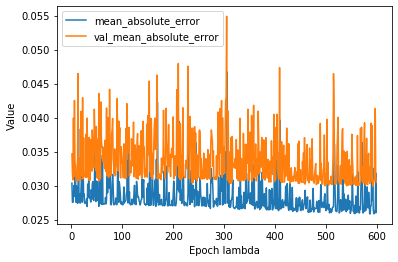

In [204]:
list_of_metrics_to_plot = ['mean_absolute_error',"val_mean_absolute_error"] 
plot_curve(epochs_lambda_best, hist_lambda_best, list_of_metrics_to_plot,"delta")

In [ ]:
best_model_delta.save("saved_Models/lambda_100_best_model_main_max_err_0_03")